In [2]:
import os
# os.environ["CUDA_VISIBLE_DEVICES"]="0"

# from torchsummary import summary
import torch
import time
import numpy as np
import pandas as pd
import random

import nibabel as nib
import scipy.ndimage
import csv
import glob
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torch.utils.data import ConcatDataset
from torchvision import transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, jaccard_score
from scipy.ndimage import label, generate_binary_structure
from scipy.ndimage.measurements import sum as nd_sum
import json
import matplotlib.pyplot as plt
from scipy import stats

# Seeds
seed_value = 42
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

C:\Users\Gromov\AppData\Local\Temp\ipykernel_14956\3583100921.py:27: DeprecationWarning: Please import `sum` from the `scipy.ndimage` namespace; the `scipy.ndimage.measurements` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.measurements import sum as nd_sum


cuda


In [ ]:
#Подключабсь к своему Google Drive
from google.colab import drive
drive.mount('/content/drive')

In [3]:
# Укажите путь до Task07_Pancreas
# '/data/pancreatic_cancer/MSD/Task07_Pancreas_conv/'
# '/home/gromov/Рабочий стол/Code/Task07_Pancreas/'
# 'C:/Users/Gromov/Desktop/Code/Task07_Pancreas/'
# '/content/drive/MyDrive/Task07_Pancreas/Task07_Pancreas/'
folder = 'C:/Users/Gromov/Desktop/Code/Task07_Pancreas/'
imagesTr = folder + 'imagesTr/'
labelsTr = folder + 'labelsTr/'

In [4]:
def get_file_paths(data):
    file_paths = []
    for root, directories, files in os.walk(data):
        for filename in files:
            file_paths.append(os.path.join(root, filename))
    return file_paths
ct_paths = sorted(get_file_paths(imagesTr))
label_paths = sorted(get_file_paths(labelsTr))
print(f'ct_paths len: {len(ct_paths)}')
print(f'label_paths len: {len(label_paths)}')
# for file_path in  label_paths:
#     print(file_path)
for i in range(len(ct_paths)):
    if ct_paths[i][-20:-7] != label_paths[i][-20:-7]:
        print(f'Ass in {ct_paths[i][-20:-7]}')

ct_paths len: 232
label_paths len: 232


In [25]:
def filter_paths(paths):
    # exclude_substrings = ['_008.nii.gz', '_024.nii.gz', '_040.nii.gz', '_056.nii.gz', '_072.nii.gz', '_088.nii.gz']
    exclude_substrings = ['_A.nii.gz', '_R.nii.gz', '_B.nii.gz', '_C.nii.gz', '_G.nii.gz', '_AB.nii.gz', '_RB.nii.gz', '_AC.nii.gz', '_RC.nii.gz', '_AG.nii.gz', '_RG.nii.gz', '_001.nii.gz', '_004.nii.gz', '_005.nii.gz', '_006.nii.gz', '_012.nii.gz', '_015.nii.gz', '_016.nii.gz', '_018.nii.gz', '_019.nii.gz', '_021.nii.gz', '_024.nii.gz', '_025.nii.gz', '_028.nii.gz', '_029.nii.gz', '_032.nii.gz', '_035.nii.gz', '_037.nii.gz', '_041.nii.gz', '_046.nii.gz', '_048.nii.gz', '_049.nii.gz', '_050.nii.gz', '_051.nii.gz', '_052.nii.gz', '_055.nii.gz', '_056.nii.gz', '_061.nii.gz', '_064.nii.gz', '_066.nii.gz', '_067.nii.gz', '_069.nii.gz', '_070.nii.gz', '_071.nii.gz', '_077.nii.gz', '_078.nii.gz', '_080.nii.gz', '_083.nii.gz', '_084.nii.gz', '_088.nii.gz', '_089.nii.gz', '_091.nii.gz', '_094.nii.gz', '_095.nii.gz', '_096.nii.gz', '_098.nii.gz', '_100.nii.gz', '_101.nii.gz', '_102.nii.gz', '_103.nii.gz', '_104.nii.gz', '_107.nii.gz', '_109.nii.gz', '_110.nii.gz', '_113.nii.gz', '_114.nii.gz', '_117.nii.gz', '_119.nii.gz', '_120.nii.gz', '_122.nii.gz', '_124.nii.gz', '_125.nii.gz', '_126.nii.gz', '_127.nii.gz', '_130.nii.gz', '_137.nii.gz', '_138.nii.gz', '_145.nii.gz', '_147.nii.gz', '_149.nii.gz', '_155.nii.gz', '_157.nii.gz', '_159.nii.gz', '_160.nii.gz', '_165.nii.gz', '_166.nii.gz', '_167.nii.gz', '_169.nii.gz', '_170.nii.gz', '_172.nii.gz', '_173.nii.gz', '_175.nii.gz', '_178.nii.gz', '_179.nii.gz', '_180.nii.gz', '_181.nii.gz', '_182.nii.gz', '_183.nii.gz', '_187.nii.gz', '_193.nii.gz', '_194.nii.gz', '_196.nii.gz', '_197.nii.gz', '_198.nii.gz', '_199.nii.gz', '_200.nii.gz', '_201.nii.gz', '_203.nii.gz', '_204.nii.gz', '_207.nii.gz', '_209.nii.gz', '_210.nii.gz', '_211.nii.gz', '_212.nii.gz', '_213.nii.gz', '_214.nii.gz', '_215.nii.gz', '_217.nii.gz', '_218.nii.gz', '_219.nii.gz', '_222.nii.gz', '_224.nii.gz', '_225.nii.gz', '_226.nii.gz', '_227.nii.gz', '_228.nii.gz', '_229.nii.gz', '_230.nii.gz', '_231.nii.gz', '_234.nii.gz', '_235.nii.gz', '_236.nii.gz', '_239.nii.gz', '_241.nii.gz', '_242.nii.gz', '_244.nii.gz', '_246.nii.gz', '_247.nii.gz', '_249.nii.gz', '_253.nii.gz', '_254.nii.gz', '_255.nii.gz', '_256.nii.gz', '_258.nii.gz', '_259.nii.gz', '_261.nii.gz', '_262.nii.gz', '_264.nii.gz', '_265.nii.gz', '_266.nii.gz', '_267.nii.gz', '_268.nii.gz', '_269.nii.gz', '_270.nii.gz', '_274.nii.gz', '_275.nii.gz', '_276.nii.gz', '_277.nii.gz', '_278.nii.gz', '_279.nii.gz', '_280.nii.gz', '_283.nii.gz', '_284.nii.gz', '_285.nii.gz', '_286.nii.gz', '_287.nii.gz', '_289.nii.gz', '_290.nii.gz', '_291.nii.gz', '_292.nii.gz', '_293.nii.gz', '_294.nii.gz', '_295.nii.gz', '_297.nii.gz', '_298.nii.gz', '_299.nii.gz', '_300.nii.gz', '_301.nii.gz', '_302.nii.gz', '_303.nii.gz', '_304.nii.gz', '_305.nii.gz', '_308.nii.gz', '_309.nii.gz', '_310.nii.gz', '_311.nii.gz', '_312.nii.gz', '_313.nii.gz', '_315.nii.gz', '_316.nii.gz', '_318.nii.gz', '_320.nii.gz', '_321.nii.gz', '_323.nii.gz', '_325.nii.gz', '_326.nii.gz', '_327.nii.gz', '_328.nii.gz', '_329.nii.gz', '_330.nii.gz', '_331.nii.gz', '_333.nii.gz', '_334.nii.gz', '_336.nii.gz', '_339.nii.gz', '_342.nii.gz', '_343.nii.gz', '_344.nii.gz', '_345.nii.gz', '_346.nii.gz', '_347.nii.gz', '_348.nii.gz', '_350.nii.gz', '_351.nii.gz', '_355.nii.gz', '_364.nii.gz', '_366.nii.gz', '_367.nii.gz', '_369.nii.gz', '_372.nii.gz', '_374.nii.gz', '_375.nii.gz', '_376.nii.gz', '_378.nii.gz', '_379.nii.gz', '_382.nii.gz', '_386.nii.gz', '_389.nii.gz', '_391.nii.gz', '_393.nii.gz', '_395.nii.gz', '_398.nii.gz', '_400.nii.gz', '_401.nii.gz', '_402.nii.gz', '_404.nii.gz', '_405.nii.gz', '_410.nii.gz', '_411.nii.gz', '_412.nii.gz', '_413.nii.gz', '_416.nii.gz', '_421.nii.gz']
    return [path for path in paths if any(exclude_substring in path for exclude_substring in exclude_substrings)]

ct_paths = sorted(filter_paths(ct_paths))
label_paths = sorted(filter_paths(label_paths))
for i in range(len(ct_paths)):
    if ct_paths[i][-20:-7] != label_paths[i][-20:-7]:
        print(f'Ass in {ct_paths[i][-20:-7]}')
print(len(ct_paths))
print(len(label_paths))

2784
2784


In [39]:
indexes = list(range(len(xz)))
random.shuffle(indexes)
split_index = int(0.8 * len(indexes))
train_indexes = indexes[:split_index]
test_indexes = indexes[split_index:]
print(len(train_indexes))
print(len(test_indexes))

185
47


In [6]:
train_indexes = [182, 5, 48, 103, 198, 253, 250, 9, 276, 50, 95, 78, 217, 132, 166, 278, 252, 115, 246, 204, 123, 144, 61, 1, 156, 274, 79, 194, 227, 273, 223, 208, 6, 148, 249, 263, 185, 240, 244, 199, 65, 34, 120, 190, 42, 221, 243, 32, 73, 82, 196, 211, 222, 259, 151, 45, 4, 104, 85, 205, 106, 152, 37, 100, 251, 89, 133, 235, 270, 280, 66, 153, 110, 51, 157, 262, 121, 27, 203, 113, 105, 33, 21, 70, 60, 84, 134, 161, 139, 201, 168, 242, 10, 72, 234, 7, 30, 146, 46, 181, 261, 192, 191, 76, 128, 219, 99, 188, 215, 150, 269, 19, 213, 77, 122, 266, 107, 38, 172, 131, 265, 129, 277, 22, 232, 138, 124, 159, 0, 210, 173, 268, 231, 224, 87, 193, 29, 2, 64, 135, 267, 189, 98, 183, 108, 40, 254, 28, 279, 248, 126, 130, 187, 184, 225, 177, 228, 109, 149, 170, 236, 143, 63, 35, 241, 36, 237, 164, 264, 127, 167, 200, 178, 145, 54, 271, 202, 102, 80, 8, 218, 14, 83, 175, 56, 255, 176, 163, 69, 230, 118, 207, 62, 238, 136, 43, 209, 155, 18, 165, 256, 179, 68, 171, 53, 90, 94, 41, 93, 162, 116, 275, 247, 25, 59, 233, 74, 197, 58, 169, 239, 17, 180, 49]
test_indexes = [147, 92, 220, 226, 158, 160, 212, 75, 141, 20, 96, 31, 137, 117, 186, 11, 206, 67, 154, 88, 257, 91, 24, 97, 23, 26, 86, 195, 245, 55, 39, 260, 174, 272, 81, 3, 142, 229, 112, 214, 101, 13, 258, 119, 111, 47, 15, 16, 216, 44, 52, 71, 114, 125, 140, 12, 57]
ct_paths_train = [ct_paths[i] for i in train_indexes]
label_paths_train = [label_paths[i] for i in train_indexes]
ct_paths_test = [ct_paths[i] for i in test_indexes]
label_paths_test = [label_paths[i] for i in test_indexes]
print("Размер обучающего набора:", len(ct_paths_train))
print("Размер тестового набора:", len(ct_paths_test))
for i in range(len(ct_paths_train)):
    if ct_paths_train[i][-20:-7] != label_paths_train[i][-20:-7]:
        print(f'Ass in {ct_paths_train[i][-20:-7]}')
for i in range(len(ct_paths_test)):
    if ct_paths_test[i][-20:-7] != label_paths_test[i][-20:-7]:
        print(f'Ass in {ct_paths_test[i][-20:-7]}')

Размер обучающего набора: 224
Размер тестового набора: 57


In [24]:
exclude_values = [i[-23:-7] for i in ct_paths_test]
print(exclude_values)
ct_paths_train = [path for path in ct_paths_train if path[-23:-11] not in exclude_values]
label_paths_train = [path for path in label_paths_train if path[-23:-11] not in exclude_values]
print(len(ct_paths_train))
print(len(label_paths_train))

['/pancreas_19', '/pancreas_31', '/pancreas_17', 'r/pancreas_2', 'sTr/pancreas', '/pancreas_19', '/pancreas_16', 'r/pancreas_2', 'r/pancreas_3', 'r/pancreas_1', '/pancreas_18', 'r/pancreas_2', '/pancreas_28', '/pancreas_33', '/pancreas_38', '/pancreas_13', 'r/pancreas_2', 'r/pancreas_3', 'r/pancreas_0', '/pancreas_17', '/pancreas_35', '/pancreas_20', '/pancreas_27', 'r/pancreas_0', '/pancreas_21', '/pancreas_29', '/pancreas_30', '/pancreas_40', 'r/pancreas_3', 'r/pancreas_2', '/pancreas_20', '/pancreas_23', 'r/pancreas_1', 'r/pancreas_3', 'sTr/pancreas', 'r/pancreas_0', 'r/pancreas_2', 'r/pancreas_1', 'sTr/pancreas', 'r/pancreas_2', '/pancreas_40', 'r/pancreas_2', '/pancreas_28', 'r/pancreas_0', 'r/pancreas_1', '/pancreas_32', '/pancreas_29', 'r/pancreas_4', 'r/pancreas_2', '/pancreas_32', 'r/pancreas_3', 'r/pancreas_2', 'r/pancreas_3', '/pancreas_28', '/pancreas_35', 'r/pancreas_3', 'r/pancreas_1', 'sTr/pancreas', 'r/pancreas_1', 'r/pancreas_3', 'r/pancreas_3', '/pancreas_19', '/pancr

In [4]:
ct_paths_train = ['pancreas_001_000.nii.gz', 'pancreas_001_016.nii.gz', 'pancreas_001_032.nii.gz', 'pancreas_004_016.nii.gz', 'pancreas_004_032.nii.gz', 'pancreas_005_016.nii.gz', 'pancreas_012_000.nii.gz', 'pancreas_012_016.nii.gz', 'pancreas_016_000.nii.gz', 'pancreas_016_016.nii.gz', 'pancreas_018_000.nii.gz', 'pancreas_018_016.nii.gz', 'pancreas_019_000.nii.gz', 'pancreas_019_016.nii.gz', 'pancreas_024_000.nii.gz', 'pancreas_024_016.nii.gz', 'pancreas_028_000.nii.gz', 'pancreas_029_000.nii.gz', 'pancreas_029_016.nii.gz', 'pancreas_032_000.nii.gz', 'pancreas_032_016.nii.gz', 'pancreas_035_000.nii.gz', 'pancreas_037_000.nii.gz', 'pancreas_048_016.nii.gz', 'pancreas_048_032.nii.gz', 'pancreas_049_000.nii.gz', 'pancreas_049_016.nii.gz', 'pancreas_051_016.nii.gz', 'pancreas_051_032.nii.gz', 'pancreas_052_000.nii.gz', 'pancreas_052_016.nii.gz', 'pancreas_055_000.nii.gz', 'pancreas_055_016.nii.gz', 'pancreas_058_016.nii.gz', 'pancreas_064_000.nii.gz', 'pancreas_064_016.nii.gz', 'pancreas_066_016.nii.gz', 'pancreas_066_032.nii.gz', 'pancreas_069_016.nii.gz', 'pancreas_069_032.nii.gz', 'pancreas_071_000.nii.gz', 'pancreas_071_016.nii.gz', 'pancreas_077_000.nii.gz', 'pancreas_080_000.nii.gz', 'pancreas_080_016.nii.gz', 'pancreas_083_000.nii.gz', 'pancreas_083_016.nii.gz', 'pancreas_087_000.nii.gz', 'pancreas_089_000.nii.gz', 'pancreas_089_016.nii.gz', 'pancreas_091_000.nii.gz', 'pancreas_092_016.nii.gz', 'pancreas_093_032.nii.gz', 'pancreas_094_000.nii.gz', 'pancreas_096_000.nii.gz', 'pancreas_096_016.nii.gz', 'pancreas_096_032.nii.gz', 'pancreas_100_016.nii.gz', 'pancreas_100_032.nii.gz', 'pancreas_101_016.nii.gz', 'pancreas_101_032.nii.gz', 'pancreas_102_000.nii.gz', 'pancreas_102_016.nii.gz', 'pancreas_103_000.nii.gz', 'pancreas_103_016.nii.gz', 'pancreas_104_000.nii.gz', 'pancreas_104_016.nii.gz', 'pancreas_105_016.nii.gz', 'pancreas_105_032.nii.gz', 'pancreas_107_000.nii.gz', 'pancreas_107_016.nii.gz', 'pancreas_107_032.nii.gz', 'pancreas_109_000.nii.gz', 'pancreas_109_016.nii.gz', 'pancreas_109_032.nii.gz', 'pancreas_110_000.nii.gz', 'pancreas_110_016.nii.gz', 'pancreas_113_016.nii.gz', 'pancreas_113_032.nii.gz', 'pancreas_114_016.nii.gz', 'pancreas_114_032.nii.gz', 'pancreas_117_048.nii.gz', 'pancreas_117_064.nii.gz', 'pancreas_122_000.nii.gz', 'pancreas_122_016.nii.gz', 'pancreas_126_000.nii.gz', 'pancreas_127_016.nii.gz', 'pancreas_127_032.nii.gz', 'pancreas_130_048.nii.gz', 'pancreas_130_064.nii.gz', 'pancreas_137_000.nii.gz', 'pancreas_137_016.nii.gz', 'pancreas_138_000.nii.gz', 'pancreas_138_016.nii.gz', 'pancreas_147_000.nii.gz', 'pancreas_147_016.nii.gz', 'pancreas_157_000.nii.gz', 'pancreas_158_000.nii.gz', 'pancreas_159_000.nii.gz', 'pancreas_160_000.nii.gz', 'pancreas_165_000.nii.gz', 'pancreas_165_016.nii.gz', 'pancreas_166_000.nii.gz', 'pancreas_166_016.nii.gz', 'pancreas_167_000.nii.gz', 'pancreas_167_016.nii.gz', 'pancreas_169_000.nii.gz', 'pancreas_170_016.nii.gz', 'pancreas_172_016.nii.gz', 'pancreas_175_000.nii.gz', 'pancreas_180_000.nii.gz', 'pancreas_180_016.nii.gz', 'pancreas_181_000.nii.gz', 'pancreas_181_016.nii.gz', 'pancreas_182_000.nii.gz', 'pancreas_183_000.nii.gz', 'pancreas_187_000.nii.gz', 'pancreas_187_016.nii.gz', 'pancreas_193_016.nii.gz', 'pancreas_193_032.nii.gz', 'pancreas_196_000.nii.gz', 'pancreas_197_000.nii.gz', 'pancreas_198_016.nii.gz', 'pancreas_198_032.nii.gz', 'pancreas_200_000.nii.gz', 'pancreas_201_000.nii.gz', 'pancreas_203_016.nii.gz', 'pancreas_203_032.nii.gz', 'pancreas_204_000.nii.gz', 'pancreas_207_000.nii.gz', 'pancreas_207_016.nii.gz', 'pancreas_209_016.nii.gz', 'pancreas_210_000.nii.gz', 'pancreas_210_016.nii.gz', 'pancreas_211_016.nii.gz', 'pancreas_211_032.nii.gz', 'pancreas_215_000.nii.gz', 'pancreas_215_016.nii.gz', 'pancreas_219_096.nii.gz', 'pancreas_219_104.nii.gz', 'pancreas_219_112.nii.gz', 'pancreas_225_000.nii.gz', 'pancreas_226_000.nii.gz', 'pancreas_226_016.nii.gz', 'pancreas_227_000.nii.gz', 'pancreas_227_016.nii.gz', 'pancreas_229_000.nii.gz', 'pancreas_234_000.nii.gz', 'pancreas_234_016.nii.gz', 'pancreas_235_000.nii.gz', 'pancreas_236_000.nii.gz', 'pancreas_236_016.nii.gz', 'pancreas_239_000.nii.gz', 'pancreas_239_016.nii.gz', 'pancreas_241_000.nii.gz', 'pancreas_241_016.nii.gz', 'pancreas_242_000.nii.gz', 'pancreas_242_016.nii.gz', 'pancreas_244_016.nii.gz', 'pancreas_246_016.nii.gz', 'pancreas_246_032.nii.gz', 'pancreas_247_016.nii.gz', 'pancreas_253_000.nii.gz', 'pancreas_253_016.nii.gz', 'pancreas_254_000.nii.gz', 'pancreas_254_016.nii.gz', 'pancreas_258_000.nii.gz', 'pancreas_261_032.nii.gz', 'pancreas_261_048.nii.gz', 'pancreas_262_000.nii.gz', 'pancreas_265_000.nii.gz', 'pancreas_265_016.nii.gz', 'pancreas_267_000.nii.gz', 'pancreas_267_016.nii.gz', 'pancreas_268_000.nii.gz', 'pancreas_269_016.nii.gz', 'pancreas_270_000.nii.gz', 'pancreas_274_032.nii.gz', 'pancreas_275_000.nii.gz', 'pancreas_275_016.nii.gz', 'pancreas_275_032.nii.gz', 'pancreas_276_000.nii.gz', 'pancreas_276_016.nii.gz', 'pancreas_277_000.nii.gz', 'pancreas_277_016.nii.gz', 'pancreas_278_016.nii.gz', 'pancreas_278_032.nii.gz', 'pancreas_279_000.nii.gz', 'pancreas_279_016.nii.gz', 'pancreas_280_000.nii.gz', 'pancreas_280_016.nii.gz', 'pancreas_283_016.nii.gz', 'pancreas_283_032.nii.gz', 'pancreas_286_016.nii.gz', 'pancreas_287_000.nii.gz', 'pancreas_287_016.nii.gz', 'pancreas_289_000.nii.gz', 'pancreas_289_016.nii.gz', 'pancreas_289_032.nii.gz', 'pancreas_292_000.nii.gz', 'pancreas_292_016.nii.gz', 'pancreas_293_000.nii.gz', 'pancreas_293_016.nii.gz', 'pancreas_294_016.nii.gz', 'pancreas_294_032.nii.gz', 'pancreas_295_000.nii.gz', 'pancreas_295_016.nii.gz', 'pancreas_295_032.nii.gz', 'pancreas_297_000.nii.gz', 'pancreas_297_016.nii.gz', 'pancreas_299_000.nii.gz', 'pancreas_299_016.nii.gz', 'pancreas_300_000.nii.gz', 'pancreas_300_016.nii.gz', 'pancreas_301_000.nii.gz', 'pancreas_301_016.nii.gz', 'pancreas_302_000.nii.gz', 'pancreas_303_016.nii.gz', 'pancreas_303_032.nii.gz', 'pancreas_304_000.nii.gz', 'pancreas_304_016.nii.gz', 'pancreas_308_016.nii.gz', 'pancreas_308_032.nii.gz', 'pancreas_309_000.nii.gz', 'pancreas_309_016.nii.gz', 'pancreas_311_000.nii.gz', 'pancreas_311_016.nii.gz', 'pancreas_312_000.nii.gz', 'pancreas_313_000.nii.gz', 'pancreas_313_016.nii.gz', 'pancreas_315_000.nii.gz', 'pancreas_315_016.nii.gz', 'pancreas_318_032.nii.gz', 'pancreas_320_000.nii.gz', 'pancreas_320_016.nii.gz', 'pancreas_326_000.nii.gz', 'pancreas_326_016.nii.gz', 'pancreas_327_000.nii.gz', 'pancreas_327_016.nii.gz', 'pancreas_328_000.nii.gz', 'pancreas_328_016.nii.gz', 'pancreas_329_000.nii.gz', 'pancreas_334_000.nii.gz', 'pancreas_334_016.nii.gz', 'pancreas_336_000.nii.gz', 'pancreas_339_000.nii.gz', 'pancreas_339_016.nii.gz', 'pancreas_342_016.nii.gz', 'pancreas_343_000.nii.gz', 'pancreas_344_016.nii.gz', 'pancreas_345_000.nii.gz', 'pancreas_345_016.nii.gz', 'pancreas_347_000.nii.gz', 'pancreas_347_016.nii.gz', 'pancreas_348_000.nii.gz', 'pancreas_348_016.nii.gz', 'pancreas_350_000.nii.gz', 'pancreas_350_016.nii.gz', 'pancreas_351_000.nii.gz', 'pancreas_351_016.nii.gz', 'pancreas_354_016.nii.gz', 'pancreas_356_016.nii.gz', 'pancreas_358_016.nii.gz', 'pancreas_361_000.nii.gz', 'pancreas_364_000.nii.gz', 'pancreas_364_016.nii.gz', 'pancreas_365_016.nii.gz', 'pancreas_366_016.nii.gz', 'pancreas_367_000.nii.gz', 'pancreas_367_016.nii.gz', 'pancreas_369_000.nii.gz', 'pancreas_369_016.nii.gz', 'pancreas_375_000.nii.gz', 'pancreas_375_016.nii.gz', 'pancreas_376_016.nii.gz', 'pancreas_376_032.nii.gz', 'pancreas_378_000.nii.gz', 'pancreas_378_016.nii.gz', 'pancreas_379_248.nii.gz', 'pancreas_382_000.nii.gz', 'pancreas_382_016.nii.gz', 'pancreas_391_016.nii.gz', 'pancreas_393_016.nii.gz', 'pancreas_393_032.nii.gz', 'pancreas_395_064.nii.gz', 'pancreas_400_016.nii.gz', 'pancreas_400_032.nii.gz', 'pancreas_405_000.nii.gz', 'pancreas_405_016.nii.gz', 'pancreas_410_000.nii.gz', 'pancreas_410_016.nii.gz', 'pancreas_410_032.nii.gz', 'pancreas_411_016.nii.gz', 'pancreas_411_032.nii.gz', 'pancreas_416_032.nii.gz', 'pancreas_416_048.nii.gz']
label_paths_train = ['pancreas_001_000.nii.gz', 'pancreas_001_016.nii.gz', 'pancreas_001_032.nii.gz', 'pancreas_004_016.nii.gz', 'pancreas_004_032.nii.gz', 'pancreas_005_016.nii.gz', 'pancreas_012_000.nii.gz', 'pancreas_012_016.nii.gz', 'pancreas_016_000.nii.gz', 'pancreas_016_016.nii.gz', 'pancreas_018_000.nii.gz', 'pancreas_018_016.nii.gz', 'pancreas_019_000.nii.gz', 'pancreas_019_016.nii.gz', 'pancreas_024_000.nii.gz', 'pancreas_024_016.nii.gz', 'pancreas_028_000.nii.gz', 'pancreas_029_000.nii.gz', 'pancreas_029_016.nii.gz', 'pancreas_032_000.nii.gz', 'pancreas_032_016.nii.gz', 'pancreas_035_000.nii.gz', 'pancreas_037_000.nii.gz', 'pancreas_048_016.nii.gz', 'pancreas_048_032.nii.gz', 'pancreas_049_000.nii.gz', 'pancreas_049_016.nii.gz', 'pancreas_051_016.nii.gz', 'pancreas_051_032.nii.gz', 'pancreas_052_000.nii.gz', 'pancreas_052_016.nii.gz', 'pancreas_055_000.nii.gz', 'pancreas_055_016.nii.gz', 'pancreas_058_016.nii.gz', 'pancreas_064_000.nii.gz', 'pancreas_064_016.nii.gz', 'pancreas_066_016.nii.gz', 'pancreas_066_032.nii.gz', 'pancreas_069_016.nii.gz', 'pancreas_069_032.nii.gz', 'pancreas_071_000.nii.gz', 'pancreas_071_016.nii.gz', 'pancreas_077_000.nii.gz', 'pancreas_080_000.nii.gz', 'pancreas_080_016.nii.gz', 'pancreas_083_000.nii.gz', 'pancreas_083_016.nii.gz', 'pancreas_087_000.nii.gz', 'pancreas_089_000.nii.gz', 'pancreas_089_016.nii.gz', 'pancreas_091_000.nii.gz', 'pancreas_092_016.nii.gz', 'pancreas_093_032.nii.gz', 'pancreas_094_000.nii.gz', 'pancreas_096_000.nii.gz', 'pancreas_096_016.nii.gz', 'pancreas_096_032.nii.gz', 'pancreas_100_016.nii.gz', 'pancreas_100_032.nii.gz', 'pancreas_101_016.nii.gz', 'pancreas_101_032.nii.gz', 'pancreas_102_000.nii.gz', 'pancreas_102_016.nii.gz', 'pancreas_103_000.nii.gz', 'pancreas_103_016.nii.gz', 'pancreas_104_000.nii.gz', 'pancreas_104_016.nii.gz', 'pancreas_105_016.nii.gz', 'pancreas_105_032.nii.gz', 'pancreas_107_000.nii.gz', 'pancreas_107_016.nii.gz', 'pancreas_107_032.nii.gz', 'pancreas_109_000.nii.gz', 'pancreas_109_016.nii.gz', 'pancreas_109_032.nii.gz', 'pancreas_110_000.nii.gz', 'pancreas_110_016.nii.gz', 'pancreas_113_016.nii.gz', 'pancreas_113_032.nii.gz', 'pancreas_114_016.nii.gz', 'pancreas_114_032.nii.gz', 'pancreas_117_048.nii.gz', 'pancreas_117_064.nii.gz', 'pancreas_122_000.nii.gz', 'pancreas_122_016.nii.gz', 'pancreas_126_000.nii.gz', 'pancreas_127_016.nii.gz', 'pancreas_127_032.nii.gz', 'pancreas_130_048.nii.gz', 'pancreas_130_064.nii.gz', 'pancreas_137_000.nii.gz', 'pancreas_137_016.nii.gz', 'pancreas_138_000.nii.gz', 'pancreas_138_016.nii.gz', 'pancreas_147_000.nii.gz', 'pancreas_147_016.nii.gz', 'pancreas_157_000.nii.gz', 'pancreas_158_000.nii.gz', 'pancreas_159_000.nii.gz', 'pancreas_160_000.nii.gz', 'pancreas_165_000.nii.gz', 'pancreas_165_016.nii.gz', 'pancreas_166_000.nii.gz', 'pancreas_166_016.nii.gz', 'pancreas_167_000.nii.gz', 'pancreas_167_016.nii.gz', 'pancreas_169_000.nii.gz', 'pancreas_170_016.nii.gz', 'pancreas_172_016.nii.gz', 'pancreas_175_000.nii.gz', 'pancreas_180_000.nii.gz', 'pancreas_180_016.nii.gz', 'pancreas_181_000.nii.gz', 'pancreas_181_016.nii.gz', 'pancreas_182_000.nii.gz', 'pancreas_183_000.nii.gz', 'pancreas_187_000.nii.gz', 'pancreas_187_016.nii.gz', 'pancreas_193_016.nii.gz', 'pancreas_193_032.nii.gz', 'pancreas_196_000.nii.gz', 'pancreas_197_000.nii.gz', 'pancreas_198_016.nii.gz', 'pancreas_198_032.nii.gz', 'pancreas_200_000.nii.gz', 'pancreas_201_000.nii.gz', 'pancreas_203_016.nii.gz', 'pancreas_203_032.nii.gz', 'pancreas_204_000.nii.gz', 'pancreas_207_000.nii.gz', 'pancreas_207_016.nii.gz', 'pancreas_209_016.nii.gz', 'pancreas_210_000.nii.gz', 'pancreas_210_016.nii.gz', 'pancreas_211_016.nii.gz', 'pancreas_211_032.nii.gz', 'pancreas_215_000.nii.gz', 'pancreas_215_016.nii.gz', 'pancreas_219_096.nii.gz', 'pancreas_219_104.nii.gz', 'pancreas_219_112.nii.gz', 'pancreas_225_000.nii.gz', 'pancreas_226_000.nii.gz', 'pancreas_226_016.nii.gz', 'pancreas_227_000.nii.gz', 'pancreas_227_016.nii.gz', 'pancreas_229_000.nii.gz', 'pancreas_234_000.nii.gz', 'pancreas_234_016.nii.gz', 'pancreas_235_000.nii.gz', 'pancreas_236_000.nii.gz', 'pancreas_236_016.nii.gz', 'pancreas_239_000.nii.gz', 'pancreas_239_016.nii.gz', 'pancreas_241_000.nii.gz', 'pancreas_241_016.nii.gz', 'pancreas_242_000.nii.gz', 'pancreas_242_016.nii.gz', 'pancreas_244_016.nii.gz', 'pancreas_246_016.nii.gz', 'pancreas_246_032.nii.gz', 'pancreas_247_016.nii.gz', 'pancreas_253_000.nii.gz', 'pancreas_253_016.nii.gz', 'pancreas_254_000.nii.gz', 'pancreas_254_016.nii.gz', 'pancreas_258_000.nii.gz', 'pancreas_261_032.nii.gz', 'pancreas_261_048.nii.gz', 'pancreas_262_000.nii.gz', 'pancreas_265_000.nii.gz', 'pancreas_265_016.nii.gz', 'pancreas_267_000.nii.gz', 'pancreas_267_016.nii.gz', 'pancreas_268_000.nii.gz', 'pancreas_269_016.nii.gz', 'pancreas_270_000.nii.gz', 'pancreas_274_032.nii.gz', 'pancreas_275_000.nii.gz', 'pancreas_275_016.nii.gz', 'pancreas_275_032.nii.gz', 'pancreas_276_000.nii.gz', 'pancreas_276_016.nii.gz', 'pancreas_277_000.nii.gz', 'pancreas_277_016.nii.gz', 'pancreas_278_016.nii.gz', 'pancreas_278_032.nii.gz', 'pancreas_279_000.nii.gz', 'pancreas_279_016.nii.gz', 'pancreas_280_000.nii.gz', 'pancreas_280_016.nii.gz', 'pancreas_283_016.nii.gz', 'pancreas_283_032.nii.gz', 'pancreas_286_016.nii.gz', 'pancreas_287_000.nii.gz', 'pancreas_287_016.nii.gz', 'pancreas_289_000.nii.gz', 'pancreas_289_016.nii.gz', 'pancreas_289_032.nii.gz', 'pancreas_292_000.nii.gz', 'pancreas_292_016.nii.gz', 'pancreas_293_000.nii.gz', 'pancreas_293_016.nii.gz', 'pancreas_294_016.nii.gz', 'pancreas_294_032.nii.gz', 'pancreas_295_000.nii.gz', 'pancreas_295_016.nii.gz', 'pancreas_295_032.nii.gz', 'pancreas_297_000.nii.gz', 'pancreas_297_016.nii.gz', 'pancreas_299_000.nii.gz', 'pancreas_299_016.nii.gz', 'pancreas_300_000.nii.gz', 'pancreas_300_016.nii.gz', 'pancreas_301_000.nii.gz', 'pancreas_301_016.nii.gz', 'pancreas_302_000.nii.gz', 'pancreas_303_016.nii.gz', 'pancreas_303_032.nii.gz', 'pancreas_304_000.nii.gz', 'pancreas_304_016.nii.gz', 'pancreas_308_016.nii.gz', 'pancreas_308_032.nii.gz', 'pancreas_309_000.nii.gz', 'pancreas_309_016.nii.gz', 'pancreas_311_000.nii.gz', 'pancreas_311_016.nii.gz', 'pancreas_312_000.nii.gz', 'pancreas_313_000.nii.gz', 'pancreas_313_016.nii.gz', 'pancreas_315_000.nii.gz', 'pancreas_315_016.nii.gz', 'pancreas_318_032.nii.gz', 'pancreas_320_000.nii.gz', 'pancreas_320_016.nii.gz', 'pancreas_326_000.nii.gz', 'pancreas_326_016.nii.gz', 'pancreas_327_000.nii.gz', 'pancreas_327_016.nii.gz', 'pancreas_328_000.nii.gz', 'pancreas_328_016.nii.gz', 'pancreas_329_000.nii.gz', 'pancreas_334_000.nii.gz', 'pancreas_334_016.nii.gz', 'pancreas_336_000.nii.gz', 'pancreas_339_000.nii.gz', 'pancreas_339_016.nii.gz', 'pancreas_342_016.nii.gz', 'pancreas_343_000.nii.gz', 'pancreas_344_016.nii.gz', 'pancreas_345_000.nii.gz', 'pancreas_345_016.nii.gz', 'pancreas_347_000.nii.gz', 'pancreas_347_016.nii.gz', 'pancreas_348_000.nii.gz', 'pancreas_348_016.nii.gz', 'pancreas_350_000.nii.gz', 'pancreas_350_016.nii.gz', 'pancreas_351_000.nii.gz', 'pancreas_351_016.nii.gz', 'pancreas_354_016.nii.gz', 'pancreas_356_016.nii.gz', 'pancreas_358_016.nii.gz', 'pancreas_361_000.nii.gz', 'pancreas_364_000.nii.gz', 'pancreas_364_016.nii.gz', 'pancreas_365_016.nii.gz', 'pancreas_366_016.nii.gz', 'pancreas_367_000.nii.gz', 'pancreas_367_016.nii.gz', 'pancreas_369_000.nii.gz', 'pancreas_369_016.nii.gz', 'pancreas_375_000.nii.gz', 'pancreas_375_016.nii.gz', 'pancreas_376_016.nii.gz', 'pancreas_376_032.nii.gz', 'pancreas_378_000.nii.gz', 'pancreas_378_016.nii.gz', 'pancreas_379_248.nii.gz', 'pancreas_382_000.nii.gz', 'pancreas_382_016.nii.gz', 'pancreas_391_016.nii.gz', 'pancreas_393_016.nii.gz', 'pancreas_393_032.nii.gz', 'pancreas_395_064.nii.gz', 'pancreas_400_016.nii.gz', 'pancreas_400_032.nii.gz', 'pancreas_405_000.nii.gz', 'pancreas_405_016.nii.gz', 'pancreas_410_000.nii.gz', 'pancreas_410_016.nii.gz', 'pancreas_410_032.nii.gz', 'pancreas_411_016.nii.gz', 'pancreas_411_032.nii.gz', 'pancreas_416_032.nii.gz', 'pancreas_416_048.nii.gz']
ct_paths_test = ['pancreas_006_016.nii.gz', 'pancreas_015_016.nii.gz', 'pancreas_021_000.nii.gz', 'pancreas_025_000.nii.gz', 'pancreas_046_016.nii.gz', 'pancreas_050_016.nii.gz', 'pancreas_056_016.nii.gz', 'pancreas_061_016.nii.gz', 'pancreas_067_016.nii.gz', 'pancreas_070_016.nii.gz', 'pancreas_070_032.nii.gz', 'pancreas_078_000.nii.gz', 'pancreas_084_016.nii.gz', 'pancreas_088_016.nii.gz', 'pancreas_088_032.nii.gz', 'pancreas_095_000.nii.gz', 'pancreas_098_032.nii.gz', 'pancreas_119_016.nii.gz', 'pancreas_120_032.nii.gz', 'pancreas_124_016.nii.gz', 'pancreas_125_000.nii.gz', 'pancreas_145_000.nii.gz', 'pancreas_149_000.nii.gz', 'pancreas_155_000.nii.gz', 'pancreas_173_016.nii.gz', 'pancreas_178_032.nii.gz', 'pancreas_179_000.nii.gz', 'pancreas_194_016.nii.gz', 'pancreas_199_016.nii.gz', 'pancreas_212_032.nii.gz', 'pancreas_213_000.nii.gz', 'pancreas_213_016.nii.gz', 'pancreas_214_016.nii.gz', 'pancreas_217_016.nii.gz', 'pancreas_218_016.nii.gz', 'pancreas_222_000.nii.gz', 'pancreas_224_016.nii.gz', 'pancreas_228_016.nii.gz', 'pancreas_230_000.nii.gz', 'pancreas_231_000.nii.gz', 'pancreas_249_032.nii.gz', 'pancreas_255_000.nii.gz', 'pancreas_256_000.nii.gz', 'pancreas_259_000.nii.gz', 'pancreas_264_016.nii.gz', 'pancreas_266_032.nii.gz', 'pancreas_284_000.nii.gz', 'pancreas_284_016.nii.gz', 'pancreas_285_016.nii.gz', 'pancreas_290_016.nii.gz', 'pancreas_291_016.nii.gz', 'pancreas_298_000.nii.gz', 'pancreas_298_016.nii.gz', 'pancreas_305_000.nii.gz', 'pancreas_310_000.nii.gz', 'pancreas_316_000.nii.gz', 'pancreas_316_016.nii.gz', 'pancreas_321_032.nii.gz', 'pancreas_323_000.nii.gz', 'pancreas_325_016.nii.gz', 'pancreas_330_016.nii.gz', 'pancreas_331_000.nii.gz', 'pancreas_331_016.nii.gz', 'pancreas_333_000.nii.gz', 'pancreas_346_016.nii.gz', 'pancreas_355_016.nii.gz', 'pancreas_370_016.nii.gz', 'pancreas_372_000.nii.gz', 'pancreas_374_048.nii.gz', 'pancreas_386_000.nii.gz', 'pancreas_389_016.nii.gz', 'pancreas_398_000.nii.gz', 'pancreas_401_048.nii.gz', 'pancreas_402_048.nii.gz', 'pancreas_402_064.nii.gz', 'pancreas_404_000.nii.gz', 'pancreas_412_080.nii.gz', 'pancreas_413_016.nii.gz']
label_paths_test = ['pancreas_006_016.nii.gz', 'pancreas_015_016.nii.gz', 'pancreas_021_000.nii.gz', 'pancreas_025_000.nii.gz', 'pancreas_046_016.nii.gz', 'pancreas_050_016.nii.gz', 'pancreas_056_016.nii.gz', 'pancreas_061_016.nii.gz', 'pancreas_067_016.nii.gz', 'pancreas_070_016.nii.gz', 'pancreas_070_032.nii.gz', 'pancreas_078_000.nii.gz', 'pancreas_084_016.nii.gz', 'pancreas_088_016.nii.gz', 'pancreas_088_032.nii.gz', 'pancreas_095_000.nii.gz', 'pancreas_098_032.nii.gz', 'pancreas_119_016.nii.gz', 'pancreas_120_032.nii.gz', 'pancreas_124_016.nii.gz', 'pancreas_125_000.nii.gz', 'pancreas_145_000.nii.gz', 'pancreas_149_000.nii.gz', 'pancreas_155_000.nii.gz', 'pancreas_173_016.nii.gz', 'pancreas_178_032.nii.gz', 'pancreas_179_000.nii.gz', 'pancreas_194_016.nii.gz', 'pancreas_199_016.nii.gz', 'pancreas_212_032.nii.gz', 'pancreas_213_000.nii.gz', 'pancreas_213_016.nii.gz', 'pancreas_214_016.nii.gz', 'pancreas_217_016.nii.gz', 'pancreas_218_016.nii.gz', 'pancreas_222_000.nii.gz', 'pancreas_224_016.nii.gz', 'pancreas_228_016.nii.gz', 'pancreas_230_000.nii.gz', 'pancreas_231_000.nii.gz', 'pancreas_249_032.nii.gz', 'pancreas_255_000.nii.gz', 'pancreas_256_000.nii.gz', 'pancreas_259_000.nii.gz', 'pancreas_264_016.nii.gz', 'pancreas_266_032.nii.gz', 'pancreas_284_000.nii.gz', 'pancreas_284_016.nii.gz', 'pancreas_285_016.nii.gz', 'pancreas_290_016.nii.gz', 'pancreas_291_016.nii.gz', 'pancreas_298_000.nii.gz', 'pancreas_298_016.nii.gz', 'pancreas_305_000.nii.gz', 'pancreas_310_000.nii.gz', 'pancreas_316_000.nii.gz', 'pancreas_316_016.nii.gz', 'pancreas_321_032.nii.gz', 'pancreas_323_000.nii.gz', 'pancreas_325_016.nii.gz', 'pancreas_330_016.nii.gz', 'pancreas_331_000.nii.gz', 'pancreas_331_016.nii.gz', 'pancreas_333_000.nii.gz', 'pancreas_346_016.nii.gz', 'pancreas_355_016.nii.gz', 'pancreas_370_016.nii.gz', 'pancreas_372_000.nii.gz', 'pancreas_374_048.nii.gz', 'pancreas_386_000.nii.gz', 'pancreas_389_016.nii.gz', 'pancreas_398_000.nii.gz', 'pancreas_401_048.nii.gz', 'pancreas_402_048.nii.gz', 'pancreas_402_064.nii.gz', 'pancreas_404_000.nii.gz', 'pancreas_412_080.nii.gz', 'pancreas_413_016.nii.gz']
ct_paths_train = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/imagesTr/' + i  for i in ct_paths_train]
label_paths_train = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/labelsTr/' + i  for i in label_paths_train]
ct_paths_test = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/imagesTr/' + i  for i in ct_paths_test]
label_paths_test = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/labelsTr/' + i  for i in label_paths_test]
print("Размер обучающего набора:", len(ct_paths_train))
print("Размер тестового набора:", len(ct_paths_test))
for i in range(len(ct_paths_train)):
    if ct_paths_train[i][-20:-7] != label_paths_train[i][-20:-7]:
        print(f'Ass in {ct_paths_train[i][-20:-7]}')
for i in range(len(ct_paths_test)):
    if ct_paths_test[i][-20:-7] != label_paths_test[i][-20:-7]:
        print(f'Ass in {ct_paths_test[i][-20:-7]}')

Размер обучающего набора: 296
Размер тестового набора: 78


In [12]:
ct_paths_test = [i[-23:-11] for i in ct_paths_test]
print(len(ct_paths_test))

# filess_test = []
# for i in range(len(ct_paths_test)):
#     if ct_paths_test[i] not in filess_test:
#         filess_test.append(ct_paths_test[i])
# print(len(filess_test))
print(ct_paths_test[0])


78
pancreas_006


In [13]:
ct_paths_train = [i[-23:-11] for i in ct_paths_train]
print(len(ct_paths_train))

# filess_train = []
# for i in range(len(ct_paths_train)):
#     if ct_paths_train[i] not in filess_train:
#         filess_train.append(ct_paths_train[i])
print(len(ct_paths_train))

296
296


In [14]:
for i in range(len(ct_paths_train)):
    if ct_paths_train[i] in ct_paths_test:
        print('You suck asshole')

In [79]:
filess = sorted(filess_test+filess_train)
print(len(filess))

242


In [19]:
ct_paths = [ct[-23:-7] for ct in ct_paths]
ct_paths[0]

'pancreas_001_000'

In [25]:
val = [path for path in ct_paths if path not in filess_train]
print(len(val))

785


In [55]:
print(val)

['pancreas_010', 'pancreas_040', 'pancreas_041', 'pancreas_042', 'pancreas_043', 'pancreas_045', 'pancreas_074', 'pancreas_075', 'pancreas_081', 'pancreas_086', 'pancreas_099', 'pancreas_106', 'pancreas_111', 'pancreas_129', 'pancreas_131', 'pancreas_135', 'pancreas_140', 'pancreas_148', 'pancreas_186', 'pancreas_191', 'pancreas_243', 'pancreas_296', 'pancreas_357', 'pancreas_360', 'pancreas_362', 'pancreas_377', 'pancreas_380', 'pancreas_385', 'pancreas_387', 'pancreas_388', 'pancreas_392', 'pancreas_399', 'pancreas_406', 'pancreas_409', 'pancreas_414', 'pancreas_415', 'pancreas_418', 'pancreas_419', 'pancreas_421']


In [5]:
#валидация на тестовых файлах

folder = 'C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/'
imagesTr = folder + 'imagesTr/'
labelsTr = folder + 'labelsTr/'

def get_file_paths(data):
    file_paths = []
    for root, directories, files in os.walk(data):
        for filename in files:
            file_paths.append(os.path.join(root, filename))
    return file_paths
ct_paths = sorted(get_file_paths(imagesTr))
label_paths = sorted(get_file_paths(labelsTr))
print(f'ct_paths len: {len(ct_paths)}')
print(f'label_paths len: {len(label_paths)}')
# for file_path in  label_paths:
#     print(file_path)
for i in range(len(ct_paths)):
    if ct_paths[i][-20:-7] != label_paths[i][-20:-7]:
        print(f'Ass in {ct_paths[i][-20:-7]}')

ct_paths_train = ['pancreas_001_000.nii.gz', 'pancreas_001_016.nii.gz', 'pancreas_001_032.nii.gz', 'pancreas_004_016.nii.gz', 'pancreas_004_032.nii.gz', 'pancreas_005_016.nii.gz', 'pancreas_012_000.nii.gz', 'pancreas_012_016.nii.gz', 'pancreas_016_000.nii.gz', 'pancreas_016_016.nii.gz', 'pancreas_018_000.nii.gz', 'pancreas_018_016.nii.gz', 'pancreas_019_000.nii.gz', 'pancreas_019_016.nii.gz', 'pancreas_024_000.nii.gz', 'pancreas_024_016.nii.gz', 'pancreas_028_000.nii.gz', 'pancreas_029_000.nii.gz', 'pancreas_029_016.nii.gz', 'pancreas_032_000.nii.gz', 'pancreas_032_016.nii.gz', 'pancreas_035_000.nii.gz', 'pancreas_037_000.nii.gz', 'pancreas_048_016.nii.gz', 'pancreas_048_032.nii.gz', 'pancreas_049_000.nii.gz', 'pancreas_049_016.nii.gz', 'pancreas_051_016.nii.gz', 'pancreas_051_032.nii.gz', 'pancreas_052_000.nii.gz', 'pancreas_052_016.nii.gz', 'pancreas_055_000.nii.gz', 'pancreas_055_016.nii.gz', 'pancreas_058_016.nii.gz', 'pancreas_064_000.nii.gz', 'pancreas_064_016.nii.gz', 'pancreas_066_016.nii.gz', 'pancreas_066_032.nii.gz', 'pancreas_069_016.nii.gz', 'pancreas_069_032.nii.gz', 'pancreas_071_000.nii.gz', 'pancreas_071_016.nii.gz', 'pancreas_077_000.nii.gz', 'pancreas_080_000.nii.gz', 'pancreas_080_016.nii.gz', 'pancreas_083_000.nii.gz', 'pancreas_083_016.nii.gz', 'pancreas_087_000.nii.gz', 'pancreas_089_000.nii.gz', 'pancreas_089_016.nii.gz', 'pancreas_091_000.nii.gz', 'pancreas_092_016.nii.gz', 'pancreas_093_032.nii.gz', 'pancreas_094_000.nii.gz', 'pancreas_096_000.nii.gz', 'pancreas_096_016.nii.gz', 'pancreas_096_032.nii.gz', 'pancreas_100_016.nii.gz', 'pancreas_100_032.nii.gz', 'pancreas_101_016.nii.gz', 'pancreas_101_032.nii.gz', 'pancreas_102_000.nii.gz', 'pancreas_102_016.nii.gz', 'pancreas_103_000.nii.gz', 'pancreas_103_016.nii.gz', 'pancreas_104_000.nii.gz', 'pancreas_104_016.nii.gz', 'pancreas_105_016.nii.gz', 'pancreas_105_032.nii.gz', 'pancreas_107_000.nii.gz', 'pancreas_107_016.nii.gz', 'pancreas_107_032.nii.gz', 'pancreas_109_000.nii.gz', 'pancreas_109_016.nii.gz', 'pancreas_109_032.nii.gz', 'pancreas_110_000.nii.gz', 'pancreas_110_016.nii.gz', 'pancreas_113_016.nii.gz', 'pancreas_113_032.nii.gz', 'pancreas_114_016.nii.gz', 'pancreas_114_032.nii.gz', 'pancreas_117_048.nii.gz', 'pancreas_117_064.nii.gz', 'pancreas_122_000.nii.gz', 'pancreas_122_016.nii.gz', 'pancreas_126_000.nii.gz', 'pancreas_127_016.nii.gz', 'pancreas_127_032.nii.gz', 'pancreas_130_048.nii.gz', 'pancreas_130_064.nii.gz', 'pancreas_137_000.nii.gz', 'pancreas_137_016.nii.gz', 'pancreas_138_000.nii.gz', 'pancreas_138_016.nii.gz', 'pancreas_147_000.nii.gz', 'pancreas_147_016.nii.gz', 'pancreas_157_000.nii.gz', 'pancreas_158_000.nii.gz', 'pancreas_159_000.nii.gz', 'pancreas_160_000.nii.gz', 'pancreas_165_000.nii.gz', 'pancreas_165_016.nii.gz', 'pancreas_166_000.nii.gz', 'pancreas_166_016.nii.gz', 'pancreas_167_000.nii.gz', 'pancreas_167_016.nii.gz', 'pancreas_169_000.nii.gz', 'pancreas_170_016.nii.gz', 'pancreas_172_016.nii.gz', 'pancreas_175_000.nii.gz', 'pancreas_180_000.nii.gz', 'pancreas_180_016.nii.gz', 'pancreas_181_000.nii.gz', 'pancreas_181_016.nii.gz', 'pancreas_182_000.nii.gz', 'pancreas_183_000.nii.gz', 'pancreas_187_000.nii.gz', 'pancreas_187_016.nii.gz', 'pancreas_193_016.nii.gz', 'pancreas_193_032.nii.gz', 'pancreas_196_000.nii.gz', 'pancreas_197_000.nii.gz', 'pancreas_198_016.nii.gz', 'pancreas_198_032.nii.gz', 'pancreas_200_000.nii.gz', 'pancreas_201_000.nii.gz', 'pancreas_203_016.nii.gz', 'pancreas_203_032.nii.gz', 'pancreas_204_000.nii.gz', 'pancreas_207_000.nii.gz', 'pancreas_207_016.nii.gz', 'pancreas_209_016.nii.gz', 'pancreas_210_000.nii.gz', 'pancreas_210_016.nii.gz', 'pancreas_211_016.nii.gz', 'pancreas_211_032.nii.gz', 'pancreas_215_000.nii.gz', 'pancreas_215_016.nii.gz', 'pancreas_219_096.nii.gz', 'pancreas_219_104.nii.gz', 'pancreas_219_112.nii.gz', 'pancreas_225_000.nii.gz', 'pancreas_226_000.nii.gz', 'pancreas_226_016.nii.gz', 'pancreas_227_000.nii.gz', 'pancreas_227_016.nii.gz', 'pancreas_229_000.nii.gz', 'pancreas_234_000.nii.gz', 'pancreas_234_016.nii.gz', 'pancreas_235_000.nii.gz', 'pancreas_236_000.nii.gz', 'pancreas_236_016.nii.gz', 'pancreas_239_000.nii.gz', 'pancreas_239_016.nii.gz', 'pancreas_241_000.nii.gz', 'pancreas_241_016.nii.gz', 'pancreas_242_000.nii.gz', 'pancreas_242_016.nii.gz', 'pancreas_244_016.nii.gz', 'pancreas_246_016.nii.gz', 'pancreas_246_032.nii.gz', 'pancreas_247_016.nii.gz', 'pancreas_253_000.nii.gz', 'pancreas_253_016.nii.gz', 'pancreas_254_000.nii.gz', 'pancreas_254_016.nii.gz', 'pancreas_258_000.nii.gz', 'pancreas_261_032.nii.gz', 'pancreas_261_048.nii.gz', 'pancreas_262_000.nii.gz', 'pancreas_265_000.nii.gz', 'pancreas_265_016.nii.gz', 'pancreas_267_000.nii.gz', 'pancreas_267_016.nii.gz', 'pancreas_268_000.nii.gz', 'pancreas_269_016.nii.gz', 'pancreas_270_000.nii.gz', 'pancreas_274_032.nii.gz', 'pancreas_275_000.nii.gz', 'pancreas_275_016.nii.gz', 'pancreas_275_032.nii.gz', 'pancreas_276_000.nii.gz', 'pancreas_276_016.nii.gz', 'pancreas_277_000.nii.gz', 'pancreas_277_016.nii.gz', 'pancreas_278_016.nii.gz', 'pancreas_278_032.nii.gz', 'pancreas_279_000.nii.gz', 'pancreas_279_016.nii.gz', 'pancreas_280_000.nii.gz', 'pancreas_280_016.nii.gz', 'pancreas_283_016.nii.gz', 'pancreas_283_032.nii.gz', 'pancreas_286_016.nii.gz', 'pancreas_287_000.nii.gz', 'pancreas_287_016.nii.gz', 'pancreas_289_000.nii.gz', 'pancreas_289_016.nii.gz', 'pancreas_289_032.nii.gz', 'pancreas_292_000.nii.gz', 'pancreas_292_016.nii.gz', 'pancreas_293_000.nii.gz', 'pancreas_293_016.nii.gz', 'pancreas_294_016.nii.gz', 'pancreas_294_032.nii.gz', 'pancreas_295_000.nii.gz', 'pancreas_295_016.nii.gz', 'pancreas_295_032.nii.gz', 'pancreas_297_000.nii.gz', 'pancreas_297_016.nii.gz', 'pancreas_299_000.nii.gz', 'pancreas_299_016.nii.gz', 'pancreas_300_000.nii.gz', 'pancreas_300_016.nii.gz', 'pancreas_301_000.nii.gz', 'pancreas_301_016.nii.gz', 'pancreas_302_000.nii.gz', 'pancreas_303_016.nii.gz', 'pancreas_303_032.nii.gz', 'pancreas_304_000.nii.gz', 'pancreas_304_016.nii.gz', 'pancreas_308_016.nii.gz', 'pancreas_308_032.nii.gz', 'pancreas_309_000.nii.gz', 'pancreas_309_016.nii.gz', 'pancreas_311_000.nii.gz', 'pancreas_311_016.nii.gz', 'pancreas_312_000.nii.gz', 'pancreas_313_000.nii.gz', 'pancreas_313_016.nii.gz', 'pancreas_315_000.nii.gz', 'pancreas_315_016.nii.gz', 'pancreas_318_032.nii.gz', 'pancreas_320_000.nii.gz', 'pancreas_320_016.nii.gz', 'pancreas_326_000.nii.gz', 'pancreas_326_016.nii.gz', 'pancreas_327_000.nii.gz', 'pancreas_327_016.nii.gz', 'pancreas_328_000.nii.gz', 'pancreas_328_016.nii.gz', 'pancreas_329_000.nii.gz', 'pancreas_334_000.nii.gz', 'pancreas_334_016.nii.gz', 'pancreas_336_000.nii.gz', 'pancreas_339_000.nii.gz', 'pancreas_339_016.nii.gz', 'pancreas_342_016.nii.gz', 'pancreas_343_000.nii.gz', 'pancreas_344_016.nii.gz', 'pancreas_345_000.nii.gz', 'pancreas_345_016.nii.gz', 'pancreas_347_000.nii.gz', 'pancreas_347_016.nii.gz', 'pancreas_348_000.nii.gz', 'pancreas_348_016.nii.gz', 'pancreas_350_000.nii.gz', 'pancreas_350_016.nii.gz', 'pancreas_351_000.nii.gz', 'pancreas_351_016.nii.gz', 'pancreas_354_016.nii.gz', 'pancreas_356_016.nii.gz', 'pancreas_358_016.nii.gz', 'pancreas_361_000.nii.gz', 'pancreas_364_000.nii.gz', 'pancreas_364_016.nii.gz', 'pancreas_365_016.nii.gz', 'pancreas_366_016.nii.gz', 'pancreas_367_000.nii.gz', 'pancreas_367_016.nii.gz', 'pancreas_369_000.nii.gz', 'pancreas_369_016.nii.gz', 'pancreas_375_000.nii.gz', 'pancreas_375_016.nii.gz', 'pancreas_376_016.nii.gz', 'pancreas_376_032.nii.gz', 'pancreas_378_000.nii.gz', 'pancreas_378_016.nii.gz', 'pancreas_379_248.nii.gz', 'pancreas_382_000.nii.gz', 'pancreas_382_016.nii.gz', 'pancreas_391_016.nii.gz', 'pancreas_393_016.nii.gz', 'pancreas_393_032.nii.gz', 'pancreas_395_064.nii.gz', 'pancreas_400_016.nii.gz', 'pancreas_400_032.nii.gz', 'pancreas_405_000.nii.gz', 'pancreas_405_016.nii.gz', 'pancreas_410_000.nii.gz', 'pancreas_410_016.nii.gz', 'pancreas_410_032.nii.gz', 'pancreas_411_016.nii.gz', 'pancreas_411_032.nii.gz', 'pancreas_416_032.nii.gz', 'pancreas_416_048.nii.gz']
label_paths_train = ['pancreas_001_000.nii.gz', 'pancreas_001_016.nii.gz', 'pancreas_001_032.nii.gz', 'pancreas_004_016.nii.gz', 'pancreas_004_032.nii.gz', 'pancreas_005_016.nii.gz', 'pancreas_012_000.nii.gz', 'pancreas_012_016.nii.gz', 'pancreas_016_000.nii.gz', 'pancreas_016_016.nii.gz', 'pancreas_018_000.nii.gz', 'pancreas_018_016.nii.gz', 'pancreas_019_000.nii.gz', 'pancreas_019_016.nii.gz', 'pancreas_024_000.nii.gz', 'pancreas_024_016.nii.gz', 'pancreas_028_000.nii.gz', 'pancreas_029_000.nii.gz', 'pancreas_029_016.nii.gz', 'pancreas_032_000.nii.gz', 'pancreas_032_016.nii.gz', 'pancreas_035_000.nii.gz', 'pancreas_037_000.nii.gz', 'pancreas_048_016.nii.gz', 'pancreas_048_032.nii.gz', 'pancreas_049_000.nii.gz', 'pancreas_049_016.nii.gz', 'pancreas_051_016.nii.gz', 'pancreas_051_032.nii.gz', 'pancreas_052_000.nii.gz', 'pancreas_052_016.nii.gz', 'pancreas_055_000.nii.gz', 'pancreas_055_016.nii.gz', 'pancreas_058_016.nii.gz', 'pancreas_064_000.nii.gz', 'pancreas_064_016.nii.gz', 'pancreas_066_016.nii.gz', 'pancreas_066_032.nii.gz', 'pancreas_069_016.nii.gz', 'pancreas_069_032.nii.gz', 'pancreas_071_000.nii.gz', 'pancreas_071_016.nii.gz', 'pancreas_077_000.nii.gz', 'pancreas_080_000.nii.gz', 'pancreas_080_016.nii.gz', 'pancreas_083_000.nii.gz', 'pancreas_083_016.nii.gz', 'pancreas_087_000.nii.gz', 'pancreas_089_000.nii.gz', 'pancreas_089_016.nii.gz', 'pancreas_091_000.nii.gz', 'pancreas_092_016.nii.gz', 'pancreas_093_032.nii.gz', 'pancreas_094_000.nii.gz', 'pancreas_096_000.nii.gz', 'pancreas_096_016.nii.gz', 'pancreas_096_032.nii.gz', 'pancreas_100_016.nii.gz', 'pancreas_100_032.nii.gz', 'pancreas_101_016.nii.gz', 'pancreas_101_032.nii.gz', 'pancreas_102_000.nii.gz', 'pancreas_102_016.nii.gz', 'pancreas_103_000.nii.gz', 'pancreas_103_016.nii.gz', 'pancreas_104_000.nii.gz', 'pancreas_104_016.nii.gz', 'pancreas_105_016.nii.gz', 'pancreas_105_032.nii.gz', 'pancreas_107_000.nii.gz', 'pancreas_107_016.nii.gz', 'pancreas_107_032.nii.gz', 'pancreas_109_000.nii.gz', 'pancreas_109_016.nii.gz', 'pancreas_109_032.nii.gz', 'pancreas_110_000.nii.gz', 'pancreas_110_016.nii.gz', 'pancreas_113_016.nii.gz', 'pancreas_113_032.nii.gz', 'pancreas_114_016.nii.gz', 'pancreas_114_032.nii.gz', 'pancreas_117_048.nii.gz', 'pancreas_117_064.nii.gz', 'pancreas_122_000.nii.gz', 'pancreas_122_016.nii.gz', 'pancreas_126_000.nii.gz', 'pancreas_127_016.nii.gz', 'pancreas_127_032.nii.gz', 'pancreas_130_048.nii.gz', 'pancreas_130_064.nii.gz', 'pancreas_137_000.nii.gz', 'pancreas_137_016.nii.gz', 'pancreas_138_000.nii.gz', 'pancreas_138_016.nii.gz', 'pancreas_147_000.nii.gz', 'pancreas_147_016.nii.gz', 'pancreas_157_000.nii.gz', 'pancreas_158_000.nii.gz', 'pancreas_159_000.nii.gz', 'pancreas_160_000.nii.gz', 'pancreas_165_000.nii.gz', 'pancreas_165_016.nii.gz', 'pancreas_166_000.nii.gz', 'pancreas_166_016.nii.gz', 'pancreas_167_000.nii.gz', 'pancreas_167_016.nii.gz', 'pancreas_169_000.nii.gz', 'pancreas_170_016.nii.gz', 'pancreas_172_016.nii.gz', 'pancreas_175_000.nii.gz', 'pancreas_180_000.nii.gz', 'pancreas_180_016.nii.gz', 'pancreas_181_000.nii.gz', 'pancreas_181_016.nii.gz', 'pancreas_182_000.nii.gz', 'pancreas_183_000.nii.gz', 'pancreas_187_000.nii.gz', 'pancreas_187_016.nii.gz', 'pancreas_193_016.nii.gz', 'pancreas_193_032.nii.gz', 'pancreas_196_000.nii.gz', 'pancreas_197_000.nii.gz', 'pancreas_198_016.nii.gz', 'pancreas_198_032.nii.gz', 'pancreas_200_000.nii.gz', 'pancreas_201_000.nii.gz', 'pancreas_203_016.nii.gz', 'pancreas_203_032.nii.gz', 'pancreas_204_000.nii.gz', 'pancreas_207_000.nii.gz', 'pancreas_207_016.nii.gz', 'pancreas_209_016.nii.gz', 'pancreas_210_000.nii.gz', 'pancreas_210_016.nii.gz', 'pancreas_211_016.nii.gz', 'pancreas_211_032.nii.gz', 'pancreas_215_000.nii.gz', 'pancreas_215_016.nii.gz', 'pancreas_219_096.nii.gz', 'pancreas_219_104.nii.gz', 'pancreas_219_112.nii.gz', 'pancreas_225_000.nii.gz', 'pancreas_226_000.nii.gz', 'pancreas_226_016.nii.gz', 'pancreas_227_000.nii.gz', 'pancreas_227_016.nii.gz', 'pancreas_229_000.nii.gz', 'pancreas_234_000.nii.gz', 'pancreas_234_016.nii.gz', 'pancreas_235_000.nii.gz', 'pancreas_236_000.nii.gz', 'pancreas_236_016.nii.gz', 'pancreas_239_000.nii.gz', 'pancreas_239_016.nii.gz', 'pancreas_241_000.nii.gz', 'pancreas_241_016.nii.gz', 'pancreas_242_000.nii.gz', 'pancreas_242_016.nii.gz', 'pancreas_244_016.nii.gz', 'pancreas_246_016.nii.gz', 'pancreas_246_032.nii.gz', 'pancreas_247_016.nii.gz', 'pancreas_253_000.nii.gz', 'pancreas_253_016.nii.gz', 'pancreas_254_000.nii.gz', 'pancreas_254_016.nii.gz', 'pancreas_258_000.nii.gz', 'pancreas_261_032.nii.gz', 'pancreas_261_048.nii.gz', 'pancreas_262_000.nii.gz', 'pancreas_265_000.nii.gz', 'pancreas_265_016.nii.gz', 'pancreas_267_000.nii.gz', 'pancreas_267_016.nii.gz', 'pancreas_268_000.nii.gz', 'pancreas_269_016.nii.gz', 'pancreas_270_000.nii.gz', 'pancreas_274_032.nii.gz', 'pancreas_275_000.nii.gz', 'pancreas_275_016.nii.gz', 'pancreas_275_032.nii.gz', 'pancreas_276_000.nii.gz', 'pancreas_276_016.nii.gz', 'pancreas_277_000.nii.gz', 'pancreas_277_016.nii.gz', 'pancreas_278_016.nii.gz', 'pancreas_278_032.nii.gz', 'pancreas_279_000.nii.gz', 'pancreas_279_016.nii.gz', 'pancreas_280_000.nii.gz', 'pancreas_280_016.nii.gz', 'pancreas_283_016.nii.gz', 'pancreas_283_032.nii.gz', 'pancreas_286_016.nii.gz', 'pancreas_287_000.nii.gz', 'pancreas_287_016.nii.gz', 'pancreas_289_000.nii.gz', 'pancreas_289_016.nii.gz', 'pancreas_289_032.nii.gz', 'pancreas_292_000.nii.gz', 'pancreas_292_016.nii.gz', 'pancreas_293_000.nii.gz', 'pancreas_293_016.nii.gz', 'pancreas_294_016.nii.gz', 'pancreas_294_032.nii.gz', 'pancreas_295_000.nii.gz', 'pancreas_295_016.nii.gz', 'pancreas_295_032.nii.gz', 'pancreas_297_000.nii.gz', 'pancreas_297_016.nii.gz', 'pancreas_299_000.nii.gz', 'pancreas_299_016.nii.gz', 'pancreas_300_000.nii.gz', 'pancreas_300_016.nii.gz', 'pancreas_301_000.nii.gz', 'pancreas_301_016.nii.gz', 'pancreas_302_000.nii.gz', 'pancreas_303_016.nii.gz', 'pancreas_303_032.nii.gz', 'pancreas_304_000.nii.gz', 'pancreas_304_016.nii.gz', 'pancreas_308_016.nii.gz', 'pancreas_308_032.nii.gz', 'pancreas_309_000.nii.gz', 'pancreas_309_016.nii.gz', 'pancreas_311_000.nii.gz', 'pancreas_311_016.nii.gz', 'pancreas_312_000.nii.gz', 'pancreas_313_000.nii.gz', 'pancreas_313_016.nii.gz', 'pancreas_315_000.nii.gz', 'pancreas_315_016.nii.gz', 'pancreas_318_032.nii.gz', 'pancreas_320_000.nii.gz', 'pancreas_320_016.nii.gz', 'pancreas_326_000.nii.gz', 'pancreas_326_016.nii.gz', 'pancreas_327_000.nii.gz', 'pancreas_327_016.nii.gz', 'pancreas_328_000.nii.gz', 'pancreas_328_016.nii.gz', 'pancreas_329_000.nii.gz', 'pancreas_334_000.nii.gz', 'pancreas_334_016.nii.gz', 'pancreas_336_000.nii.gz', 'pancreas_339_000.nii.gz', 'pancreas_339_016.nii.gz', 'pancreas_342_016.nii.gz', 'pancreas_343_000.nii.gz', 'pancreas_344_016.nii.gz', 'pancreas_345_000.nii.gz', 'pancreas_345_016.nii.gz', 'pancreas_347_000.nii.gz', 'pancreas_347_016.nii.gz', 'pancreas_348_000.nii.gz', 'pancreas_348_016.nii.gz', 'pancreas_350_000.nii.gz', 'pancreas_350_016.nii.gz', 'pancreas_351_000.nii.gz', 'pancreas_351_016.nii.gz', 'pancreas_354_016.nii.gz', 'pancreas_356_016.nii.gz', 'pancreas_358_016.nii.gz', 'pancreas_361_000.nii.gz', 'pancreas_364_000.nii.gz', 'pancreas_364_016.nii.gz', 'pancreas_365_016.nii.gz', 'pancreas_366_016.nii.gz', 'pancreas_367_000.nii.gz', 'pancreas_367_016.nii.gz', 'pancreas_369_000.nii.gz', 'pancreas_369_016.nii.gz', 'pancreas_375_000.nii.gz', 'pancreas_375_016.nii.gz', 'pancreas_376_016.nii.gz', 'pancreas_376_032.nii.gz', 'pancreas_378_000.nii.gz', 'pancreas_378_016.nii.gz', 'pancreas_379_248.nii.gz', 'pancreas_382_000.nii.gz', 'pancreas_382_016.nii.gz', 'pancreas_391_016.nii.gz', 'pancreas_393_016.nii.gz', 'pancreas_393_032.nii.gz', 'pancreas_395_064.nii.gz', 'pancreas_400_016.nii.gz', 'pancreas_400_032.nii.gz', 'pancreas_405_000.nii.gz', 'pancreas_405_016.nii.gz', 'pancreas_410_000.nii.gz', 'pancreas_410_016.nii.gz', 'pancreas_410_032.nii.gz', 'pancreas_411_016.nii.gz', 'pancreas_411_032.nii.gz', 'pancreas_416_032.nii.gz', 'pancreas_416_048.nii.gz']
ct_paths_test = ['pancreas_006_016.nii.gz', 'pancreas_015_016.nii.gz', 'pancreas_021_000.nii.gz', 'pancreas_025_000.nii.gz', 'pancreas_046_016.nii.gz', 'pancreas_050_016.nii.gz', 'pancreas_056_016.nii.gz', 'pancreas_061_016.nii.gz', 'pancreas_067_016.nii.gz', 'pancreas_070_016.nii.gz', 'pancreas_070_032.nii.gz', 'pancreas_078_000.nii.gz', 'pancreas_084_016.nii.gz', 'pancreas_088_016.nii.gz', 'pancreas_088_032.nii.gz', 'pancreas_095_000.nii.gz', 'pancreas_098_032.nii.gz', 'pancreas_119_016.nii.gz', 'pancreas_120_032.nii.gz', 'pancreas_124_016.nii.gz', 'pancreas_125_000.nii.gz', 'pancreas_145_000.nii.gz', 'pancreas_149_000.nii.gz', 'pancreas_155_000.nii.gz', 'pancreas_173_016.nii.gz', 'pancreas_178_032.nii.gz', 'pancreas_179_000.nii.gz', 'pancreas_194_016.nii.gz', 'pancreas_199_016.nii.gz', 'pancreas_212_032.nii.gz', 'pancreas_213_000.nii.gz', 'pancreas_213_016.nii.gz', 'pancreas_214_016.nii.gz', 'pancreas_217_016.nii.gz', 'pancreas_218_016.nii.gz', 'pancreas_222_000.nii.gz', 'pancreas_224_016.nii.gz', 'pancreas_228_016.nii.gz', 'pancreas_230_000.nii.gz', 'pancreas_231_000.nii.gz', 'pancreas_249_032.nii.gz', 'pancreas_255_000.nii.gz', 'pancreas_256_000.nii.gz', 'pancreas_259_000.nii.gz', 'pancreas_264_016.nii.gz', 'pancreas_266_032.nii.gz', 'pancreas_284_000.nii.gz', 'pancreas_284_016.nii.gz', 'pancreas_285_016.nii.gz', 'pancreas_290_016.nii.gz', 'pancreas_291_016.nii.gz', 'pancreas_298_000.nii.gz', 'pancreas_298_016.nii.gz', 'pancreas_305_000.nii.gz', 'pancreas_310_000.nii.gz', 'pancreas_316_000.nii.gz', 'pancreas_316_016.nii.gz', 'pancreas_321_032.nii.gz', 'pancreas_323_000.nii.gz', 'pancreas_325_016.nii.gz', 'pancreas_330_016.nii.gz', 'pancreas_331_000.nii.gz', 'pancreas_331_016.nii.gz', 'pancreas_333_000.nii.gz', 'pancreas_346_016.nii.gz', 'pancreas_355_016.nii.gz', 'pancreas_370_016.nii.gz', 'pancreas_372_000.nii.gz', 'pancreas_374_048.nii.gz', 'pancreas_386_000.nii.gz', 'pancreas_389_016.nii.gz', 'pancreas_398_000.nii.gz', 'pancreas_401_048.nii.gz', 'pancreas_402_048.nii.gz', 'pancreas_402_064.nii.gz', 'pancreas_404_000.nii.gz', 'pancreas_412_080.nii.gz', 'pancreas_413_016.nii.gz']
label_paths_test = ['pancreas_006_016.nii.gz', 'pancreas_015_016.nii.gz', 'pancreas_021_000.nii.gz', 'pancreas_025_000.nii.gz', 'pancreas_046_016.nii.gz', 'pancreas_050_016.nii.gz', 'pancreas_056_016.nii.gz', 'pancreas_061_016.nii.gz', 'pancreas_067_016.nii.gz', 'pancreas_070_016.nii.gz', 'pancreas_070_032.nii.gz', 'pancreas_078_000.nii.gz', 'pancreas_084_016.nii.gz', 'pancreas_088_016.nii.gz', 'pancreas_088_032.nii.gz', 'pancreas_095_000.nii.gz', 'pancreas_098_032.nii.gz', 'pancreas_119_016.nii.gz', 'pancreas_120_032.nii.gz', 'pancreas_124_016.nii.gz', 'pancreas_125_000.nii.gz', 'pancreas_145_000.nii.gz', 'pancreas_149_000.nii.gz', 'pancreas_155_000.nii.gz', 'pancreas_173_016.nii.gz', 'pancreas_178_032.nii.gz', 'pancreas_179_000.nii.gz', 'pancreas_194_016.nii.gz', 'pancreas_199_016.nii.gz', 'pancreas_212_032.nii.gz', 'pancreas_213_000.nii.gz', 'pancreas_213_016.nii.gz', 'pancreas_214_016.nii.gz', 'pancreas_217_016.nii.gz', 'pancreas_218_016.nii.gz', 'pancreas_222_000.nii.gz', 'pancreas_224_016.nii.gz', 'pancreas_228_016.nii.gz', 'pancreas_230_000.nii.gz', 'pancreas_231_000.nii.gz', 'pancreas_249_032.nii.gz', 'pancreas_255_000.nii.gz', 'pancreas_256_000.nii.gz', 'pancreas_259_000.nii.gz', 'pancreas_264_016.nii.gz', 'pancreas_266_032.nii.gz', 'pancreas_284_000.nii.gz', 'pancreas_284_016.nii.gz', 'pancreas_285_016.nii.gz', 'pancreas_290_016.nii.gz', 'pancreas_291_016.nii.gz', 'pancreas_298_000.nii.gz', 'pancreas_298_016.nii.gz', 'pancreas_305_000.nii.gz', 'pancreas_310_000.nii.gz', 'pancreas_316_000.nii.gz', 'pancreas_316_016.nii.gz', 'pancreas_321_032.nii.gz', 'pancreas_323_000.nii.gz', 'pancreas_325_016.nii.gz', 'pancreas_330_016.nii.gz', 'pancreas_331_000.nii.gz', 'pancreas_331_016.nii.gz', 'pancreas_333_000.nii.gz', 'pancreas_346_016.nii.gz', 'pancreas_355_016.nii.gz', 'pancreas_370_016.nii.gz', 'pancreas_372_000.nii.gz', 'pancreas_374_048.nii.gz', 'pancreas_386_000.nii.gz', 'pancreas_389_016.nii.gz', 'pancreas_398_000.nii.gz', 'pancreas_401_048.nii.gz', 'pancreas_402_048.nii.gz', 'pancreas_402_064.nii.gz', 'pancreas_404_000.nii.gz', 'pancreas_412_080.nii.gz', 'pancreas_413_016.nii.gz']
ct_paths_train = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/imagesTr/' + i  for i in ct_paths_train]
label_paths_train = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/labelsTr/' + i  for i in label_paths_train]
ct_paths_test = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/imagesTr/' + i  for i in ct_paths_test]
label_paths_test = ['C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/labelsTr/' + i  for i in label_paths_test]
print("Размер обучающего набора:", len(ct_paths_train))
print("Размер тестового набора:", len(ct_paths_test))
for i in range(len(ct_paths_train)):
    if ct_paths_train[i][-20:-7] != label_paths_train[i][-20:-7]:
        print(f'Ass in {ct_paths_train[i][-20:-7]}')
for i in range(len(ct_paths_test)):
    if ct_paths_test[i][-20:-7] != label_paths_test[i][-20:-7]:
        print(f'Ass in {ct_paths_test[i][-20:-7]}')

ct_paths_test = [i[-23:-11] for i in ct_paths_test]
print(len(ct_paths_test))

filess_test = []
for i in range(len(ct_paths_test)):
    if ct_paths_test[i] not in filess_test:
        filess_test.append(ct_paths_test[i])
print(len(filess_test))
print(filess_test[0])

val_ct_paths = [path for path in ct_paths if any(file in path for file in filess_test)]
val_label_paths = [path for path in label_paths if any(file in path for file in filess_test)]

for i in range(len(val_ct_paths)):
    if val_ct_paths[i][-20:-7] != val_label_paths[i][-20:-7]:
        print(f'Ass in {val_ct_paths[i][-20:-7]}')

print(len(val_ct_paths))

ct_paths len: 785
label_paths len: 785
Размер обучающего набора: 296
Размер тестового набора: 78
296
172
pancreas_001
540


In [63]:
folder = 'C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Augmentation_v2/'
imagesTr = folder + 'imagesTr/'
labelsTr = folder + 'labelsTr/'

def get_file_paths(data):
    file_paths = []
    for root, directories, files in os.walk(data):
        for filename in files:
            file_paths.append(os.path.join(root, filename))
    return file_paths
ct_paths = sorted(get_file_paths(imagesTr))
label_paths = sorted(get_file_paths(labelsTr))
print(f'ct_paths len: {len(ct_paths)}')
print(f'label_paths len: {len(label_paths)}')
# for file_path in  label_paths:
#     print(file_path)
for i in range(len(ct_paths)):
    if ct_paths[i][-20:-7] != label_paths[i][-20:-7]:
        print(f'Ass in {ct_paths[i][-20:-7]}')
c = []
l = []
for i in range(len(ct_paths)):
    if ct_paths[i] not in val_ct_paths:
        c.append(ct_paths[i])
    if label_paths[i] not in val_label_paths:
        l.append(label_paths[i])
val_ct_paths = sorted(c)
val_label_paths = sorted(l)

for i in range(len(val_ct_paths)):
    if val_ct_paths[i][-20:-7] != val_label_paths[i][-20:-7]:
        print(f'Ass in {val_ct_paths[i][-20:-7]}')

print(len(val_ct_paths))

ct_paths len: 785
label_paths len: 785
543


In [42]:
#валидация на валидационных файлах

folder = 'C:/Users/Gromov/Desktop/Code/Task07_Pancreas/Validation/'
imagesTr = folder + 'imagesTr/'
labelsTr = folder + 'labelsTr/'

def get_file_paths(data):
    file_paths = []
    for root, directories, files in os.walk(data):
        for filename in files:
            file_paths.append(os.path.join(root, filename))
    return file_paths
val_ct_paths = sorted(get_file_paths(imagesTr))
val_label_paths = sorted(get_file_paths(labelsTr))
print(f'ct_paths len: {len(val_ct_paths)}')
print(f'label_paths len: {len(val_label_paths)}')
# for file_path in  label_paths:
#     print(file_path)
for i in range(len(val_ct_paths)):
    if val_ct_paths[i][-20:-7] != val_label_paths[i][-20:-7]:
        print(f'Ass in {val_ct_paths[i][-20:-7]}')

ct_paths len: 12
label_paths len: 12


In [6]:
# Если у Вас уже есть Pancreas64Ready_train и Pancreas64Ready_test по пути Path:
train_data = pd.read_csv('Pancreas64Ready_train.csv')
test_data = pd.read_csv('Pancreas64Ready_test.csv')
ct_paths = sorted(train_data['CT Path'])
label_paths = sorted(train_data['Label Path'])
print(f'ct_paths len: {len(ct_paths)}')
print(f'label_paths len: {len(label_paths)}')

ct_paths len: 185
label_paths len: 185


In [15]:
#загрузчик для поджелудочной
class PancreasDataset():
    def __init__(self, ct_paths, label_paths, transform):
        self.ct_paths = ct_paths
        self.label_paths = label_paths
        self.transform = transform

    def __len__(self):
        return len(self.ct_paths)

    def __getitem__(self, idx):
        ct_path = self.ct_paths[idx]
        label_path = self.label_paths[idx]

        ct_image = nib.load(ct_path)
        ct_image = ct_image.get_fdata()
        # ct_image = scipy.ndimage.zoom(ct_image, (0.5, 0.5, 0.5), order=1)

        label_image = nib.load(label_path)
        label_image = label_image.get_fdata()

        label_image[label_image == 2] = 1

        # non_zero_slices = np.any(ct_image != 0, axis=(0, 1))
        # label_image = label_image[:, :, non_zero_slices]
        # ct_image = ct_image[:, :, non_zero_slices]
        # non_zero_slices = np.any(ct_image != 0, axis=(0, 2))
        # label_image = label_image[:, non_zero_slices, :]
        # ct_image = ct_image[:, non_zero_slices, :]
        # non_zero_slices = np.any(ct_image != 0, axis=(1, 2))
        # label_image = label_image[non_zero_slices, :, :]
        # ct_image = ct_image[non_zero_slices, :, :]

        zoom_factors = (128 / ct_image.shape[0], 128 / ct_image.shape[1], 64 / ct_image.shape[2])
        ct_image = scipy.ndimage.zoom(ct_image, zoom_factors, order=1)
        label_image = scipy.ndimage.zoom(label_image, zoom_factors, order=0)
        
        min_value = np.min(ct_image)
        max_value = np.max(ct_image)
        ct_image = (ct_image - min_value) / (max_value - min_value)
        # label_image = scipy.ndimage.zoom(label_image, (0.5, 0.5, 0.5), order=0)

        ct_image = self.transform(ct_image.astype(np.float32))
        label_image = self.transform(label_image.astype(np.float32))

        return {'ct': ct_image, 'label': label_image}

# transform
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.unsqueeze(0)),  # Add a channel dimension
])

# learning_dataset = PancreasDataset(ct_paths, label_paths, transform)

# print(f'Длина learning_dataset: {len(learning_dataset)}')
# print()

# train_dataset, test_dataset = random_split(learning_dataset, [0.8, 0.2])

train_dataset = PancreasDataset(ct_paths_train, label_paths_train, transform)
test_dataset = PancreasDataset(ct_paths_test, label_paths_test, transform) #это надо будет убрать, остальное разкомментить

batch_size = 1
trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

print(f'Длина trainloader при batch_size = {batch_size}: {len(trainloader)}')
print(f'Длина testloader при batch_size = {batch_size}: {len(testloader)}')

Длина trainloader при batch_size = 1: 296
Длина testloader при batch_size = 1: 78


In [64]:
#загрузчик для рака
class PancreasDataset():
    def __init__(self, ct_paths, label_paths):
        self.ct_paths = ct_paths
        self.label_paths = label_paths

    def __len__(self):
        return len(self.ct_paths)

    def __getitem__(self, idx):
        ct_path = self.ct_paths[idx]
        label_path = self.label_paths[idx]

        ct_image = nib.load(ct_path)
        ct_image = ct_image.get_fdata()

        label_image = nib.load(label_path)
        label_image = label_image.get_fdata()

        label_ref = nib.load(label_path)
        label_ref = label_ref.get_fdata()

        non_zero_slices = np.any(label_image != 0, axis=(0, 1))
        label_image = label_image[:, :, non_zero_slices]
        label_ref = label_ref[:, :, non_zero_slices]
        ct_image = ct_image[:, :, non_zero_slices]
        non_zero_slices = np.any(label_image != 0, axis=(0, 2))
        label_image = label_image[:, non_zero_slices, :]
        label_ref = label_ref[:, non_zero_slices, :]
        ct_image = ct_image[:, non_zero_slices, :]
        non_zero_slices = np.any(label_image != 0, axis=(1, 2))
        label_image = label_image[non_zero_slices, :, :]
        label_ref = label_ref[non_zero_slices, :, :]
        ct_image = ct_image[non_zero_slices, :, :]

        
        zoom_factors = (128 / ct_image.shape[0], 128 / ct_image.shape[1], 16 / ct_image.shape[2])
        ct_image = scipy.ndimage.zoom(ct_image, zoom_factors, order=1)
        label_image = scipy.ndimage.zoom(label_image, zoom_factors, order=0)
        label_ref = scipy.ndimage.zoom(label_ref, zoom_factors, order=0)

        ct_image[label_image == 0] = 0

        min_value = np.min(ct_image)
        max_value = np.max(ct_image)
        ct_image = (ct_image - min_value) / (max_value - min_value)
        
        ct_image[label_image == 0] = 0

        # label_image[label_image == 1] = 0
        # label_image[label_image == 2] = 1
        
        # transform
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Lambda(lambda x: x.unsqueeze(0)),  # Add a channel dimension
        ])
        transform_label = transforms.ToTensor()
        
        ct_image = transform(ct_image.astype(np.float32))
        label_image = transform_label(label_image.astype(np.float32))
        label_ref = transform_label(label_ref.astype(np.float32))

        return {'ct': ct_image, 'label': label_image, 'ref': label_ref}


# learning_dataset = PancreasDataset(ct_paths, label_paths, transform)

# print(f'Длина learning_dataset: {len(learning_dataset)}')
# print()

# train_dataset, test_dataset = random_split(learning_dataset, [0.8, 0.2])

train_dataset = PancreasDataset(ct_paths_train, label_paths_train)
test_dataset = PancreasDataset(ct_paths_test, label_paths_test)

batch_size = 1
trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

print(f'Длина trainloader при batch_size = {batch_size}: {len(trainloader)}')
print(f'Длина testloader при batch_size = {batch_size}: {len(testloader)}')

Длина trainloader при batch_size = 1: 296
Длина testloader при batch_size = 1: 78


In [65]:
# Просто посмотреть как выглядит тензор
for batch in trainloader:
    ct_images = batch['ct']
    label_images = batch['label']
    ref = batch['ref']

    test = label_images
    # print({test})

    print(f'Unique values: {torch.unique(test)}')
    print(f'Minimum value in test slices: {torch.min(test)}')
    print(f'Maximum value in test slices: {torch.max(test)}')

    print(f'Batch CT slices shape: {ct_images.shape}')
    print(f'Batch Label slices shape: {label_images.shape}')

    ct_slices_1 = ct_images[0].squeeze().numpy().squeeze()
    label_slices_1 = label_images[0].squeeze().numpy().squeeze()
    ref_1 = ref[0].squeeze().numpy().squeeze()
    break

Unique values: tensor([0., 1., 2.])
Minimum value in test slices: 0.0
Maximum value in test slices: 2.0
Batch CT slices shape: torch.Size([1, 1, 16, 128, 128])
Batch Label slices shape: torch.Size([1, 16, 128, 128])


In [ ]:
for i in range(ct_slices_1.shape[0]):
    ar = ct_slices_1[i,:,:]
    ar_lbl = label_slices_1[i,:,:]
    ar_ref = ref_1[i,:,:]

    fig = plt.figure(figsize=(18,15))


    plt.subplot(1,3,1)
    plt.imshow(ar)
    plt.title('КТ органа')

    plt.subplot(1,3,2)
    plt.imshow(ar_ref)
    plt.title('Маска органа')

    plt.subplot(1,3,3)
    plt.imshow(ar_lbl)
    plt.title('Маска опухоли')

    plt.show()

In [66]:
del model
torch.cuda.empty_cache()

In [67]:
class DoubleConv3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv3D, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)


class UNet3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet3D, self).__init__()
        self.encoder1 = DoubleConv3D(in_channels, 64)
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.encoder2 = DoubleConv3D(64, 128)
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.encoder3 = DoubleConv3D(128, 256)
        self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2)

        self.bottleneck = DoubleConv3D(256, 512)

        self.upconv3 = nn.ConvTranspose3d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = DoubleConv3D(512, 256)
        self.upconv2 = nn.ConvTranspose3d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = DoubleConv3D(256, 128)
        self.upconv1 = nn.ConvTranspose3d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = DoubleConv3D(128, 64)

        self.final_conv = nn.Conv3d(64, out_channels, kernel_size=1)

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc1_pool = self.pool1(enc1)
        enc2 = self.encoder2(enc1_pool)
        enc2_pool = self.pool2(enc2)
        enc3 = self.encoder3(enc2_pool)
        enc3_pool = self.pool3(enc3)

        bottleneck = self.bottleneck(enc3_pool)

        dec3 = self.upconv3(bottleneck)
        dec3 = torch.cat([enc3, dec3], dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([enc2, dec2], dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([enc1, dec1], dim=1)
        dec1 = self.decoder1(dec1)

        output = self.final_conv(dec1)

        return output

In [5]:
class DoubleConv3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv3D, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm3d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class UNet3D(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet3D, self).__init__()
        self.encoder1 = DoubleConv3D(in_channels, 64)
        self.pool1 = nn.MaxPool3d(kernel_size=2, stride=2)
        self.encoder2 = DoubleConv3D(64, 128)
        self.pool2 = nn.MaxPool3d(kernel_size=2, stride=2)
        # self.encoder3 = DoubleConv3D(128, 256)
        # self.pool3 = nn.MaxPool3d(kernel_size=2, stride=2)
        # self.encoder4 = DoubleConv3D(256, 512)
        # self.pool4 = nn.MaxPool3d(kernel_size=2, stride=2)

        self.bottleneck = DoubleConv3D(128, 256)

        # self.upconv4 = nn.ConvTranspose3d(1024, 512, kernel_size=2, stride=2)
        # self.decoder4 = DoubleConv3D(1024, 512)
        # self.upconv3 = nn.ConvTranspose3d(512, 256, kernel_size=2, stride=2)
        # self.decoder3 = DoubleConv3D(512, 256)
        self.upconv2 = nn.ConvTranspose3d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = DoubleConv3D(256, 128)
        self.upconv1 = nn.ConvTranspose3d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = DoubleConv3D(128, 64)

        self.final_conv = nn.Conv3d(64, out_channels, kernel_size=1)

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc1_pool = self.pool1(enc1)
        enc2 = self.encoder2(enc1_pool)
        enc2_pool = self.pool2(enc2)
        # enc3 = self.encoder3(enc2_pool)
        # enc3_pool = self.pool3(enc3)
        # enc4 = self.encoder4(enc3_pool)
        # enc4_pool = self.pool4(enc4)

        bottleneck = self.bottleneck(enc2_pool)

        # dec4 = self.upconv4(bottleneck)
        # dec4 = torch.cat([enc4, dec4], dim=1)
        # dec4 = self.decoder4(dec4)
        # dec3 = self.upconv3(dec4)
        # dec3 = torch.cat([enc3, dec3], dim=1)
        # dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(bottleneck)
        dec2 = torch.cat([enc2, dec2], dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([enc1, dec1], dim=1)
        dec1 = self.decoder1(dec1)

        output = self.final_conv(dec1)

        return output

In [ ]:
# Определите модель и переместите ее на устройство
in_channels = 1
out_channels = 1
model = UNet3D(in_channels, out_channels).to(device)

# Определите входные данные и переместите их на устройство
input_data = torch.randn(2, 1, 32, 256, 256).to(device)

# Переместите модель на устройство
model.to(device)

# Запустите прямой проход
output_data = model(input_data)

# Выведите размер выходных данных
print(output_data.size())

torch.Size([2, 1, 32, 256, 256])


In [56]:
# Инициализация модели и выбор критерия и оптимизатора
model = UNet3D(1,1)
# Перенос модели на GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

criterion = nn.BCEWithLogitsLoss()
# criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100

# Инициализация списков для хранения значений потерь
train_avg_losses = []
train_losses = []
test_losses = []

best_test_loss = float('inf')

for epoch in range(num_epochs):
    model.train()  # Перевод модели в режим обучения
    train_loss = 0.0
    for batch in trainloader:
        ct_images = batch['ct'].to(device)  # Перенос данных на GPU
        labels = batch['label'].to(device)
        labels = labels

        # Обнуление градиентов
        optimizer.zero_grad()

        # Прогноз модели
        outputs = model(ct_images)
        # outputs = torch.argmax(outputs, dim=1)

        # Расчет функции потерь
        loss = criterion(outputs, labels)

        # Обратное распространение и оптимизация
        loss.backward()
        optimizer.step()

        # Суммирование потерь для текущего батча
        train_loss += loss.item()
    
    # Усреднение потерь по всем батчам внутри эпохи
    train_loss /= len(trainloader)
    # Запись усредненной потери для эпохи
    train_avg_losses.append(train_loss)
    # Запись последней потери для обучающего набора
    train_losses.append(loss.item())

    # Тестирование
    model.eval()  # Перевод модели в режим оценки
    test_loss = 0.0

    with torch.no_grad():
        for batch in testloader:
            ct_images_test = batch['ct'].to(device)
            labels_test = batch['label'].to(device)
            labels_test = labels_test

            outputs_test = model(ct_images_test)
            test_loss += criterion(outputs_test, labels_test).item()

    # Запись потери для тестового набора
    test_loss /= len(testloader)
    test_losses.append(test_loss)

    if test_loss < best_test_loss:
        best_test_loss = test_loss
        torch.save(model.state_dict(), 'C:/Users/Gromov/Desktop/Code/Task07_Pancreas/cancerBCE_aug_3D_2_1_16_128_128.pth')

    # Вывод потери для текущей эпохи
    print(f'Epoch [{epoch + 1}/{num_epochs}], Train Last Loss: {loss.item():.4f}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}')

Epoch [1/100], Train Last Loss: 0.0329, Train Loss: 0.0376, Test Loss: 0.0321
Epoch [2/100], Train Last Loss: 0.0389, Train Loss: 0.0300, Test Loss: 0.0309
Epoch [3/100], Train Last Loss: 0.0252, Train Loss: 0.0278, Test Loss: 0.0292
Epoch [4/100], Train Last Loss: 0.0395, Train Loss: 0.0262, Test Loss: 0.0293
Epoch [5/100], Train Last Loss: 0.0709, Train Loss: 0.0247, Test Loss: 0.0312
Epoch [6/100], Train Last Loss: 0.0114, Train Loss: 0.0229, Test Loss: 0.0317
Epoch [7/100], Train Last Loss: 0.0129, Train Loss: 0.0212, Test Loss: 0.0328


KeyboardInterrupt: 

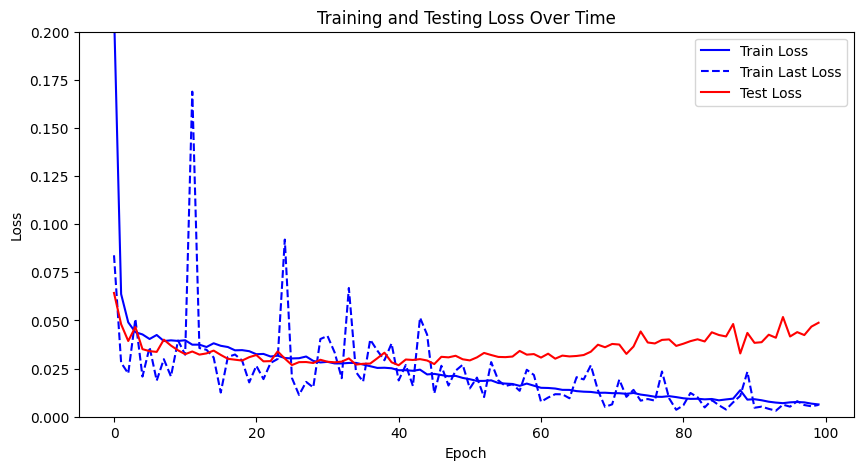

In [37]:
# Создание графика
plt.figure(figsize=(10, 5))
# Построение графика потерь на обучении
plt.plot(train_avg_losses, label='Train Loss', color='blue')
plt.plot(train_losses, label='Train Last Loss', linestyle='dashed', color='blue')

# Построение графика потерь на тесте
plt.plot(test_losses, label='Test Loss', color='red')

# Добавление меток и легенды
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Testing Loss Over Time')
plt.legend()
plt.ylim(0, 0.2)
# plt.xlim(0, 150)

# Отображение графика
plt.show()

In [41]:
print(label_paths_train)
print(ct_paths_train)
print(label_paths_test)
print(ct_paths_test)

['C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_071_016.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_004_016.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_254_016.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_246_016.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_109_000.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_269_016.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_320_016.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_103_000.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_107_032.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/labelsTr/pancreas_187_000.nii.gz', 'C:/Users/Serious Mishustik/Desktop/Stepan/Augmentation_v2/

In [68]:
model = UNet3D(1,3)
model.load_state_dict(torch.load('C:/Users/Gromov/Desktop/Code/cancerCE_3D_2_1_16_128_128/cancerCE_3D_2_1_16_128_128.pth'))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

UNet3D(
  (encoder1): DoubleConv3D(
    (double_conv): Sequential(
      (0): Conv3d(1, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      (4): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (encoder2): DoubleConv3D(
    (double_conv): Sequential(
      (0): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      (1): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv3d(128, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      (4): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, tr

In [64]:
# val_imagesTr = folder + 'Validation/64/imagesTr/'
# val_labelsTr = folder + 'Validation/64/labelsTr/'
# val_ct_paths = sorted(get_file_paths(val_imagesTr))
# val_label_paths = sorted(get_file_paths(val_labelsTr))
# val_ct_paths = [val_ct_paths[6]]
# val_label_paths = [val_label_paths[6]]
# print(f'ct_paths len: {len(val_ct_paths)}')
# print(f'label_paths len: {len(val_label_paths)}')
# # for file_path in  label_paths:
# #     print(file_path)
# for i in range(len(ct_paths)):
#     if ct_paths[i][-20:-7] != label_paths[i][-20:-7]:
#         print(f'Ass in {ct_paths[i][-20:-7]}')
val_dataset = PancreasDataset(val_ct_paths, val_label_paths, transform)
print(f'Длина val_dataset: {len(val_dataset)}')
batch_size = 1
valloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
print(f'Длина valloader при batch_size = {batch_size}: {len(valloader)}')

Длина val_dataset: 543
Длина valloader при batch_size = 1: 543


In [55]:
amean_value = []
amin_value = []
amax_value = []
for batch in testloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
       
        for i in range(ct_images.shape[0]):
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_min[labels_np == 0] = 0
            min_outputs = np.min(outputs_np_min)
            amin_value.append(min_outputs)
            outputs_np_max[labels_np == 1] = 0
            max_outputs = np.max(outputs_np_max)
            amax_value.append(max_outputs)
            mean_value = np.mean([min_outputs, max_outputs])  # Pass values as a list
            amean_value.append(mean_value)

print(np.min(amin_value))
print(np.mean(amin_value))
print(np.max(amin_value))

print(np.min(amean_value))
print(np.mean(amean_value))
print(np.max(amean_value))

print(np.min(amax_value))
print(np.mean(amax_value))
print(np.max(amax_value))

0.0
0.0
0.0
0.0264711
0.2178388
0.37517226
0.0529422
0.4356776
0.7503445


In [58]:
# Загрузка одного батча из testloader
aiou = []
adice = []
aaccuracy = []
aprecision = []
arecall = []
af1_score = []
number = 0
for batch in testloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        mean = np.mean(amean_value)
        mean = 0.2
        outputs = (outputs > mean).float()
       
        for i in range(ct_images.shape[0]):
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            # structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            # labeled_array, num_features = label(outputs_np, structure)
            # component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            # largest_component_index = np.argmax(component_sizes) + 1
            # largest_component = np.zeros_like(outputs_np)
            # largest_component[labeled_array == largest_component_index] = 1
            # outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            aiou.append(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            adice.append(dice)
            # # Accuracy
            accuracy = np.sum(labels_np == outputs_np) / labels_np.size
            aaccuracy.append(accuracy)
            # Precision
            precision = np.sum((labels_np == 1) & (outputs_np == 1)) / np.sum(outputs_np == 1)
            aprecision.append(precision)
            # Recall
            recall = np.sum((labels_np == 1) & (outputs_np == 1)) / np.sum(labels_np == 1)
            arecall.append(recall)
            # F1 Score
            f1_score = 2 * precision * recall / (precision + recall)
            af1_score.append(f1_score)
            number += 1
print(number)

C:\Users\Gromov\AppData\Local\Temp\ipykernel_12552\1874783975.py:43: RuntimeWarning: invalid value encountered in scalar divide
  precision = np.sum((labels_np == 1) & (outputs_np == 1)) / np.sum(outputs_np == 1)
C:\Users\Gromov\AppData\Local\Temp\ipykernel_12552\1874783975.py:49: RuntimeWarning: invalid value encountered in scalar divide
  f1_score = 2 * precision * recall / (precision + recall)


57


In [59]:
print("IoU (Jaccard Index):", sum(aiou)/number)
print("Dice Coefficient (F1 Score):", sum(adice)/number)
print("Accuracy:", sum(aaccuracy)/number)
print("Precision:", sum(aprecision)/number)
print("Recall:", sum(arecall)/number)

IoU (Jaccard Index): 0.21524622294951307
Dice Coefficient (F1 Score): 0.31640334344577303
Accuracy: 0.9805867379171807
Precision: nan
Recall: 0.49437003637881743


pancreas_006_016
Mean Value: 0.492
0.5655526992287918
0.722495894909688

pancreas_015_016
Mean Value: 0.492
0.6855345911949685
0.8134328358208955

pancreas_021_000
Mean Value: 0.492
0.6465064899199117
0.7853069439785307

pancreas_025_000
Mean Value: 0.492
0.7147713751487337
0.8336637589214909

pancreas_046_016
Mean Value: 0.492
0.6595092024539877
0.7948243992606284

pancreas_050_016
Mean Value: 0.492
0.2976949485041687
0.45880574452003026

pancreas_056_016
Mean Value: 0.492
0.7817178881008668
0.8774878372401592


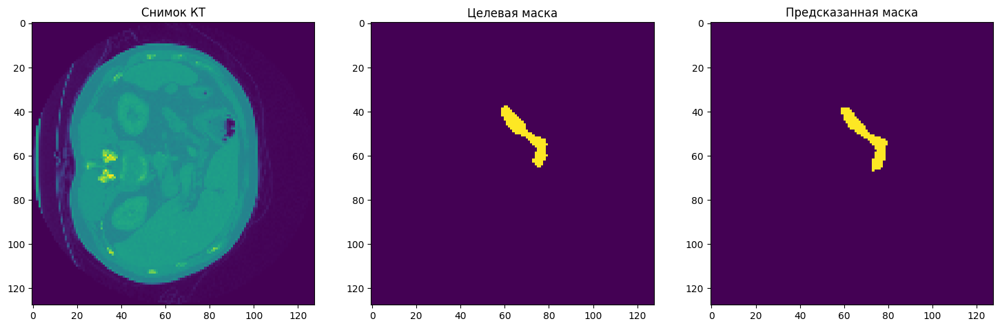

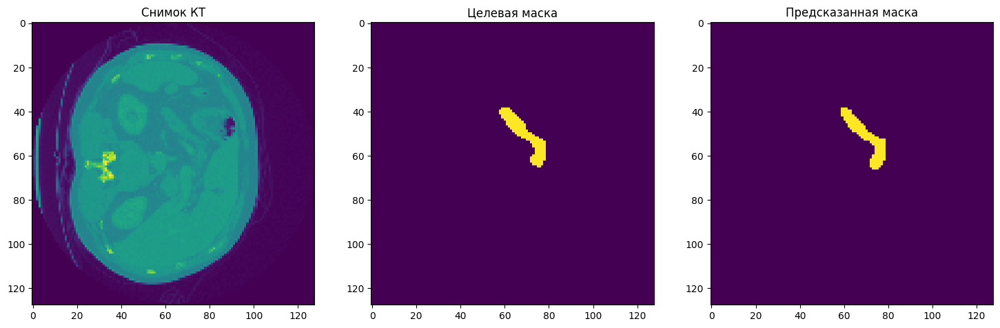

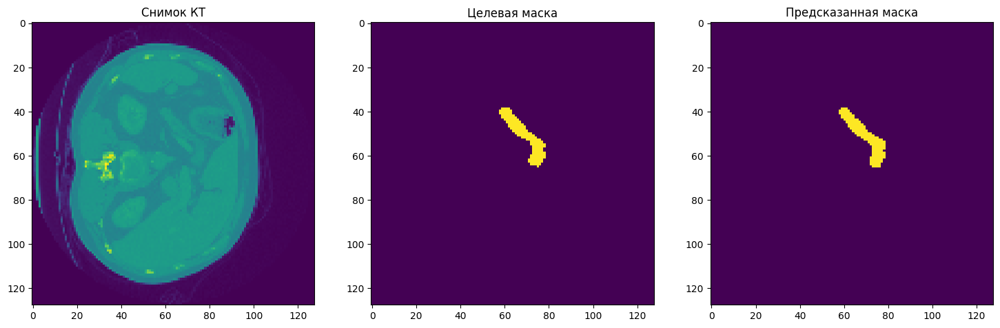

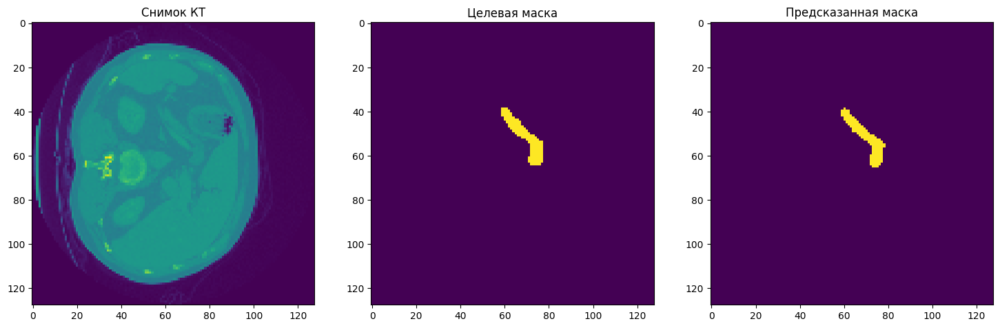

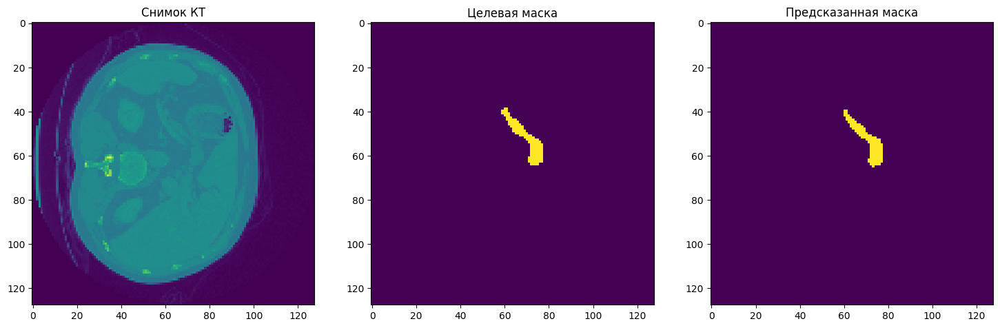

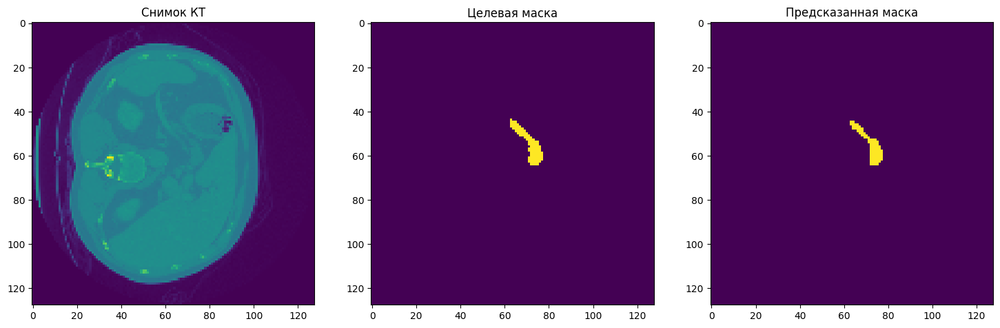


pancreas_061_016
Mean Value: 0.492
0.7638134482112755
0.8660932356376766


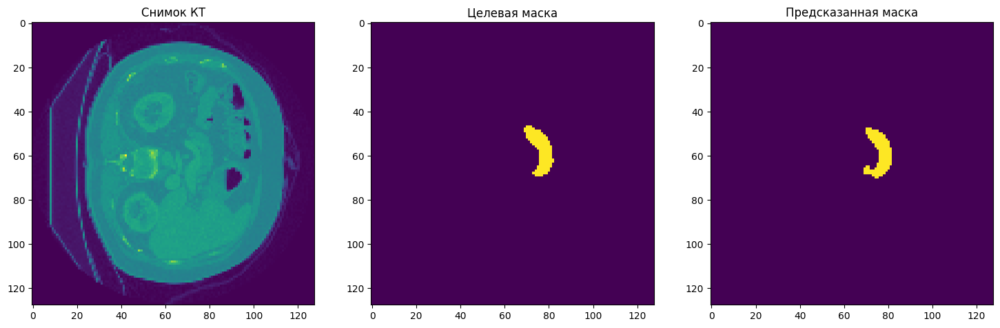

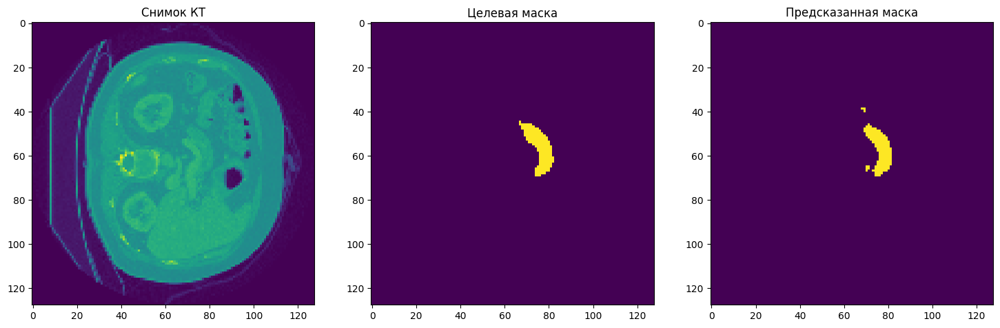

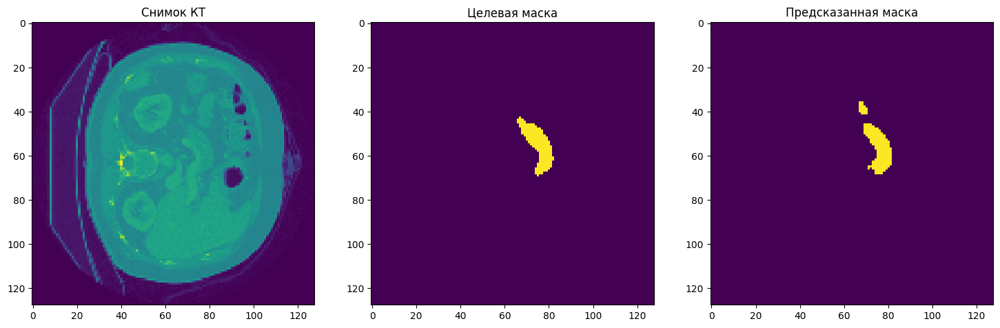

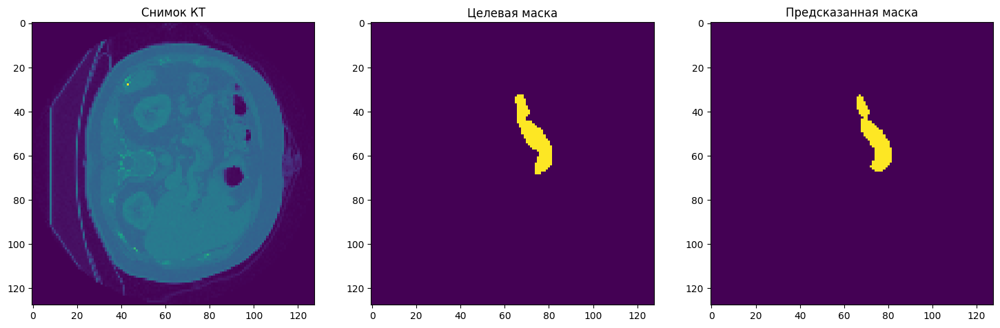

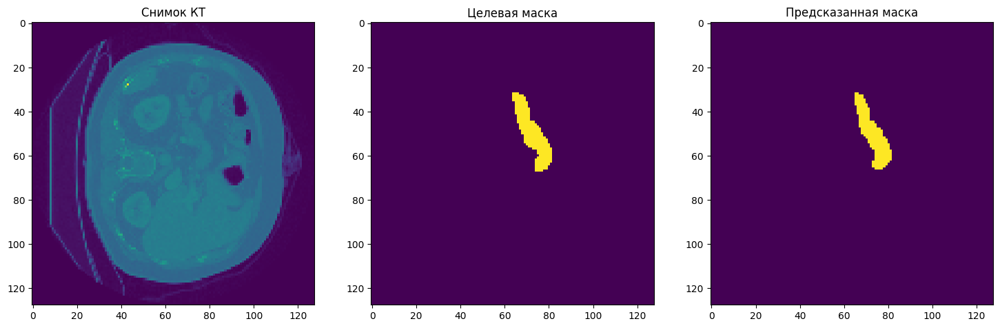

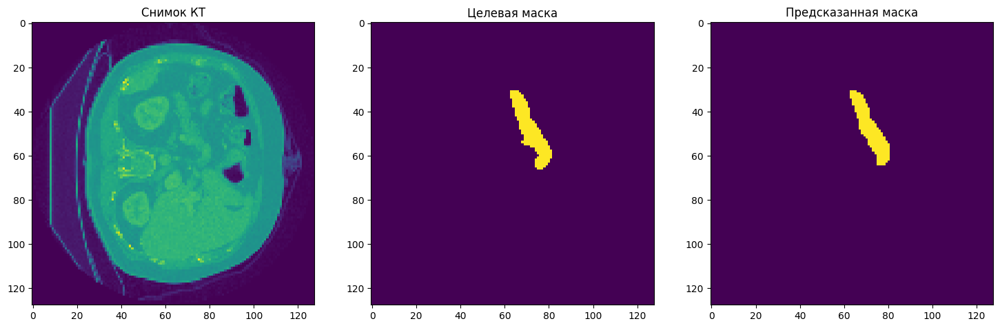


pancreas_067_016
Mean Value: 0.492
0.7039342076016892
0.8262457605009131

pancreas_070_016
Mean Value: 0.492
0.4180648126867387
0.5896272285251215

pancreas_070_032
Mean Value: 0.492
0.45783684692942256
0.6281043696950644

pancreas_078_000
Mean Value: 0.492
0.4616457461645746
0.6316793893129771

pancreas_084_016
Mean Value: 0.492
0.5434827092285656
0.7042290865703301

pancreas_088_016
Mean Value: 0.492
0.30382186061449523
0.46604811560883486

pancreas_088_032
Mean Value: 0.492
0.30251298907857066
0.46450667535004886

pancreas_095_000
Mean Value: 0.492
0.6479919001012487
0.7864018021707967

pancreas_098_032
Mean Value: 0.492
0.20697765582124658
0.3429684962650211

pancreas_119_016
Mean Value: 0.492
0.6866985164697008
0.8142516398330352

pancreas_120_032
Mean Value: 0.492
0.48714707121786766
0.6551431000283366

pancreas_124_016
Mean Value: 0.492
0.450198273851178
0.620878237091845

pancreas_125_000
Mean Value: 0.492
0.5753344968004653
0.7304283604135894

pancreas_145_000
Mean Value: 0.4

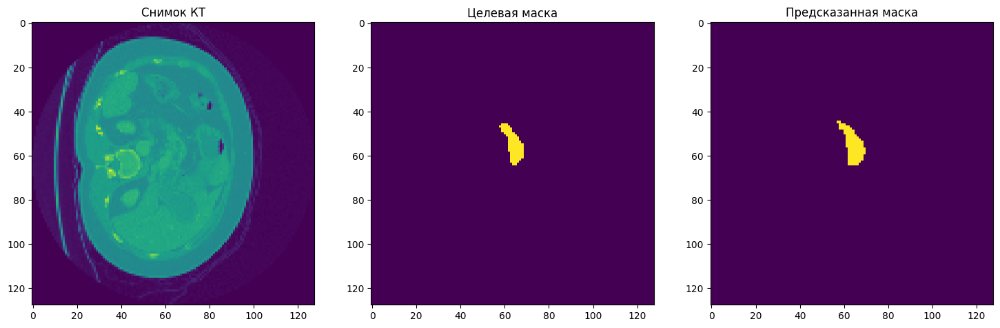

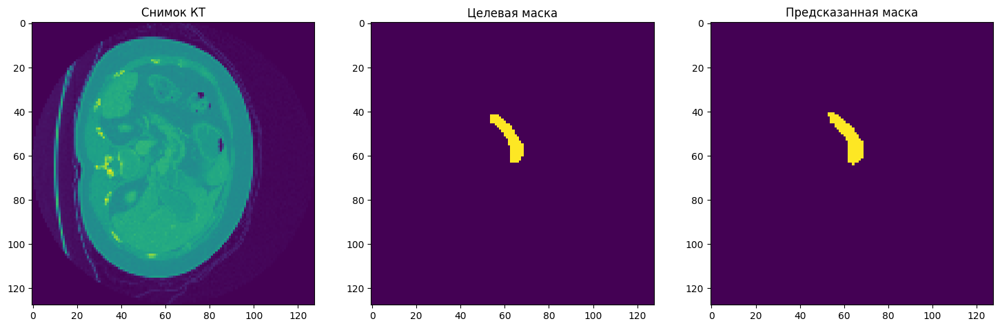

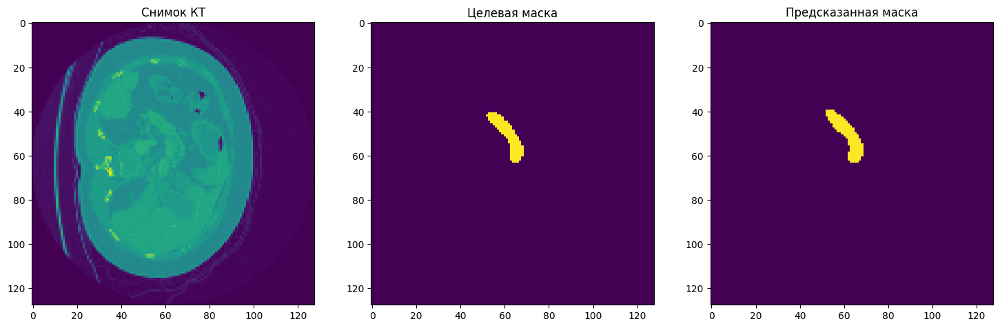

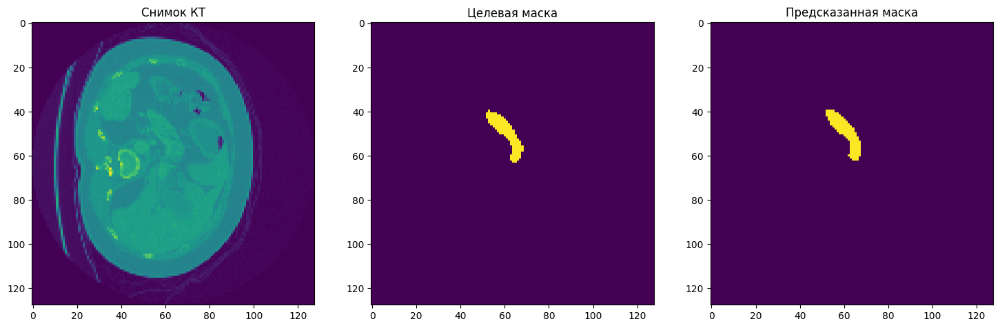

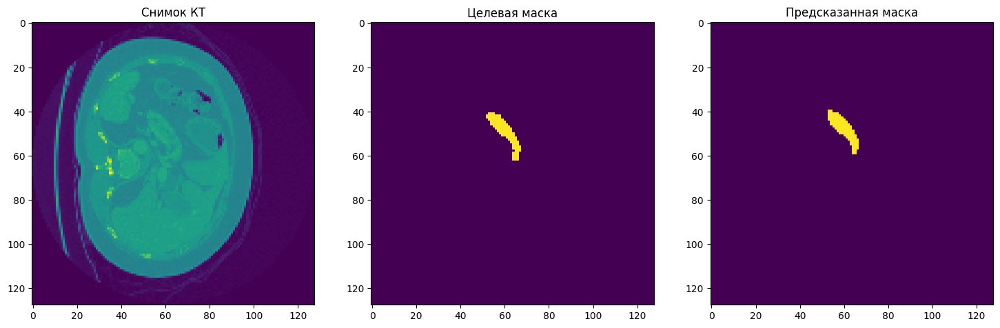

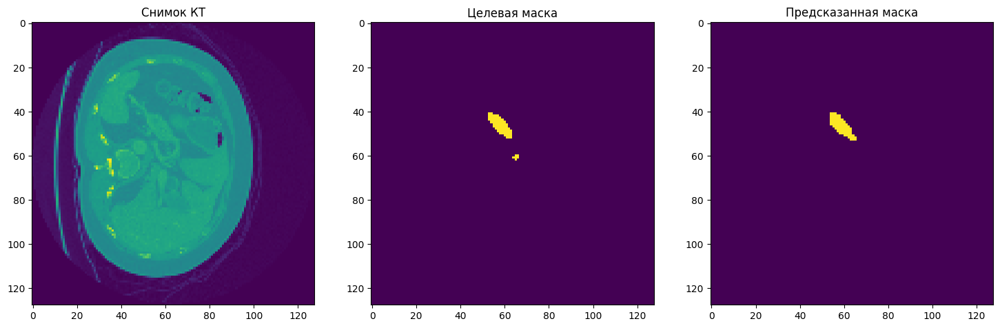


pancreas_179_000
Mean Value: 0.492
0.8235294117647058
0.9032258064516129


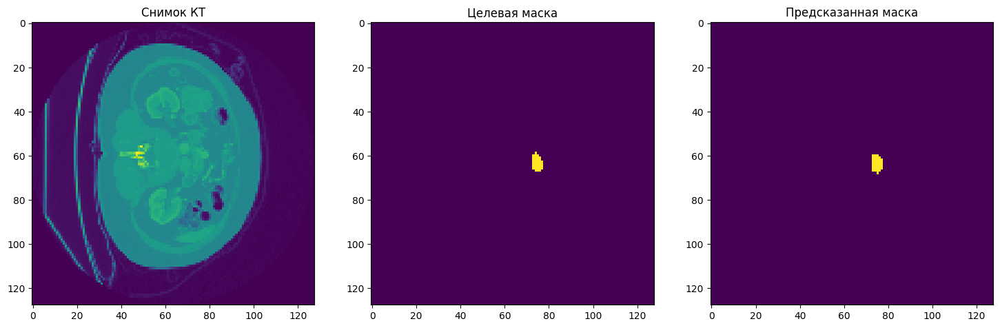

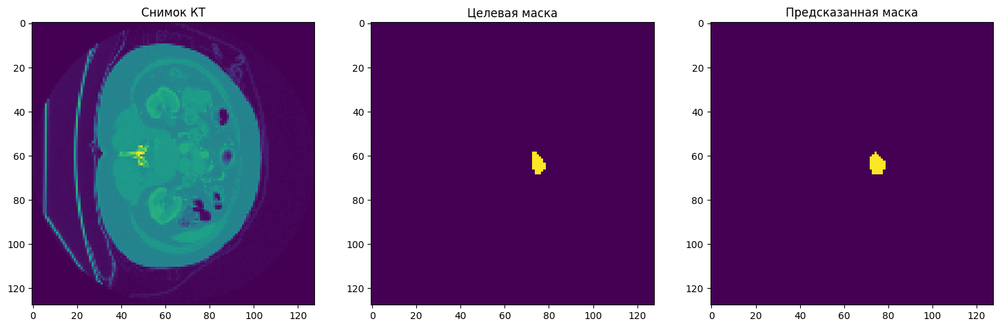

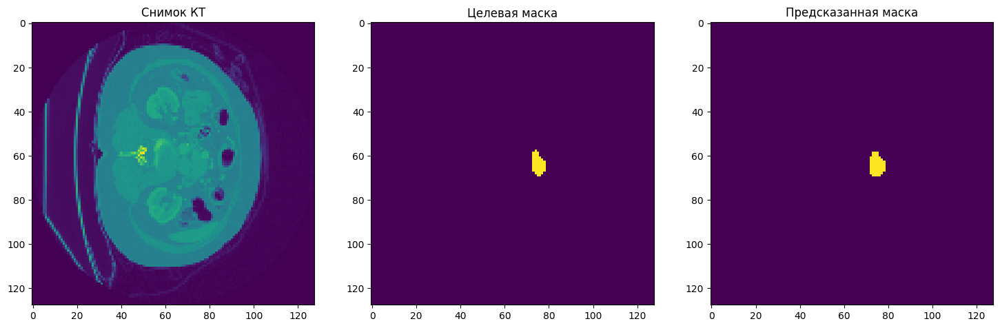

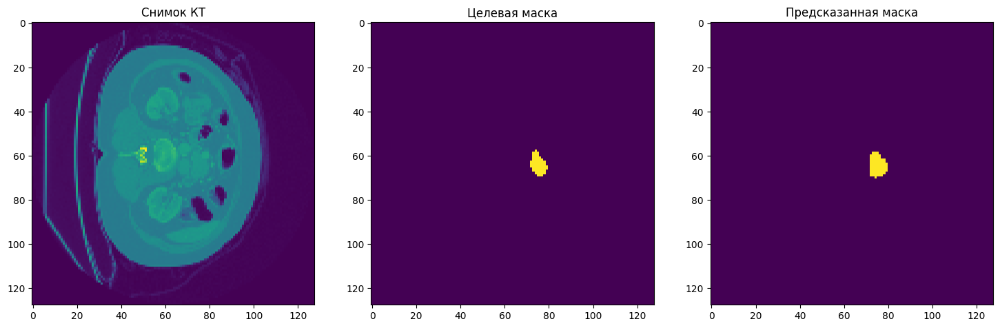

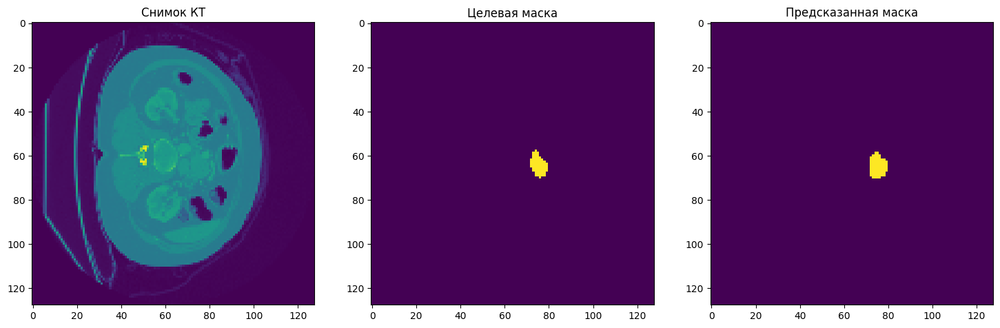

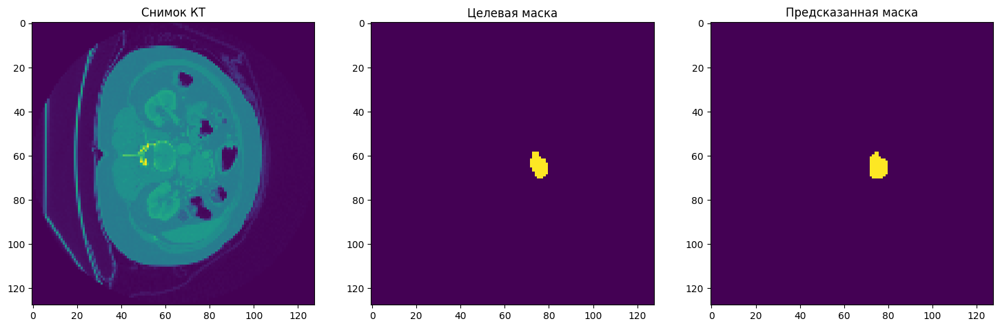


pancreas_194_016
Mean Value: 0.492
0.7100156494522691
0.8304200604008419

pancreas_199_016
Mean Value: 0.492
0.6750495049504951
0.8060054379950349

pancreas_212_032
Mean Value: 0.492
0.5458891013384322
0.7062461348175634

pancreas_213_000
Mean Value: 0.492
0.3481418197351559
0.5164765525982256

pancreas_213_016
Mean Value: 0.492
0.33076923076923076
0.49710982658959535

pancreas_214_016
Mean Value: 0.492
0.7607655502392344
0.8641304347826086


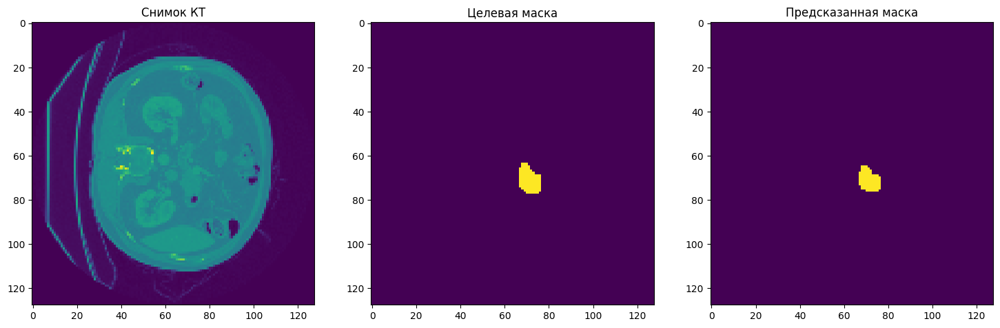

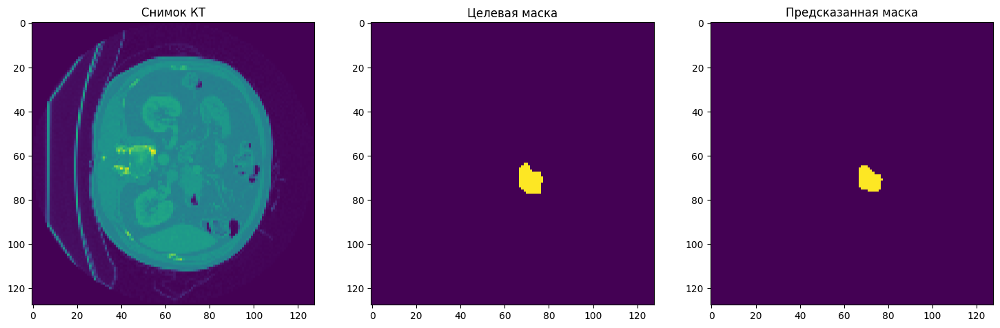

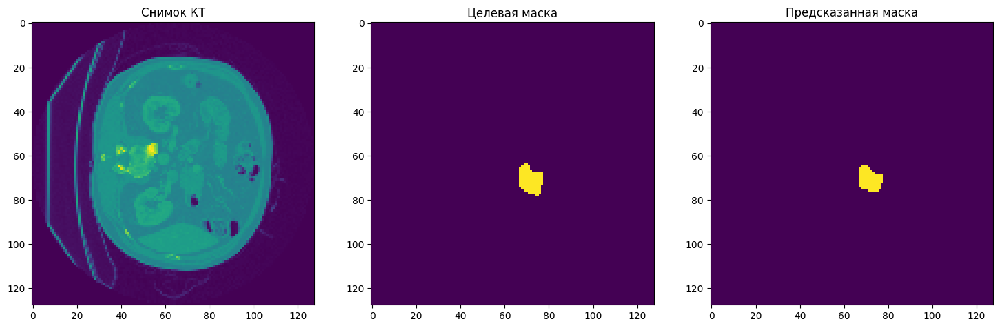

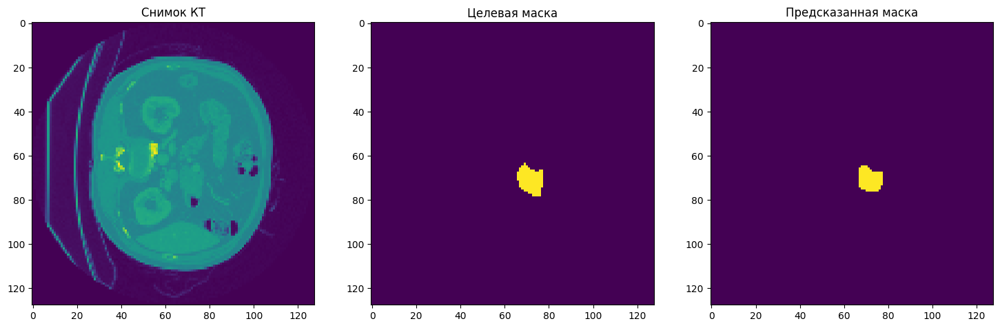

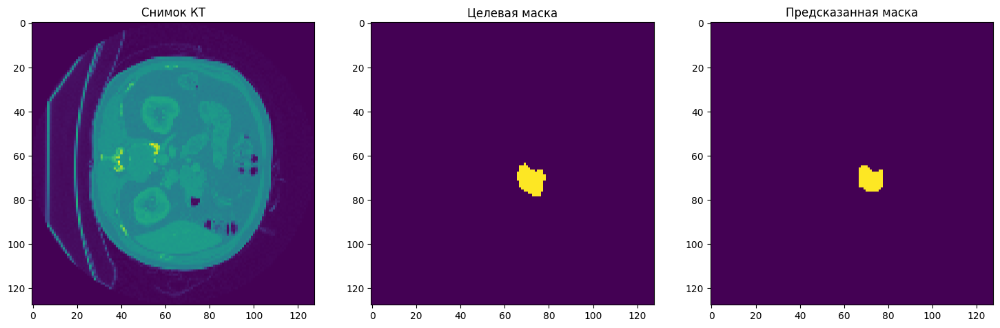

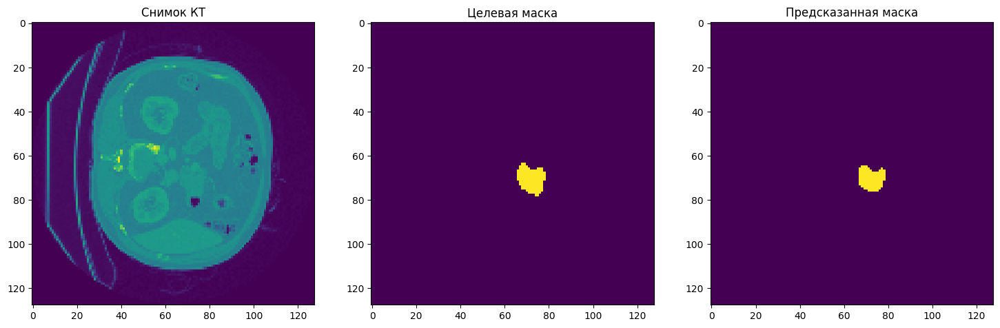


pancreas_217_016
Mean Value: 0.492
0.6437466161342718
0.7832674571805006

pancreas_218_016
Mean Value: 0.492
0.37773549000951473
0.5483425414364641

pancreas_222_000
Mean Value: 0.492
0.65775950668037
0.7935523868567886

pancreas_224_016
Mean Value: 0.492
0.6282909415439536
0.7717182789805426

pancreas_228_016
Mean Value: 0.492
0.5795180722891566
0.7337909992372235

pancreas_230_000
Mean Value: 0.492
0.5770975056689343
0.7318475916606758

pancreas_231_000
Mean Value: 0.492
0.6334221545489152
0.7755767886273596

pancreas_249_032
Mean Value: 0.492
0.45625266752027316
0.6266119577960141

pancreas_255_000
Mean Value: 0.492
0.5494989000244439
0.7092601356680864

pancreas_256_000
Mean Value: 0.492
0.6710323574730355
0.8031350852927617

pancreas_259_000
Mean Value: 0.492
0.563505648750428
0.7208232975695205

pancreas_264_016
Mean Value: 0.492
0.5020155038759689
0.6684558216350124

pancreas_266_032
Mean Value: 0.492
0.7317554240631163
0.8451025056947609

pancreas_284_000
Mean Value: 0.492
0.8

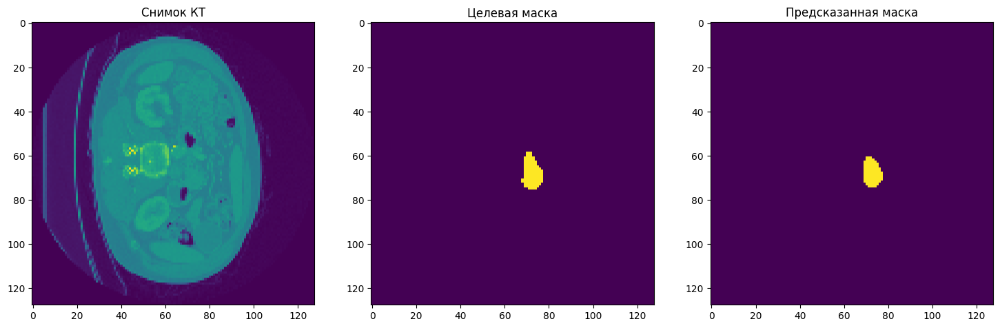

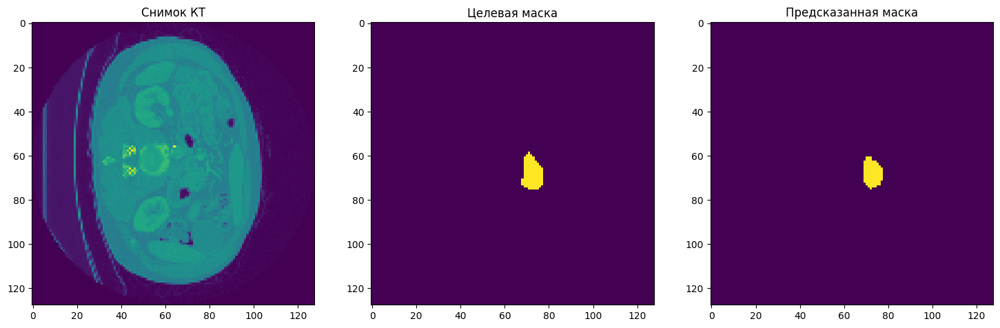

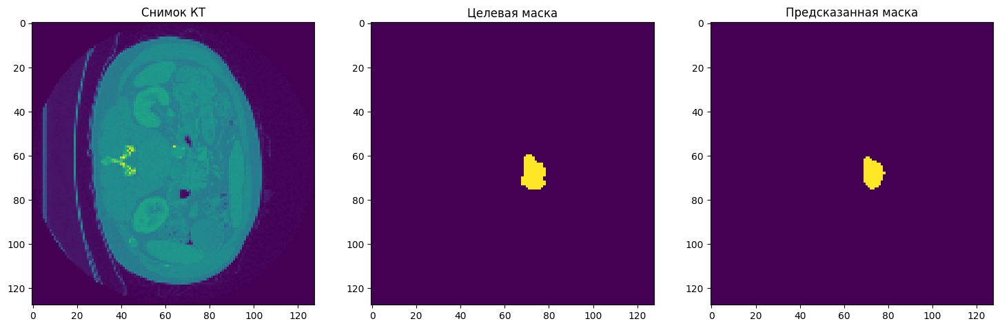

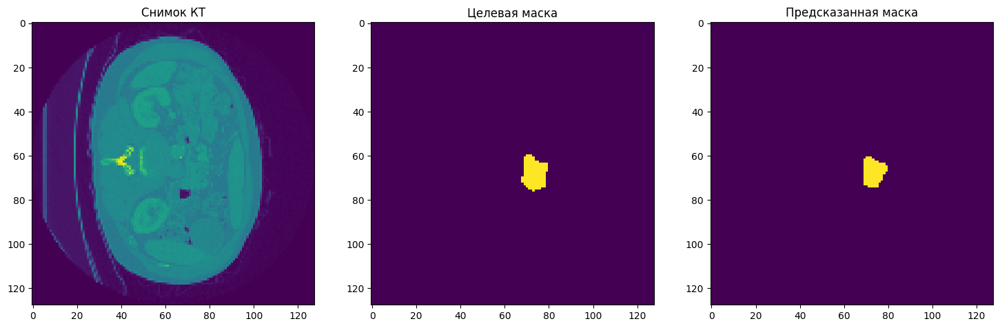

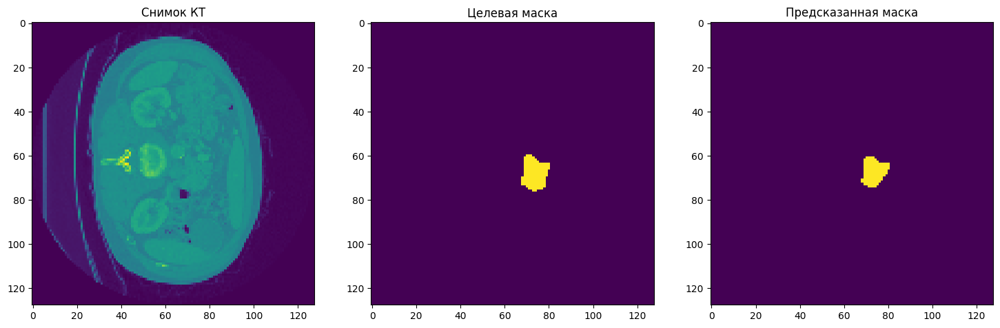

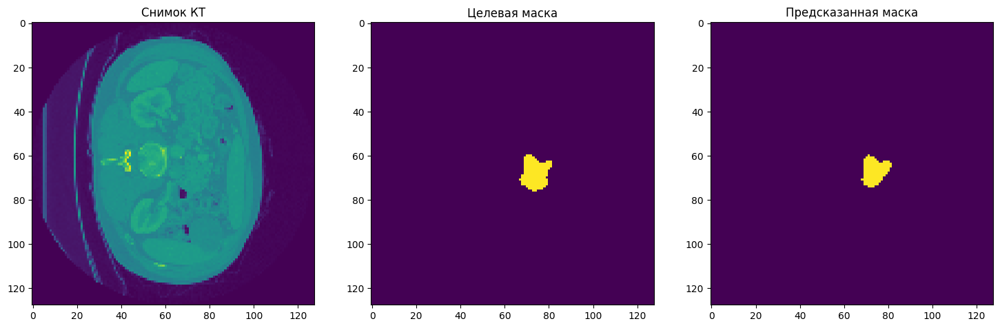


pancreas_284_016
Mean Value: 0.492
0.8321990642279881
0.9084155542658154


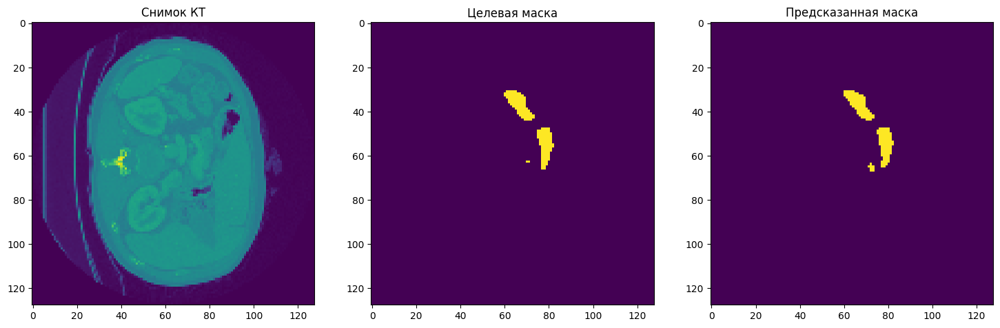

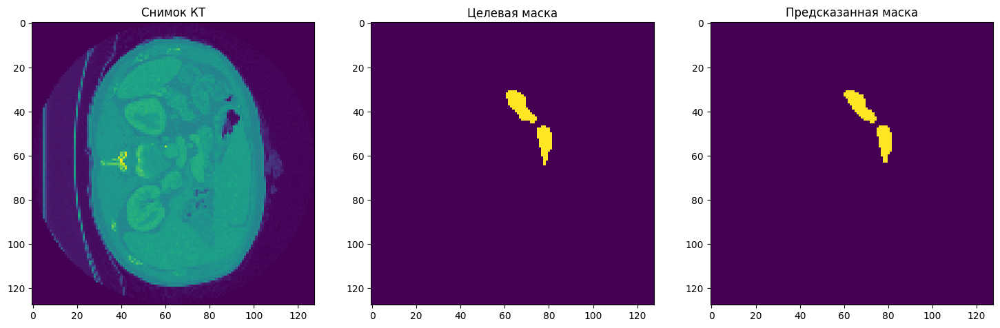

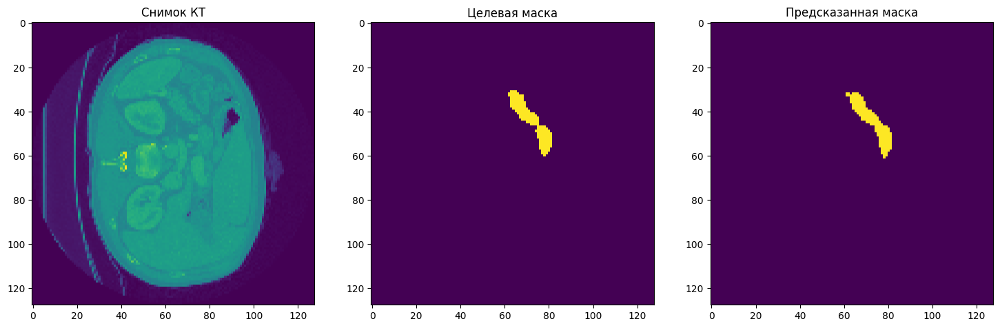

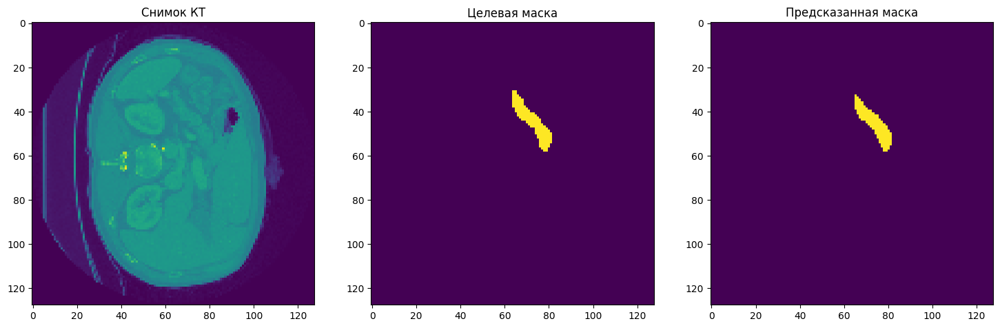

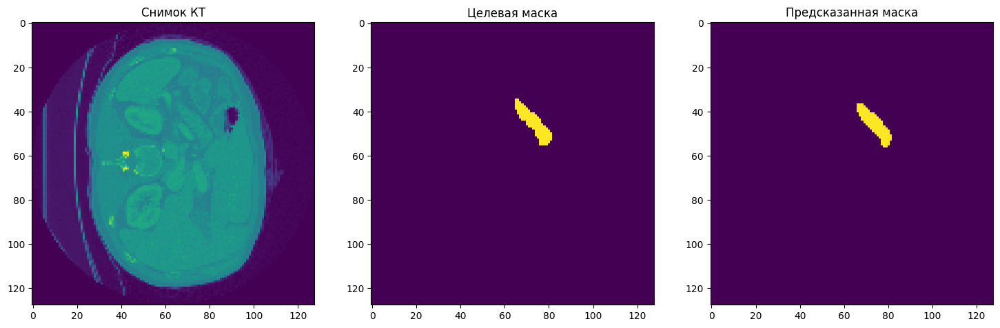

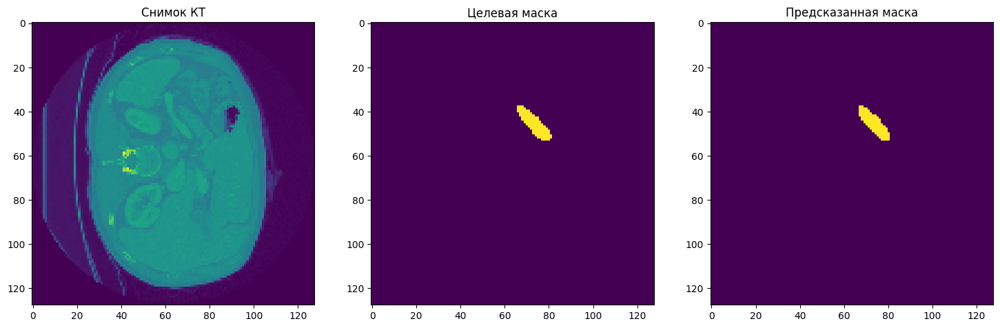


pancreas_285_016
Mean Value: 0.492
0.6317579054743284
0.7743279849968744

pancreas_290_016
Mean Value: 0.492
0.6772122879413113
0.8075451066156369

pancreas_291_016
Mean Value: 0.492
0.6633439057544177
0.7976028330155271

pancreas_298_000
Mean Value: 0.492
0.5189493433395872
0.683300395256917

pancreas_298_016
Mean Value: 0.492
0.5085672621217645
0.6742387626872886

pancreas_305_000
Mean Value: 0.492
0.7021013597033374
0.8249818445896877

pancreas_310_000
Mean Value: 0.492
0.4530313124583611
0.6235671710224667

pancreas_316_000
Mean Value: 0.492
0.6414653156664069
0.7815764482431149

pancreas_316_016
Mean Value: 0.492
0.6509881422924901
0.7886042614316495

pancreas_321_032
Mean Value: 0.492
0.5717446270543616
0.727528654735572

pancreas_323_000
Mean Value: 0.492
0.593238434163701
0.744695108331472

pancreas_325_016
Mean Value: 0.492
0.6330297219558965
0.7752825480698664

pancreas_330_016
Mean Value: 0.492
0.5226722049151956
0.6865196635599

pancreas_331_000
Mean Value: 0.492
0.4109186

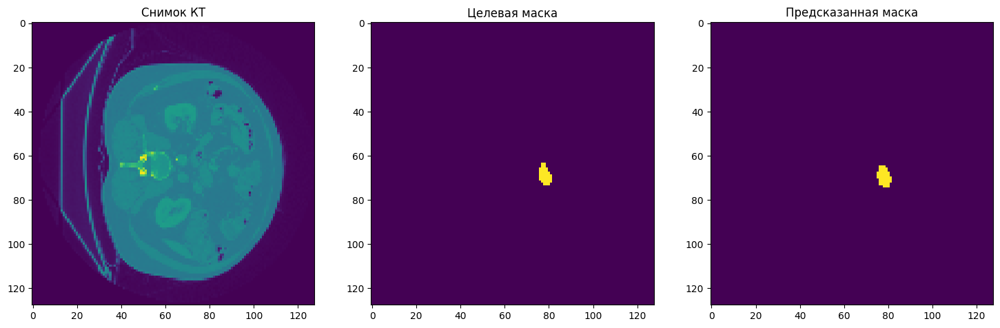

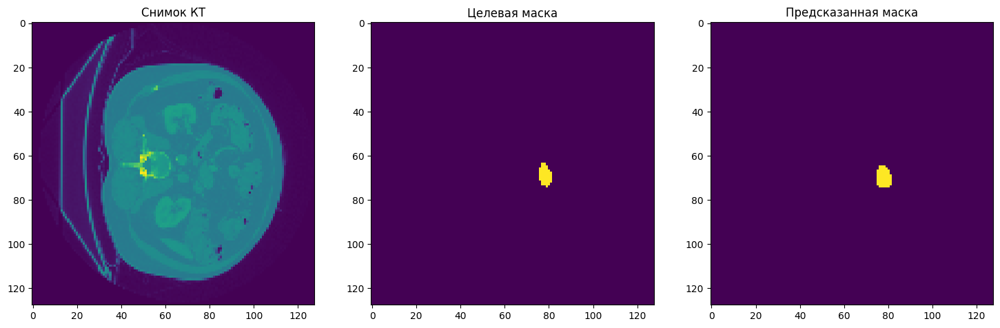

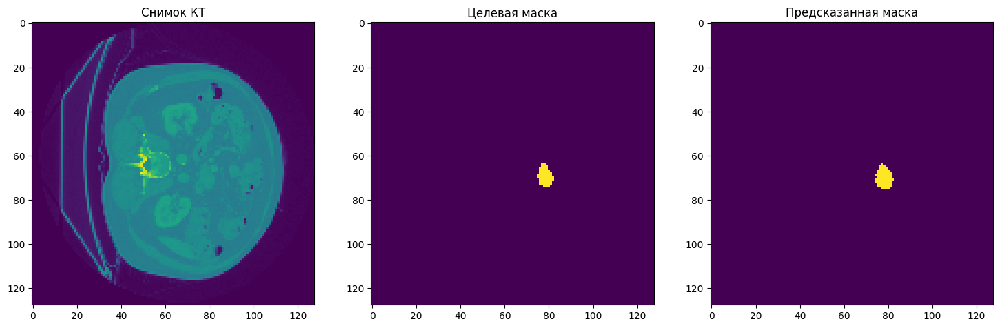

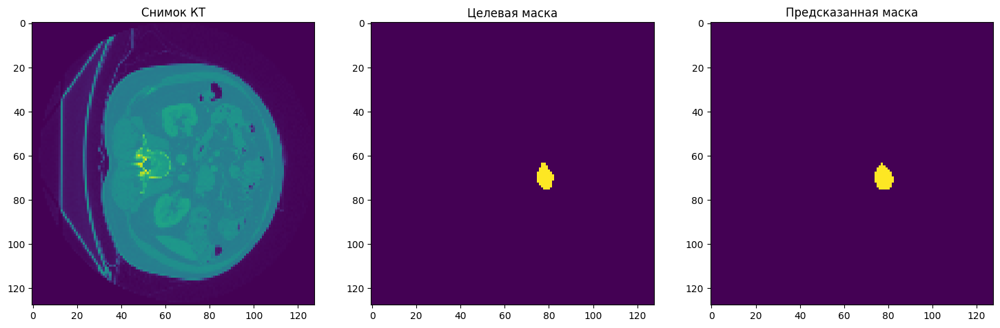

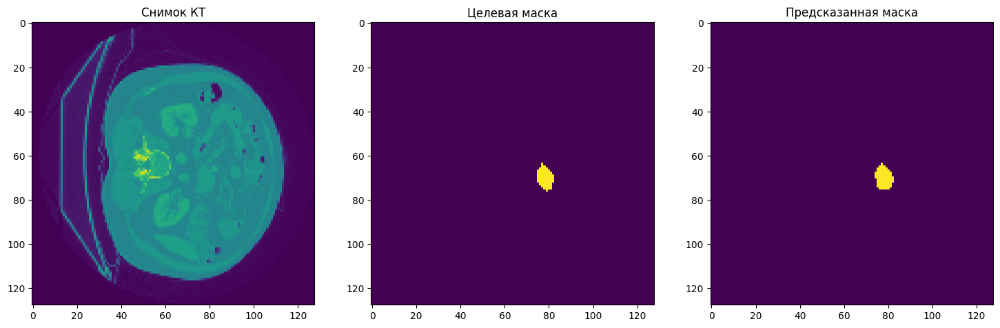

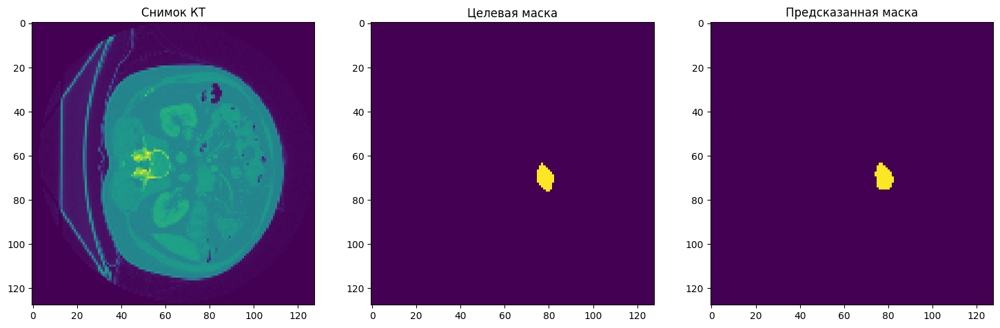


pancreas_401_048
Mean Value: 0.492
0.5067637877211238
0.6726519337016574

pancreas_402_048
Mean Value: 0.492
0.12534722222222222
0.22277074976858993

pancreas_402_064
Mean Value: 0.492
0.18587848932676518
0.3134865688175021

pancreas_404_000
Mean Value: 0.492
0.5609939759036144
0.7187650747708635

pancreas_412_080
Mean Value: 0.492
0.5288994457640538
0.6918694976696013

pancreas_413_016
Mean Value: 0.492
0.7180821917808219
0.8359113379046405



In [20]:
data = []
n = 0
for batch in testloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        for i in range(ct_images.shape[0]):
            filename = ct_paths_test[n][-23:-7]
            print(filename)
            n += 1
            ct_images_np = ct_images[i].squeeze().cpu().numpy().squeeze()
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            # outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            # outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            # outputs_np_min[labels_np == 0] = 0
            # min_outputs = np.min(outputs_np_min)
            # outputs_np_max[labels_np == 1] = 0
            # max_outputs = np.max(outputs_np_max)
            mean_value = 0.492  # Pass values as a list
            # mean_np = np.median(outputs_np)
            print(f'Mean Value: {mean_value}')
            # print(f'Mean np: {mean_np}')
            outputs_np = (outputs_np > mean_value)
            outputs_np_float = outputs_np.astype(float)

            structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            labeled_array, num_features = label(outputs_np, structure)
            component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            largest_component_index = np.argmax(component_sizes) + 1
            largest_component = np.zeros_like(outputs_np)
            largest_component[labeled_array == largest_component_index] = 1
            outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            print(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            print(dice)
            if dice >= 0.85:
                for i in range(29,35):
                    ar = ct_images_np[i,:,:]
                    ar_lbl = labels_np[i,:,:]
                    ar_out = outputs_np[i,:,:]

                    fig = plt.figure(figsize=(18,15))

                    plt.subplot(1,3,1)
                    plt.imshow(ar)
                    plt.title('Снимок КТ')
                    
                    plt.subplot(1,3,2)
                    plt.imshow(ar_lbl)
                    plt.title('Целевая маска')

                    plt.subplot(1,3,3)
                    plt.imshow(ar_out)
                    plt.title('Предсказанная маска')

                    plt.show()
            print()

            data.append([filename, iou, dice, mean_value])

df = pd.DataFrame(data, columns=['Filename', 'IoU', 'Dice', 'Mean Value'])

pancreas_006_000
Mean Value: 0.482380747795105
0.5753858330035615
0.7304697312233107

pancreas_006_008
Mean Value: 0.3988629877567291
0.23308564724286274
0.3780526482714875

pancreas_006_016
Mean Value: 0.48783814907073975
0.7559746079163555
0.8610313662945241


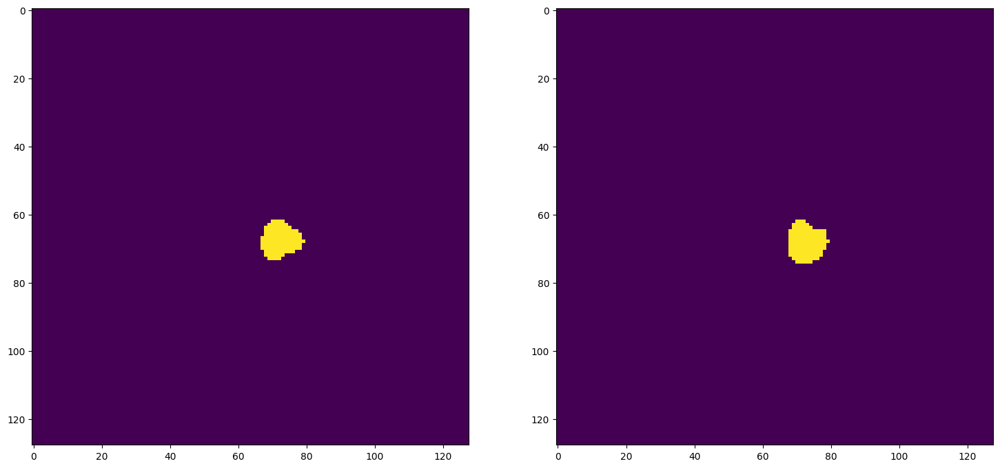

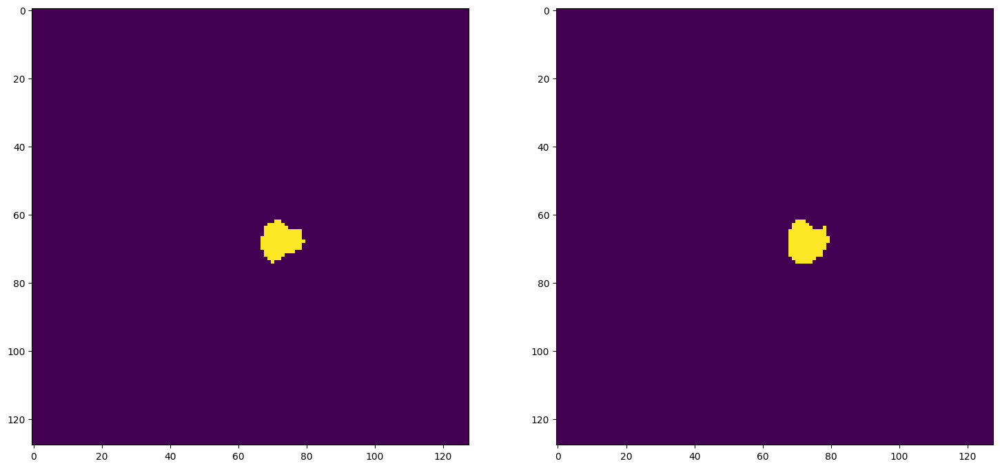

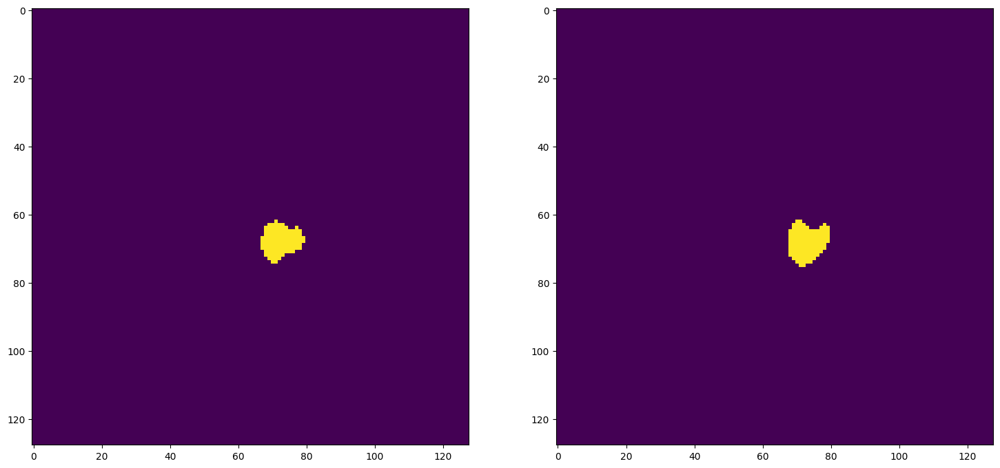

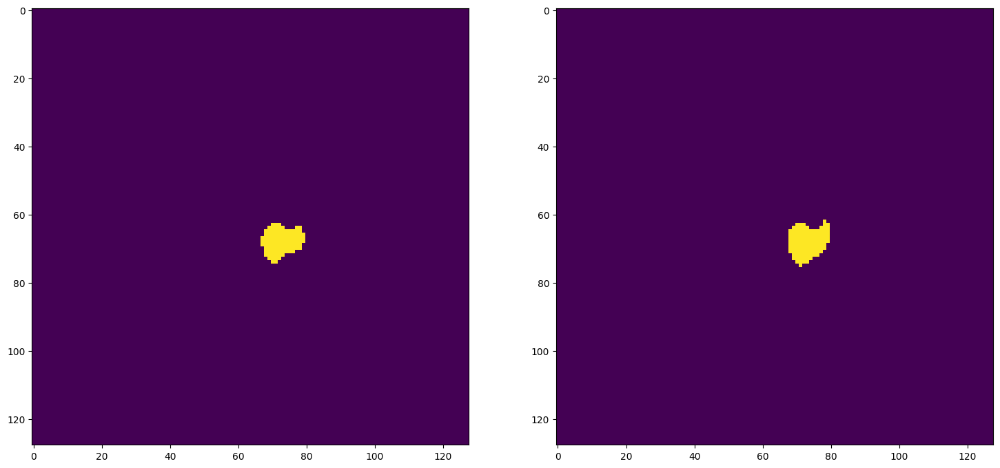

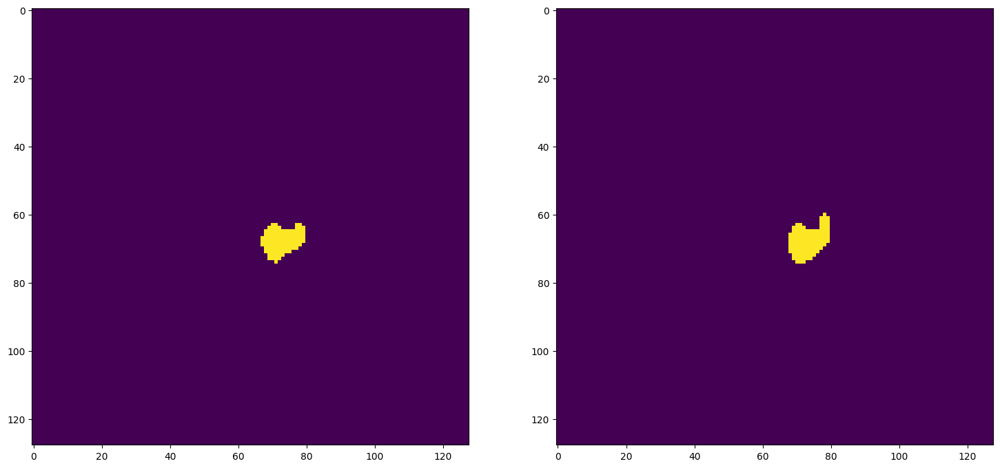

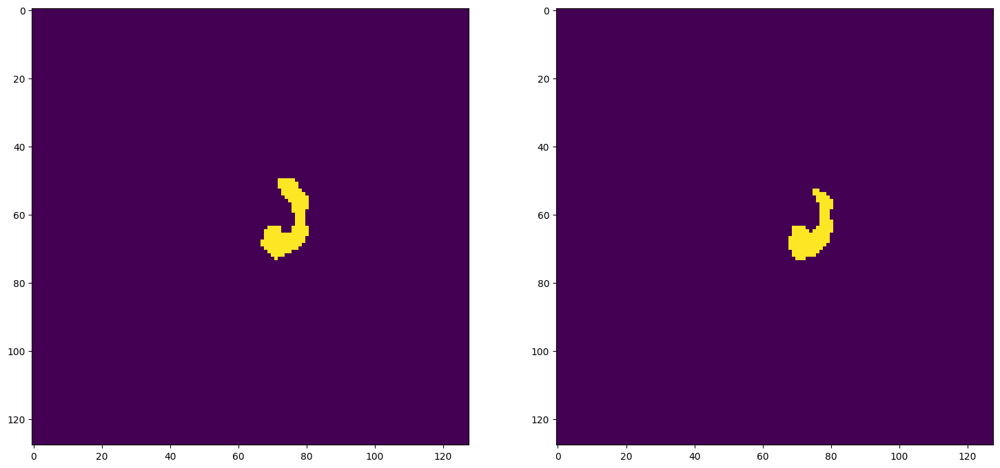


pancreas_006_024
Mean Value: 0.49465441703796387
0.30370529021203685
0.465910957778873

pancreas_006_032
Mean Value: 0.4992661476135254
0.6556833259619638
0.7920395351943369

pancreas_015_000
Mean Value: 0.4986206889152527
0.41081967213114756
0.5823843829886126

pancreas_015_008
Mean Value: 0.4944751560688019
0.6503006012024048
0.7880995749848209

pancreas_015_016
Mean Value: 0.4981198310852051
0.6269750773741651
0.7707248698438126

pancreas_021_000
Mean Value: 0.4643247425556183
0.8352020308863973
0.9102017291066282


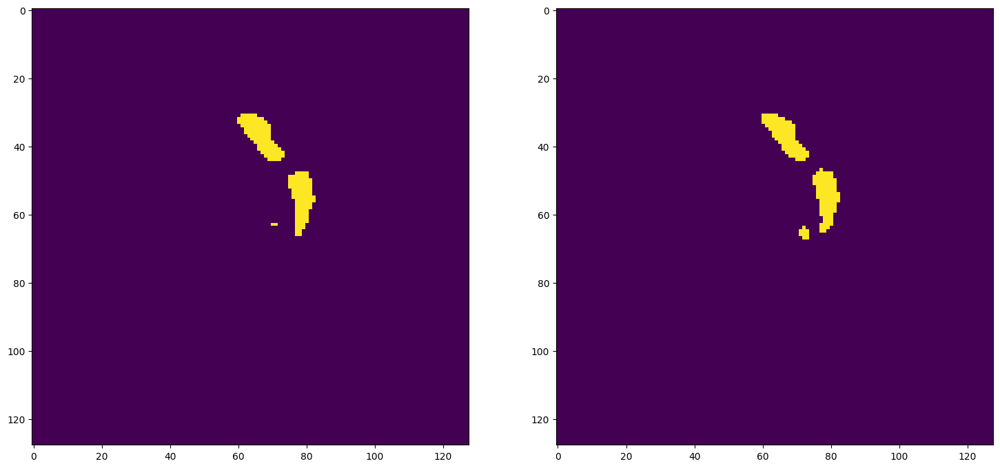

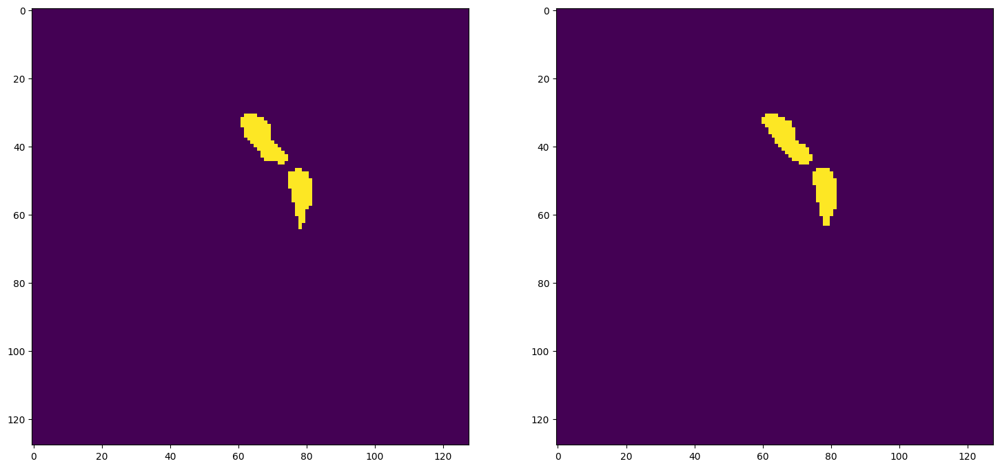

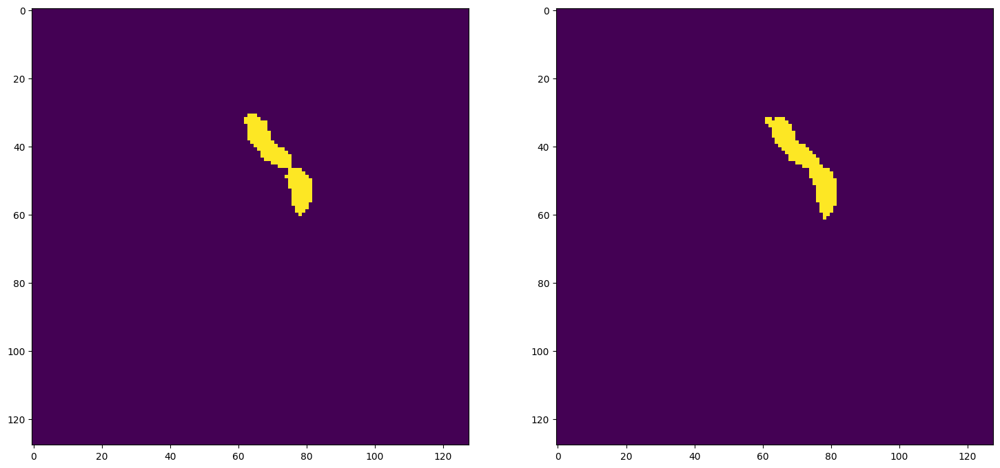

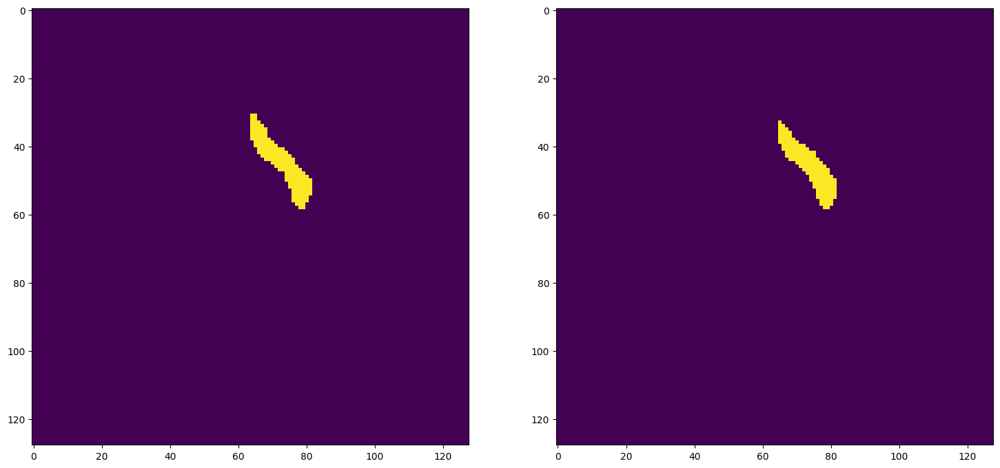

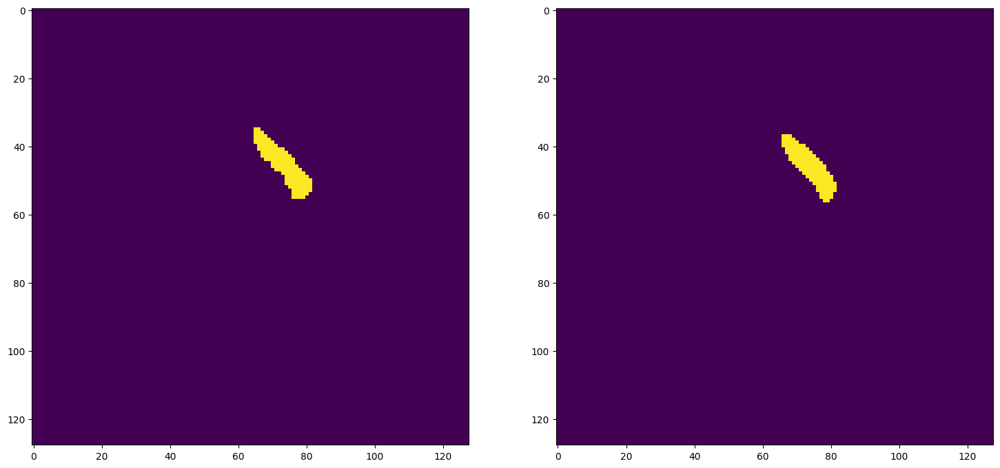

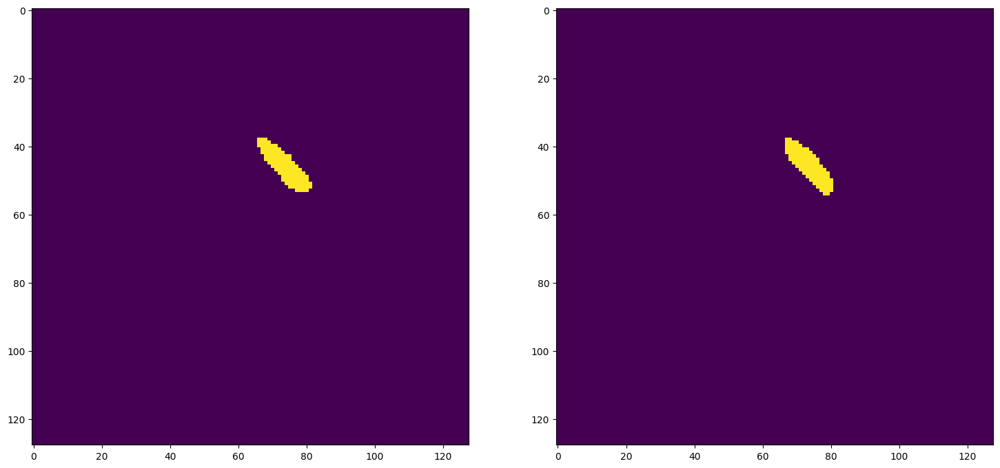


pancreas_021_008
Mean Value: 0.4633867144584656
0.8226182898366221
0.9026775320139697


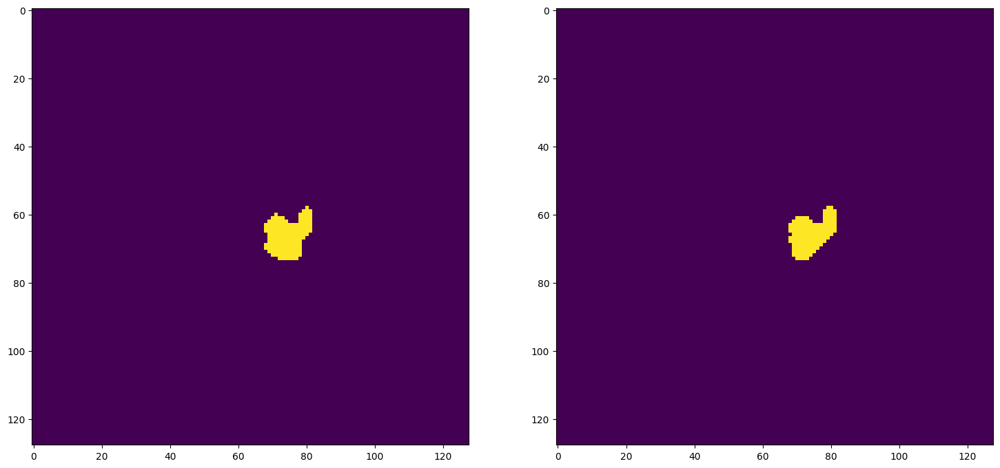

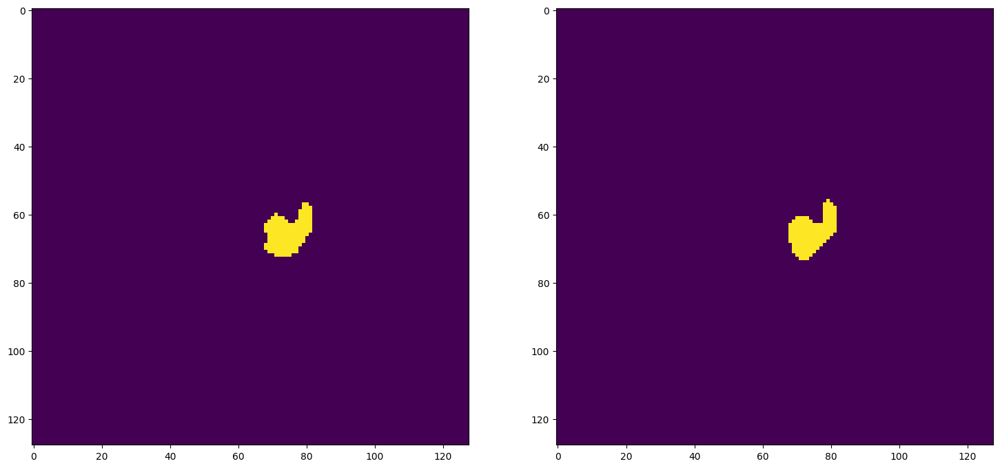

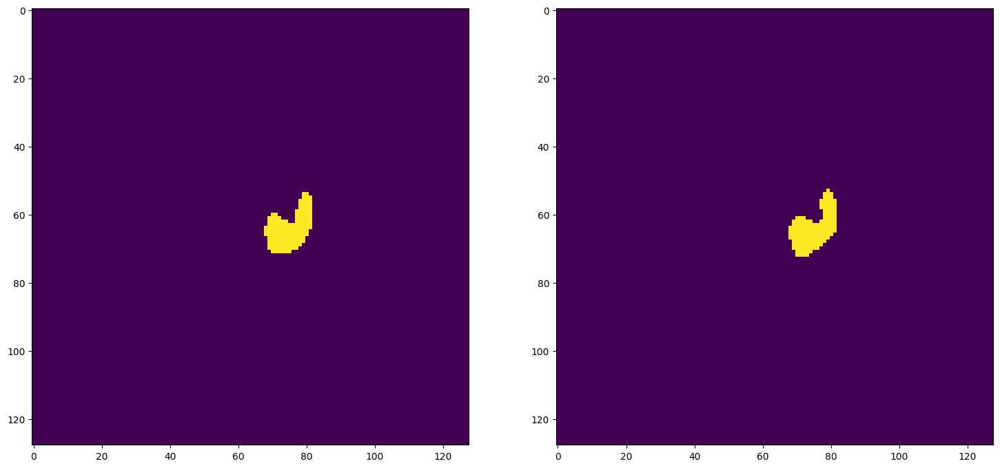

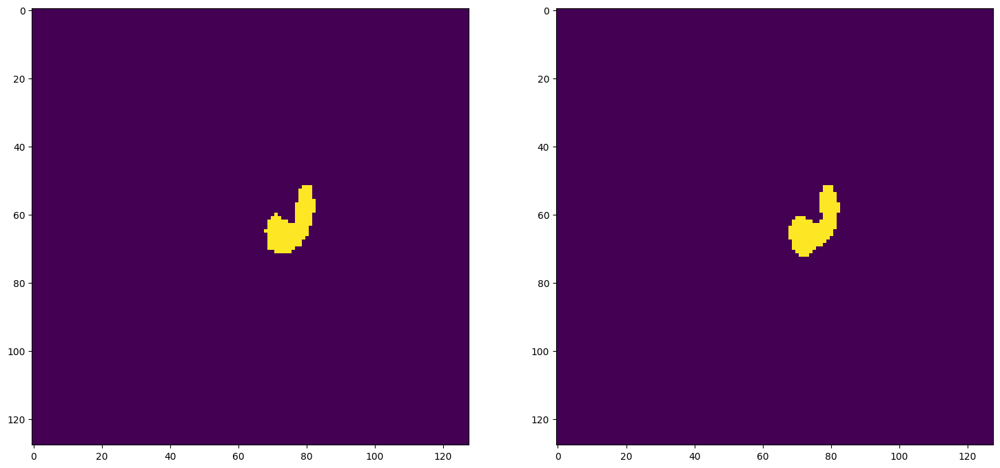

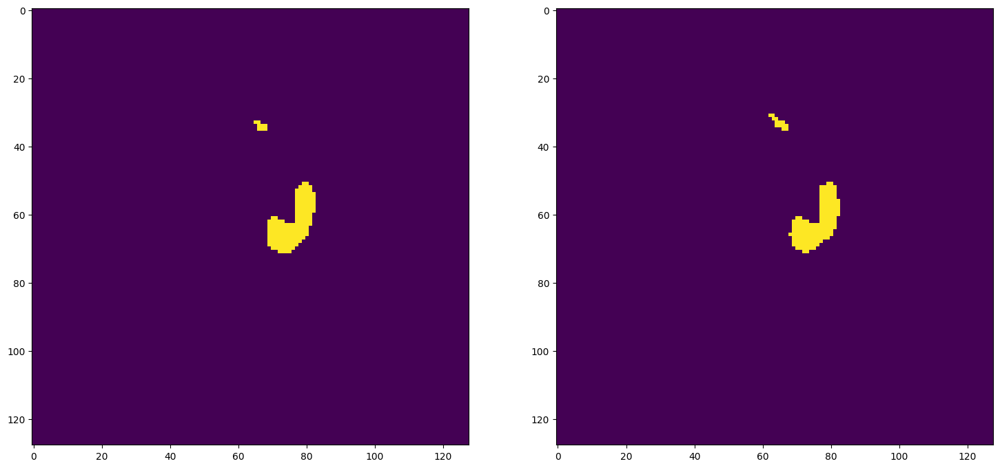

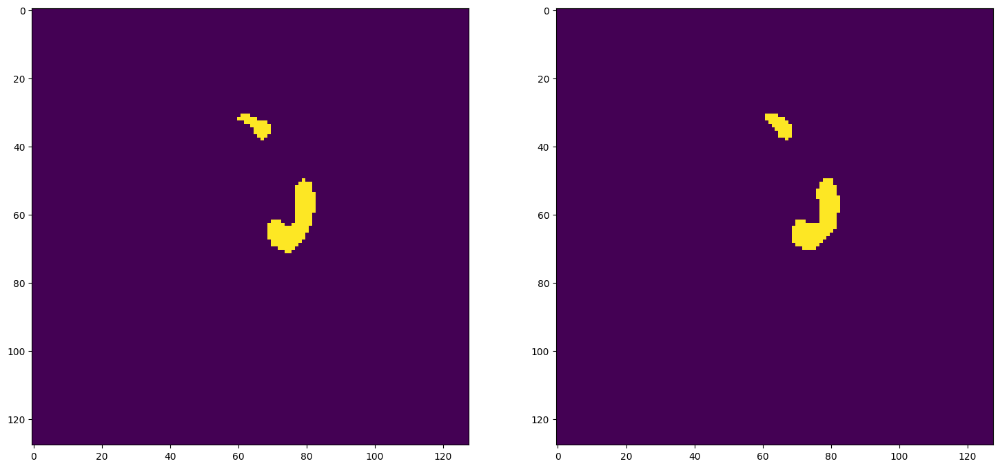


pancreas_021_016
Mean Value: 0.49454063177108765
0.3344797936371453
0.5012886597938144

pancreas_021_024
Mean Value: 0.4976462721824646
0.6687402799377916
0.8014911463187325

pancreas_025_000
Mean Value: 0.15982982516288757
0.14913294797687862
0.2595573440643863

pancreas_025_008
Mean Value: 0.4964326024055481
0.5757403189066059
0.7307553306830502

pancreas_046_000
Mean Value: 0.4862424433231354
0.7435410334346505
0.8529091305295271


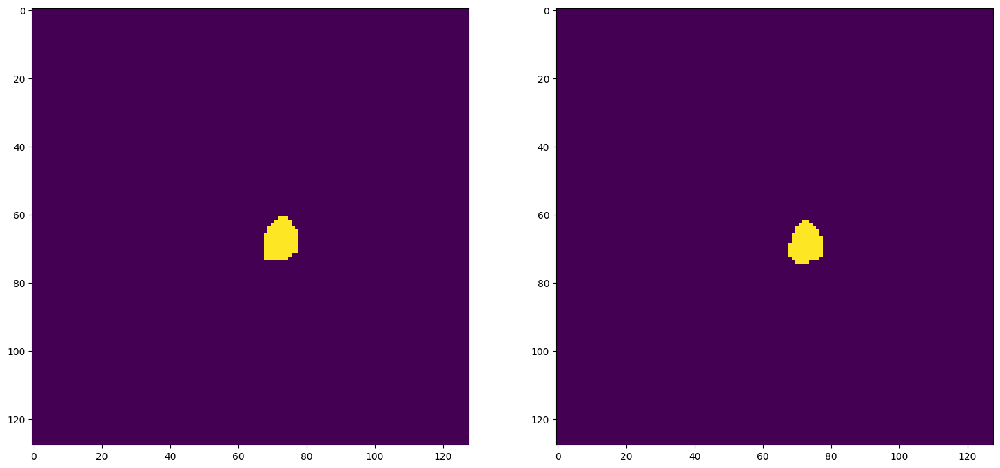

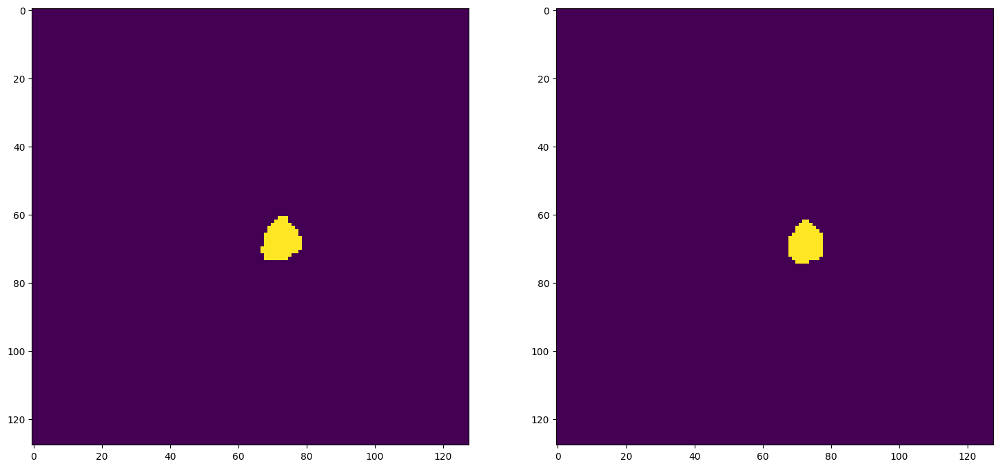

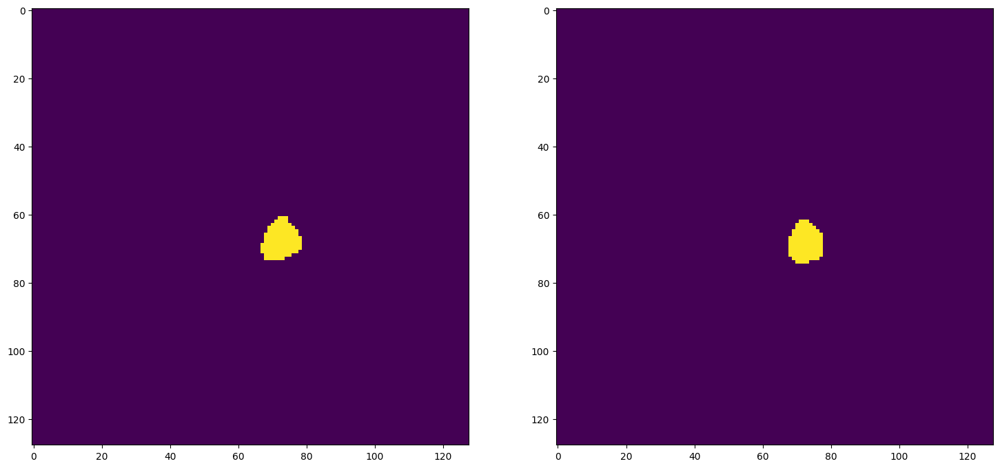

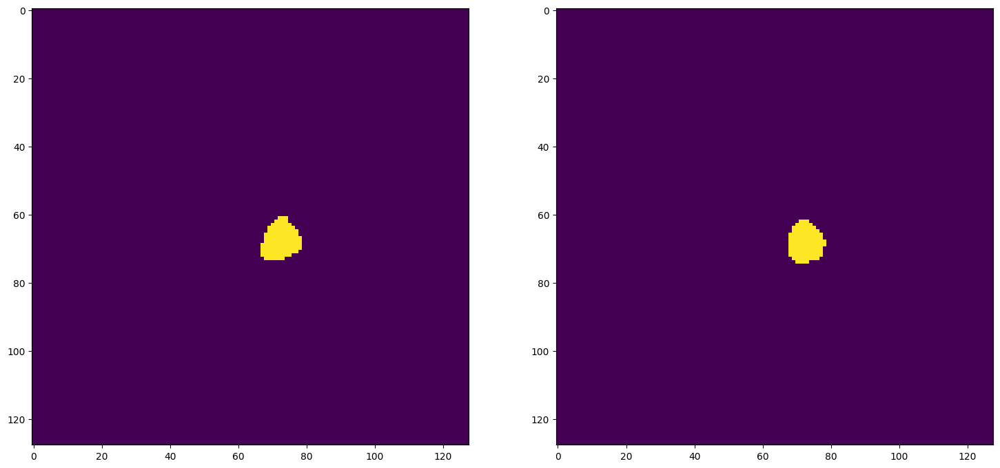

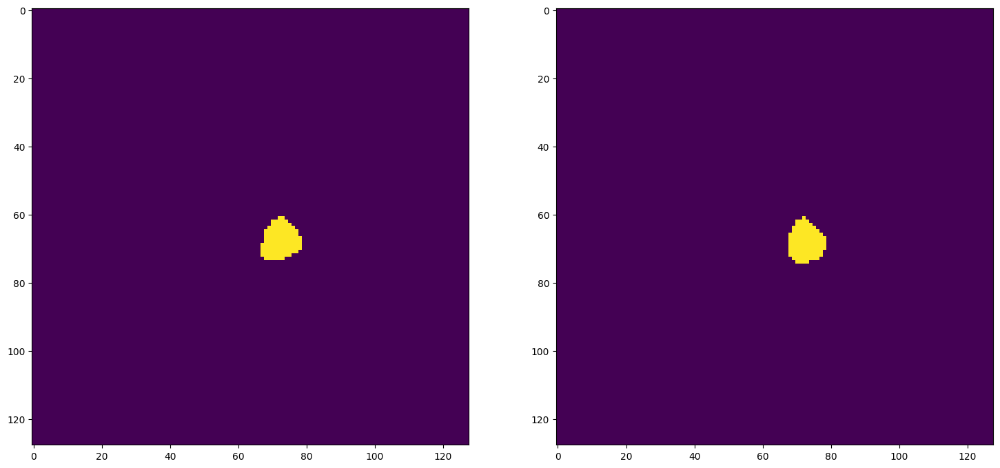

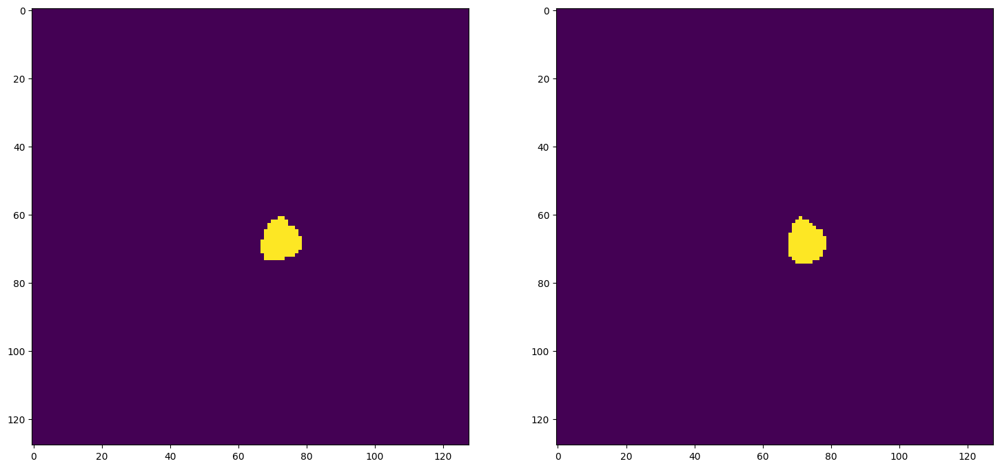


pancreas_046_008
Mean Value: 0.4662487804889679
0.5816847479259732
0.7355255194674198

pancreas_046_016
Mean Value: 0.4979284703731537
0.5046923879040668
0.6708246708246708

pancreas_046_024
Mean Value: 0.4999758005142212
0.49773941635840524
0.6646542261251372

pancreas_050_000
Mean Value: 0.49349114298820496
0.7114456120420335
0.8313972784600067

pancreas_050_008
Mean Value: 0.49629220366477966
0.8008641005498822
0.8894220283533261


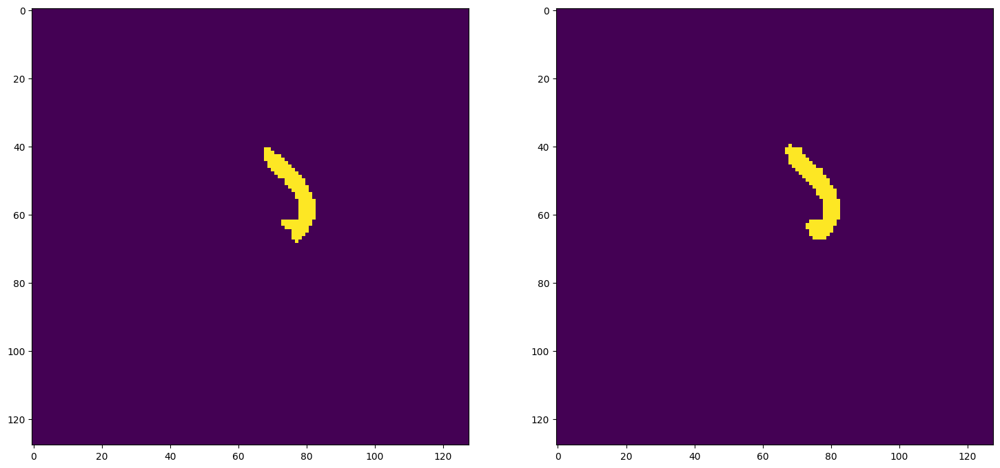

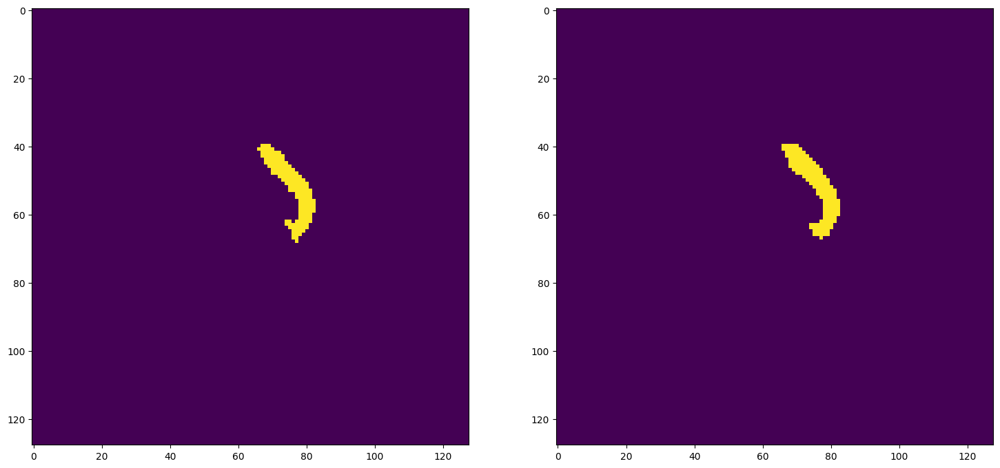

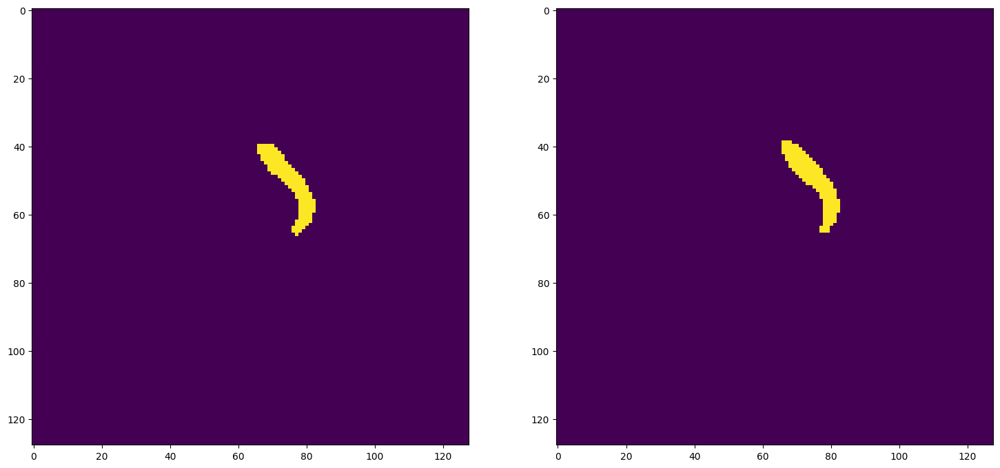

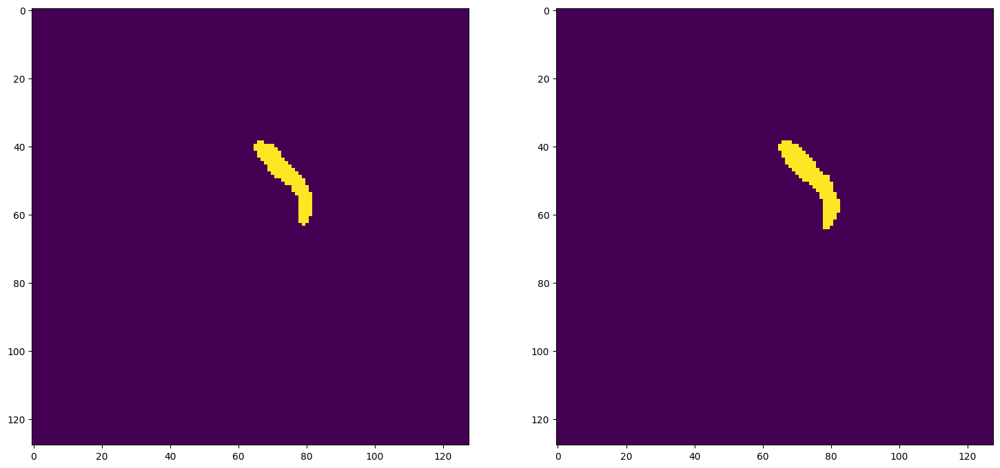

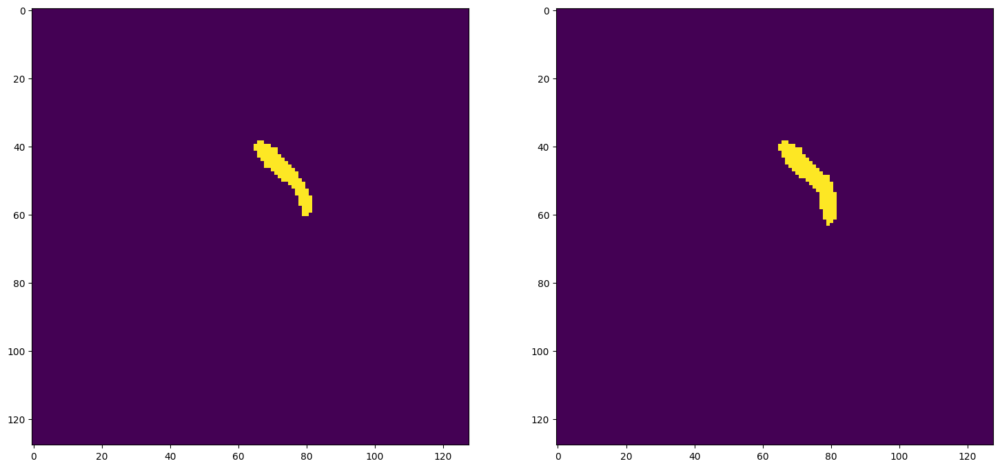

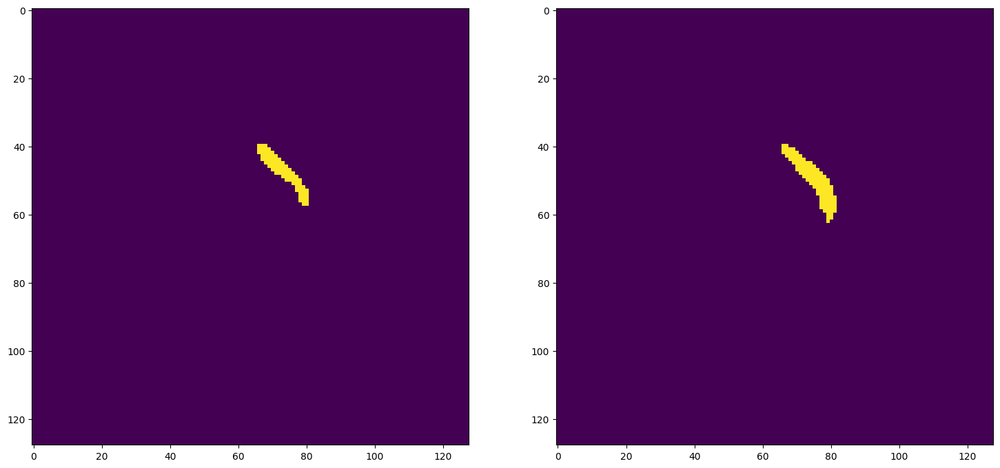


pancreas_050_016
Mean Value: 0.49503853917121887
0.6939156401642403
0.8193036579991185

pancreas_056_000
Mean Value: 0.49753227829933167
0.4095427435387674
0.5811001410437235

pancreas_056_008
Mean Value: 0.4996385872364044
0.5963393032867546
0.7471335223770189

pancreas_056_016
Mean Value: 0.49996381998062134
0.4873096446700508
0.6552901023890785

pancreas_061_000
Mean Value: 0.48435425758361816
0.43063186813186816
0.6020163226116179

pancreas_061_008
Mean Value: 0.49435877799987793
0.0972199374897187
0.17721139430284857

pancreas_061_016
Mean Value: 0.4986867904663086
0.5787791626717801
0.7331983805668016

pancreas_067_000
Mean Value: 0.49608176946640015
0.6378378378378379
0.7788778877887789

pancreas_067_008
Mean Value: 0.4743419289588928
0.5872682756208465
0.7399735566328779

pancreas_067_016
Mean Value: 0.28181004524230957
0.12287480680061824
0.2188575361321404

pancreas_067_024
Mean Value: 0.49997156858444214
0.5107368421052632
0.6761426978818283

pancreas_070_016
Mean Value: 0.

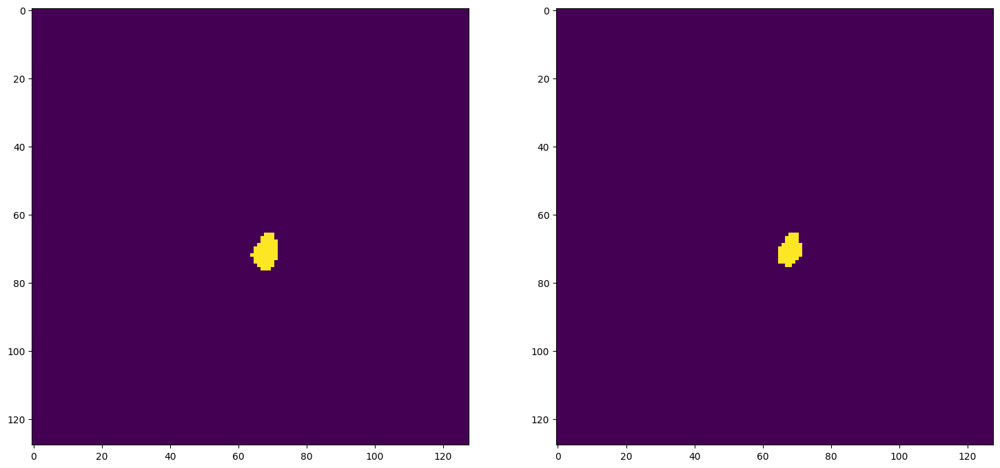

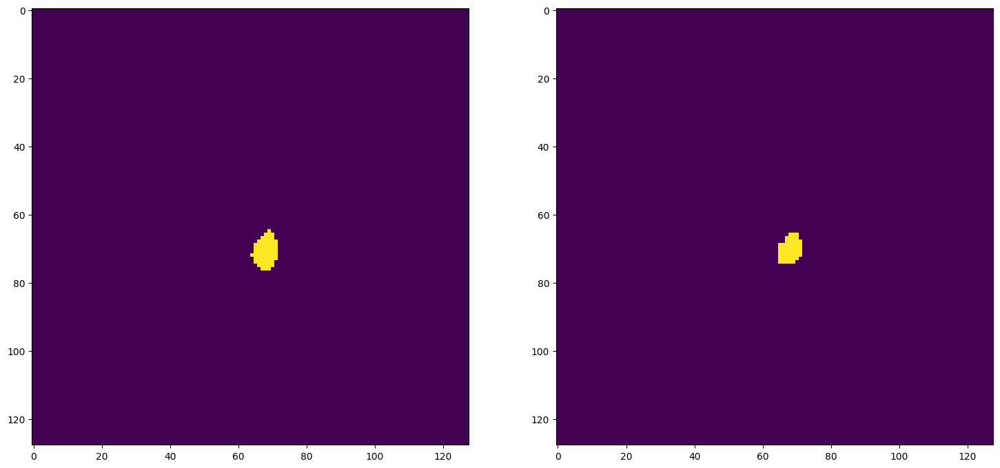

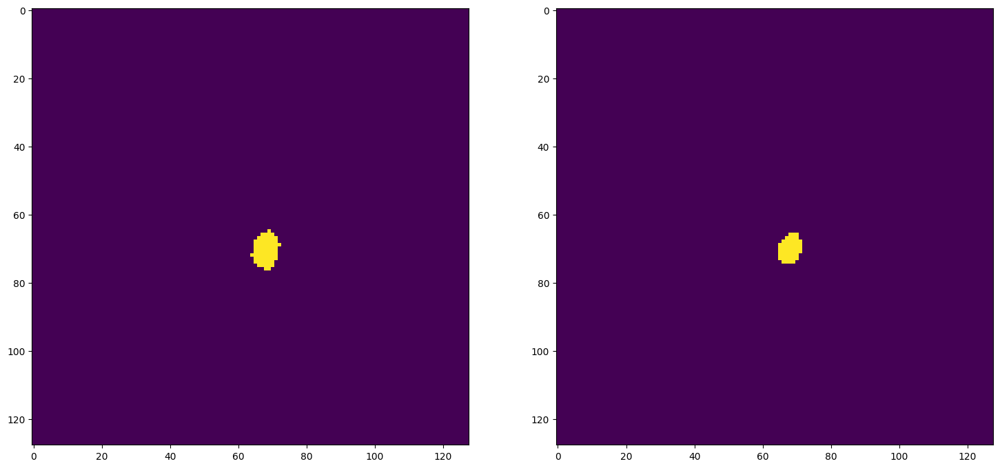

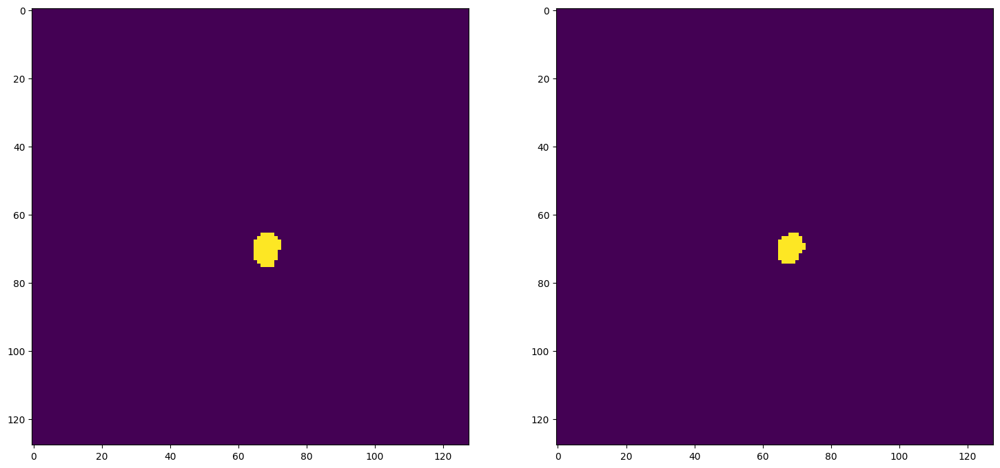

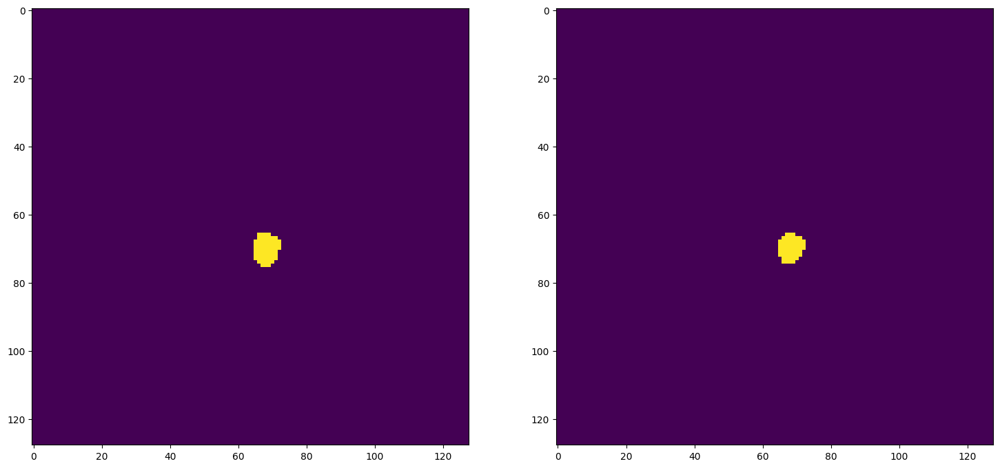

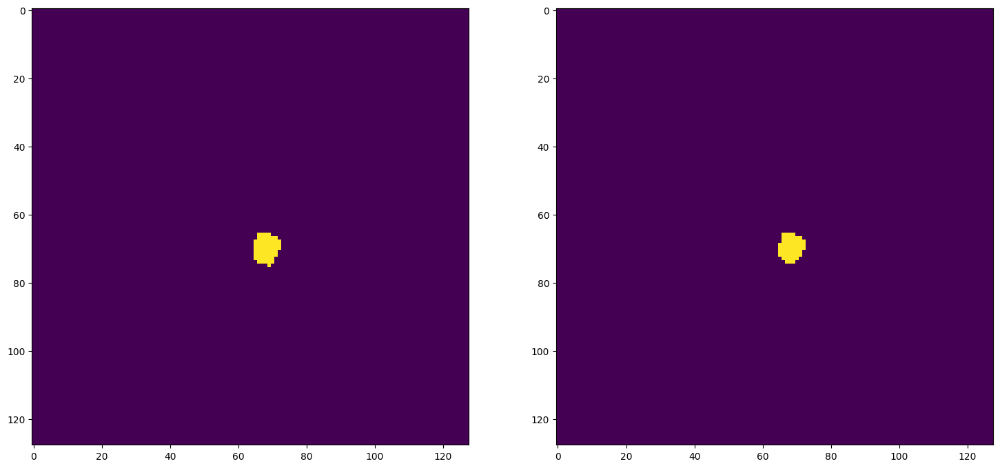


pancreas_119_008
Mean Value: 0.49710845947265625
0.6439393939393939
0.783410138248848

pancreas_119_016
Mean Value: 0.4940072000026703
0.6753916319651001
0.8062492602674872

pancreas_120_016
Mean Value: 0.49883851408958435
0.6512465373961219
0.7887938265391713

pancreas_120_024
Mean Value: 0.4823298156261444
0.7043879907621247
0.8265582655826558

pancreas_120_032
Mean Value: 0.49767571687698364
0.656140350877193
0.7923728813559322

pancreas_120_040
Mean Value: 0.4972863495349884
0.6367041198501873
0.7780320366132724

pancreas_124_000
Mean Value: 0.4977748394012451
0.5223642172523961
0.6862539349422875

pancreas_124_008
Mean Value: 0.4931613802909851
0.3011525853864862
0.46290125965054857

pancreas_124_016
Mean Value: 0.4872216284275055
0.763177570093458
0.8656842997985794


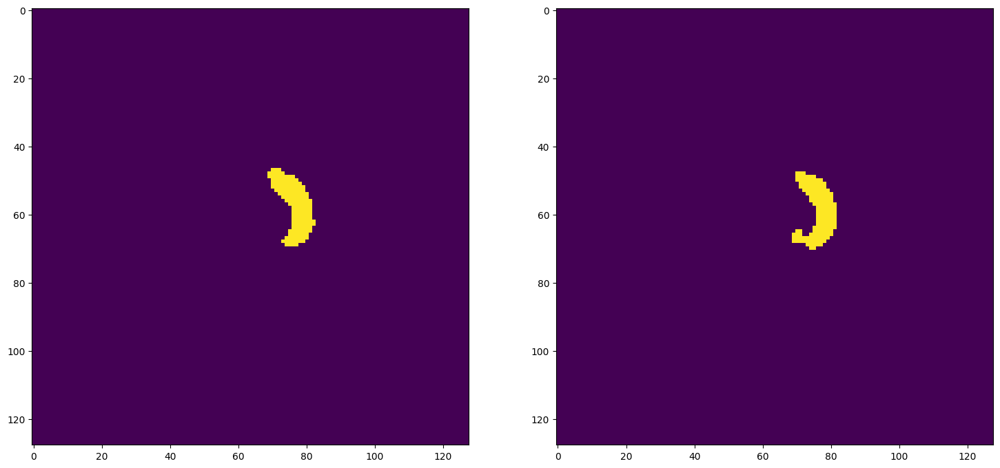

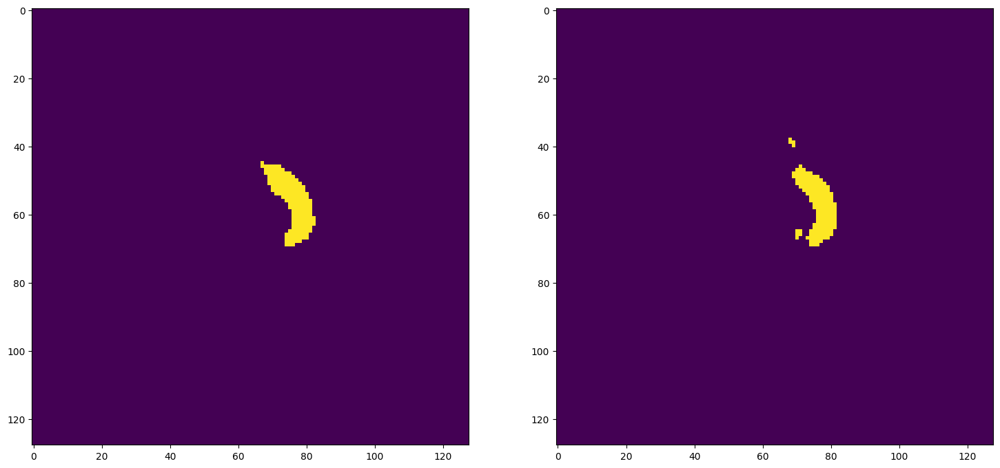

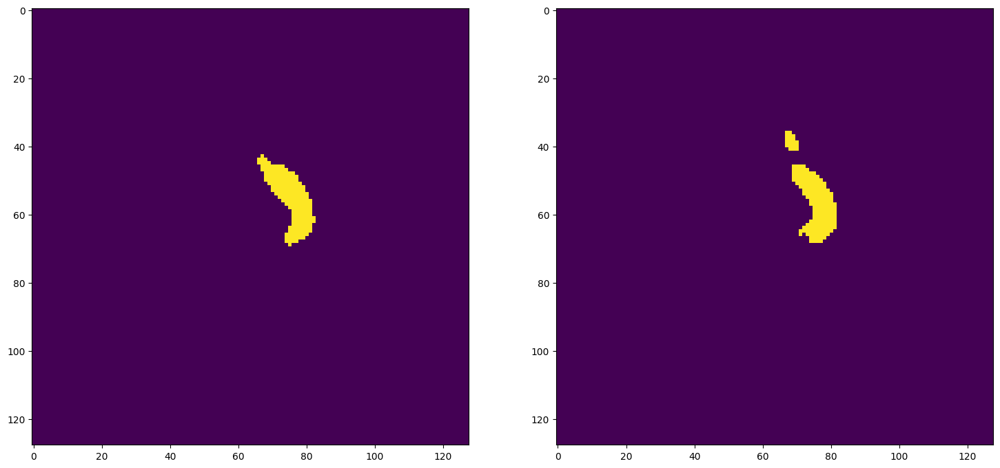

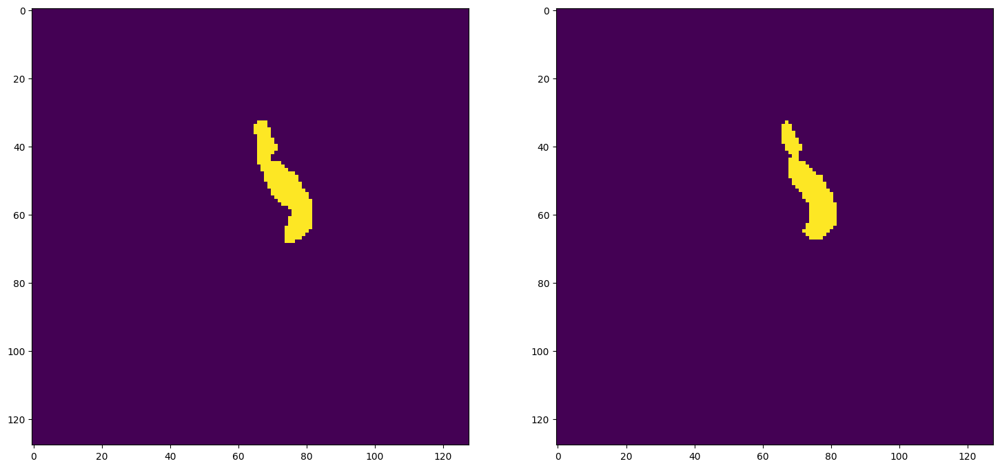

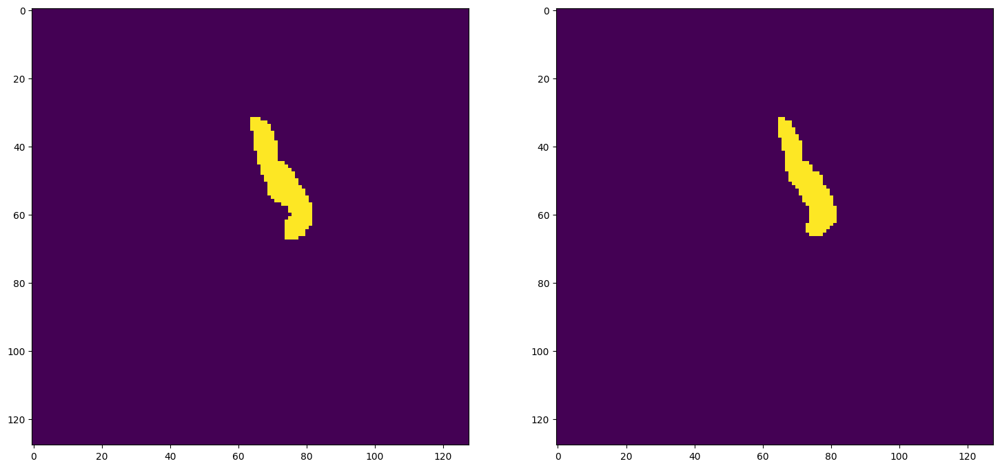

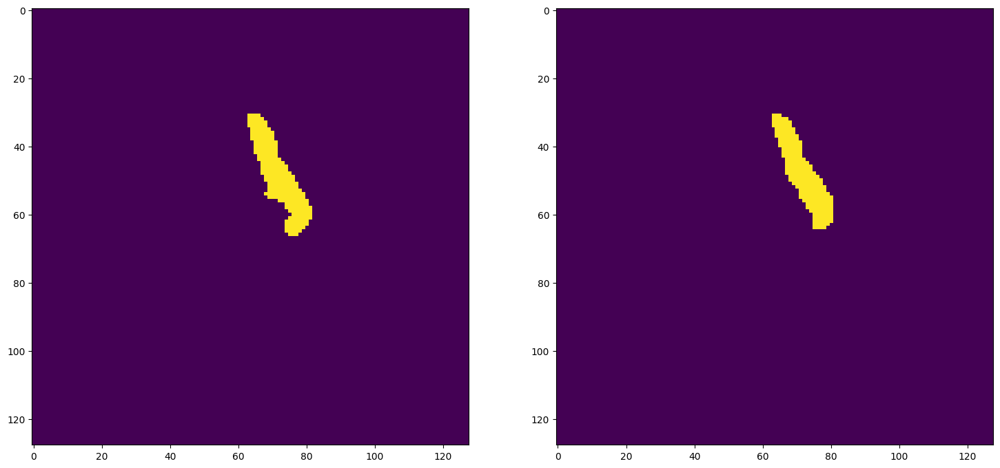


pancreas_125_000
Mean Value: 0.4978940188884735
0.32555425904317387
0.49119718309859156

pancreas_125_008
Mean Value: 0.4989292323589325
0.5376751230594472
0.6993351391282935

pancreas_125_016
Mean Value: 0.49774235486984253
0.7008004416229644
0.8240830899058748

pancreas_145_000
Mean Value: 0.49706217646598816
0.6731259561448241
0.8046327339225846

pancreas_145_008
Mean Value: 0.497963011264801
0.518796992481203
0.6831683168316832

pancreas_149_000
Mean Value: 0.49439969658851624
0.6512321144674086
0.788783247081478

pancreas_155_000
Mean Value: 0.4609033465385437
0.598750433877126
0.7490230134607034

pancreas_155_008
Mean Value: 0.44650304317474365
0.6122922303826827
0.759530088707744

pancreas_155_016
Mean Value: 0.4968244135379791
0.3008464328899637
0.46253950548429074

pancreas_155_024
Mean Value: 0.49866288900375366
0.6305900037579857
0.7734501037105324

pancreas_173_000
Mean Value: 0.47519952058792114
0.6826265389876881
0.8113821138211382

pancreas_173_008
Mean Value: 0.4936147

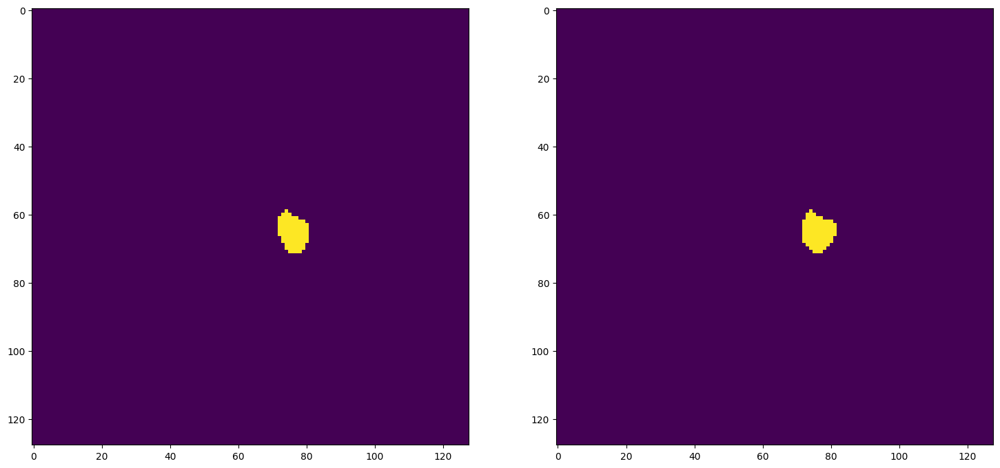

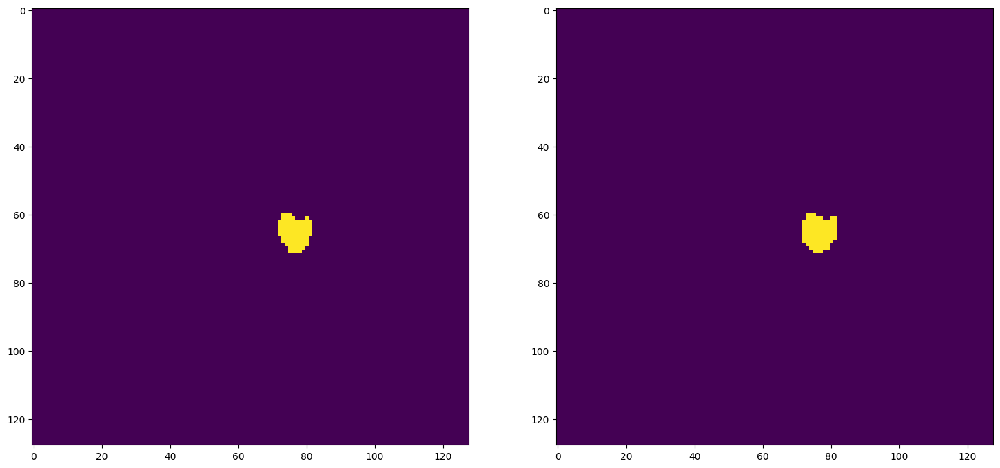

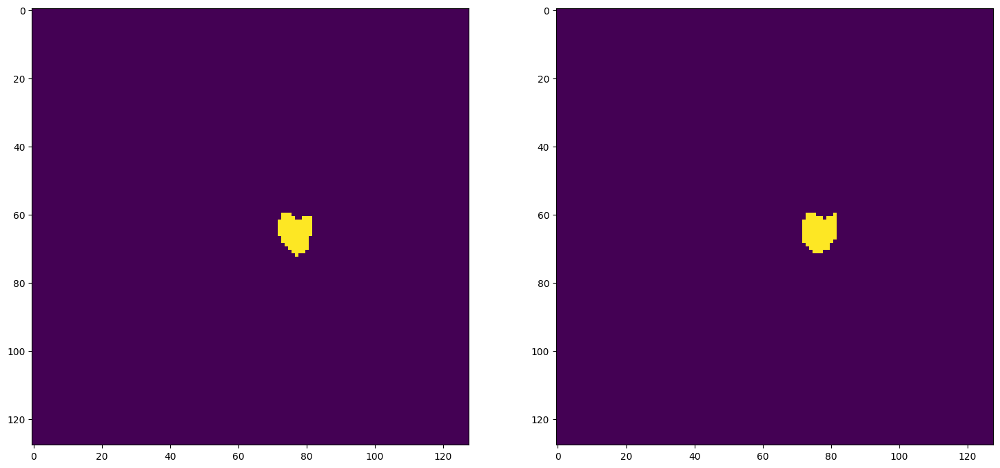

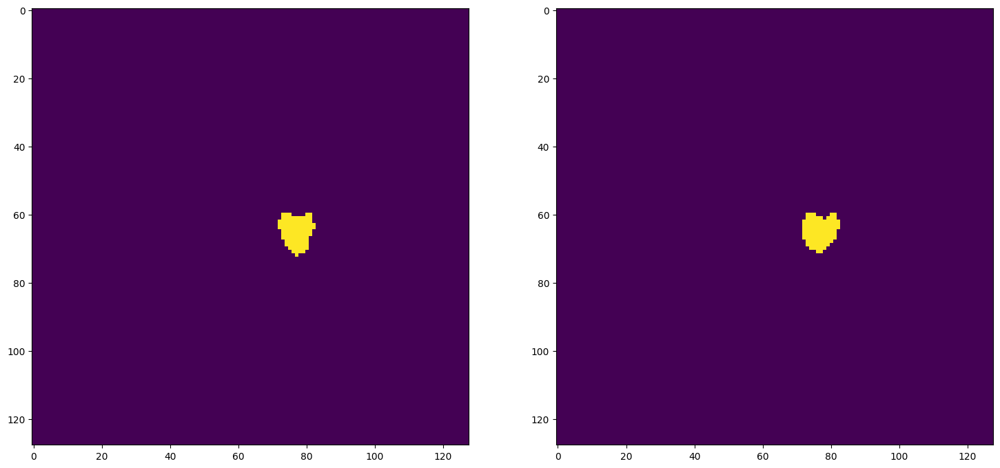

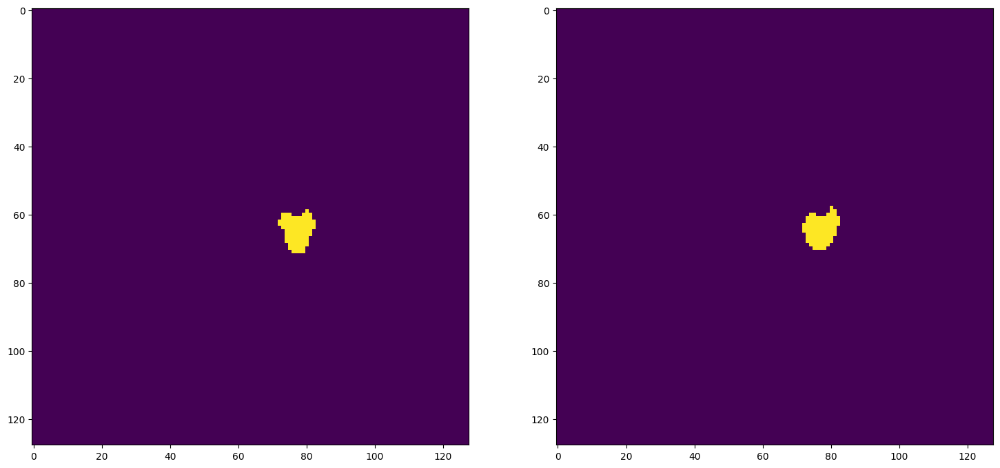

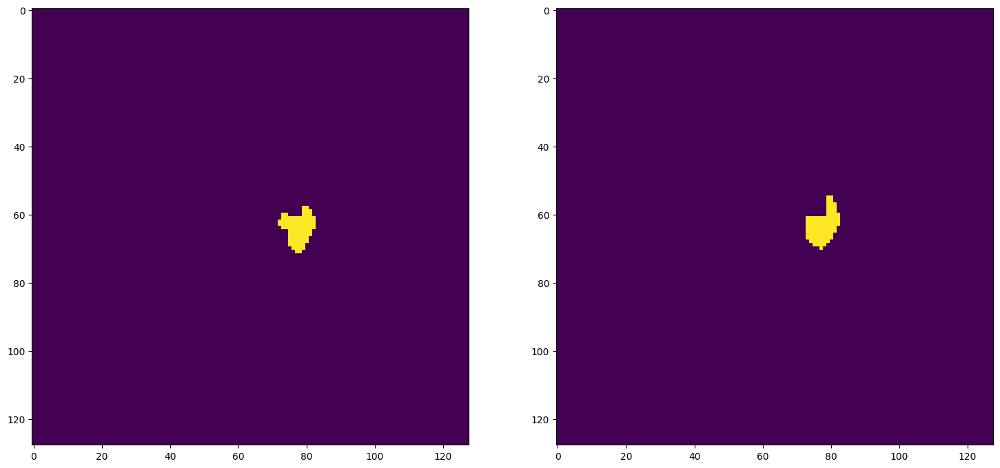


pancreas_212_016
Mean Value: 0.4949903190135956
0.37746031746031744
0.5480525466697396

pancreas_212_024
Mean Value: 0.49031510949134827
0.459211732355637
0.6293969849246231

pancreas_212_032
Mean Value: 0.481279581785202
0.8098245614035088
0.8949205118262893


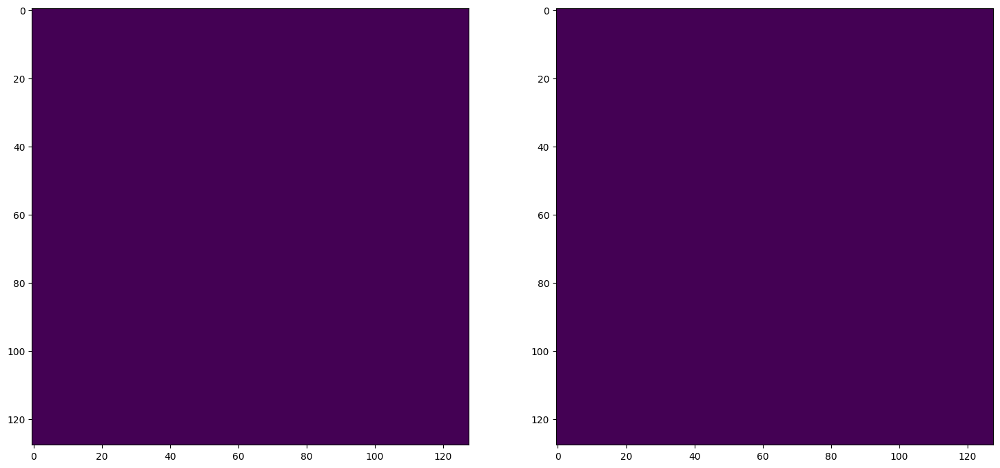

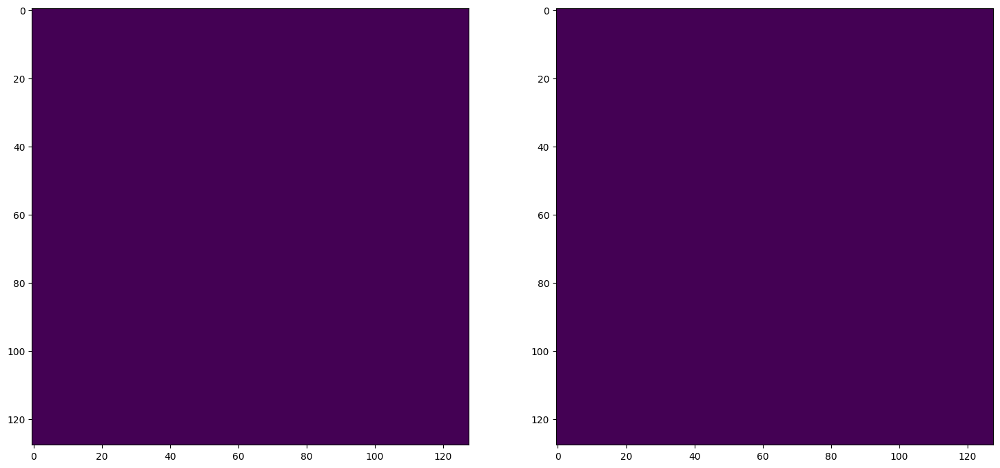

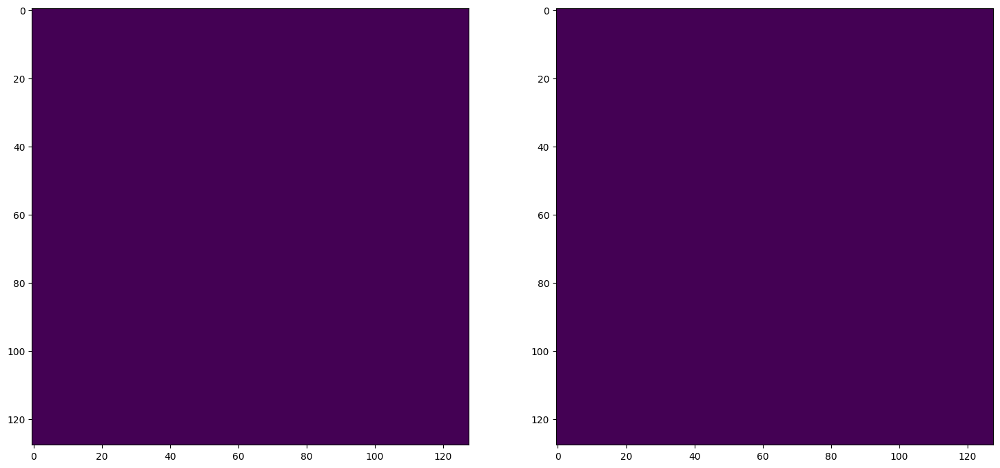

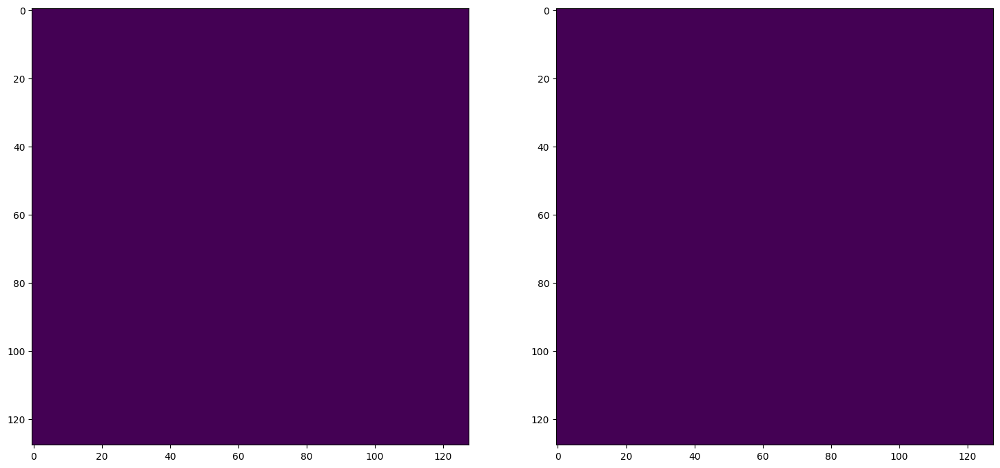

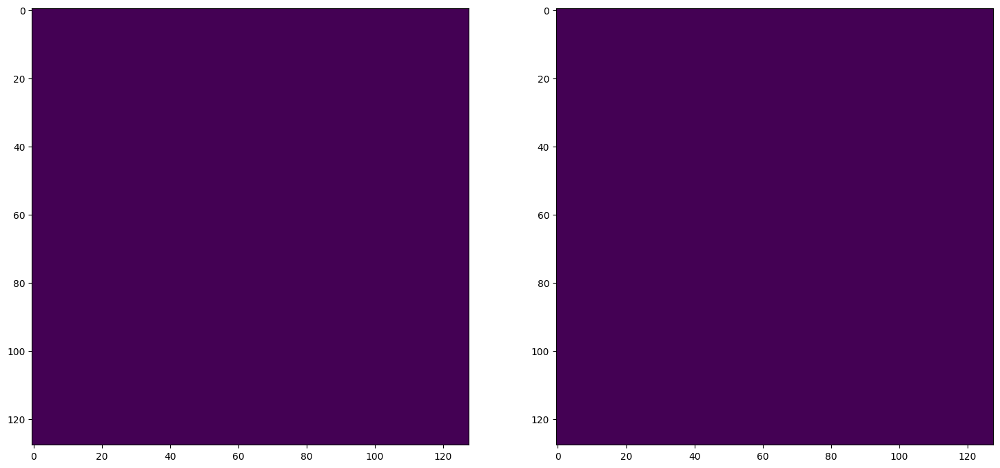

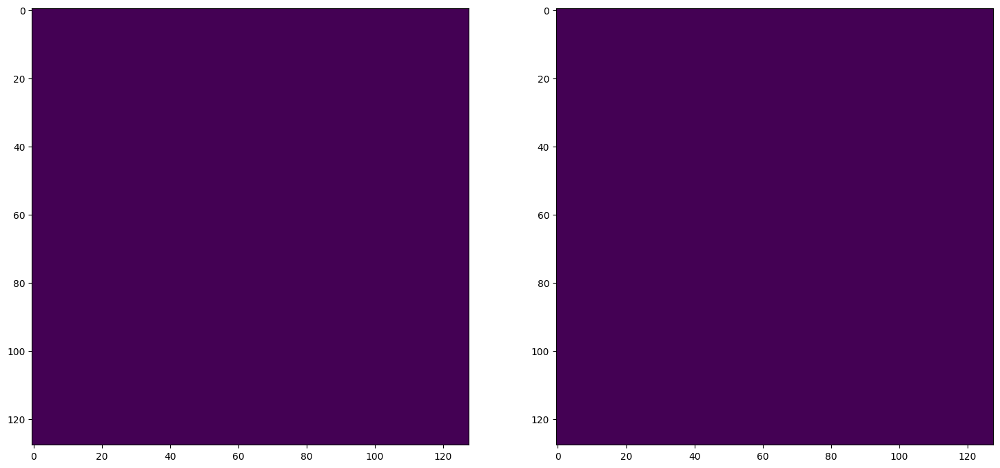


pancreas_213_000
Mean Value: 0.4491015374660492
0.5701384708007224
0.7262269938650306

pancreas_213_008
Mean Value: 0.4919557571411133
0.7159763313609467
0.8344827586206897

pancreas_213_016
Mean Value: 0.49714723229408264
0.7191736604260813
0.8366503942921517

pancreas_213_024
Mean Value: 0.4924037456512451
0.7721123829344433
0.8714034057545508


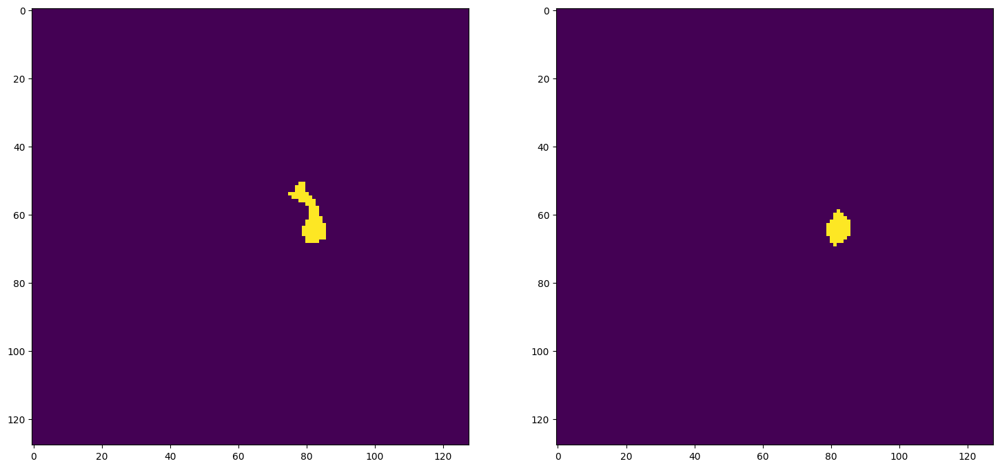

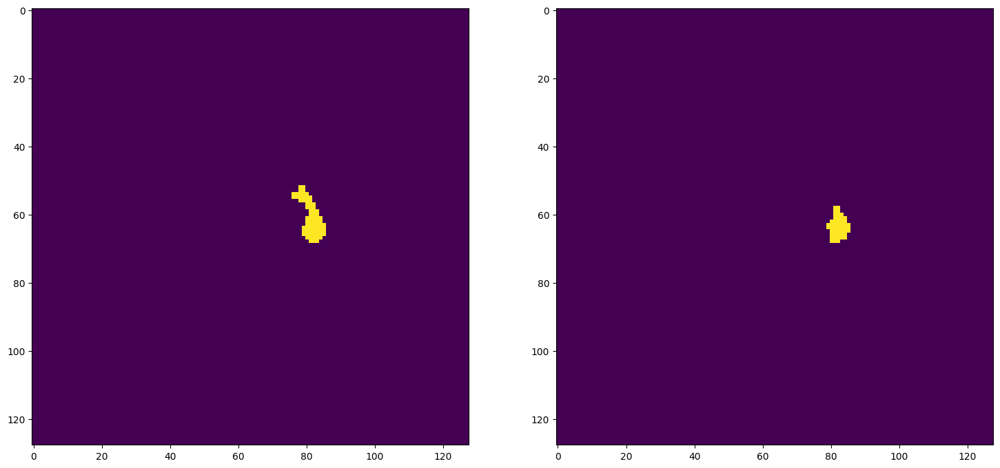

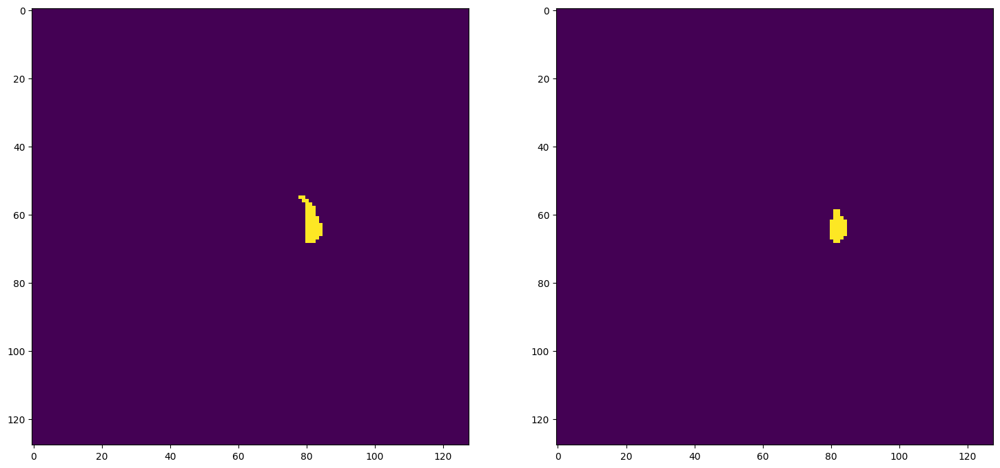

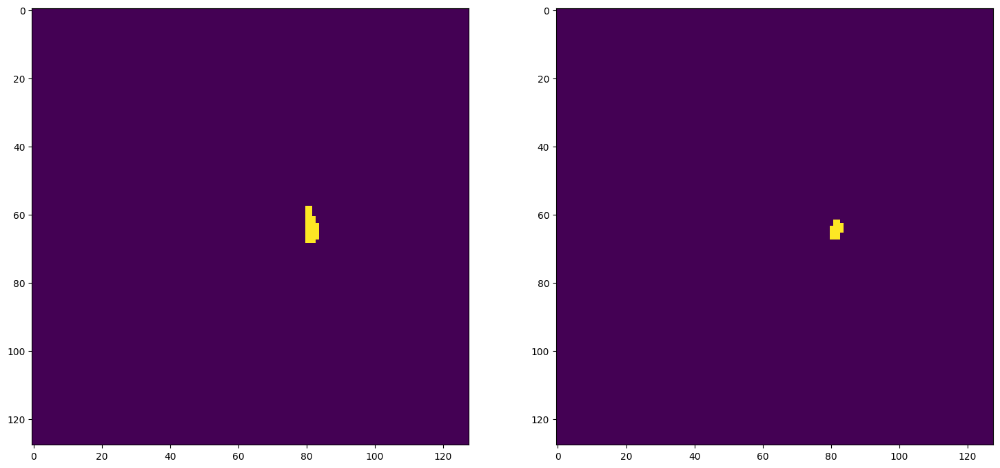

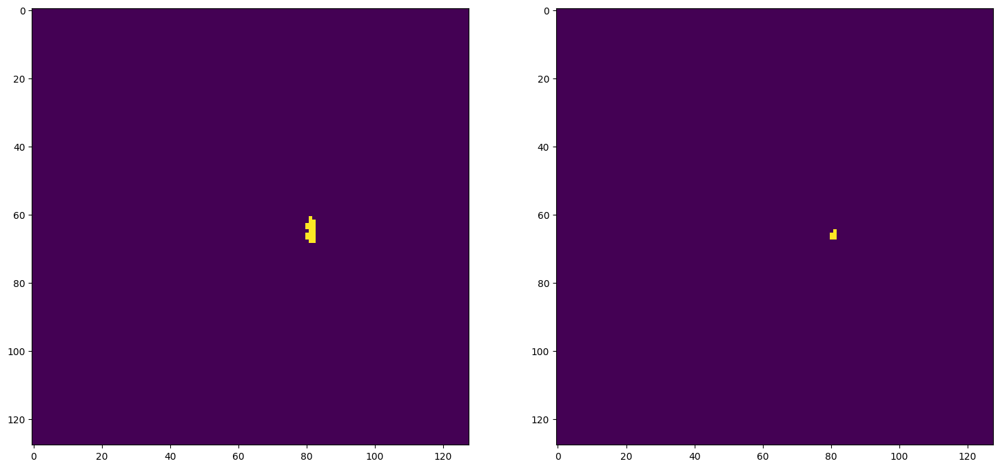

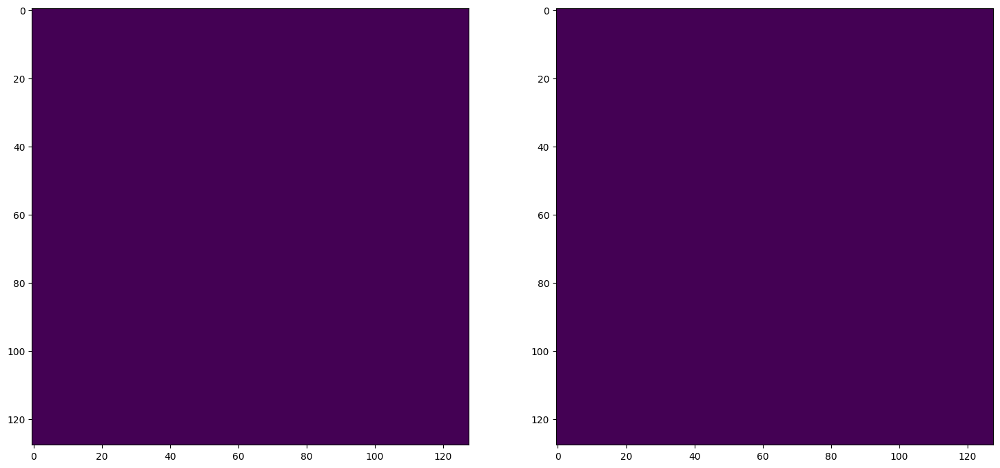


pancreas_214_008
Mean Value: 0.497778981924057
0.7
0.8235294117647058

pancreas_214_016
Mean Value: 0.49246788024902344
0.3024390243902439
0.46441947565543074

pancreas_214_024
Mean Value: 0.4974750876426697
0.43027638190954776
0.6016688625384278

pancreas_214_032
Mean Value: 0.4963761568069458
0.2935334872979215
0.45384752722728083

pancreas_217_000
Mean Value: 0.4948561191558838
0.5311023622047244
0.6937516070969401

pancreas_217_008
Mean Value: 0.49959155917167664
0.5978562921794363
0.7483229813664596

pancreas_217_016
Mean Value: 0.38628655672073364
0.5567883800685899
0.7153038745626539

pancreas_217_024
Mean Value: 0.49705809354782104
0.6424408639012684
0.7823001461072845

pancreas_217_032
Mean Value: 0.49570655822753906
0.824390243902439
0.9037433155080213


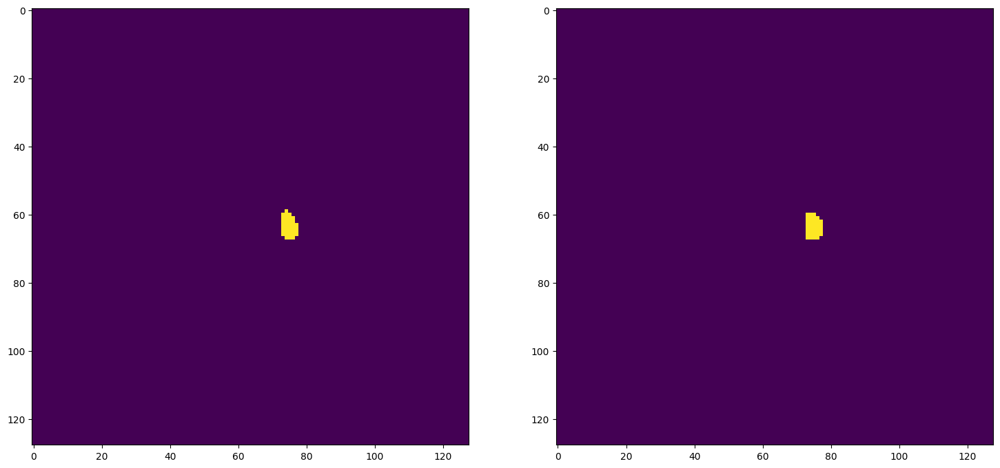

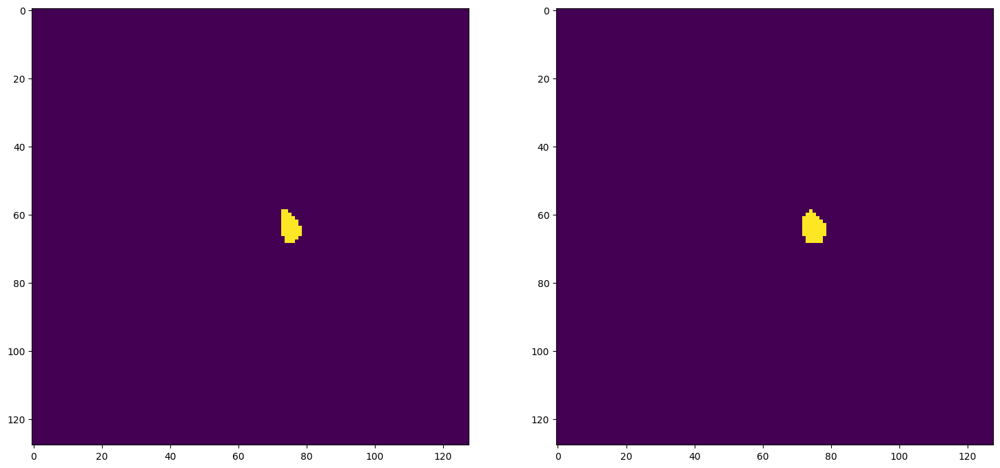

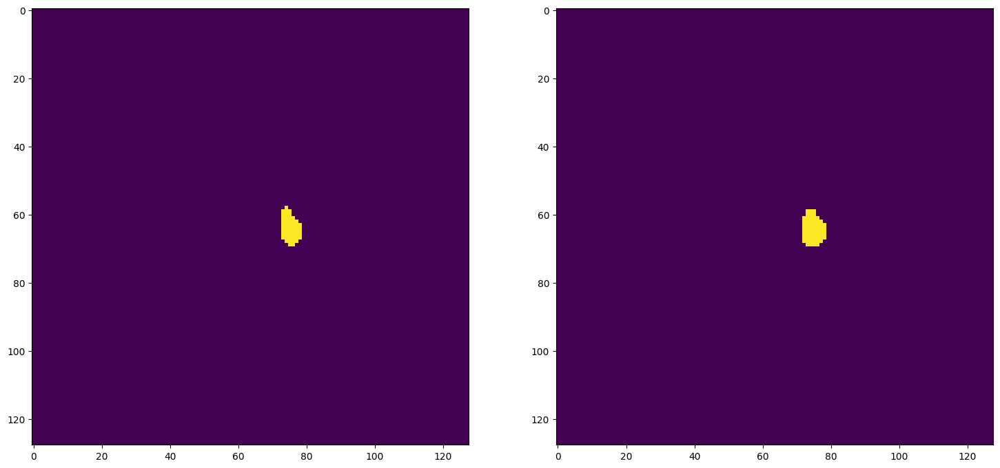

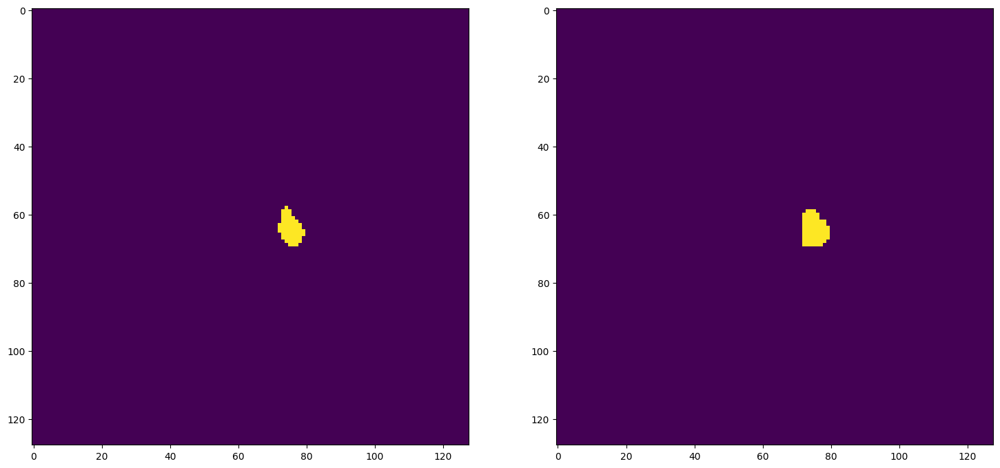

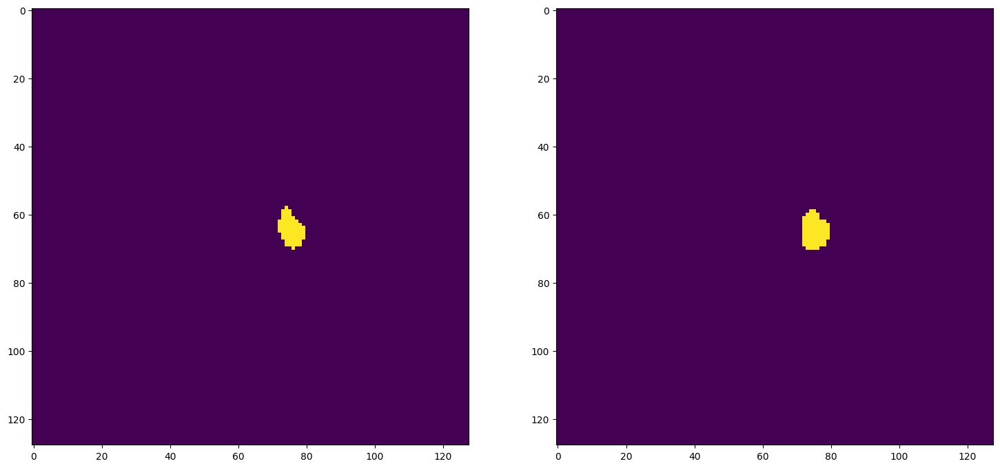

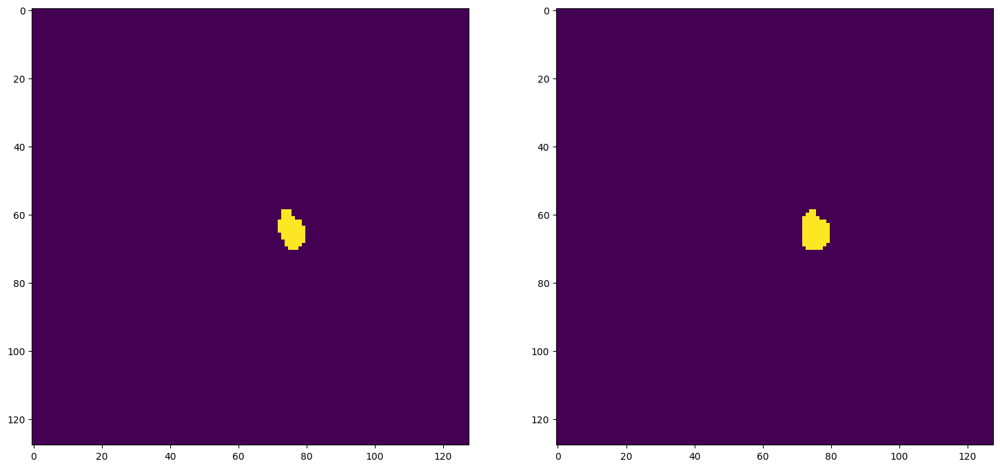


pancreas_218_000
Mean Value: 0.491474986076355
0.4128228782287823
0.5843943845902709

pancreas_218_008
Mean Value: 0.49959811568260193
0.6226294481142126
0.7674326986211425

pancreas_218_016
Mean Value: 0.49237802624702454
0.7896362388469458
0.8824544582933844


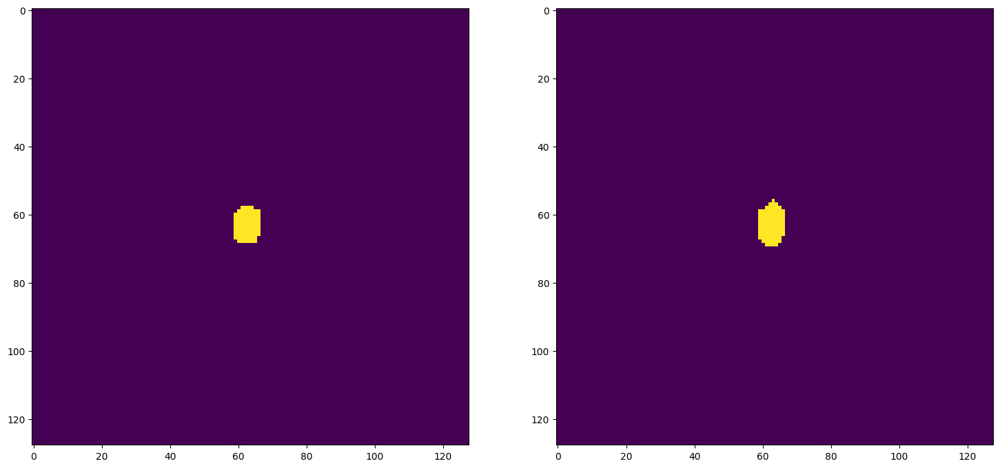

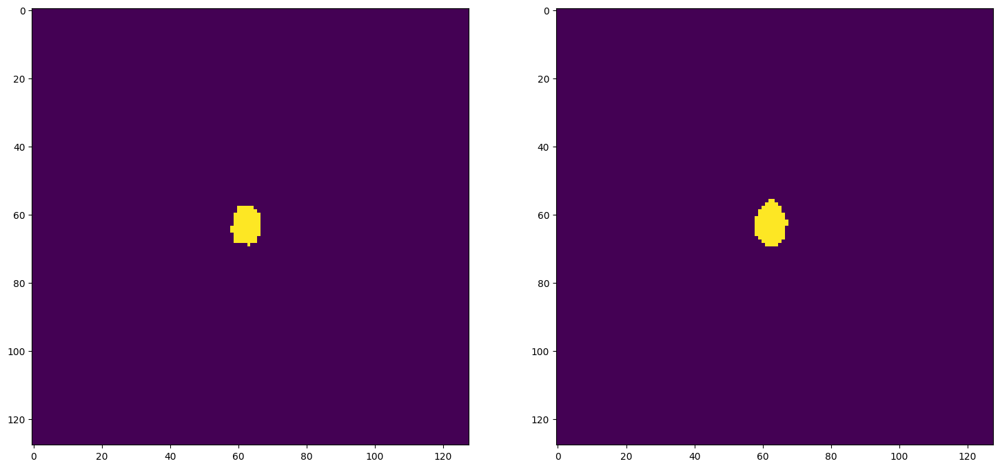

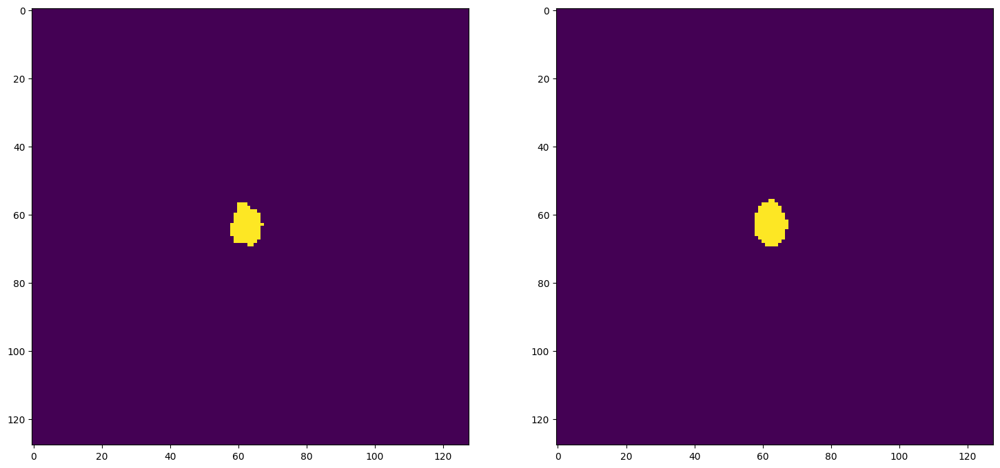

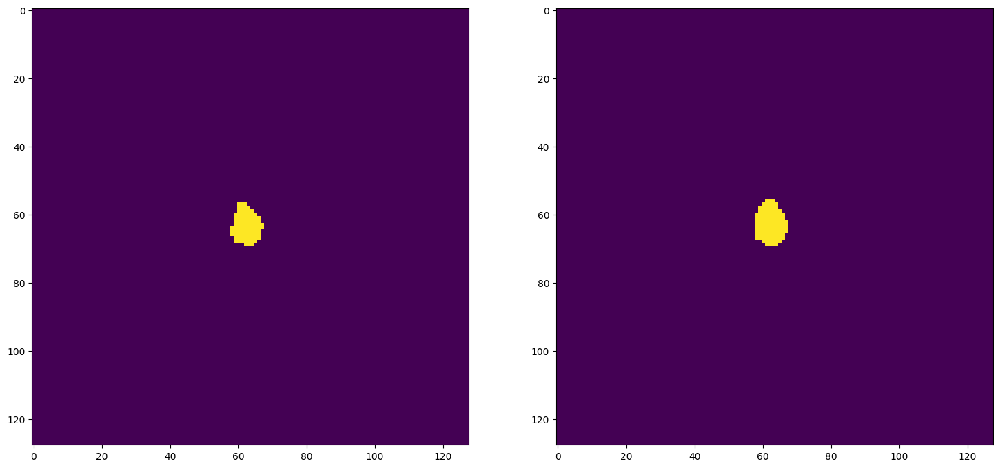

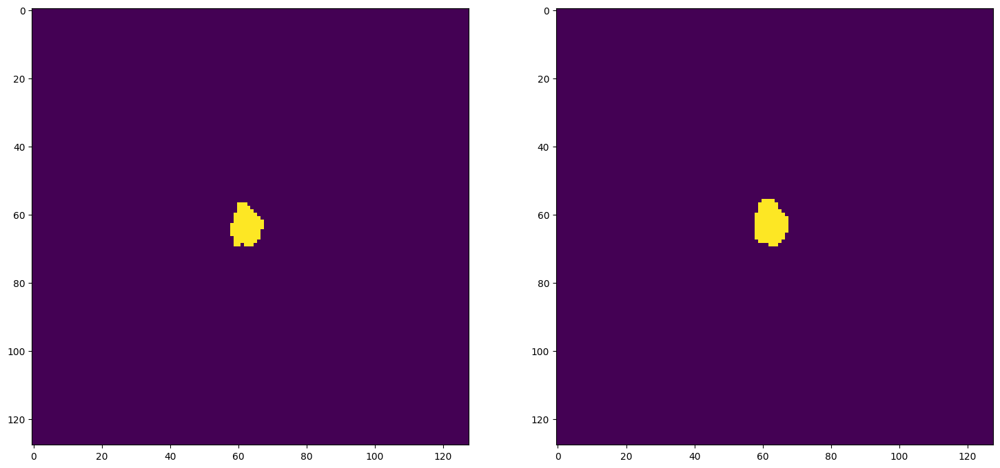

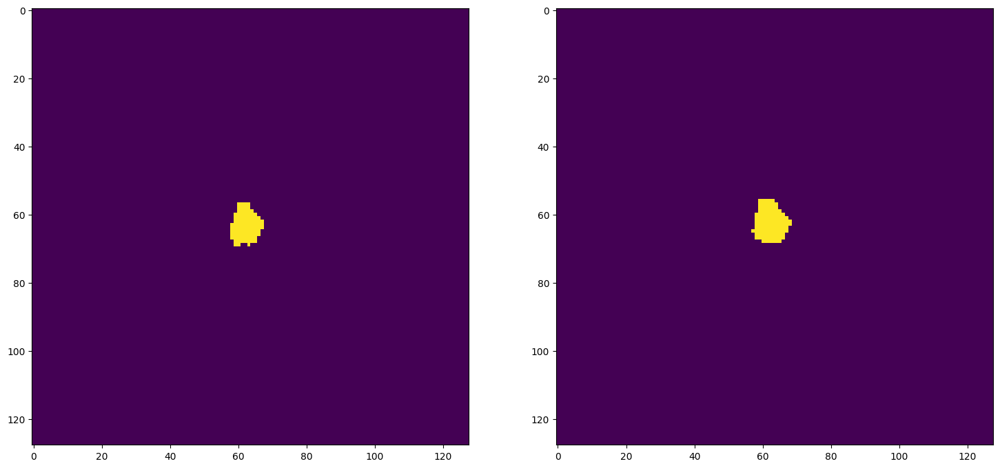


pancreas_218_024
Mean Value: 0.4688100814819336
0.6693620844564241
0.8019375672766416

pancreas_222_000
Mean Value: 0.493617445230484
0.322790294627383
0.48804454634785455

pancreas_222_008
Mean Value: 0.46698904037475586
0.7134906500445236
0.8327919968819021

pancreas_224_008
Mean Value: 0.49507686495780945
0.701824401368301
0.8247906197654942

pancreas_224_016
Mean Value: 0.46777763962745667
0.553556827473426
0.7126315789473684

pancreas_224_024
Mean Value: 0.4919942319393158
0.6710323574730355
0.8031350852927617

pancreas_228_016
Mean Value: 0.4818060100078583
0.6887107548430194
0.8156645569620253

pancreas_228_024
Mean Value: 0.4968956410884857
0.5224740683826354
0.6863487257128438

pancreas_228_032
Mean Value: 0.49765583872795105
0.6535714285714286
0.7904967602591793

pancreas_230_000
Mean Value: 0.49906957149505615
0.6431700517722023
0.7828405235094522

pancreas_230_008
Mean Value: 0.49145057797431946
0.7303742961245445
0.8441807044410413

pancreas_230_016
Mean Value: 0.48155289

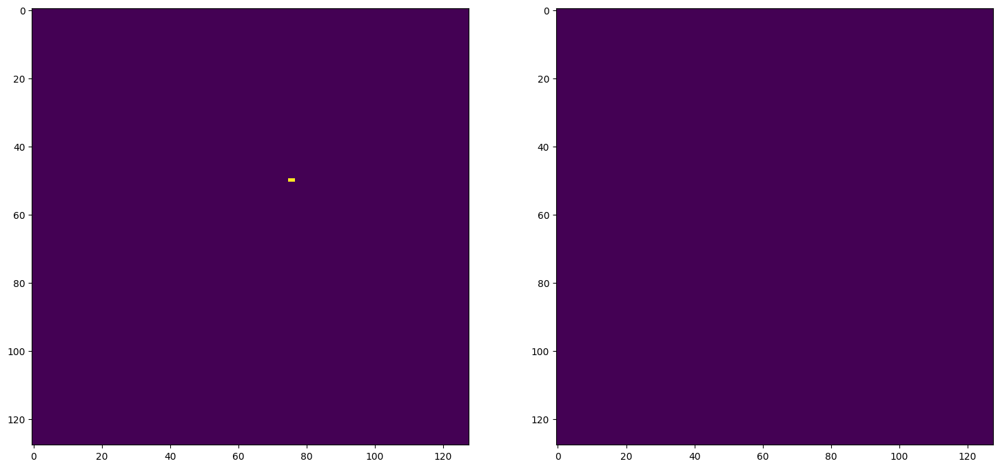

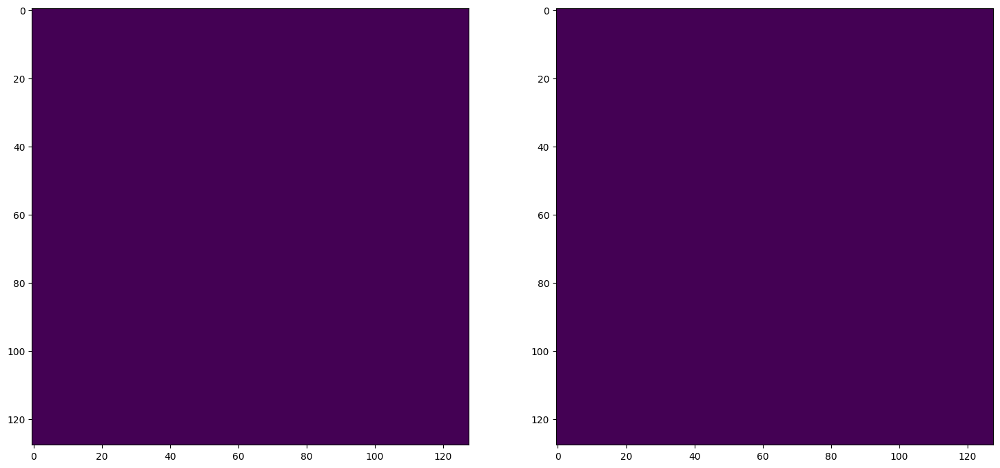

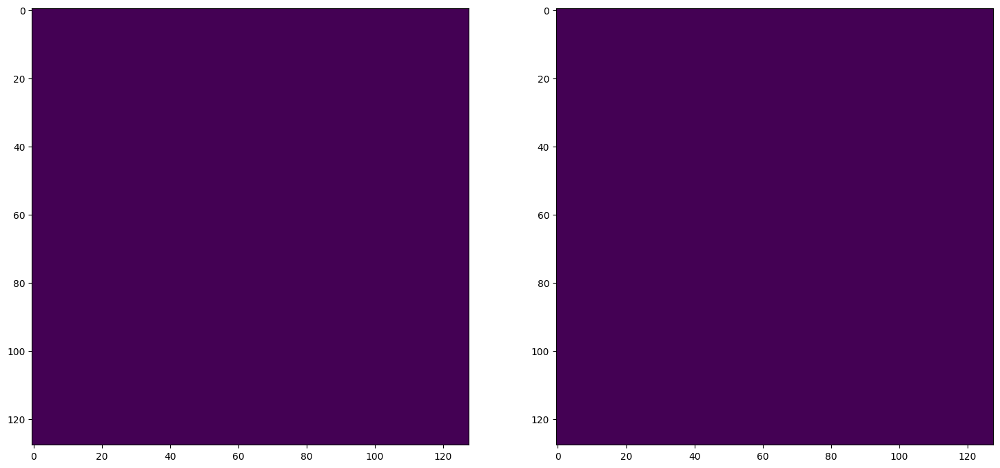

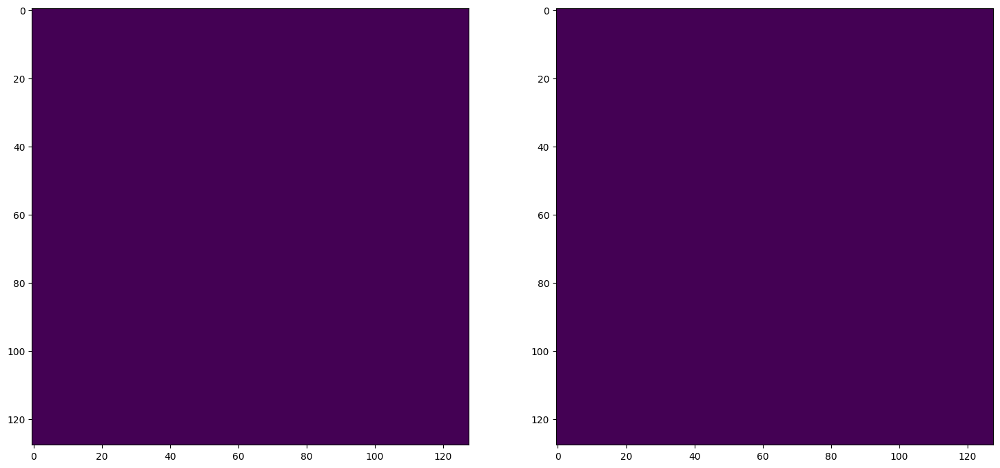

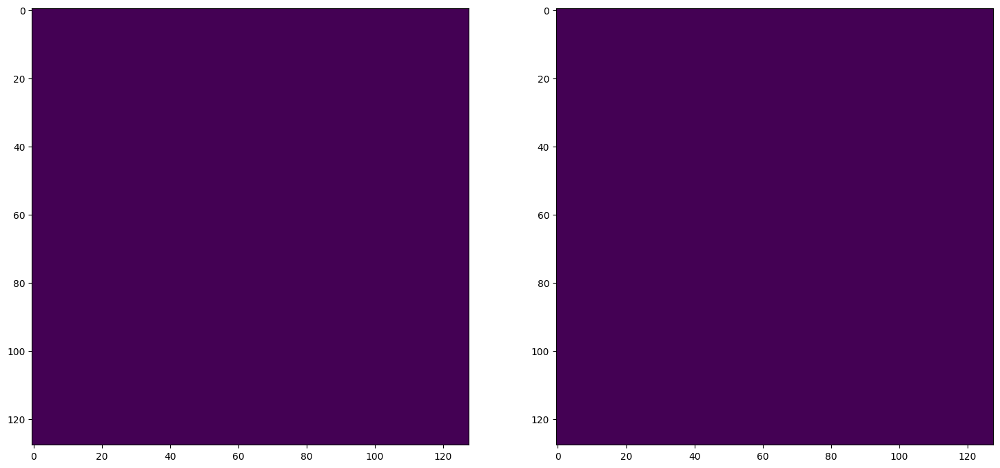

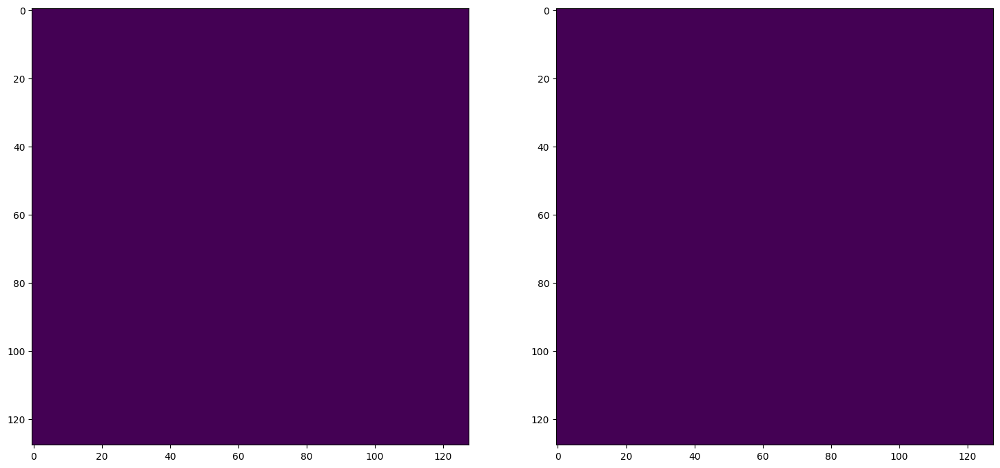


pancreas_231_008
Mean Value: 0.4778774380683899
0.6825741142443963
0.811345079501504

pancreas_231_016
Mean Value: 0.4940395653247833
0.4883861236802413
0.6562626672071342

pancreas_231_024
Mean Value: 0.49726271629333496
0.6333219528849436
0.7755016722408027

pancreas_249_008
Mean Value: 0.48816627264022827
0.7822327044025157
0.8778120864578739


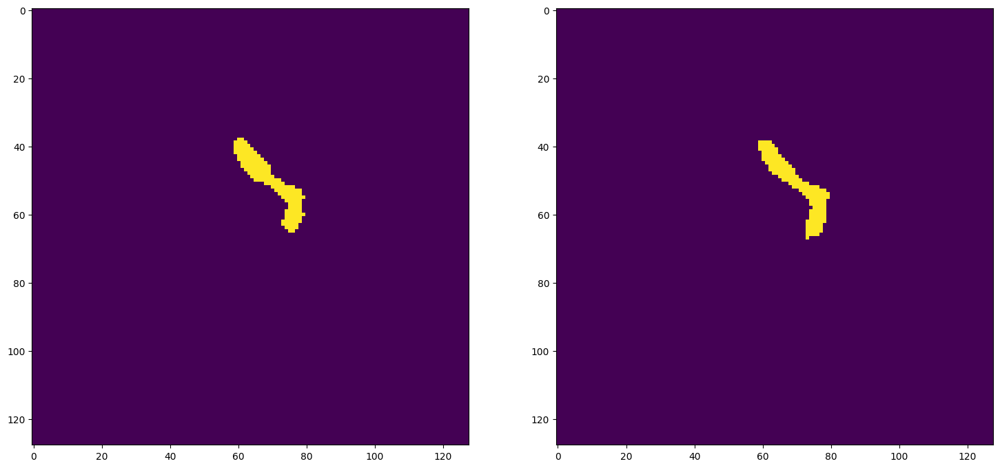

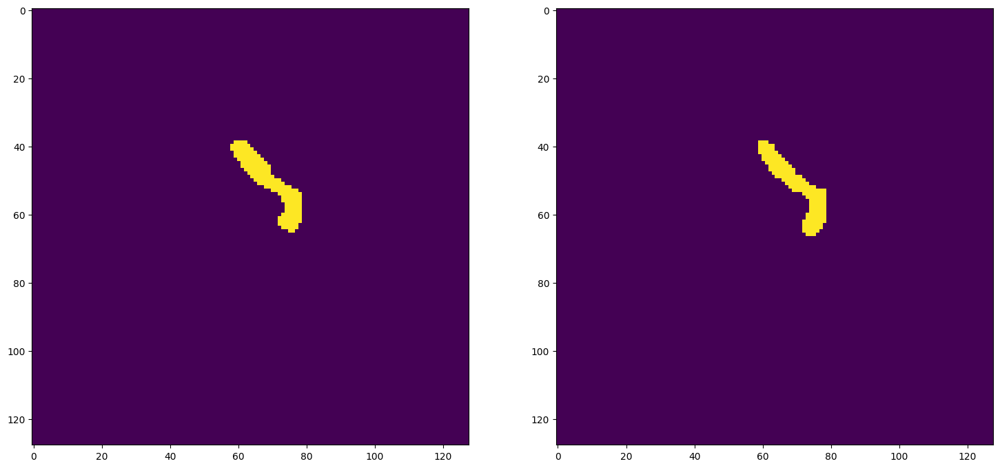

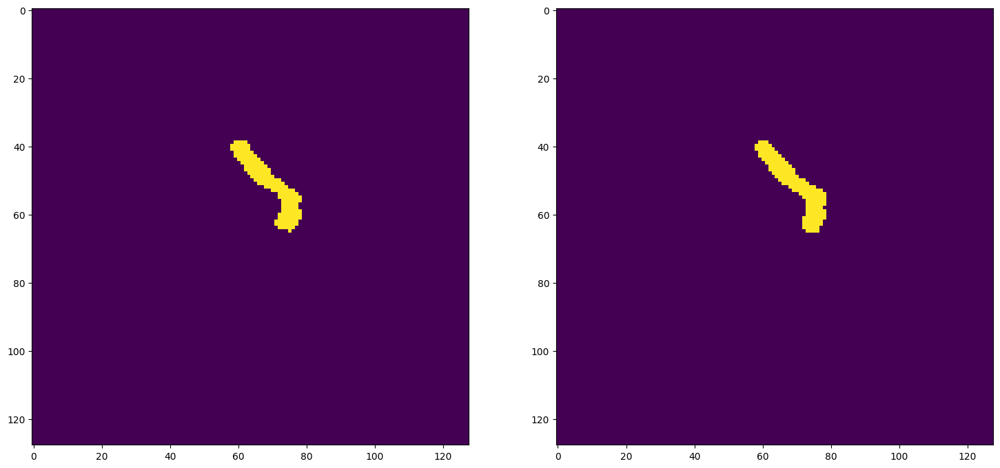

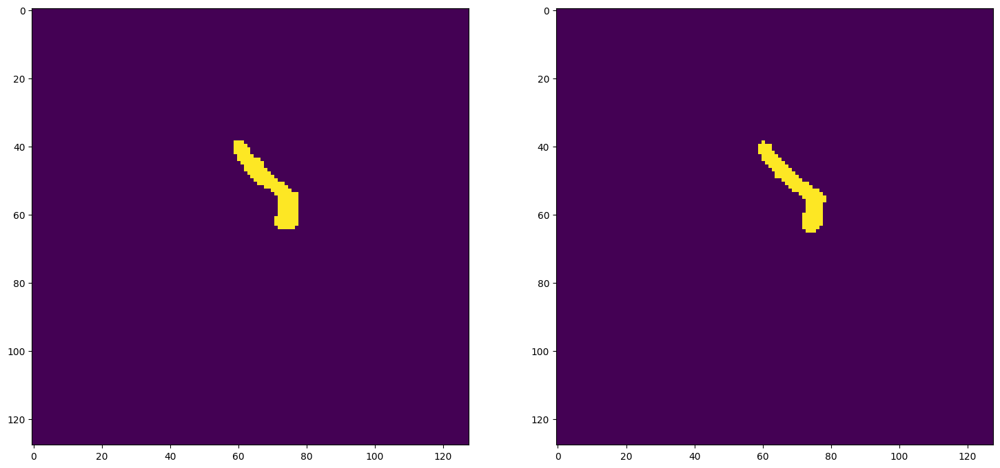

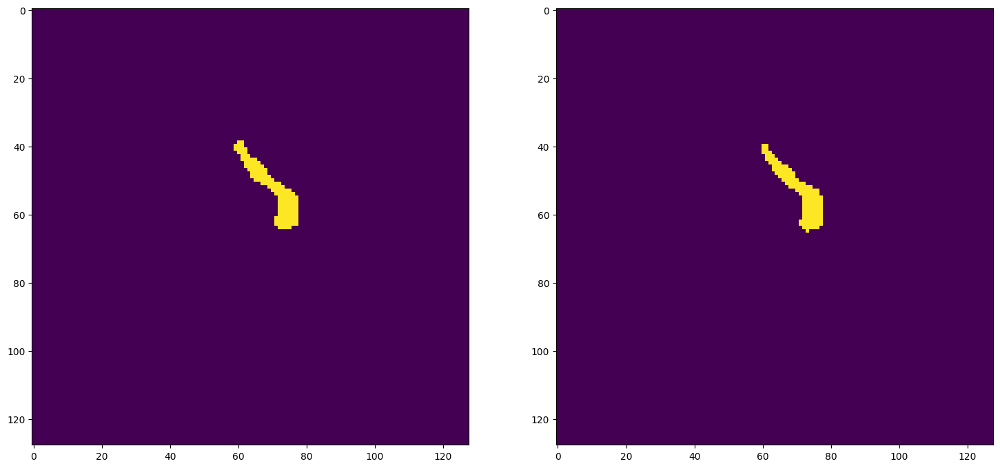

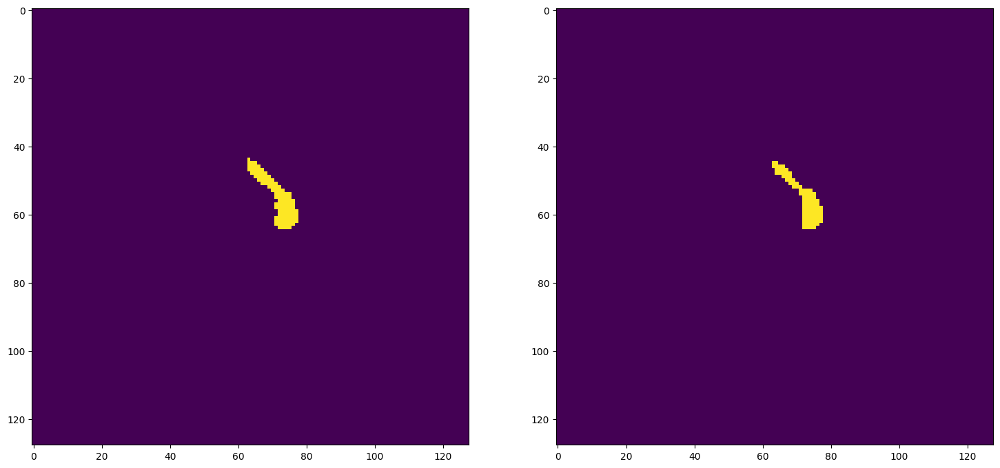


pancreas_249_016
Mean Value: 0.4608261287212372
0.46451338716532087
0.6343586767266396

pancreas_249_024
Mean Value: 0.49589210748672485
0.6274638633377135
0.7710940654016956

pancreas_249_032
Mean Value: 0.48255011439323425
0.5464684014869888
0.7067307692307693

pancreas_255_000
Mean Value: 0.4928969442844391
0.7651905252317199
0.8669778296382731


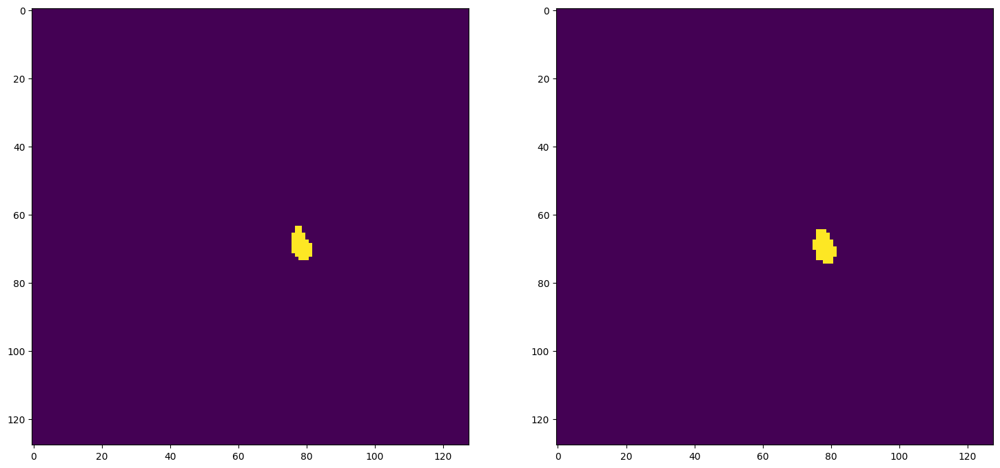

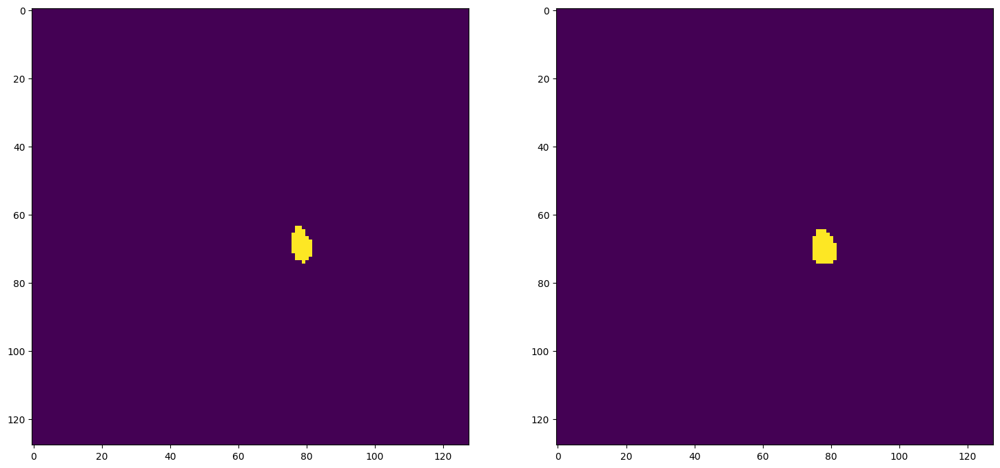

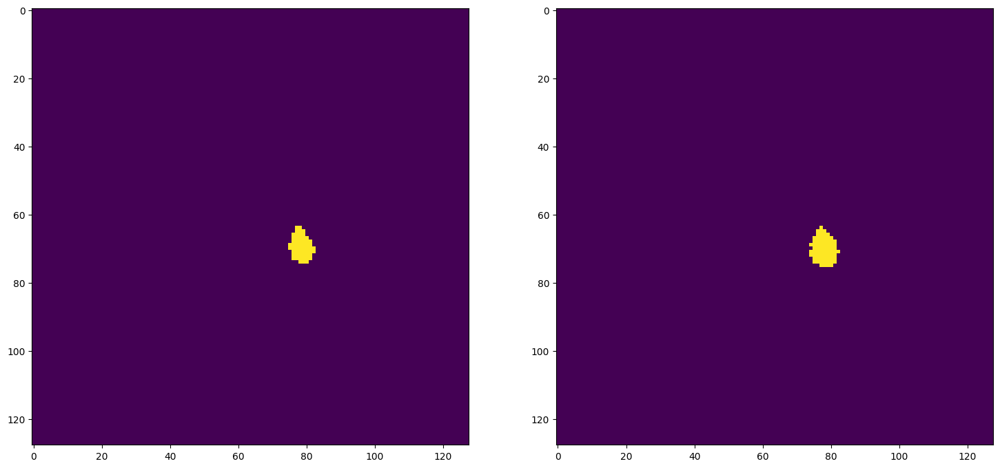

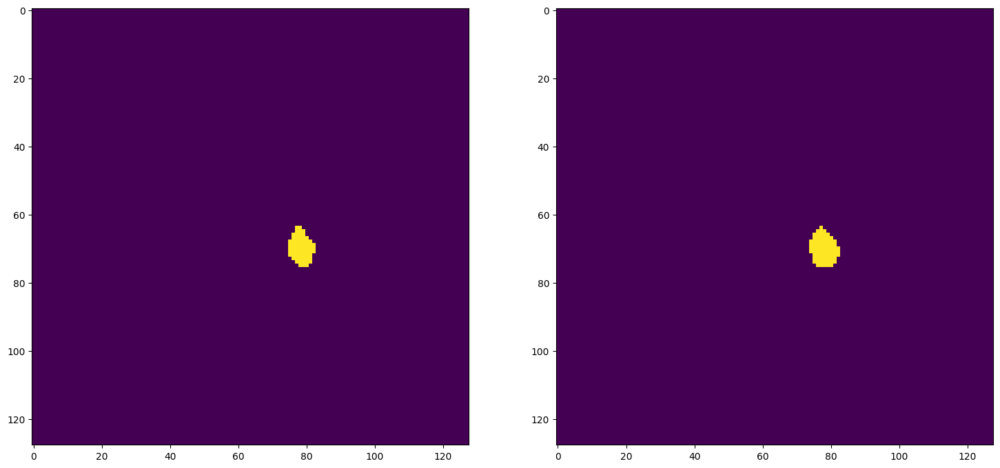

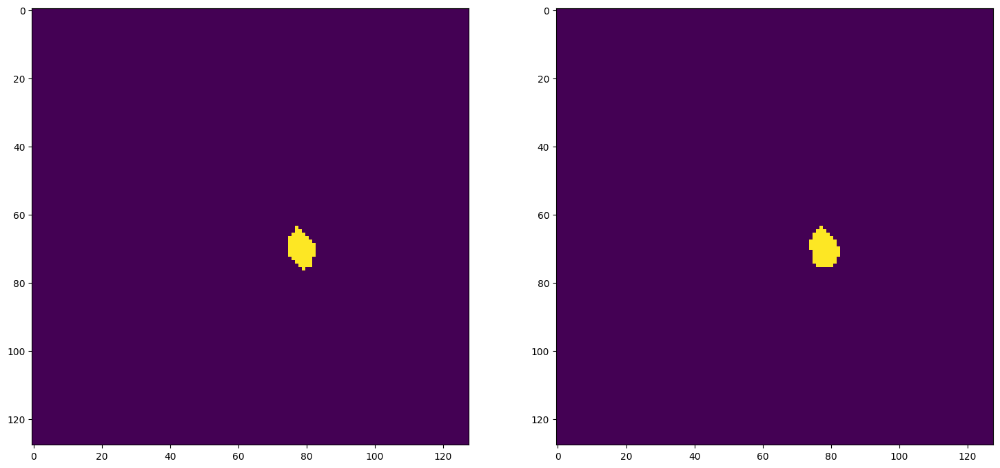

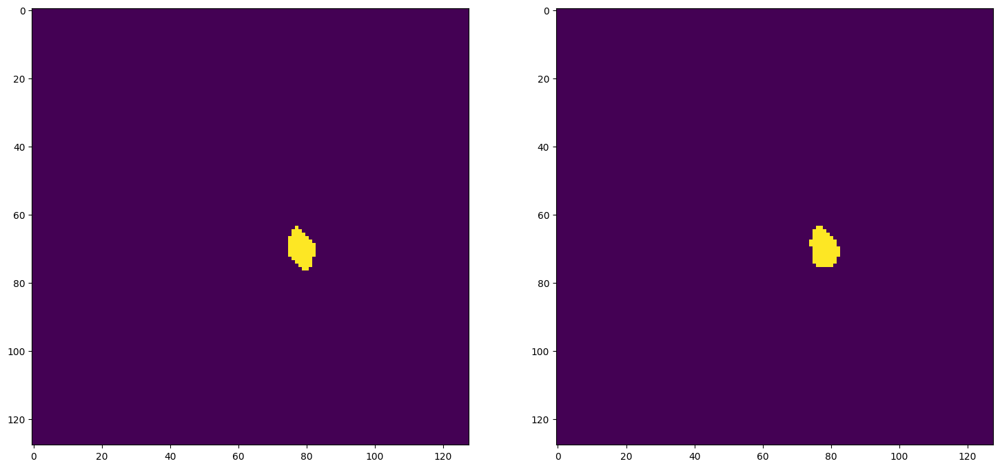


pancreas_255_008
Mean Value: 0.4435226321220398
0.1318718381112985
0.233015494636472

pancreas_255_016
Mean Value: 0.4985175132751465
0.5882828282828283
0.7407784278809463

pancreas_256_000
Mean Value: 0.4465526342391968
0.6166281755196305
0.7628571428571429

pancreas_256_008
Mean Value: 0.46477121114730835
0.4872651356993737
0.6552498596294217

pancreas_259_000
Mean Value: 0.49840399622917175
0.45531164249313993
0.6257239057239057

pancreas_259_008
Mean Value: 0.4978426694869995
0.5780806360022714
0.732637639438647

pancreas_259_016
Mean Value: 0.4918871521949768
0.7865626060400407
0.8805318138651472


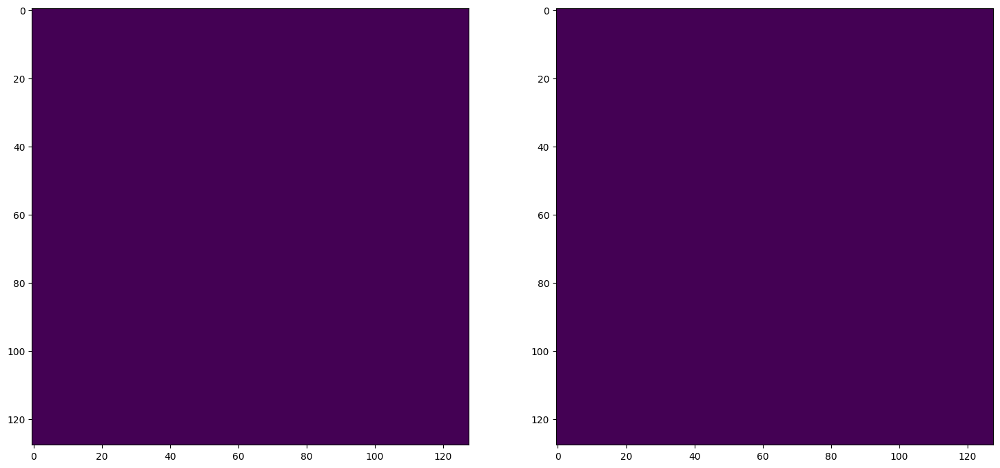

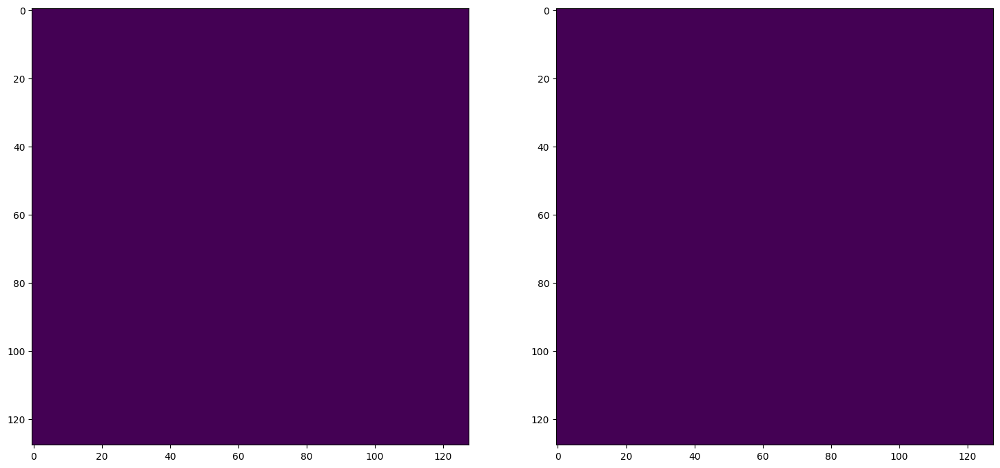

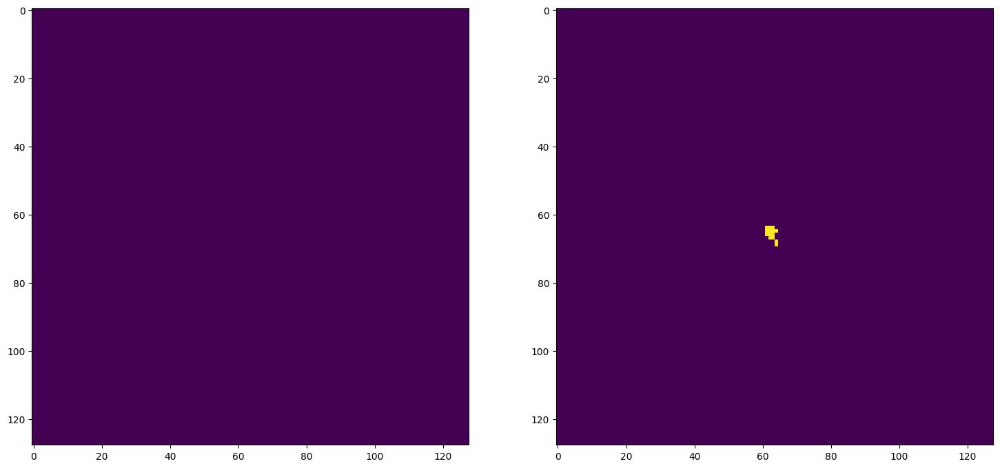

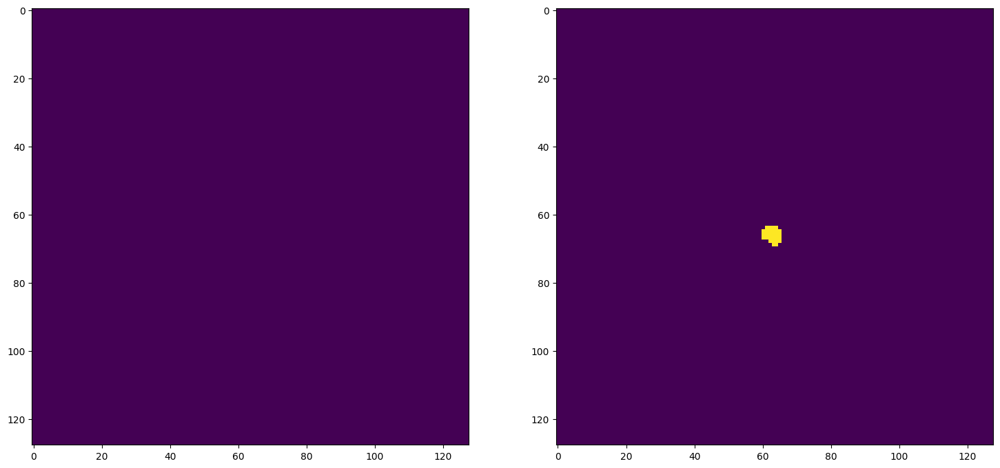

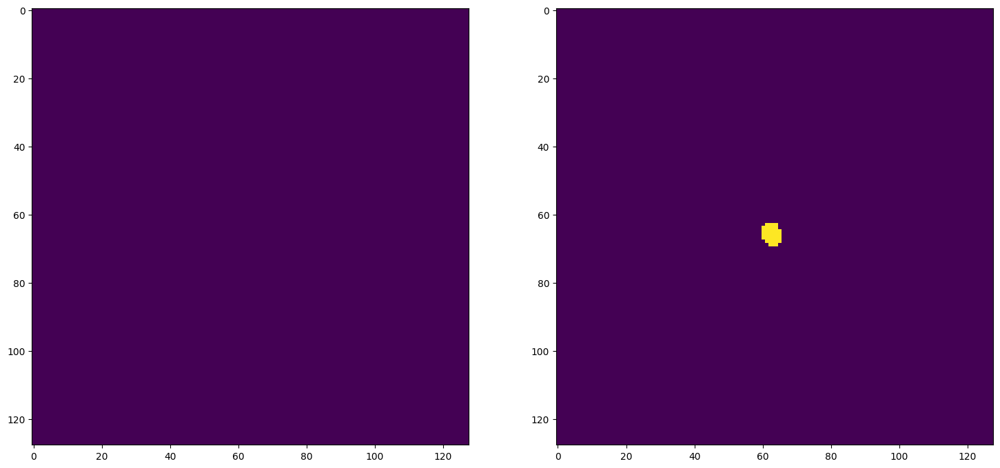

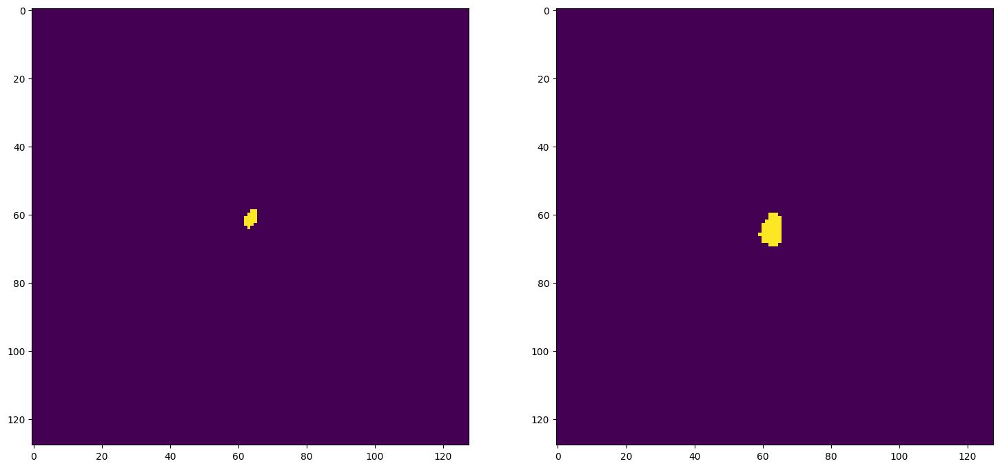


pancreas_259_024
Mean Value: 0.4961998760700226
0.45454545454545453
0.625

pancreas_264_008
Mean Value: 0.48430192470550537
0.6365090650551013
0.7778863907896166

pancreas_264_016
Mean Value: 0.49876323342323303
0.6260253542132737
0.7700068791561568

pancreas_264_024
Mean Value: 0.4772731363773346
0.558130081300813
0.7164101226193582

pancreas_264_032
Mean Value: 0.49894604086875916
0.5831372549019608
0.7366856576665841

pancreas_266_000
Mean Value: 0.4922927916049957
0.450198273851178
0.620878237091845

pancreas_266_008
Mean Value: 0.4976097643375397
0.7323016134343102
0.8454666413229424

pancreas_266_016
Mean Value: 0.49441564083099365
0.6985313063643391
0.8225121359223301

pancreas_266_024
Mean Value: 0.4799725115299225
0.6812533765532145
0.8104113110539846

pancreas_266_032
Mean Value: 0.4682304561138153
0.6570026761819804
0.7930013458950201

pancreas_284_000
Mean Value: 0.497012734413147
0.6596398770311814
0.7949192908176766

pancreas_284_008
Mean Value: 0.4960576593875885
0.6675

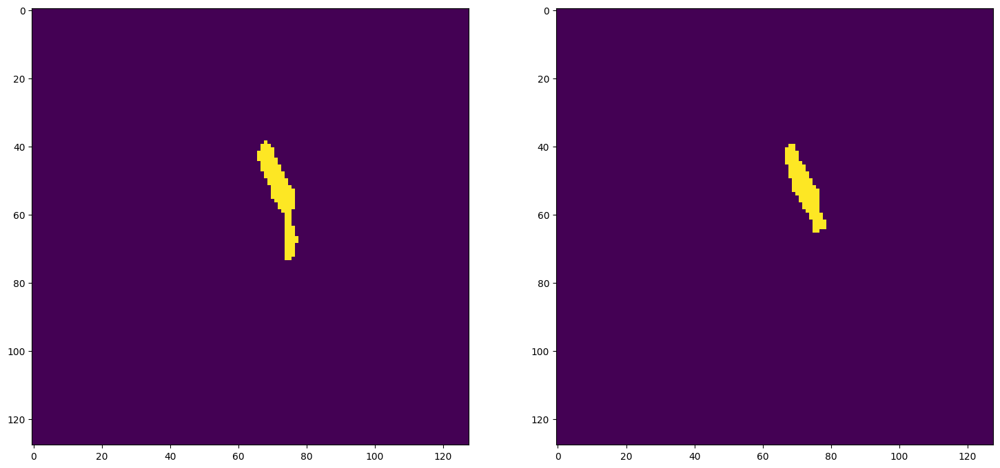

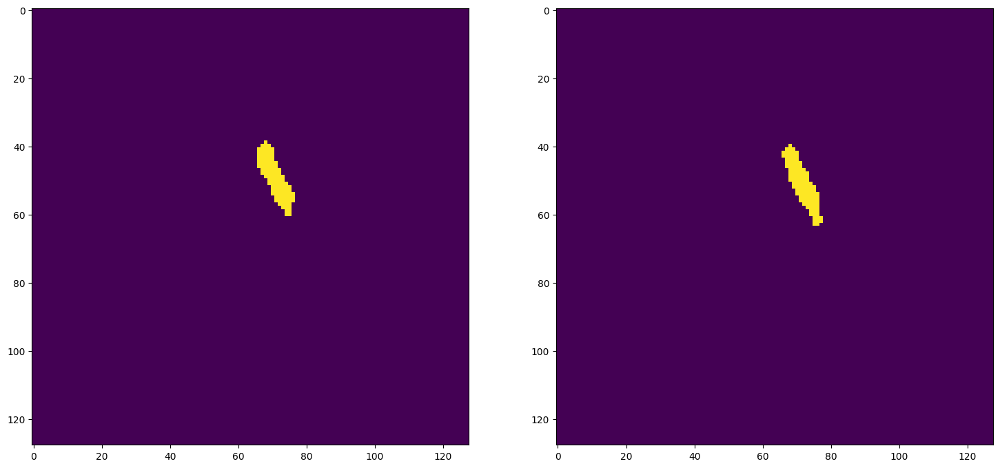

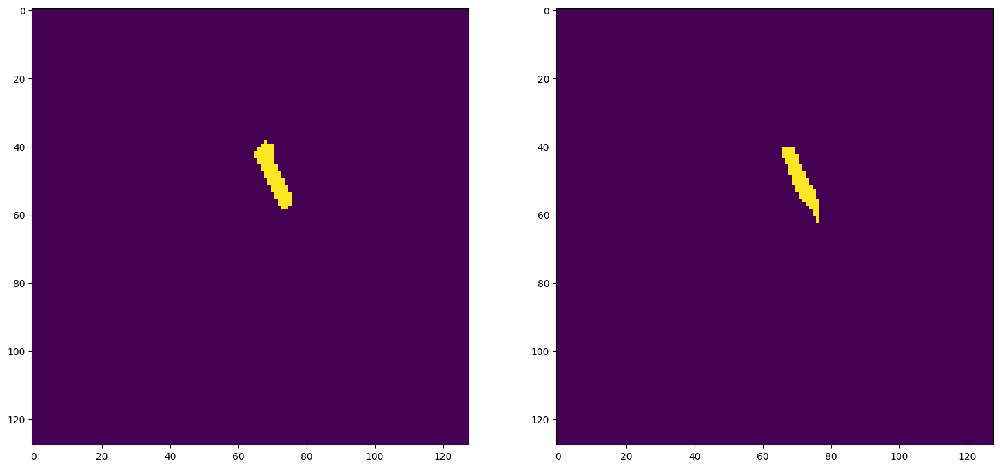

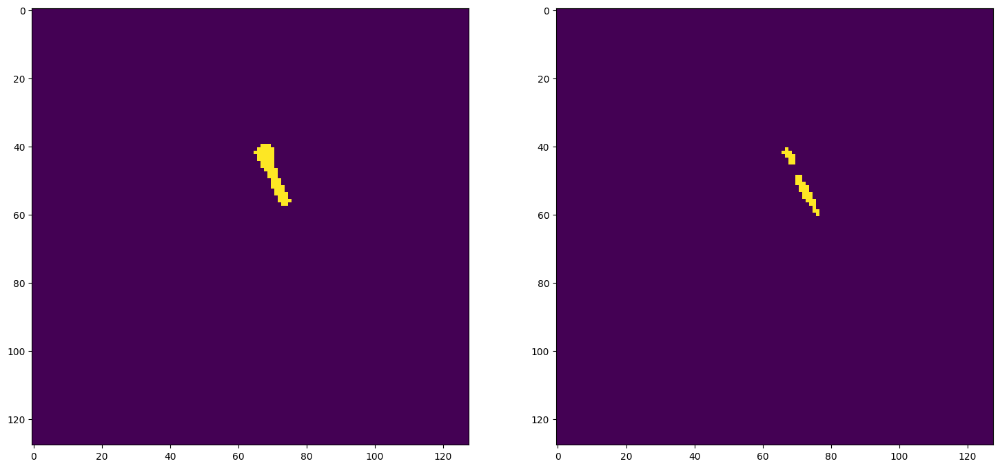

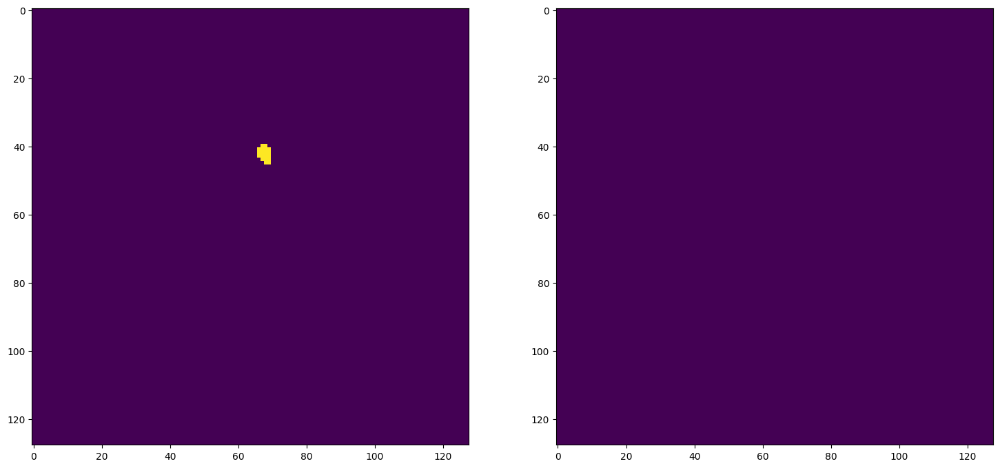

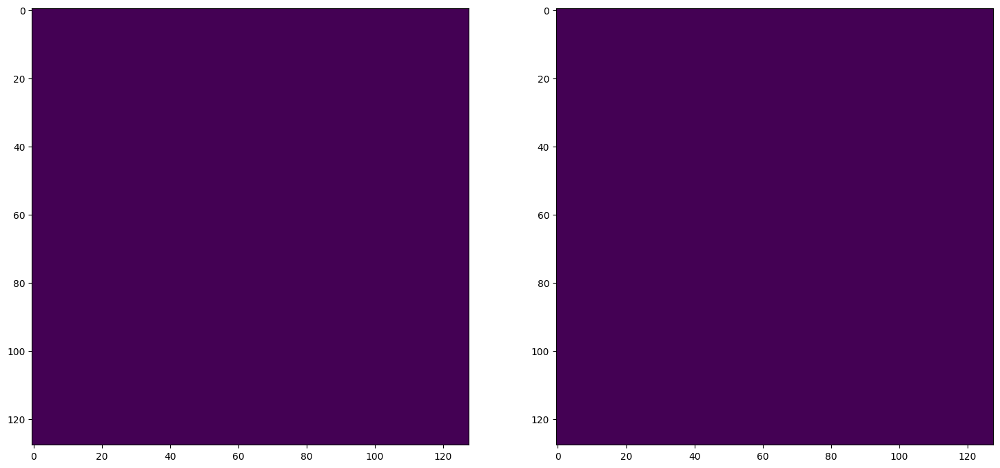


pancreas_290_000
Mean Value: 0.4978320896625519
0.7179346333424883
0.8358113509192646

pancreas_290_008
Mean Value: 0.4707888960838318
0.558161648177496
0.7164361269324654

pancreas_290_016
Mean Value: 0.4971383512020111
0.6610633307271305
0.7959519887032243

pancreas_290_024
Mean Value: 0.4922873079776764
0.6190093277581216
0.7646766663355518

pancreas_291_000
Mean Value: 0.4916973114013672
0.7053129221071589
0.8271947194719472

pancreas_291_008
Mean Value: 0.4977492094039917
0.6758576466816287
0.8065812129328487

pancreas_291_016
Mean Value: 0.4963543117046356
0.28522920203735147
0.4438573315719947

pancreas_291_024
Mean Value: 0.49546682834625244
0.7056760204081632
0.8274443821275005

pancreas_298_000
Mean Value: 0.49919211864471436
0.5892286627110909
0.7415278575531303

pancreas_298_008
Mean Value: 0.4980289340019226
0.6559871846215458
0.7922611850060459

pancreas_298_016
Mean Value: 0.49595320224761963
0.5797018348623854
0.7339382940108893

pancreas_298_024
Mean Value: 0.49692961

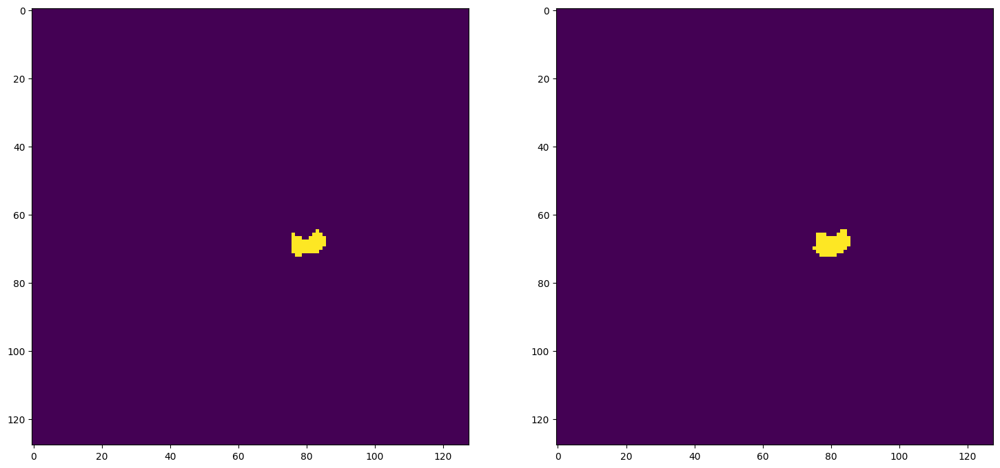

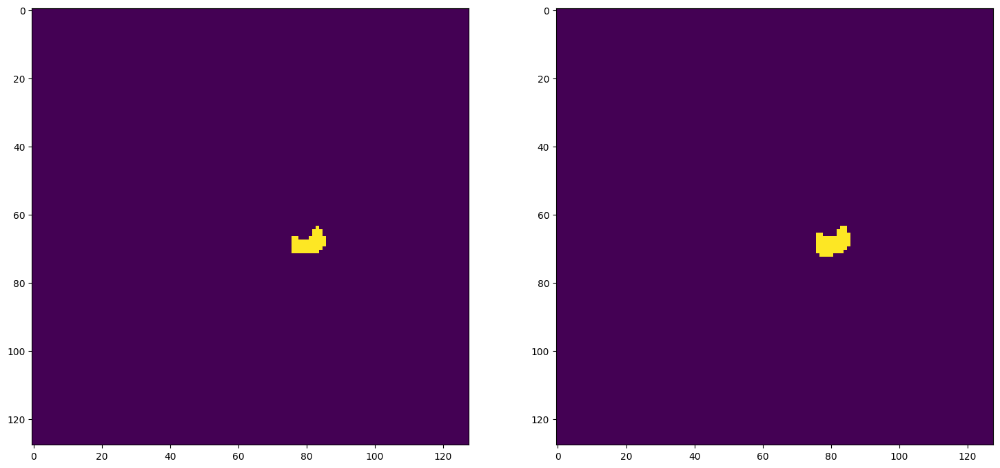

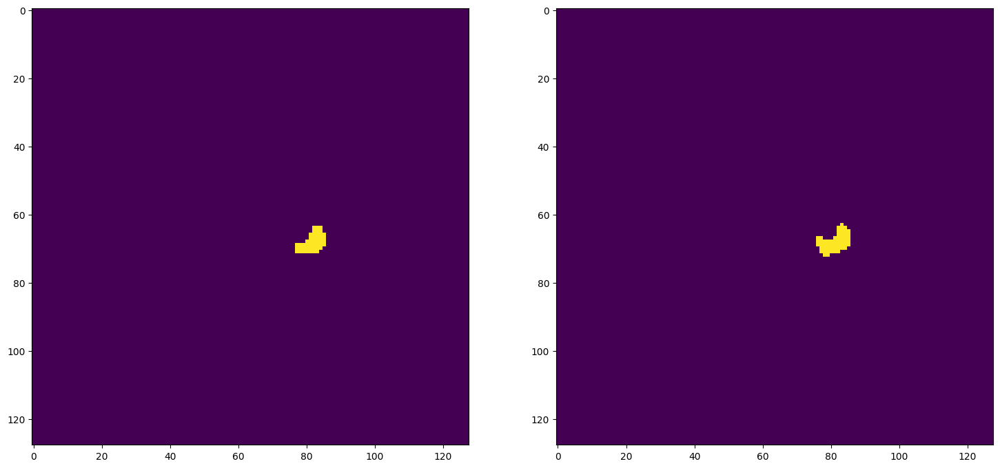

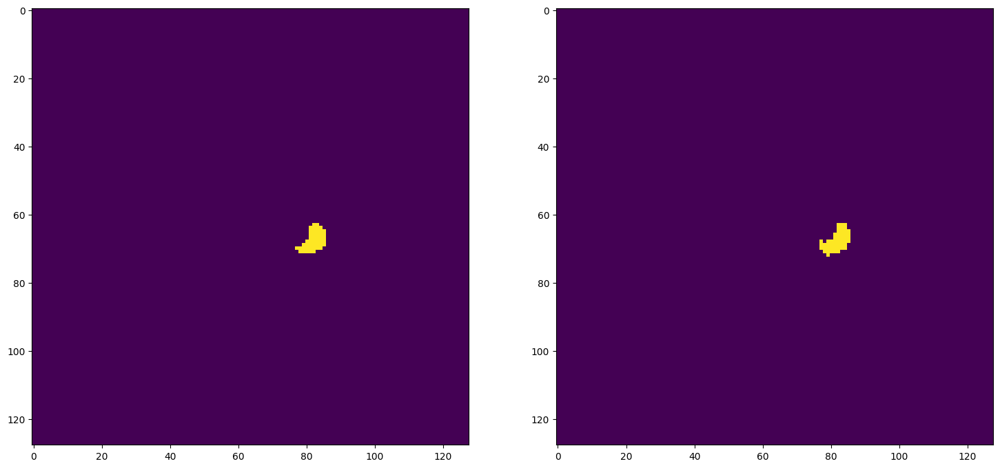

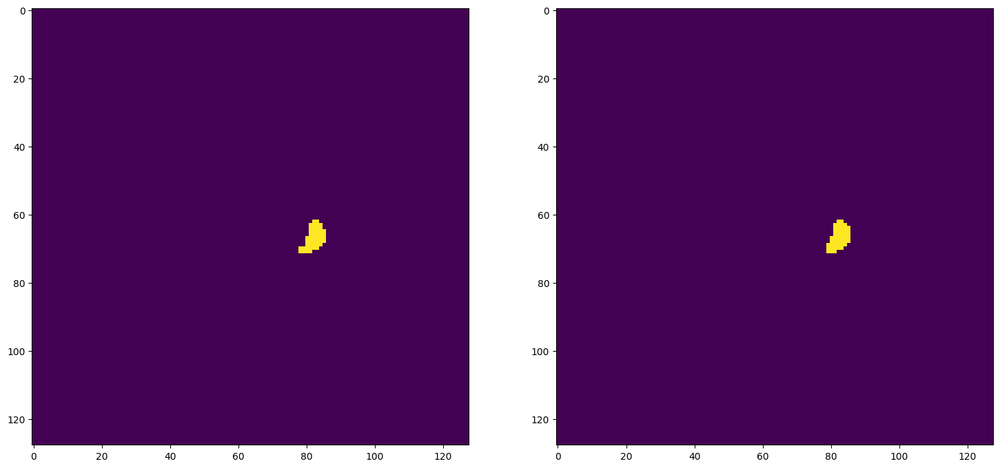

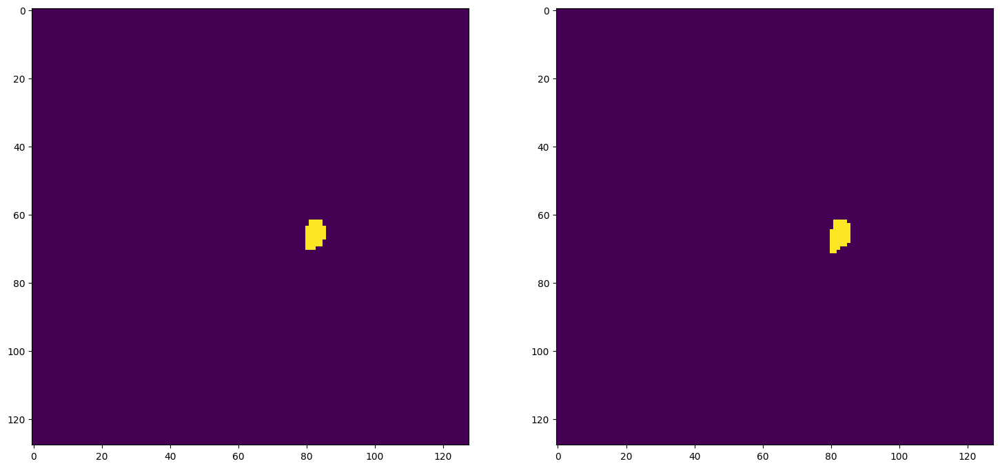


pancreas_310_000
Mean Value: 0.498943954706192
0.5475113122171946
0.7076023391812866

pancreas_310_008
Mean Value: 0.4988325834274292
0.6440818584070797
0.783515559293524

pancreas_316_000
Mean Value: 0.4959343671798706
0.749516814843448
0.856827220503756


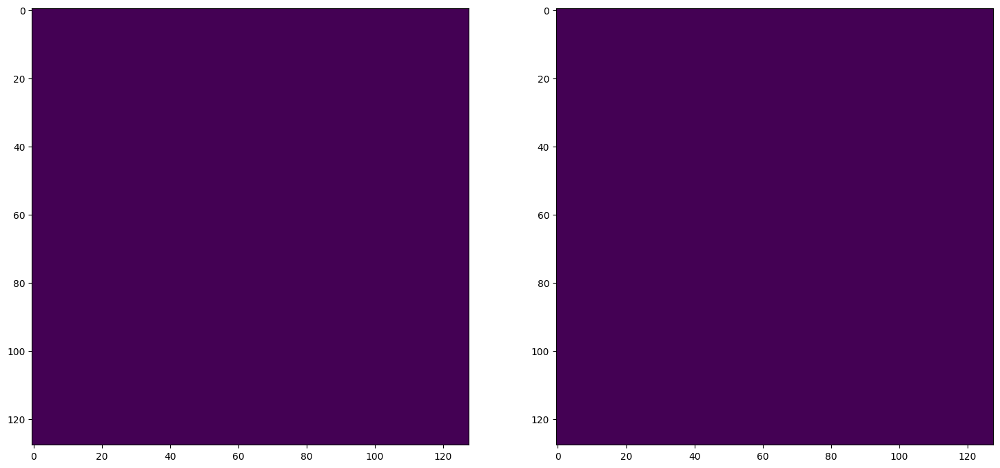

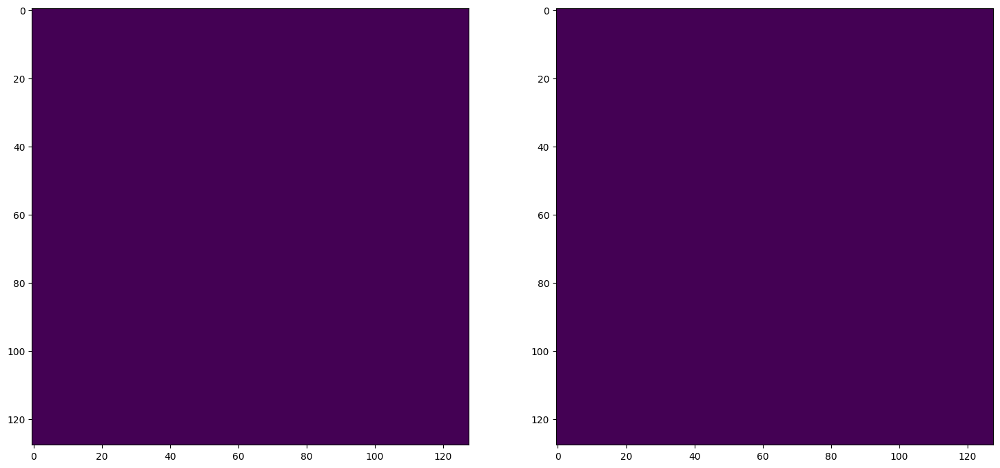

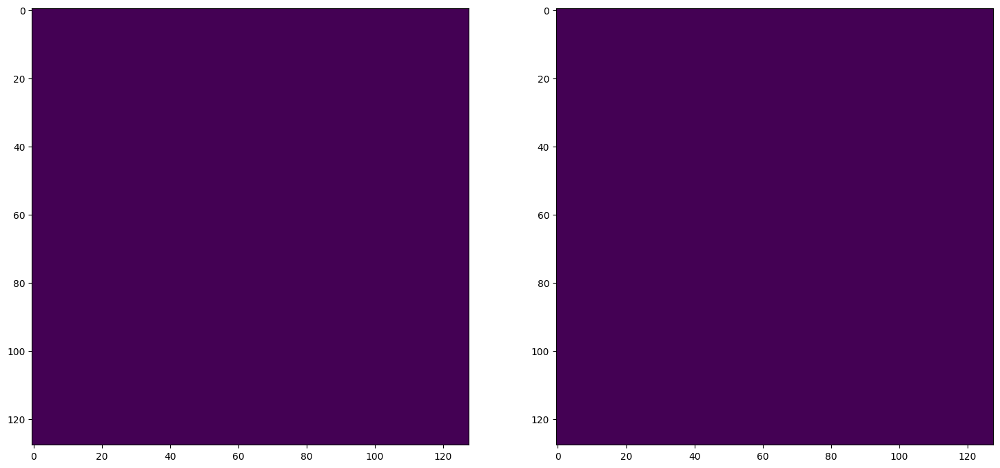

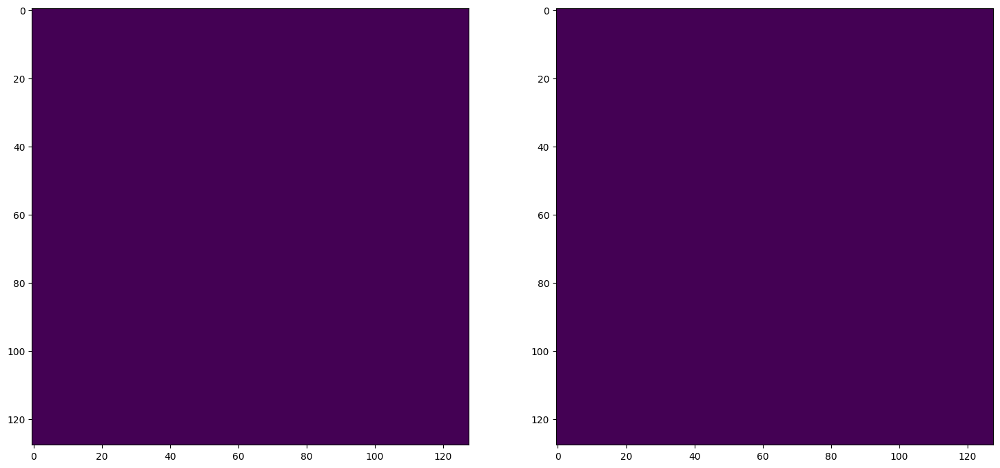

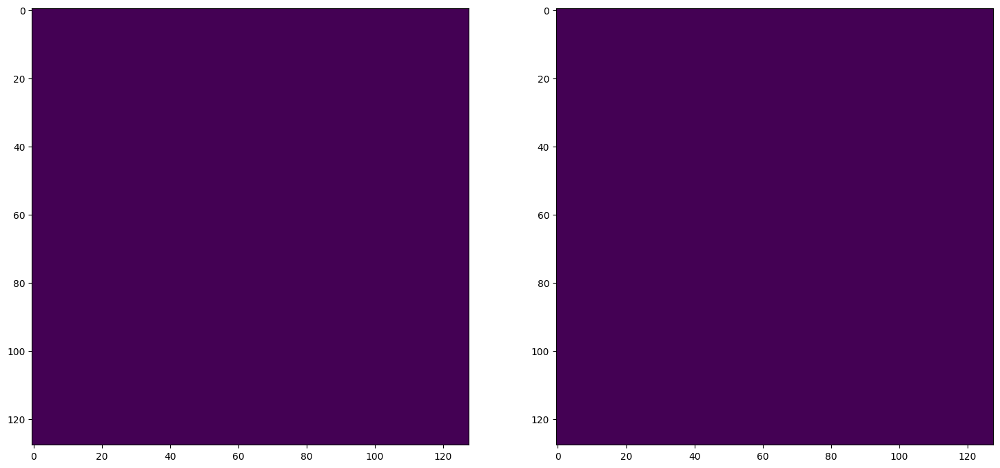

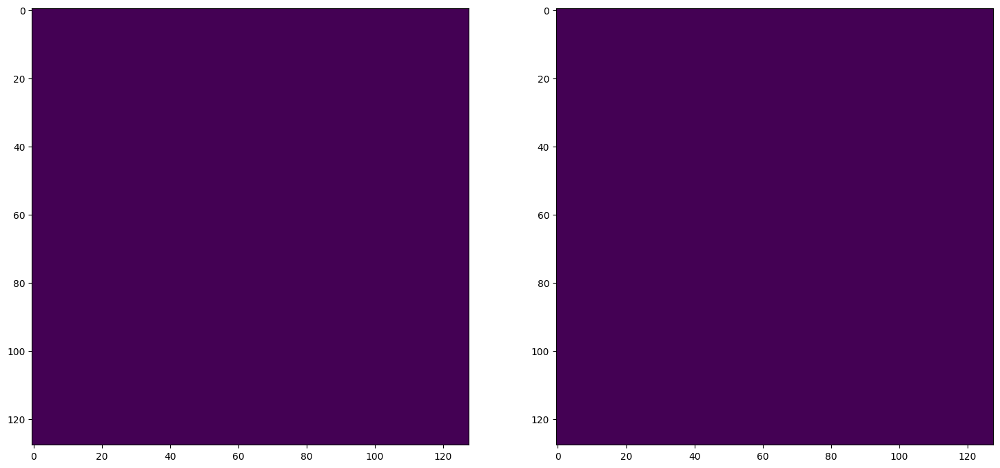


pancreas_316_008
Mean Value: 0.4671578109264374
0.5847971893963589
0.7380088673921805

pancreas_316_016
Mean Value: 0.49794331192970276
0.29347198151357595
0.4537740062527914

pancreas_316_024
Mean Value: 0.49808546900749207
0.505801687763713
0.6718038528896673

pancreas_321_016
Mean Value: 0.4660722613334656
0.5640756302521008
0.7212894560107455

pancreas_321_024
Mean Value: 0.49435341358184814
0.6183239253148067
0.7641534746444861

pancreas_321_032
Mean Value: 0.4991428554058075
0.5881720430107527
0.7406905890318213

pancreas_321_040
Mean Value: 0.4952130615711212
0.6166776532630192
0.7628950050968399

pancreas_323_000
Mean Value: 0.49631989002227783
0.6592364847553164
0.794626312538604

pancreas_323_008
Mean Value: 0.49862828850746155
0.5733755942947703
0.7288477034649476

pancreas_323_016
Mean Value: 0.49663281440734863
0.40301378647002245
0.5744972577696527

pancreas_323_024
Mean Value: 0.49694326519966125
0.6338942307692308
0.7759305575989407

pancreas_325_000
Mean Value: 0.4968

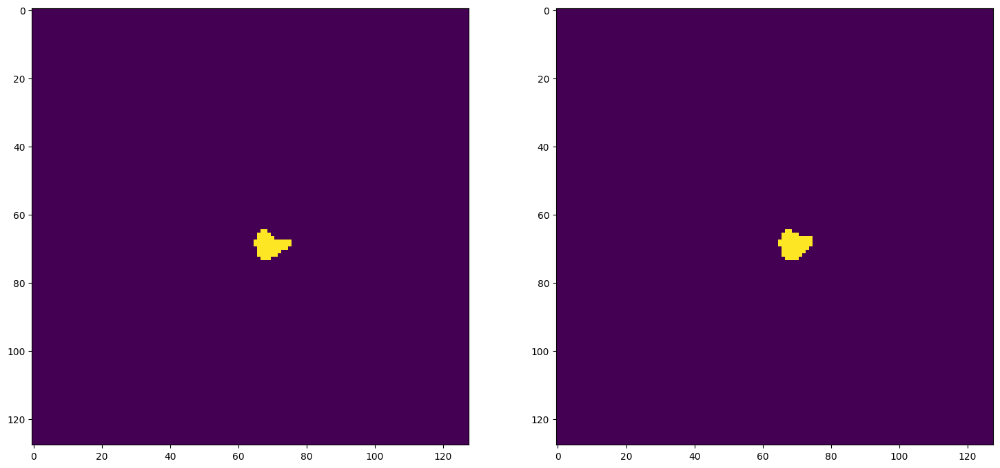

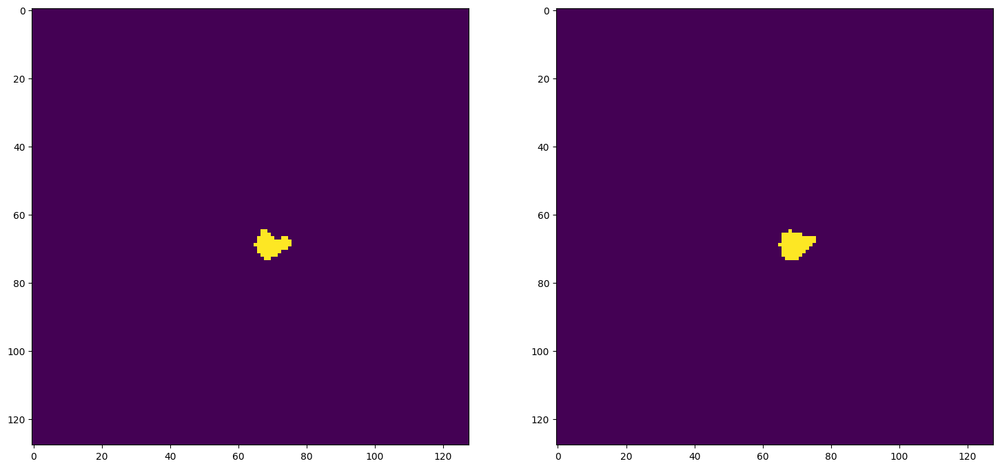

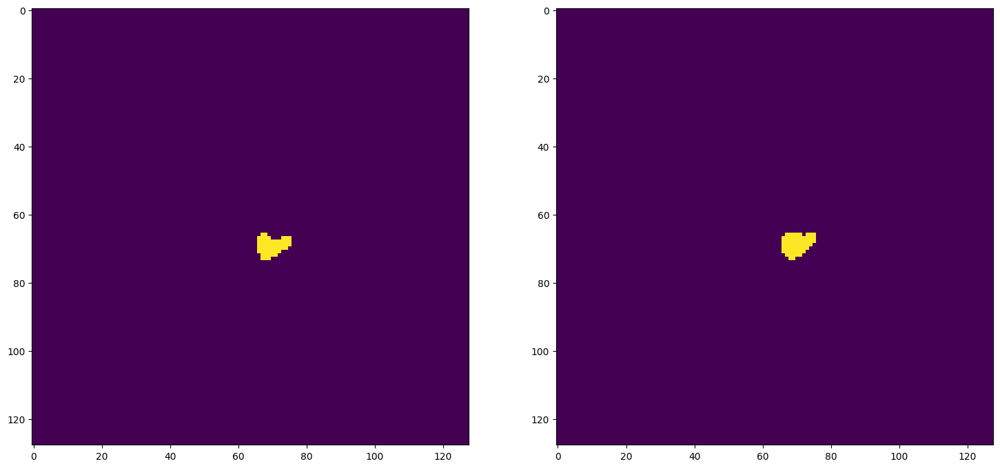

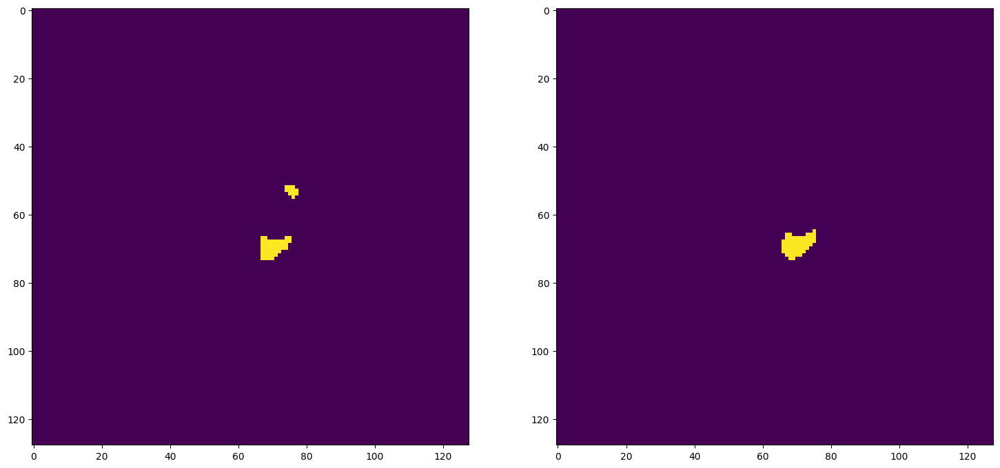

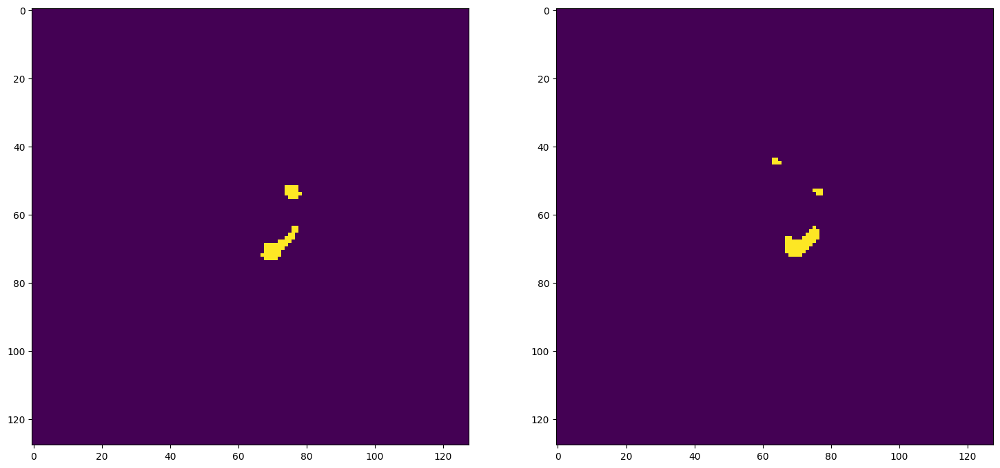

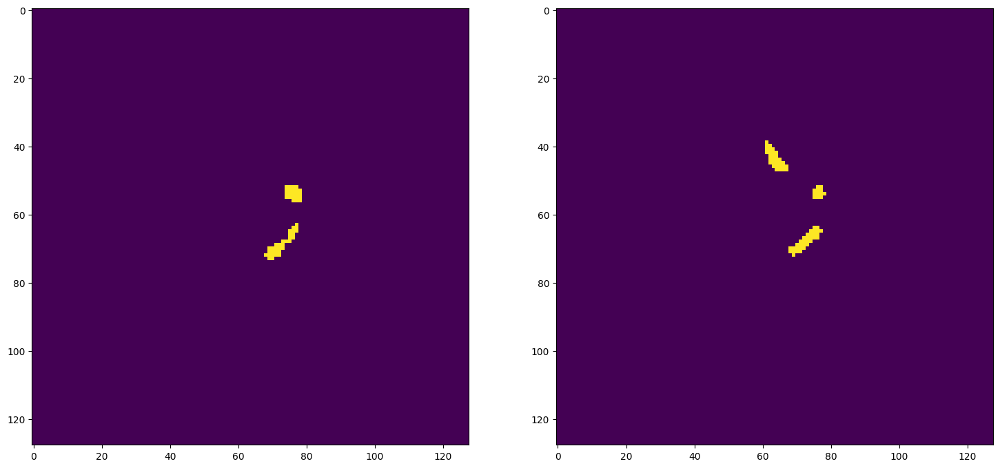


pancreas_355_000
Mean Value: 0.49385306239128113
0.6865408805031447
0.8141408114558473

pancreas_355_008
Mean Value: 0.4809980094432831
0.4231211215812457
0.5946382428940569

pancreas_355_016
Mean Value: 0.49502772092819214
0.5287128712871287
0.6917098445595855

pancreas_370_008
Mean Value: 0.4572163224220276
0.5879504068190624
0.7405148224960352

pancreas_370_016
Mean Value: 0.49482616782188416
0.2430471584038694
0.39105058365758755

pancreas_370_024
Mean Value: 0.4983982741832733
0.6427320490367776
0.7825159914712153

pancreas_372_000
Mean Value: 0.49996525049209595
0.4995787700084246
0.6662921348314607

pancreas_372_008
Mean Value: 0.49866384267807007
0.29706905116741184
0.4580620451934125

pancreas_372_016
Mean Value: 0.4984927475452423
0.5806451612903226
0.7346938775510204

pancreas_374_024
Mean Value: 0.49541187286376953
0.7594978526593987
0.8633120540743522


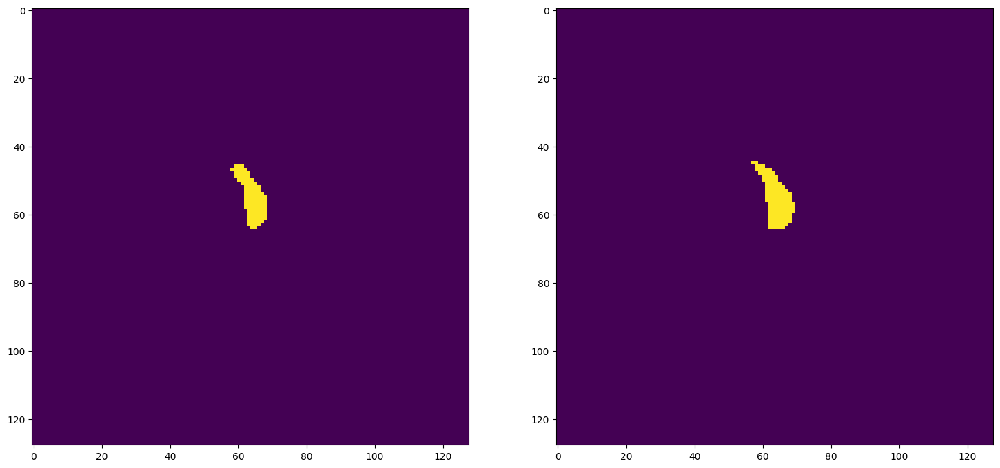

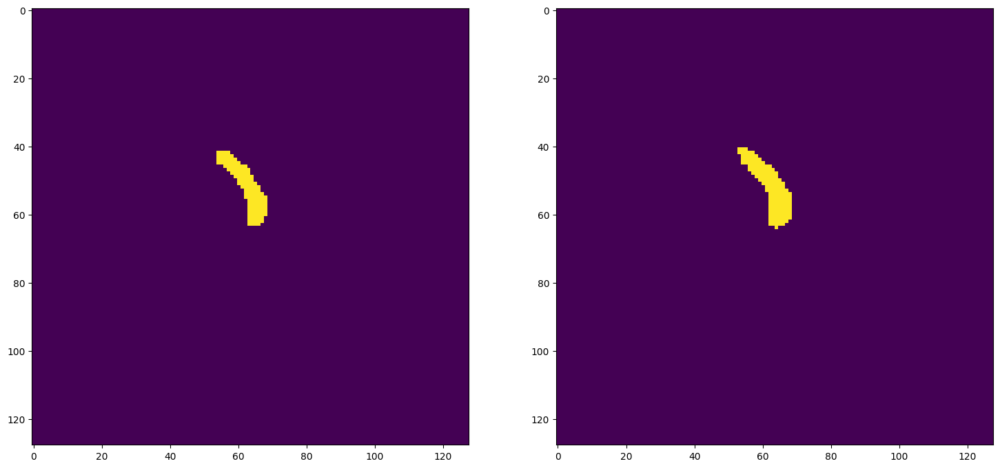

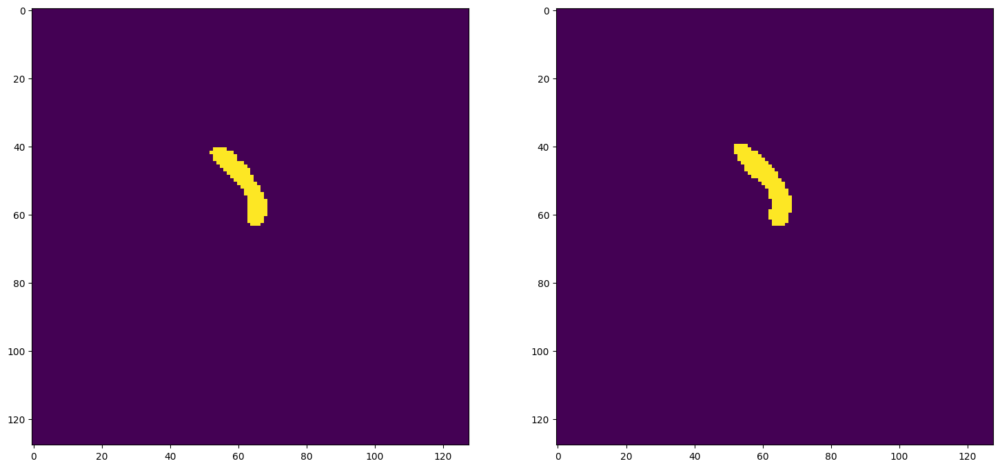

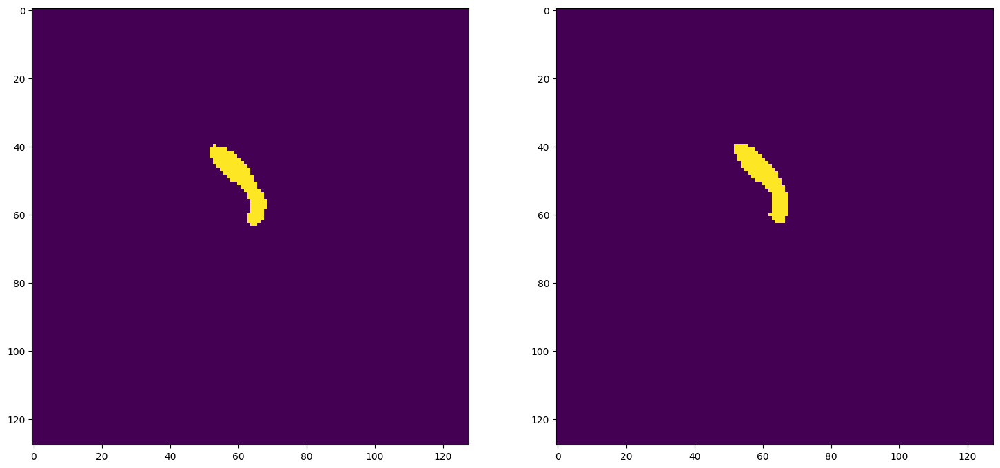

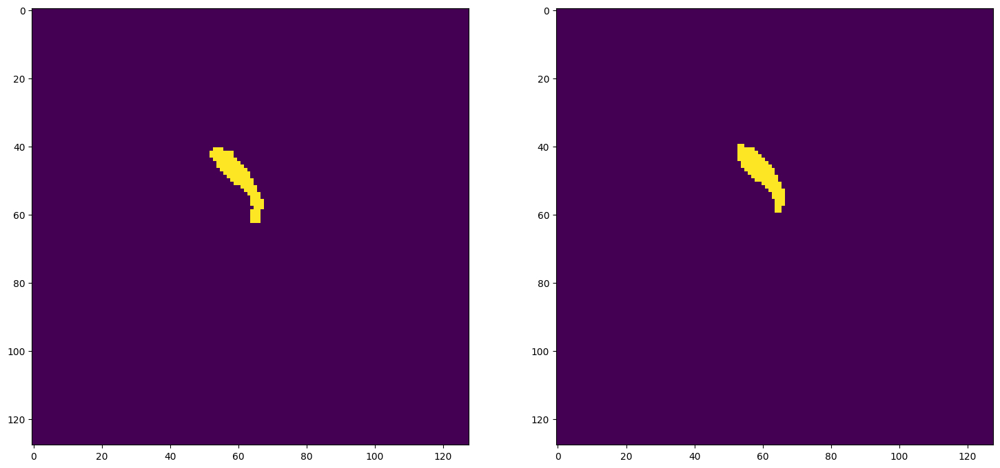

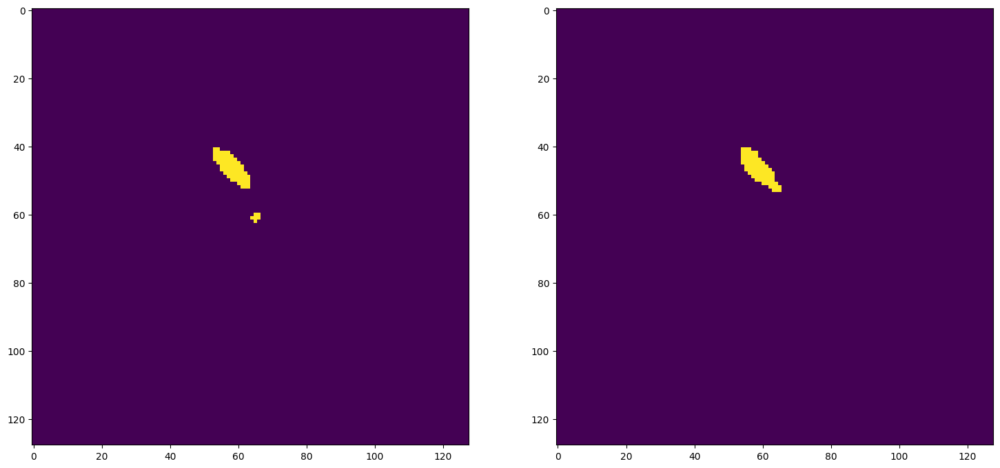


pancreas_374_032
Mean Value: 0.49775007367134094
0.6445924764890282
0.7838932570883965

pancreas_374_040
Mean Value: 0.497077614068985
0.2741986670898128
0.4303860523038605

pancreas_374_048
Mean Value: 0.4821583330631256
0.41099656357388314
0.5825621042377009

pancreas_386_000
Mean Value: 0.49432918429374695
0.5116498740554156
0.6769423036867319

pancreas_386_008
Mean Value: 0.4861903190612793
0.62882096069869
0.7721179624664879

pancreas_386_016
Mean Value: 0.48291686177253723
0.5668575943116729
0.7235598134375394

pancreas_389_016
Mean Value: 0.4986043870449066
0.2961689587426326
0.4569912845774915

pancreas_389_024
Mean Value: 0.49880853295326233
0.5652920962199313
0.7222832052689352

pancreas_389_032
Mean Value: 0.49873054027557373
0.5241235682054842
0.6877704395354134

pancreas_389_040
Mean Value: 0.4935961961746216
0.7499198461045207
0.857090509344082


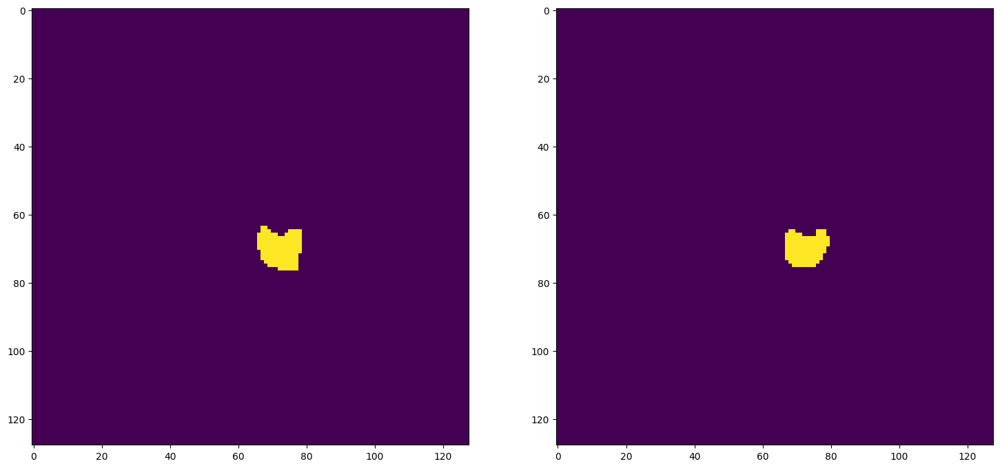

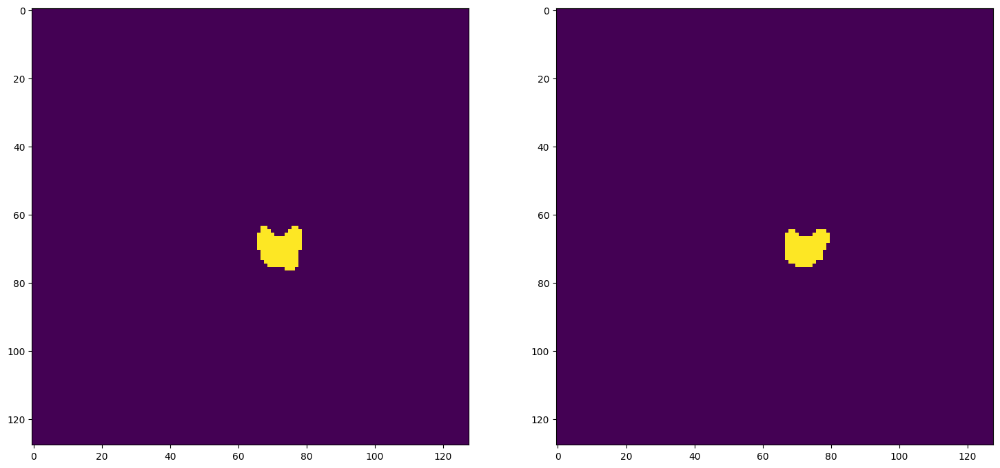

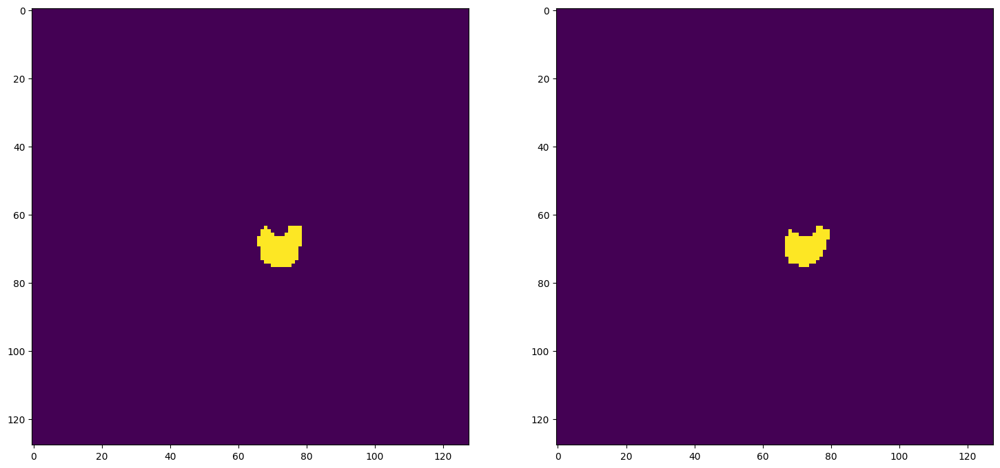

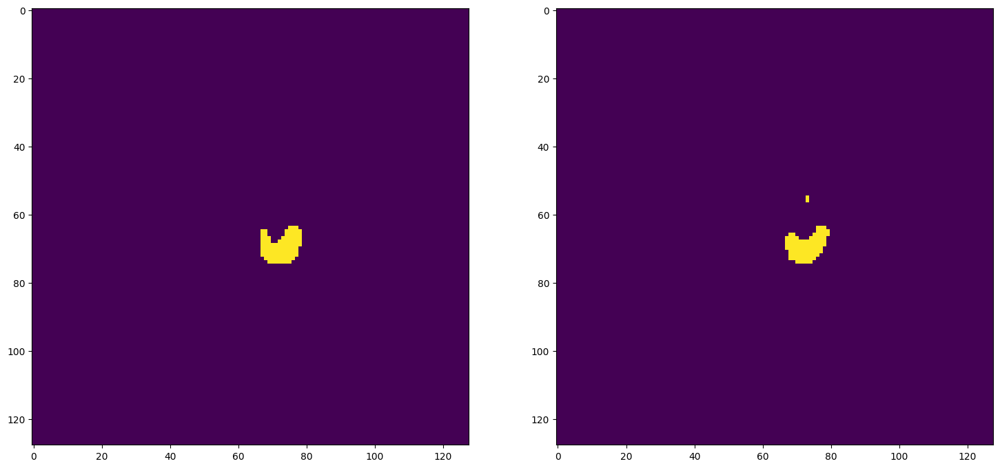

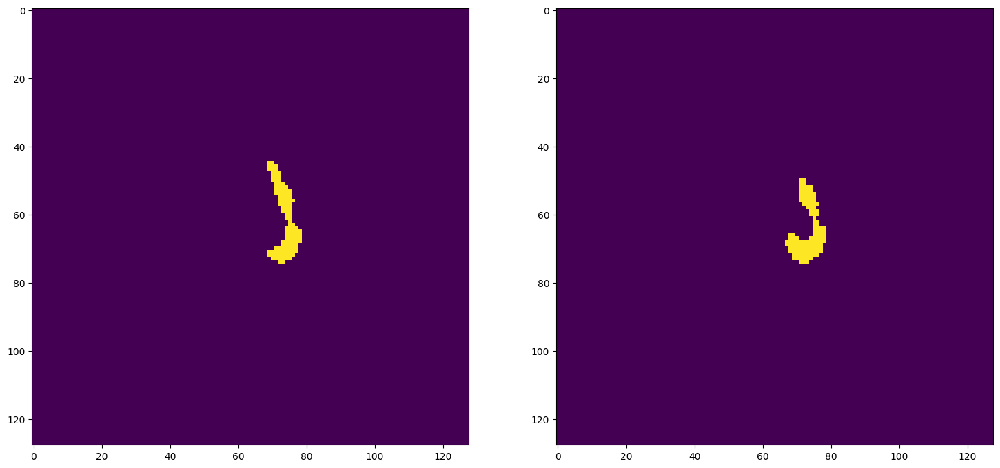

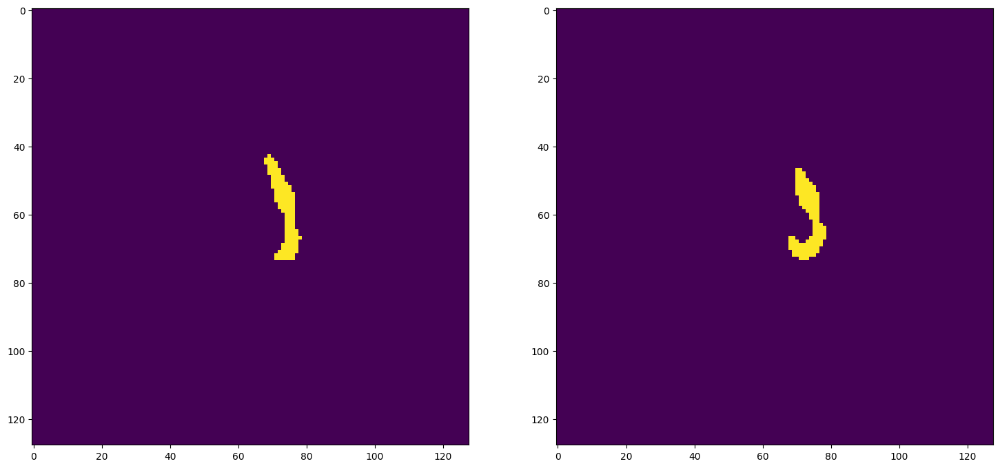


pancreas_398_000
Mean Value: 0.49719250202178955
0.1927007299270073
0.32313341493268055

pancreas_398_008
Mean Value: 0.4972425401210785
0.2643241532130421
0.41812719078617927

pancreas_398_016
Mean Value: 0.49870505928993225
0.5803571428571429
0.7344632768361582

pancreas_398_024
Mean Value: 0.2853042483329773
0.10204870506378044
0.18519817607856892

pancreas_401_024
Mean Value: 0.47743064165115356
0.21314052184847532
0.3513863695257839

pancreas_401_032
Mean Value: 0.4703032374382019
0.633884748227595
0.775923453493547

pancreas_401_040
Mean Value: 0.4944358170032501
0.09957488554610856
0.18111524163568773

pancreas_401_048
Mean Value: 0.49304208159446716
0.7601275917065391
0.8637187386734324


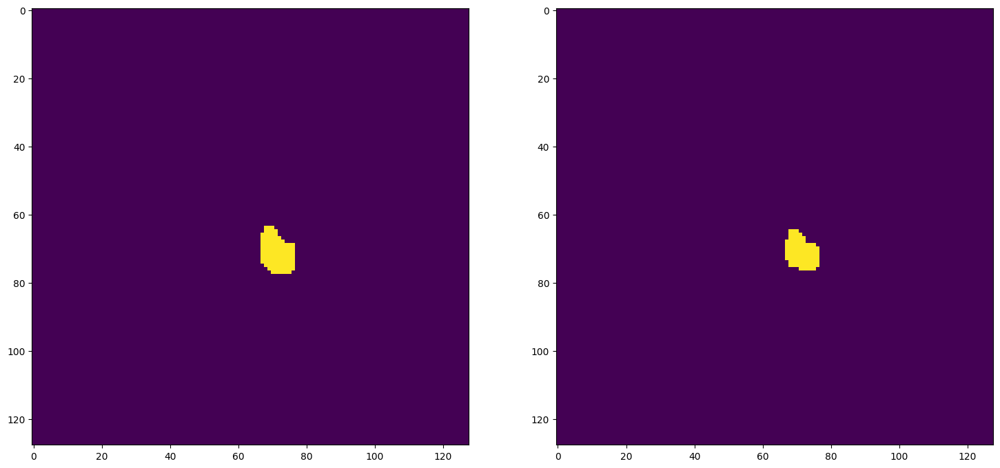

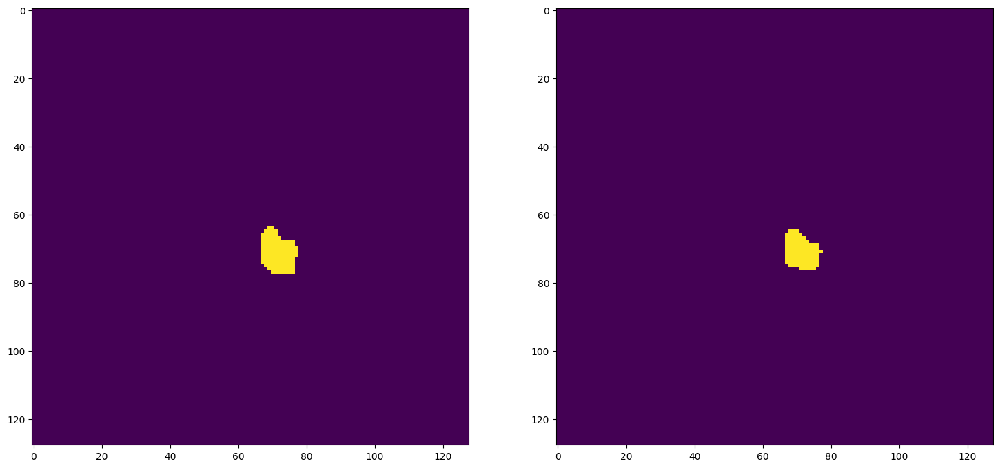

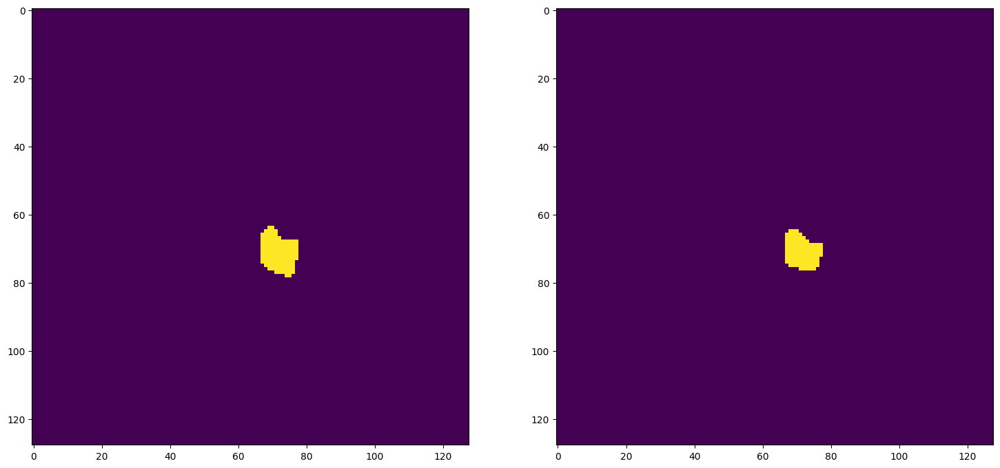

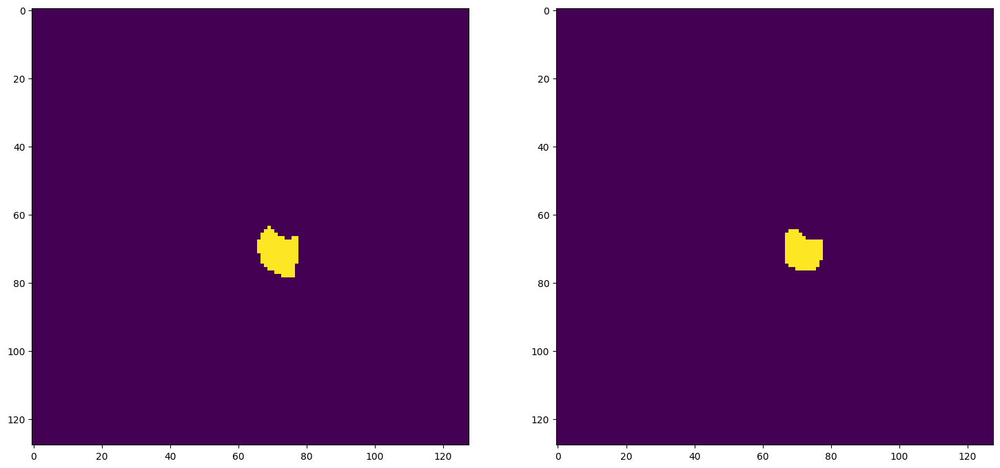

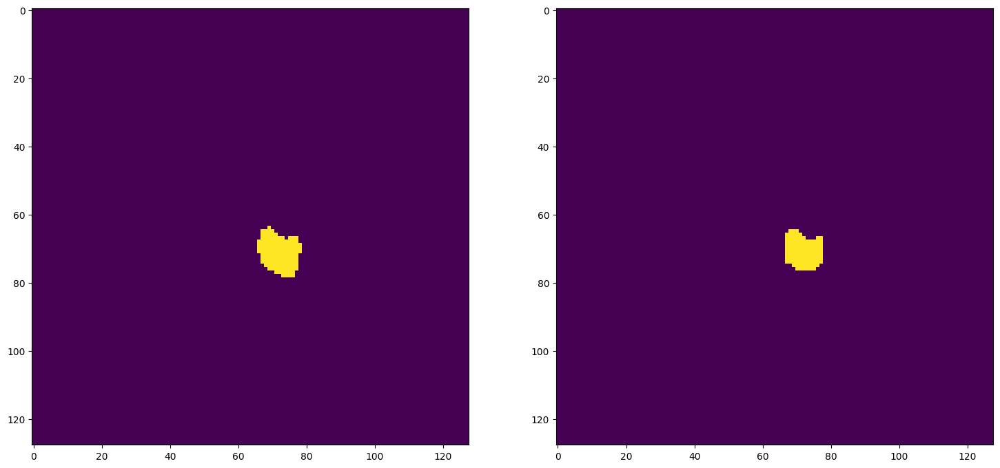

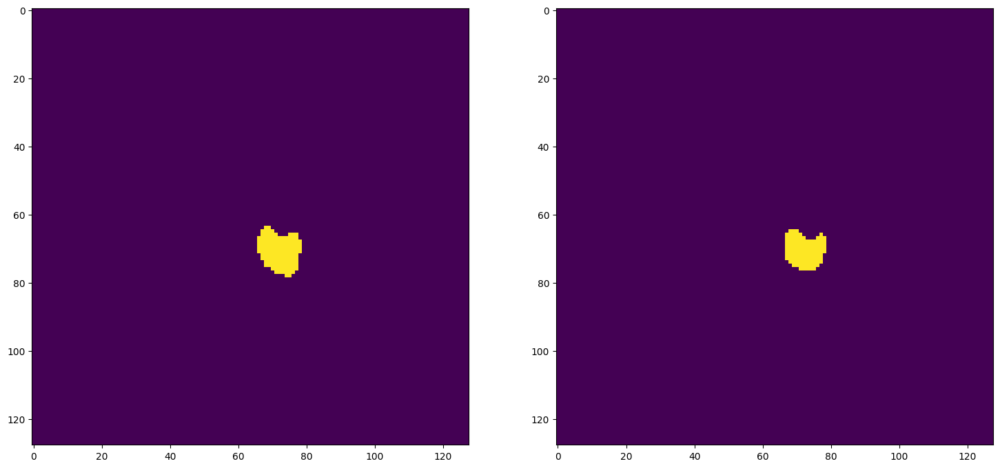


pancreas_401_056
Mean Value: 0.49923738837242126
0.6216941356841702
0.7667218151737178

pancreas_402_048
Mean Value: 0.47949063777923584
0.6989576946658492
0.8228076506676291

pancreas_402_056
Mean Value: 0.45053231716156006
0.8181430096051228
0.8999765203099319


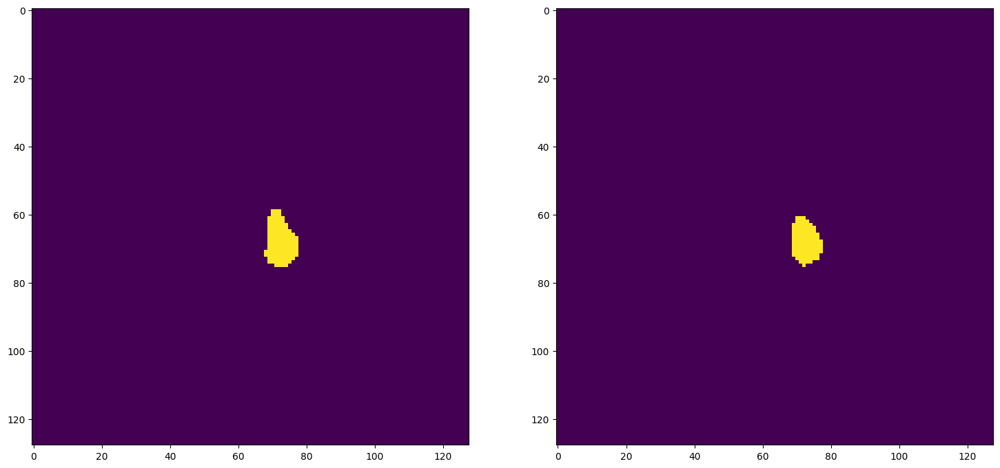

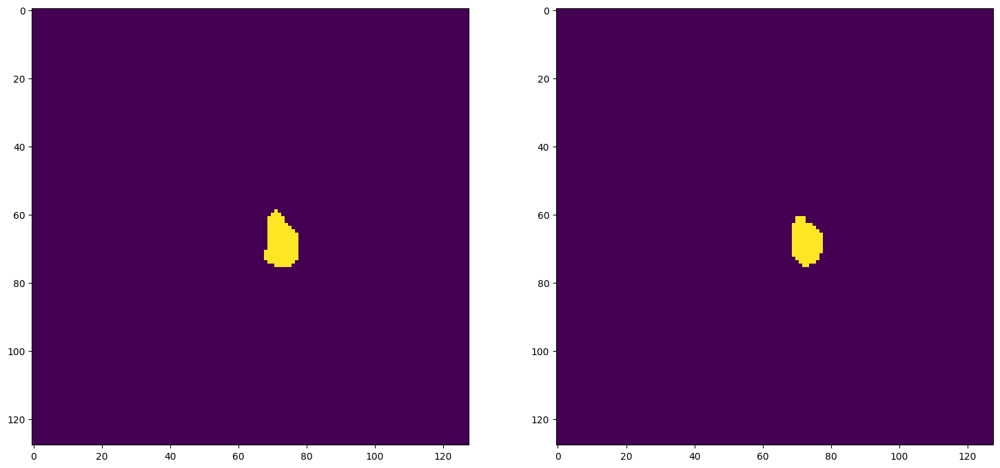

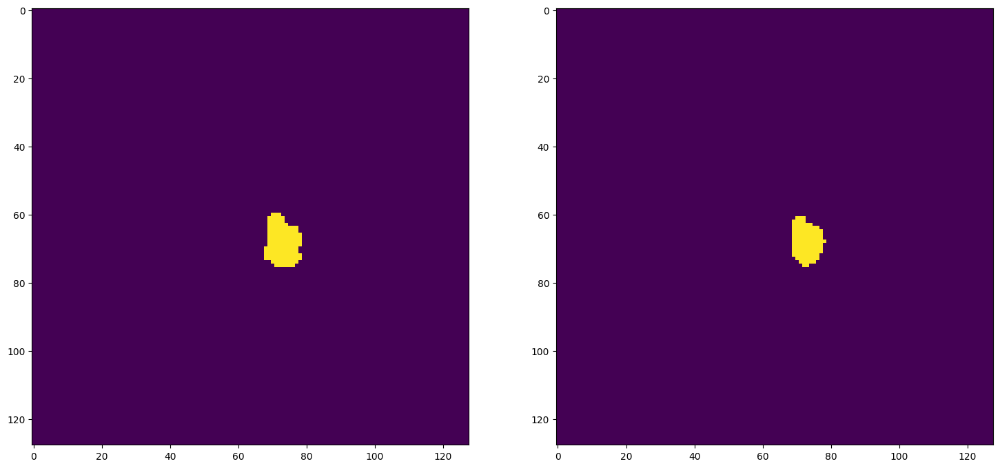

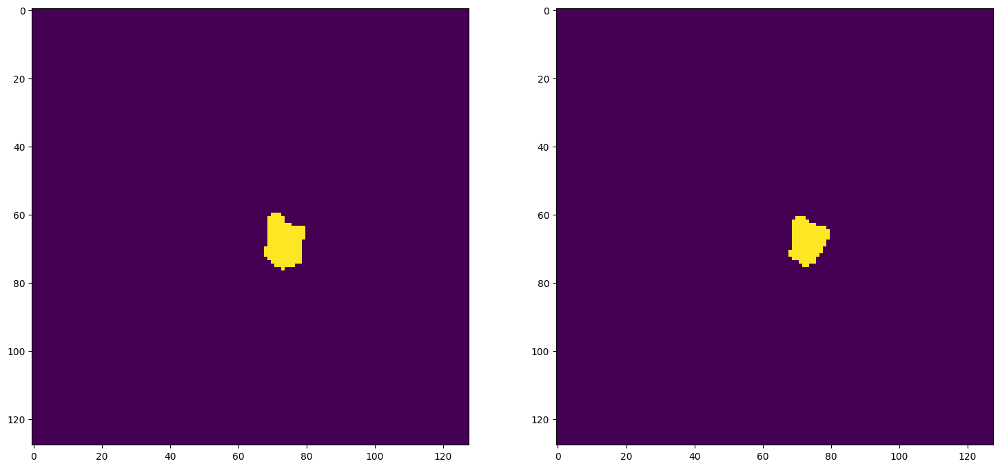

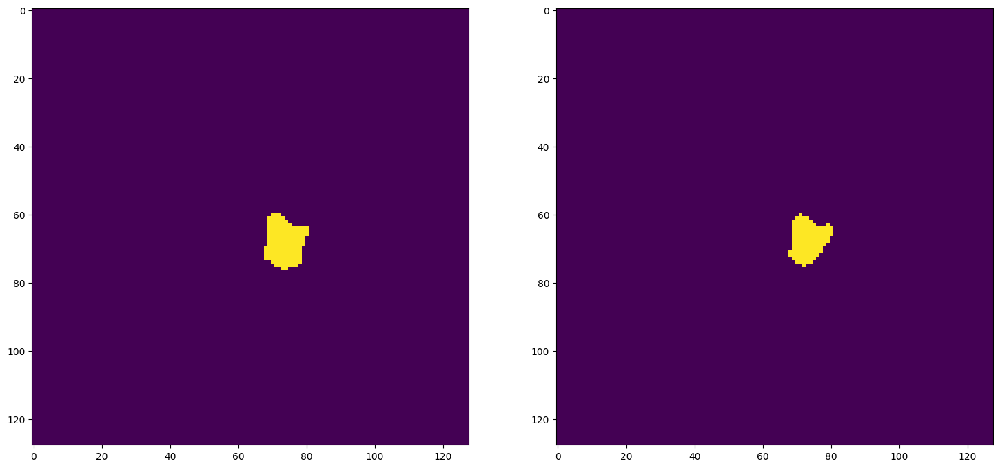

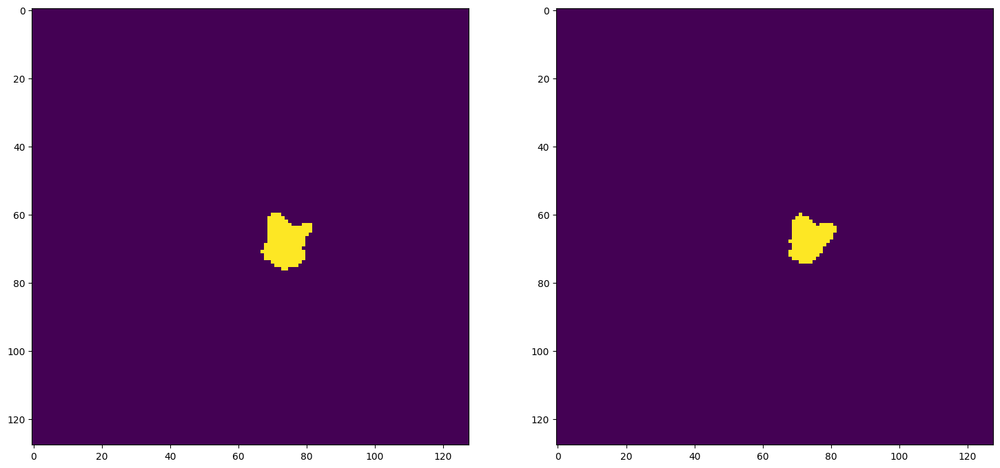


pancreas_402_064
Mean Value: 0.497800350189209
0.6944036889540977
0.8196437407224146

pancreas_404_000
Mean Value: 0.49206510186195374
0.7935306262904336
0.8848810437452034


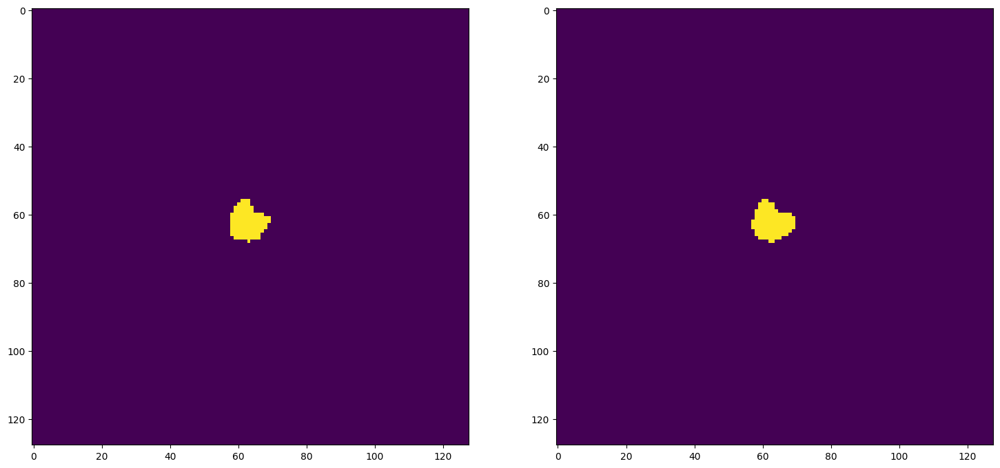

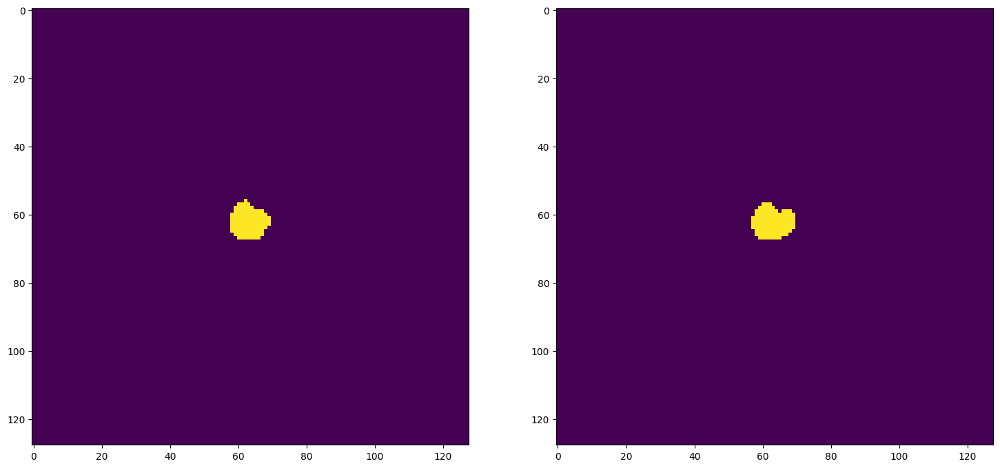

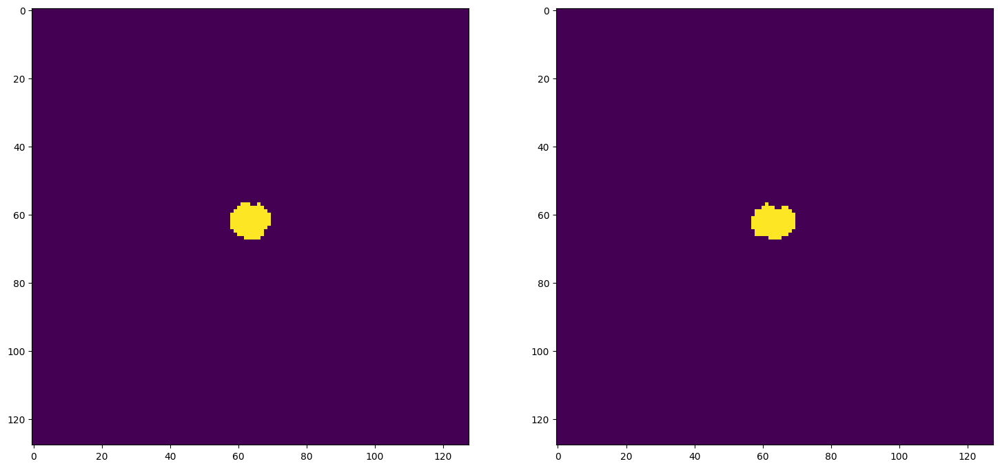

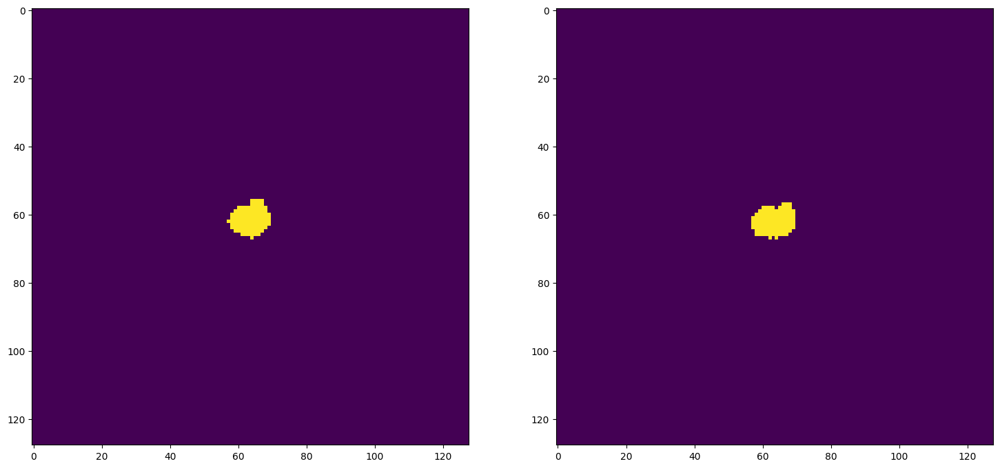

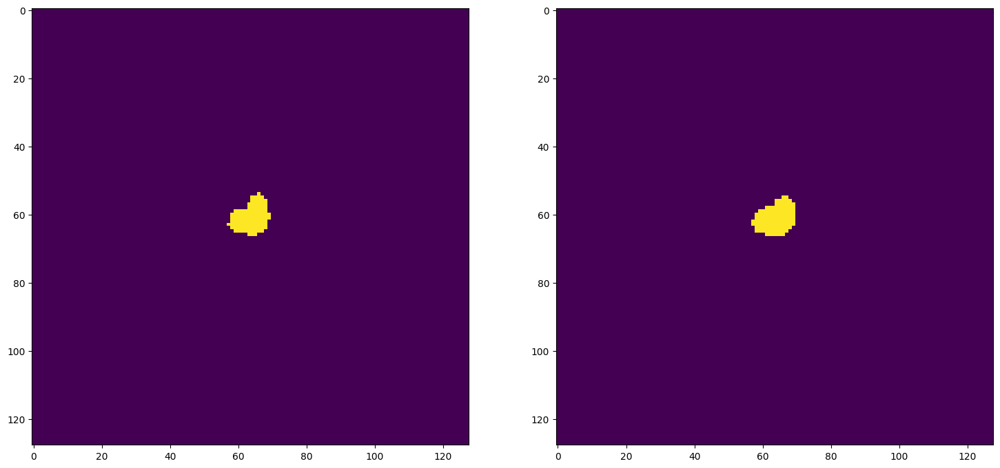

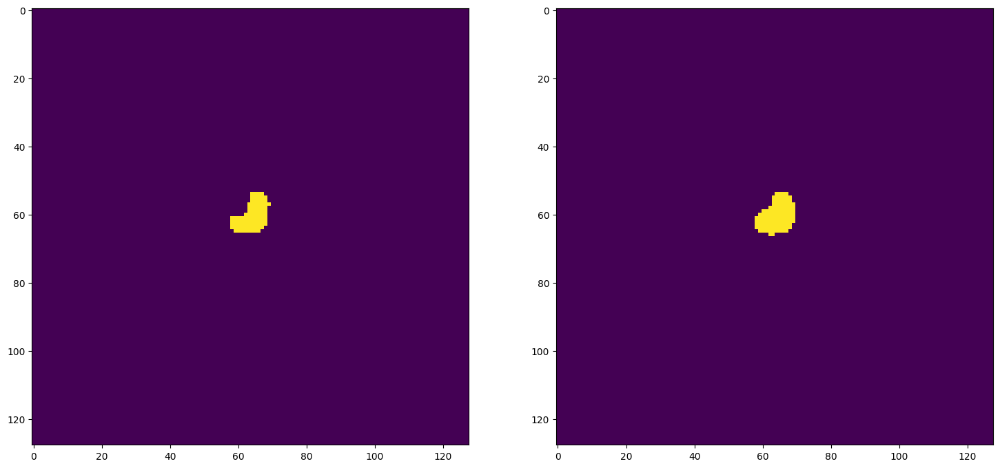


pancreas_404_008
Mean Value: 0.4986647963523865
0.6341743119266054
0.776140350877193

pancreas_404_016
Mean Value: 0.4926747977733612
0.7696280991735537
0.8698190309398716


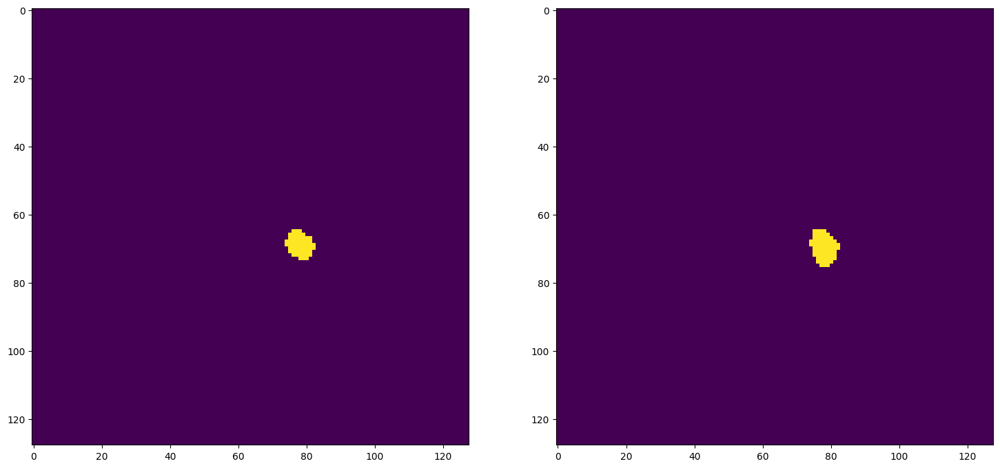

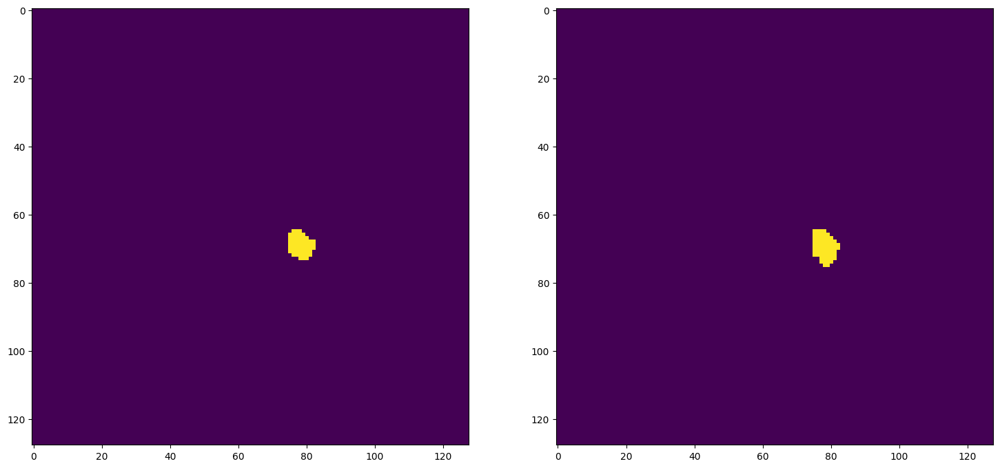

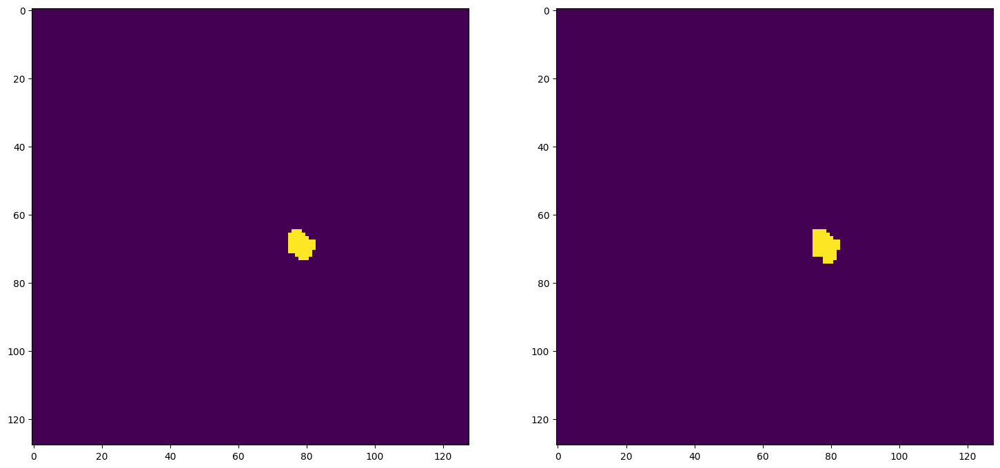

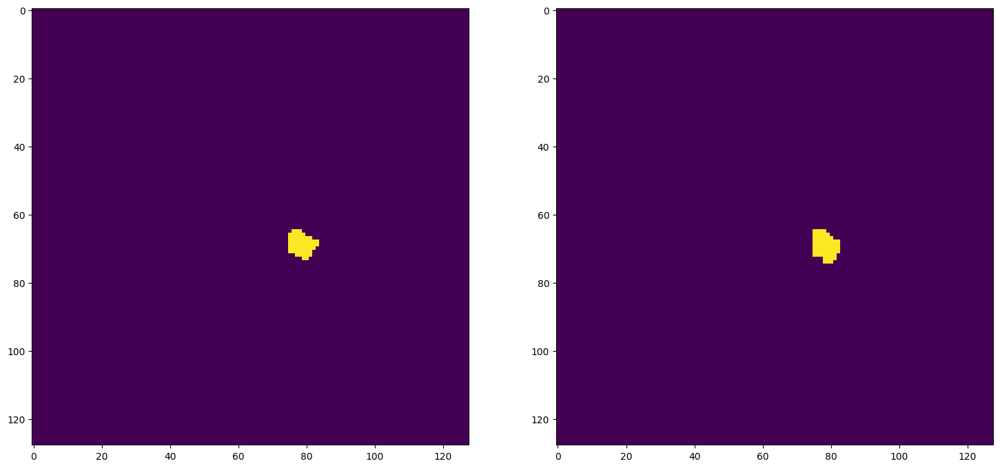

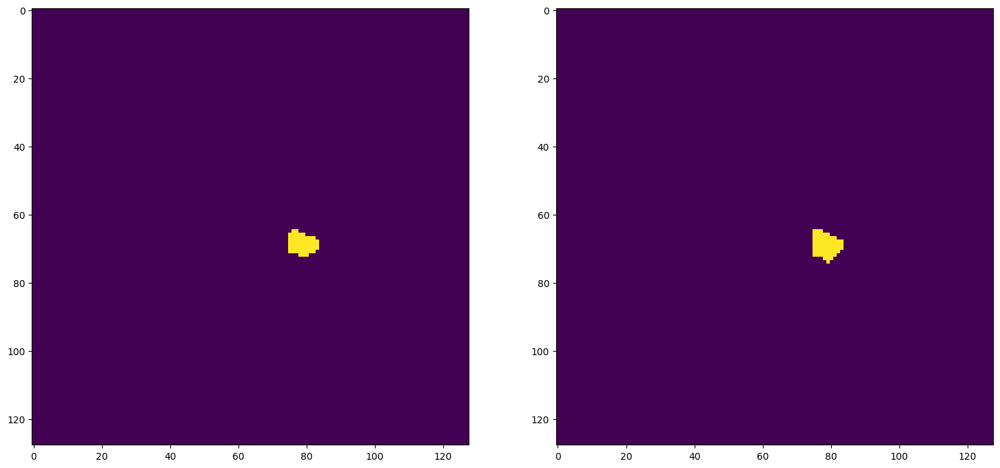

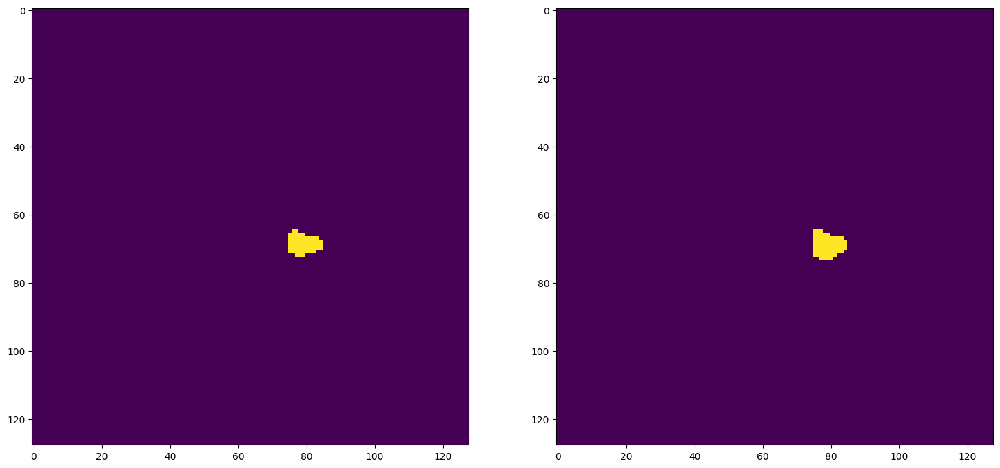


pancreas_404_024
Mean Value: 0.49259263277053833
0.6810542398777693
0.810270393092479

pancreas_412_064
Mean Value: 0.4657892882823944
0.6437692646411273
0.7832842218055184

pancreas_412_072
Mean Value: 0.494215726852417
0.6723320158102767
0.8040652328054834

pancreas_412_080
Mean Value: 0.495292991399765
0.6055488540410132
0.754320060105184

pancreas_412_088
Mean Value: 0.4990416169166565
0.5496987951807228
0.7094266277939747

pancreas_412_096
Mean Value: 0.4820709526538849
0.39599170697995856
0.5673267326732673

pancreas_413_000
Mean Value: 0.48989808559417725
0.2649685742639762
0.4189330543933054

pancreas_413_008
Mean Value: 0.46253326535224915
0.5988002822865208
0.7490620172147429

pancreas_413_016
Mean Value: 0.49417442083358765
0.3304831124412142
0.4967866323907455



In [39]:
data = []
n = 0
for batch in valloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        for i in range(ct_images.shape[0]):
            filename = val_ct_paths[n][-23:-7]
            print(filename)
            n += 1
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_min[labels_np == 0] = 0
            min_outputs = np.min(outputs_np_min)
            outputs_np_max[labels_np == 1] = 0
            max_outputs = np.max(outputs_np_max)
            mean_value = np.mean([min_outputs, max_outputs])  # Pass values as a list
            # mean_np = np.median(outputs_np)
            print(f'Mean Value: {mean_value}')
            # print(f'Mean np: {mean_np}')
            outputs_np = (outputs_np > mean_value)
            outputs_np_float = outputs_np.astype(float)

            structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            labeled_array, num_features = label(outputs_np, structure)
            component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            largest_component_index = np.argmax(component_sizes) + 1
            largest_component = np.zeros_like(outputs_np)
            largest_component[labeled_array == largest_component_index] = 1
            outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            print(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            print(dice)
            if dice >= 0.85:
                for i in range(29,35):
                    ar_lbl = labels_np[i,:,:]
                    ar_out = outputs_np[i,:,:]

                    fig = plt.figure(figsize=(18,15))

                    plt.subplot(1,2,1)
                    plt.imshow(ar_lbl)

                    plt.subplot(1,2,2)
                    plt.imshow(ar_out)

                    plt.show()
            print()

            data.append([filename, iou, dice, mean_value])

df = pd.DataFrame(data, columns=['Filename', 'IoU', 'Dice', 'Mean Value'])

pancreas_006_000
Mean Value: 0.492
0.586248492159228
0.7391634980988593

pancreas_006_008
Mean Value: 0.492
0.4815281276238455
0.6500425049589119

pancreas_006_016
Mean Value: 0.492
0.6706842923794712
0.802885734233186

pancreas_006_024
Mean Value: 0.492
0.6401773533424284
0.7806196714493657

pancreas_006_032
Mean Value: 0.492
0.26514399205561073
0.41915227629513346

pancreas_015_000
Mean Value: 0.492
0.6615865572489253
0.7963311382878645

pancreas_015_008
Mean Value: 0.492
0.7170904409398133
0.8352389878163075

pancreas_015_016
Mean Value: 0.492
0.5770975056689343
0.7318475916606758

pancreas_021_000
Mean Value: 0.492
0.7003024470717625
0.823738680465718

pancreas_021_008
Mean Value: 0.492
0.5934645115952214
0.7448732083792723

pancreas_021_016
Mean Value: 0.492
0.6414653156664069
0.7815764482431149

pancreas_021_024
Mean Value: 0.492
0.7039342076016892
0.8262457605009131

pancreas_025_000
Mean Value: 0.492
0.593238434163701
0.744695108331472

pancreas_025_008
Mean Value: 0.492
0.5532

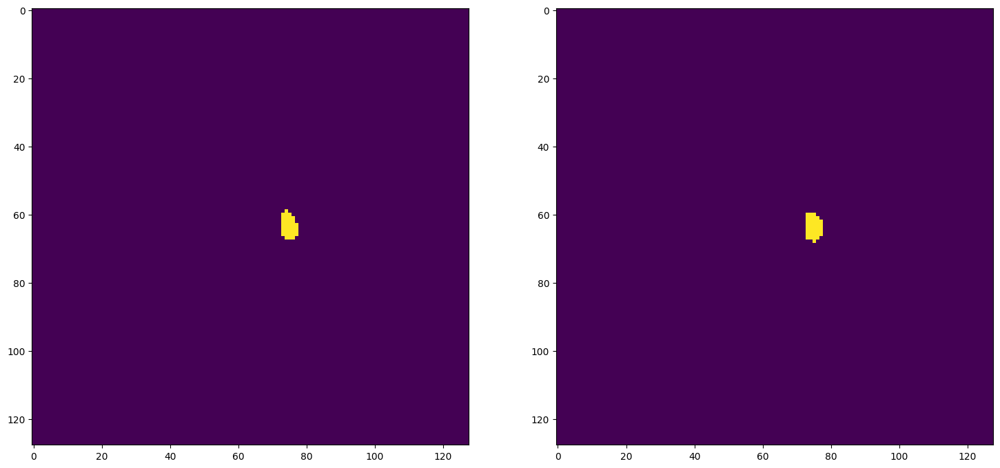

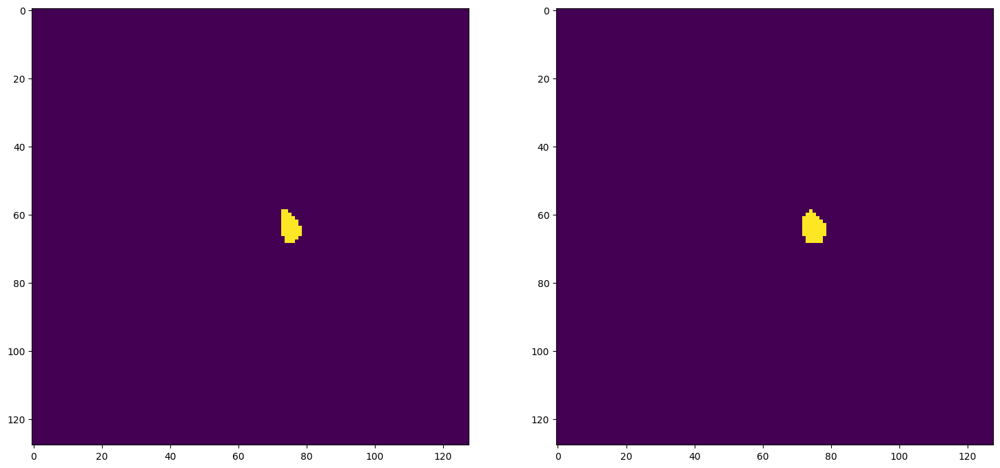

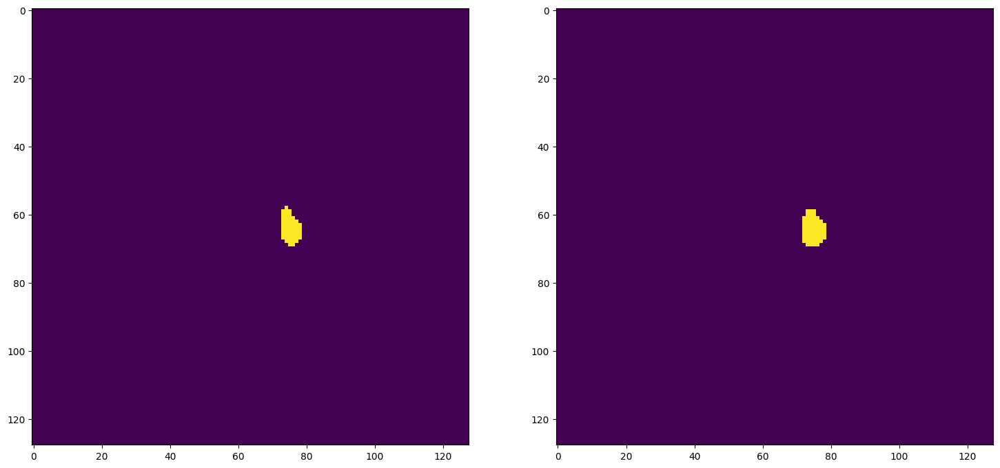

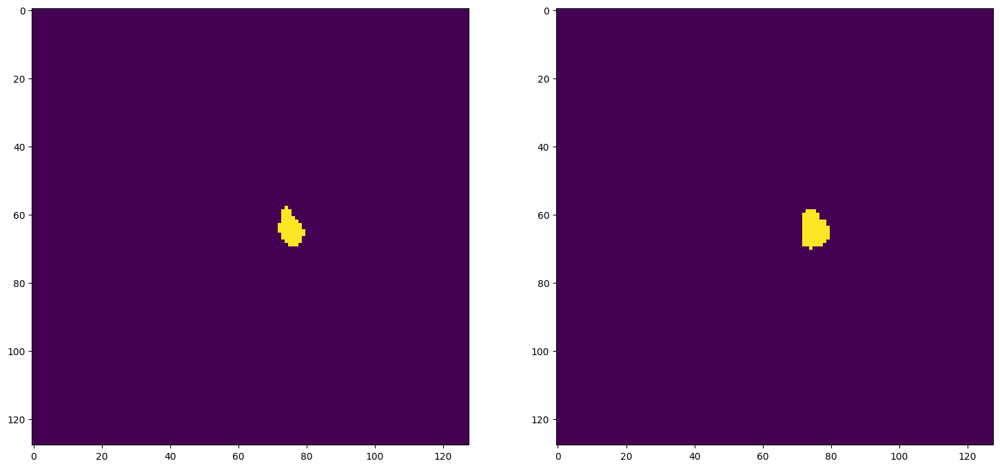

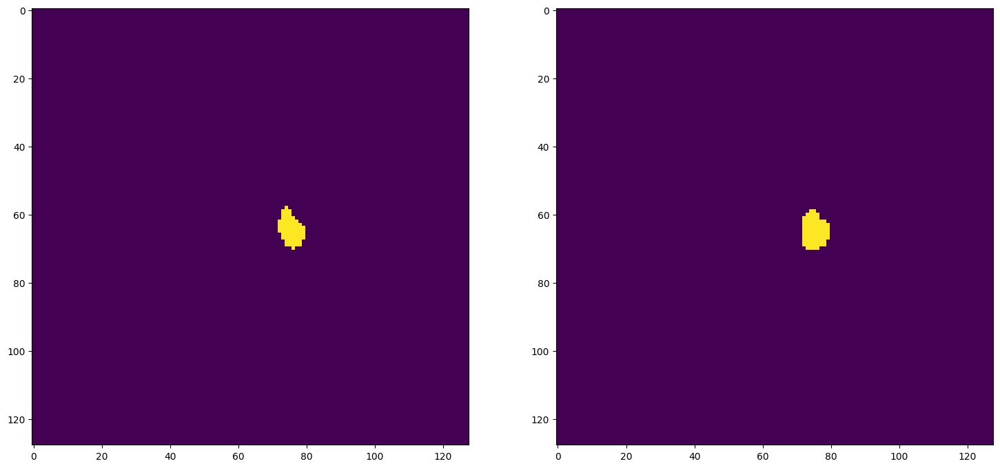

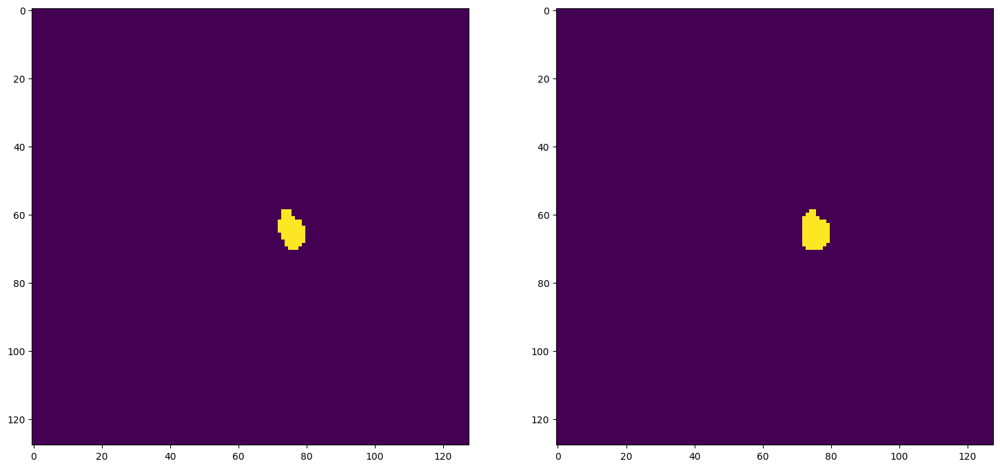


pancreas_084_000
Mean Value: 0.492
0.41259225092250923
0.5841632653061225

pancreas_084_008
Mean Value: 0.492
0.7122976427151377
0.8319787692818046

pancreas_084_016
Mean Value: 0.492
0.5356330553449583
0.6976055294988892

pancreas_088_016
Mean Value: 0.492
0.3028259473346179
0.4648755237860488

pancreas_088_024
Mean Value: 0.492
0.6564
0.7925621830475731

pancreas_088_032
Mean Value: 0.492
0.40868366643694004
0.5802348336594912

pancreas_095_000
Mean Value: 0.492
0.6486272439281943
0.7868694955964772

pancreas_095_008
Mean Value: 0.492
0.24202287778446718
0.38972370334464373

pancreas_095_016
Mean Value: 0.492
0.694680030840401
0.8198362147406734

pancreas_098_032
Mean Value: 0.492
0.642818132168214
0.7825797872340425

pancreas_098_040
Mean Value: 0.492
0.5287757237530519
0.6917636322153776

pancreas_098_048
Mean Value: 0.492
0.6931394481730052
0.8187623871393966

pancreas_098_056
Mean Value: 0.492
0.6293941660433807
0.7725499196694974

pancreas_119_000
Mean Value: 0.492
0.1005025125

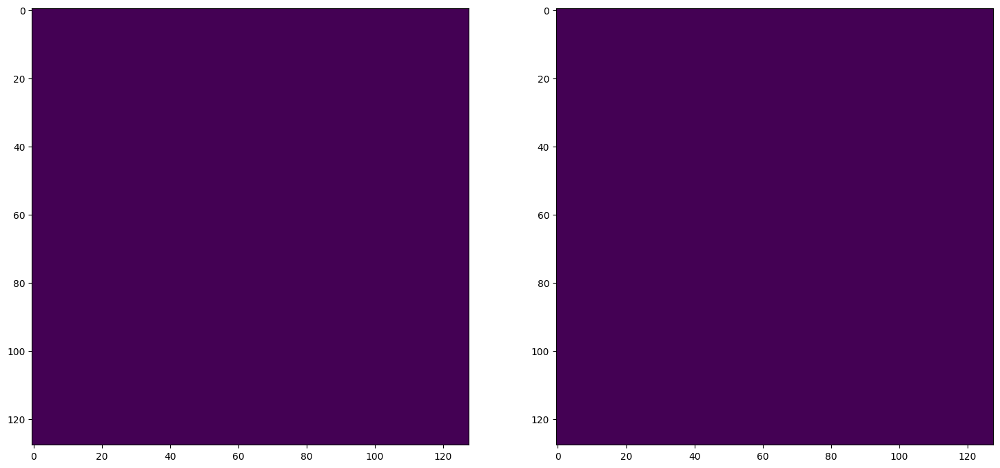

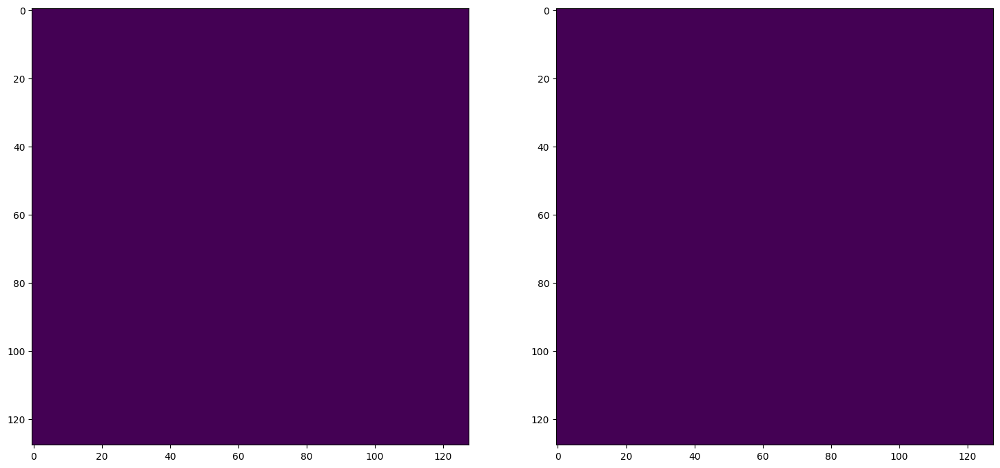

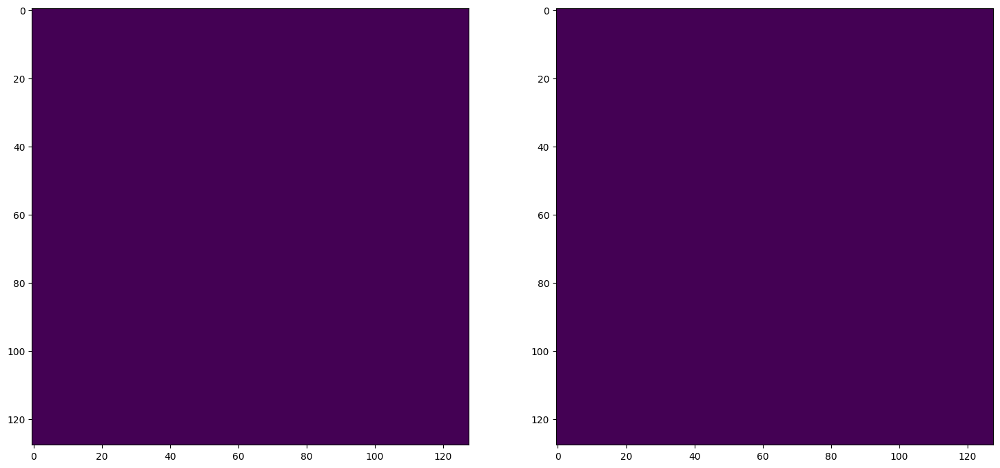

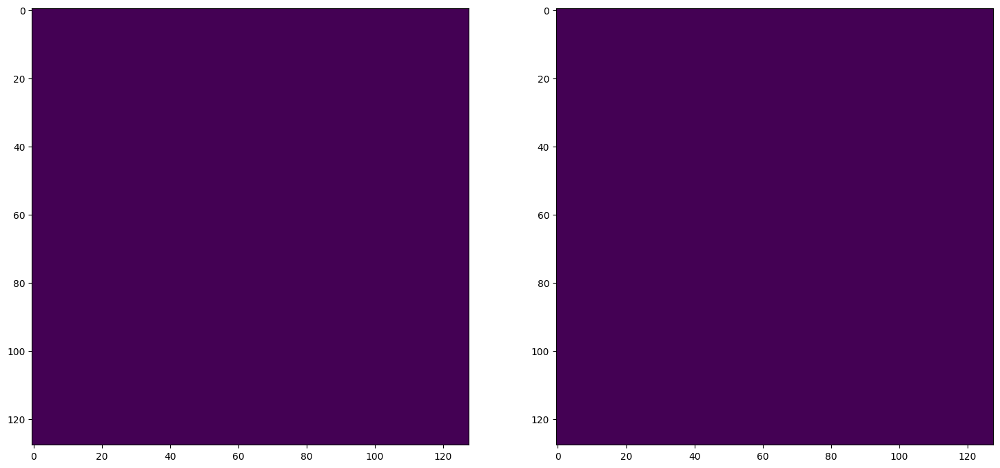

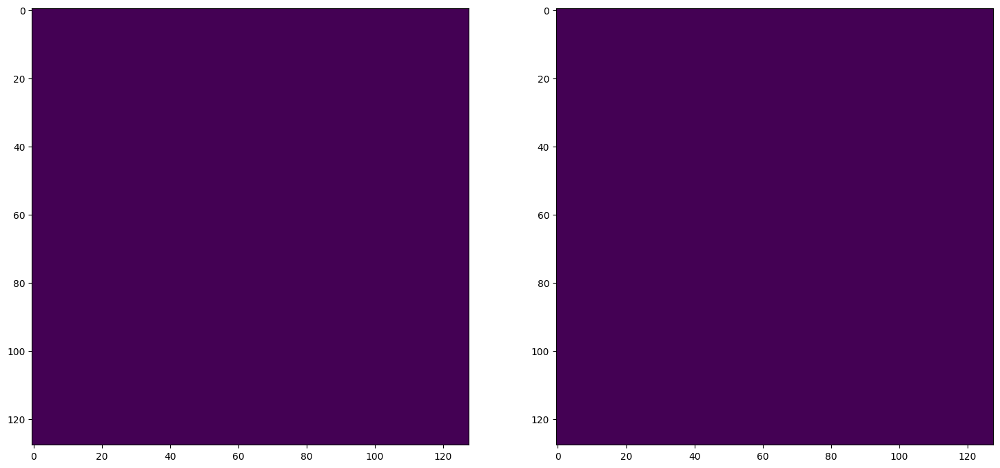

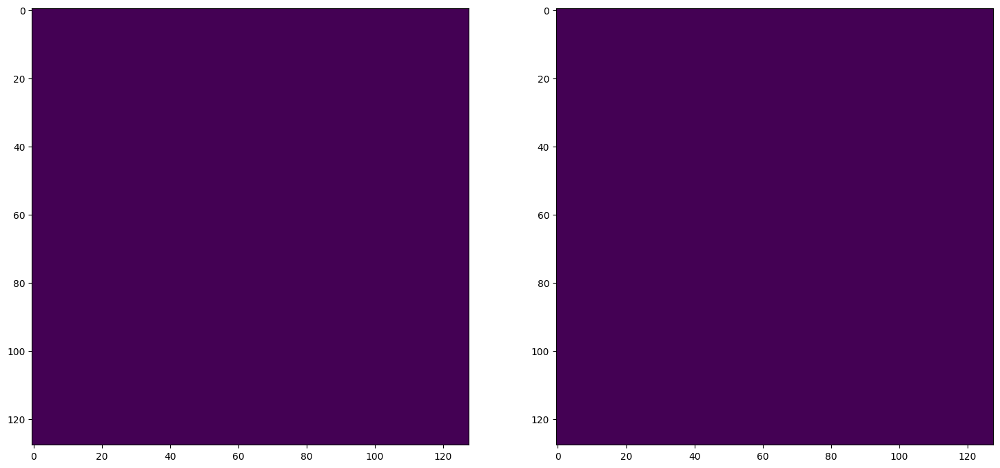


pancreas_120_032
Mean Value: 0.492
0.7896362388469458
0.8824544582933844


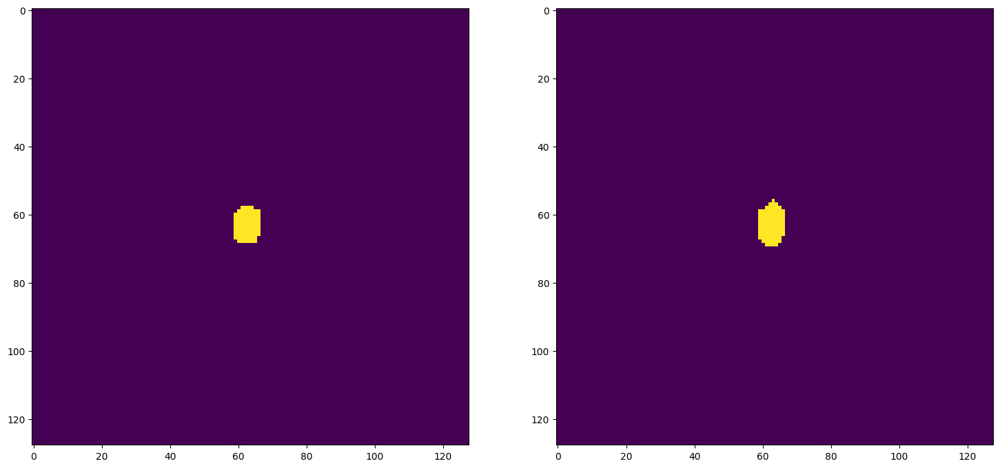

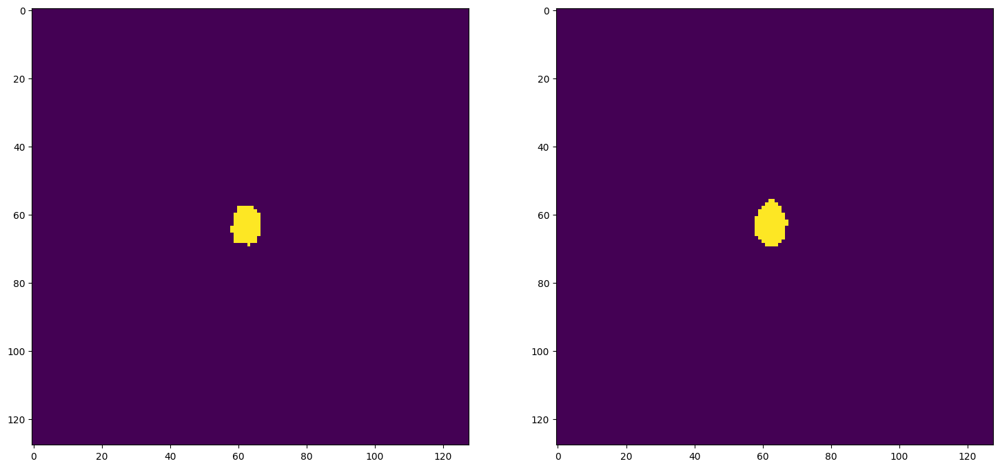

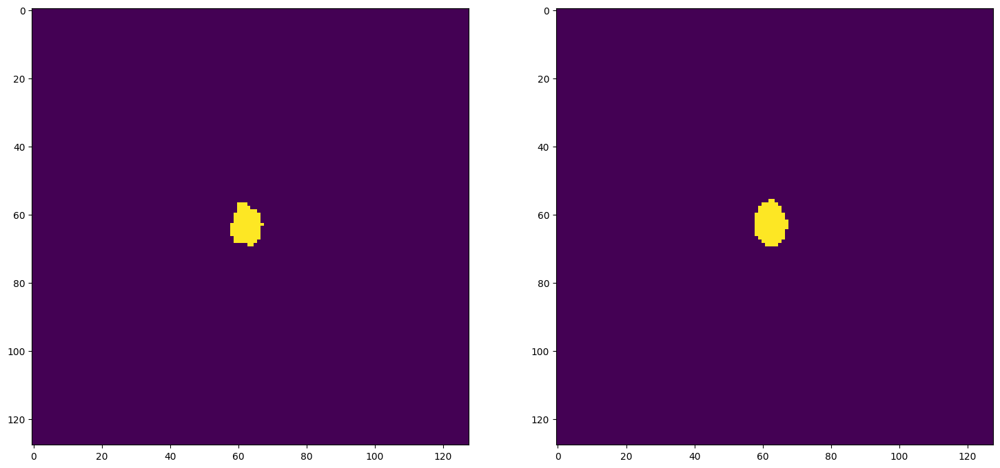

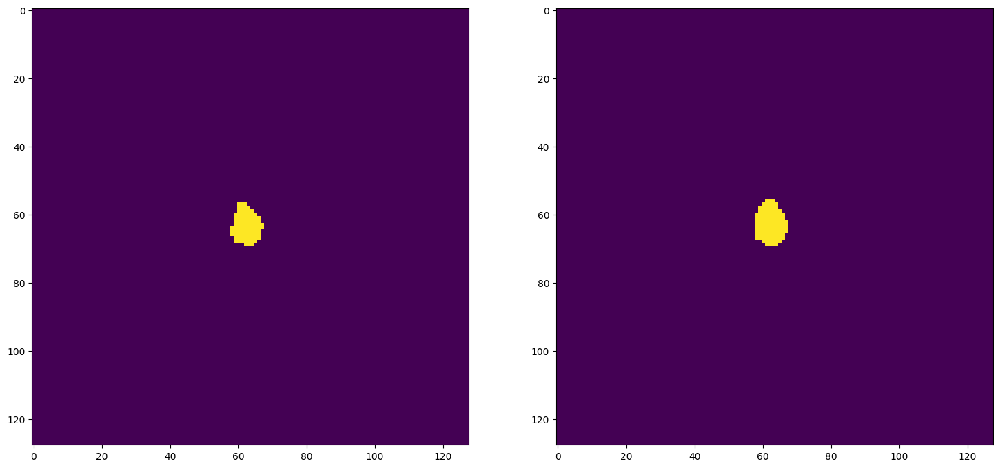

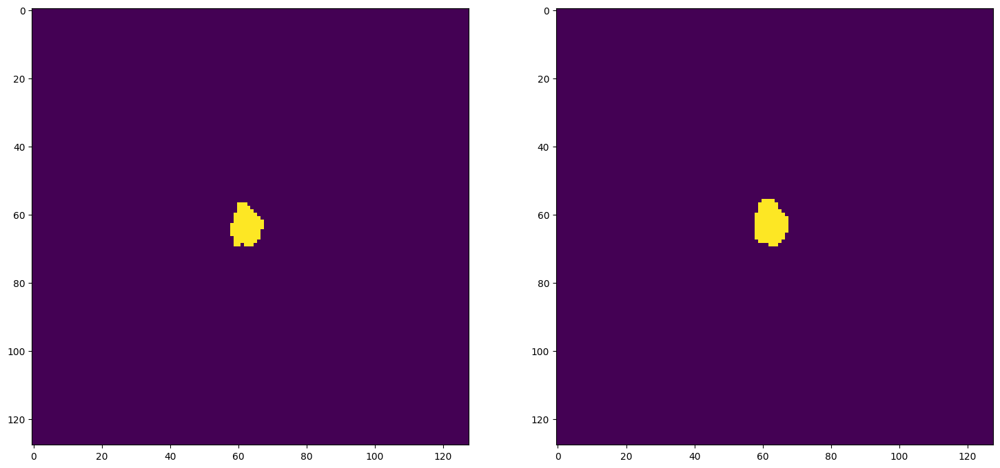

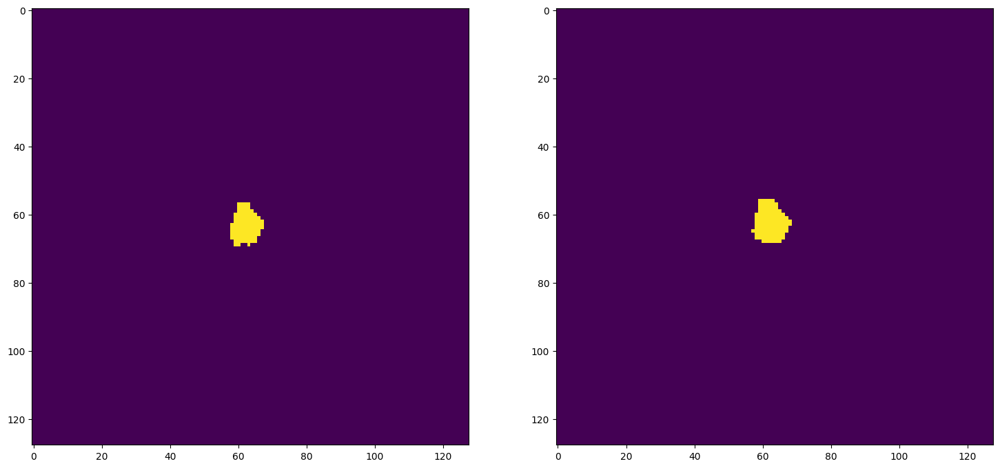


pancreas_120_040
Mean Value: 0.492
0.6561465460163319
0.7923773987206824

pancreas_124_000
Mean Value: 0.492
0.6435852372583479
0.783147989734816

pancreas_124_008
Mean Value: 0.492
0.7647967061245496
0.8667249927092446


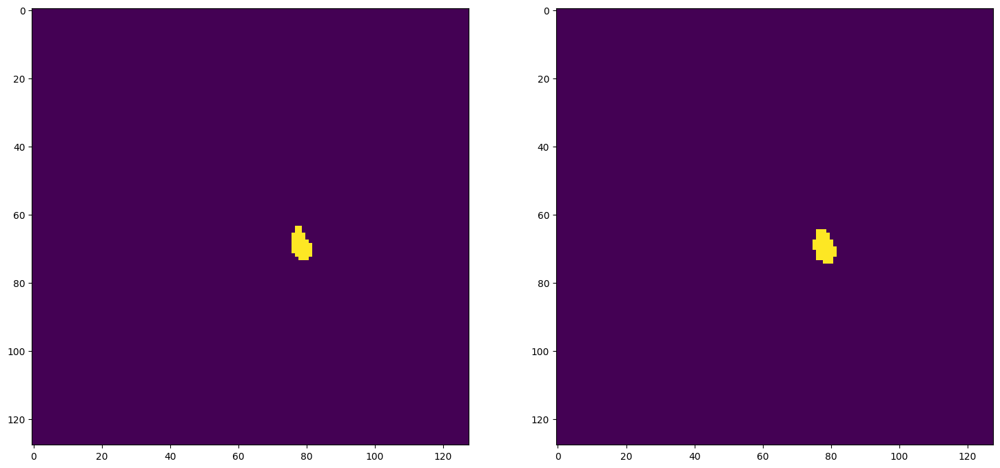

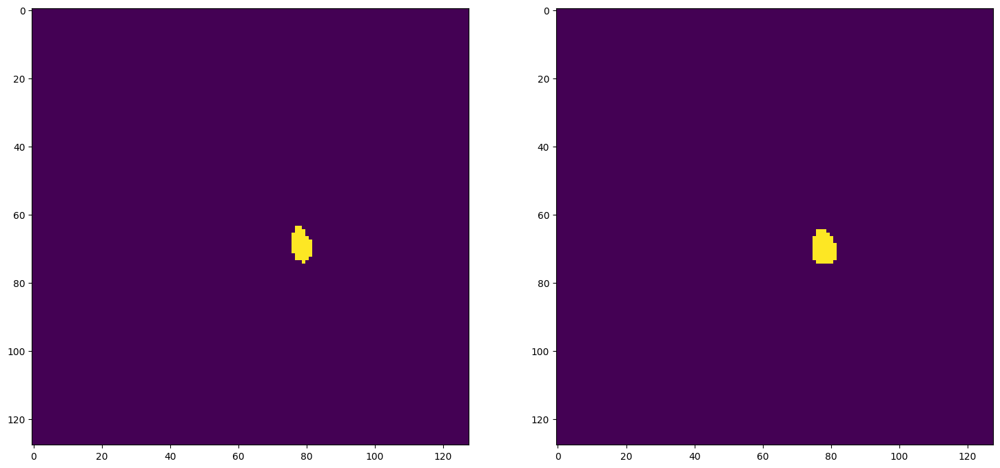

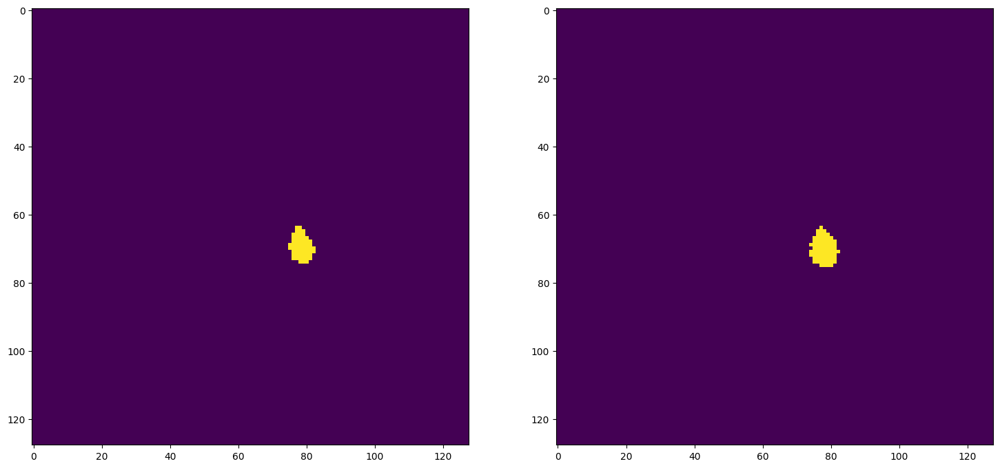

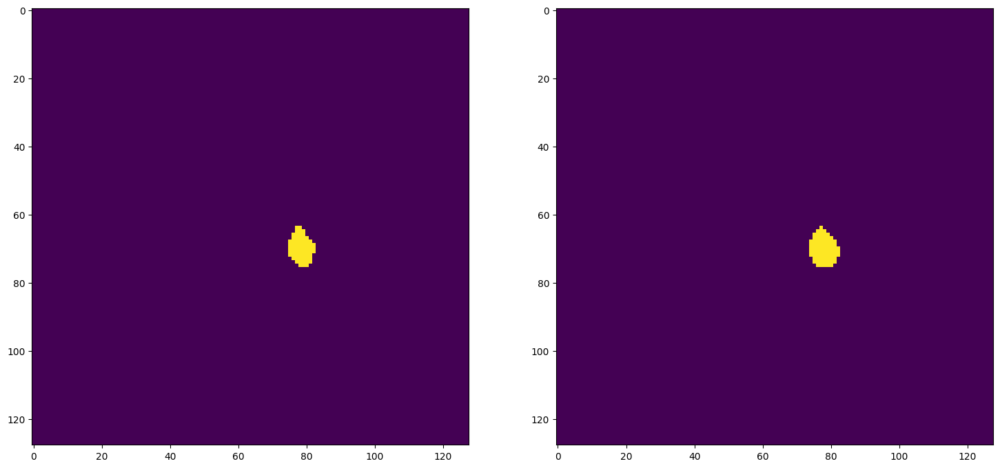

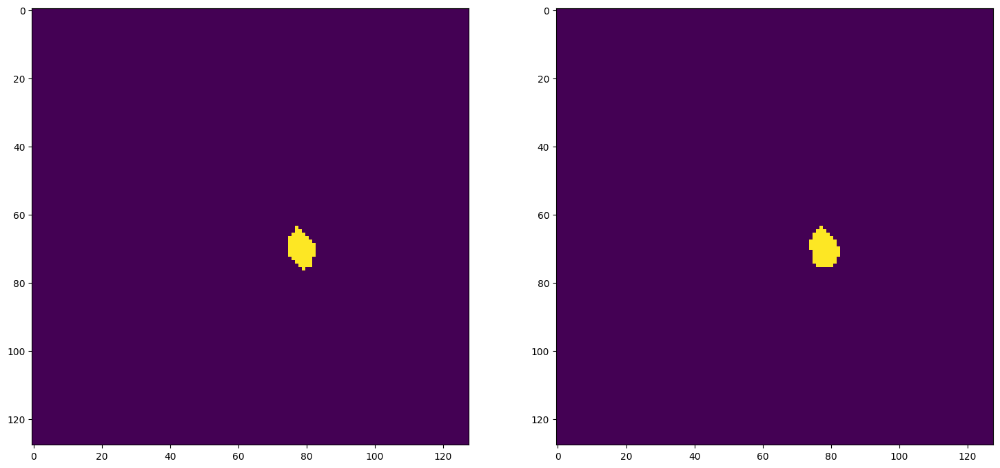

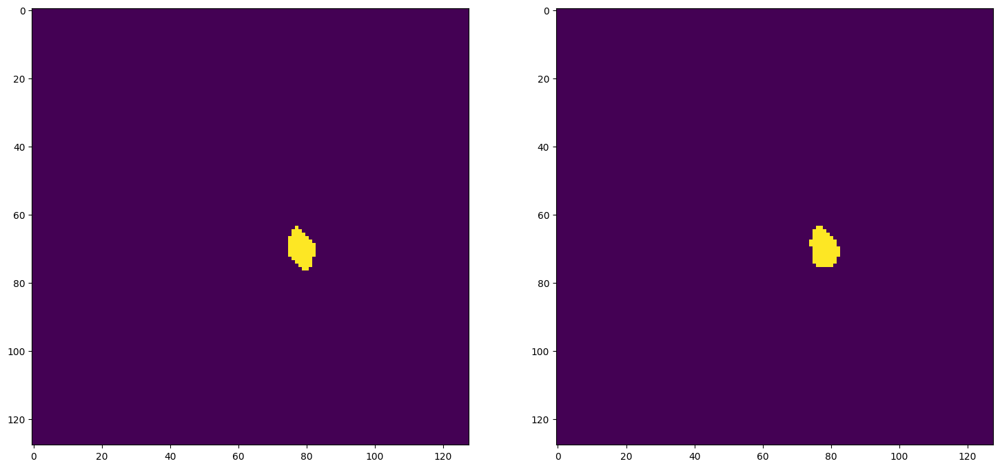


pancreas_124_016
Mean Value: 0.492
0.38491048593350385
0.5558633425669437

pancreas_125_000
Mean Value: 0.492
0.30382186061449523
0.46604811560883486

pancreas_125_008
Mean Value: 0.492
0.39107883817427386
0.5622669649515287

pancreas_125_016
Mean Value: 0.492
0.6867077766358342
0.814258149690261

pancreas_145_000
Mean Value: 0.492
0.7021013597033374
0.8249818445896877

pancreas_145_008
Mean Value: 0.492
0.6285388870810283
0.7719052852432811

pancreas_149_000
Mean Value: 0.492
0.7935306262904336
0.8848810437452034


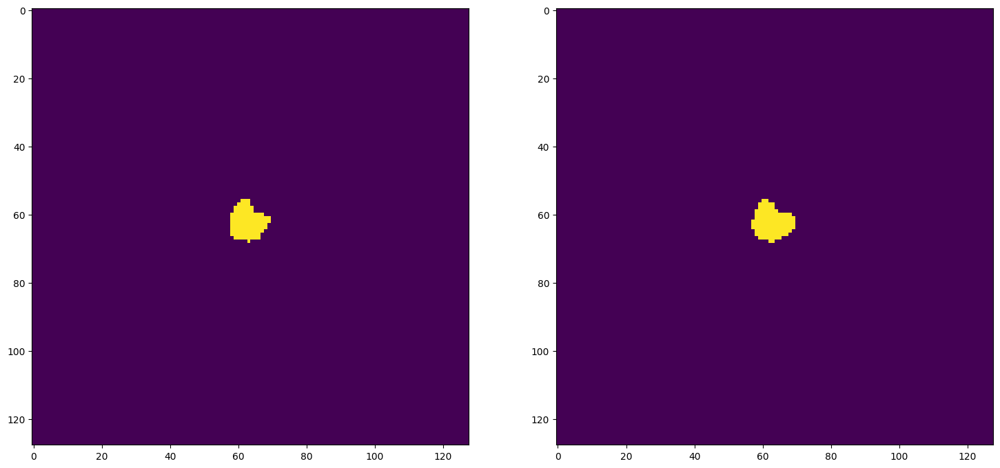

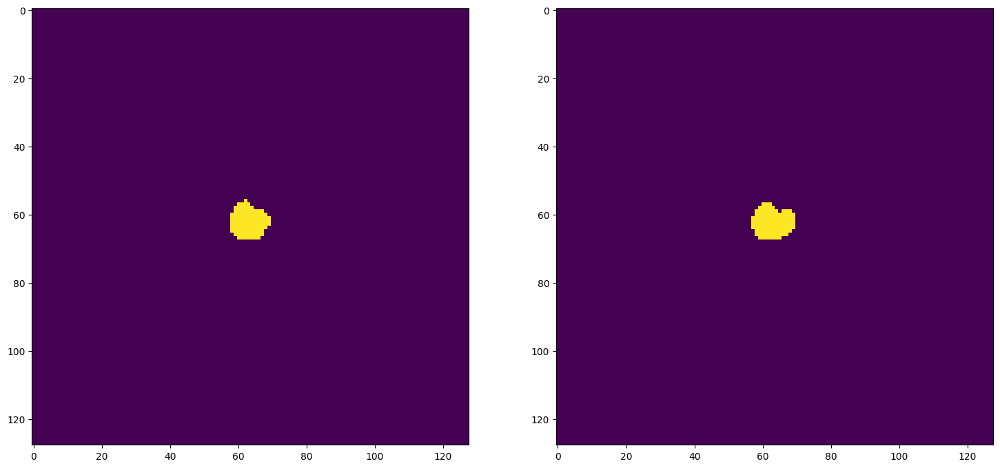

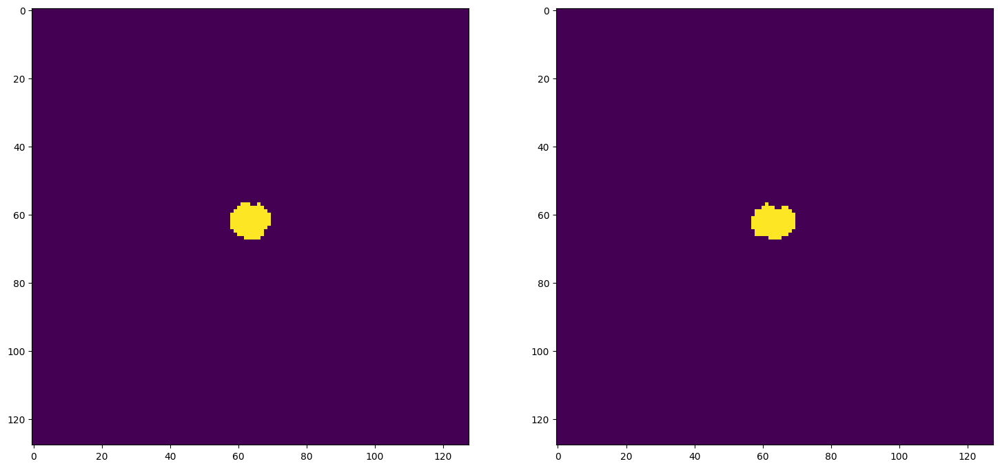

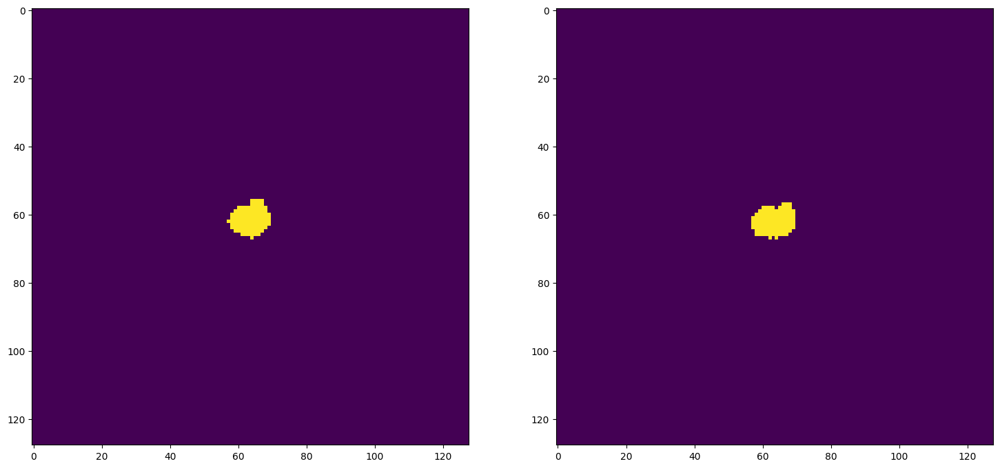

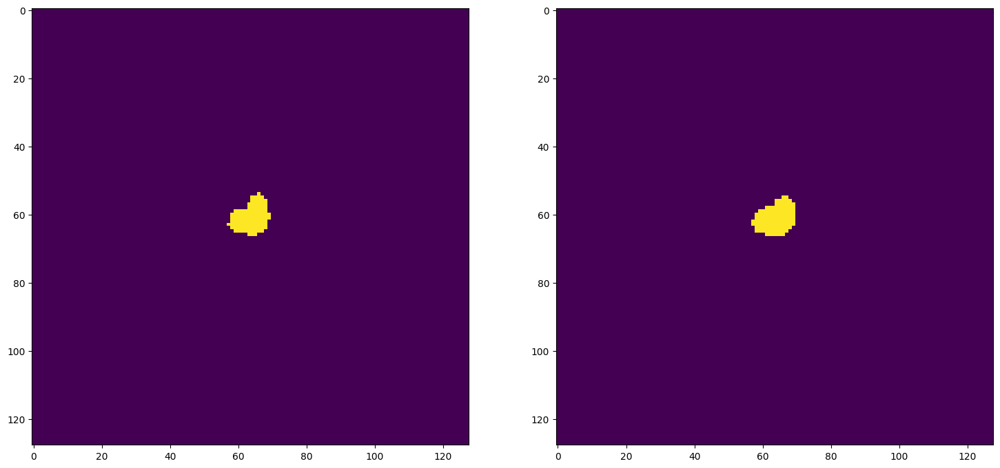

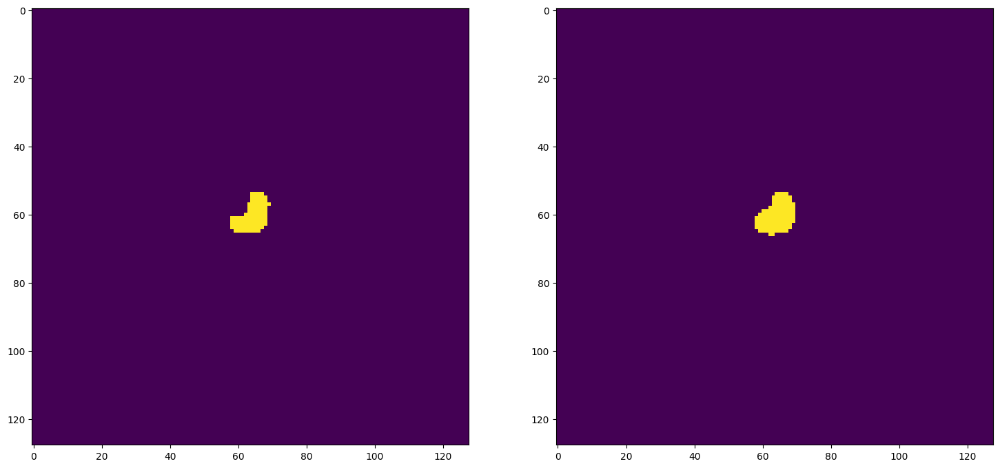


pancreas_155_000
Mean Value: 0.492
0.12534722222222222
0.22277074976858993

pancreas_155_008
Mean Value: 0.492
0.8321990642279881
0.9084155542658154


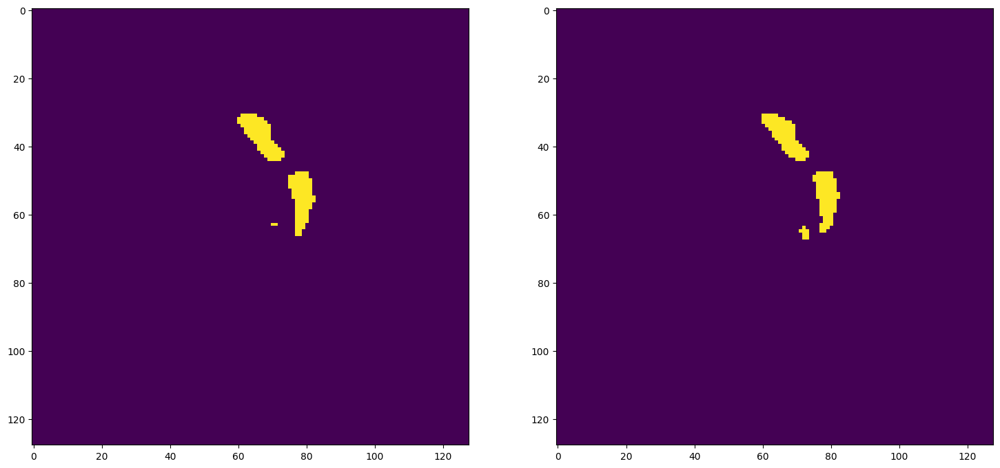

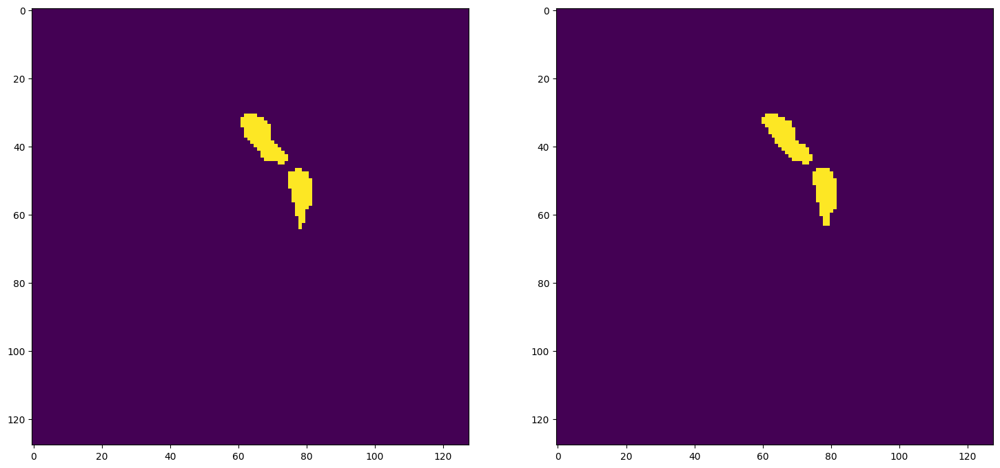

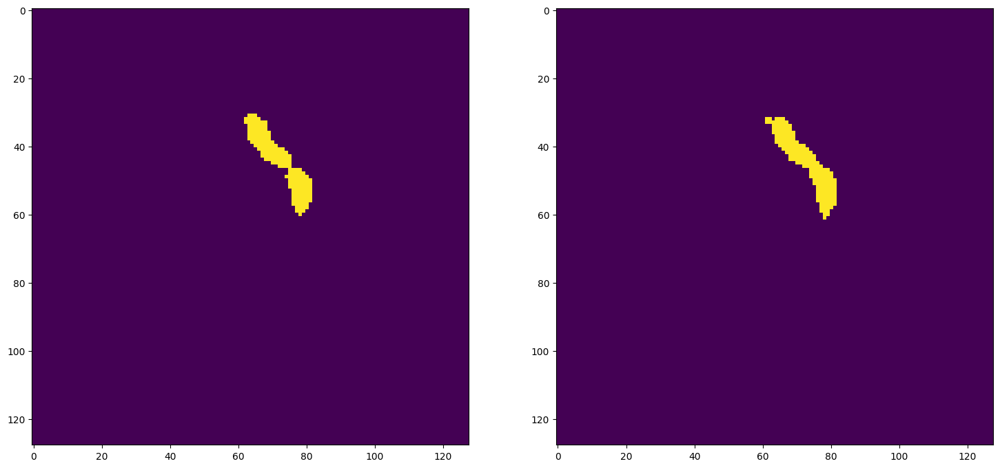

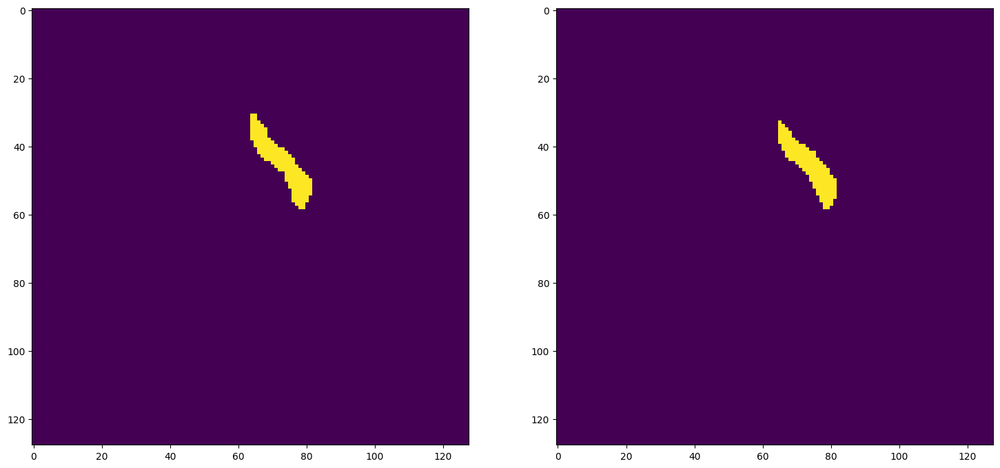

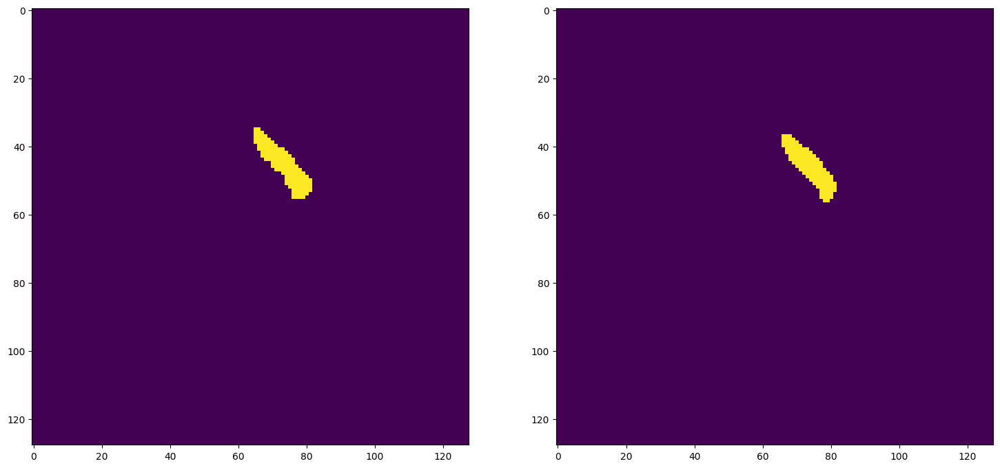

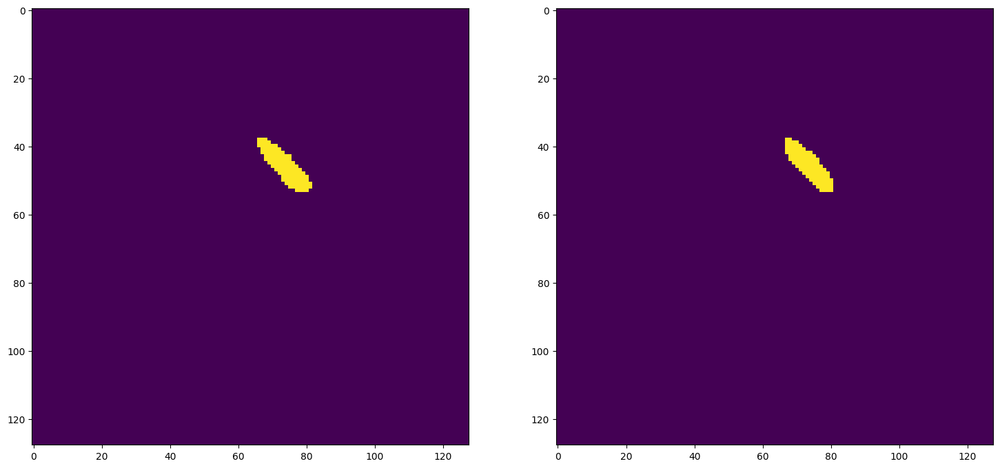


pancreas_155_016
Mean Value: 0.492
0.727359088030399
0.8421631530705774

pancreas_155_024
Mean Value: 0.492
0.5969145569620253
0.747584840227892

pancreas_173_000
Mean Value: 0.492
0.5732673267326732
0.7287602265575834

pancreas_173_008
Mean Value: 0.492
0.4875112849834487
0.6554723851911795

pancreas_173_016
Mean Value: 0.492
0.7717108684347374
0.8711476372174934


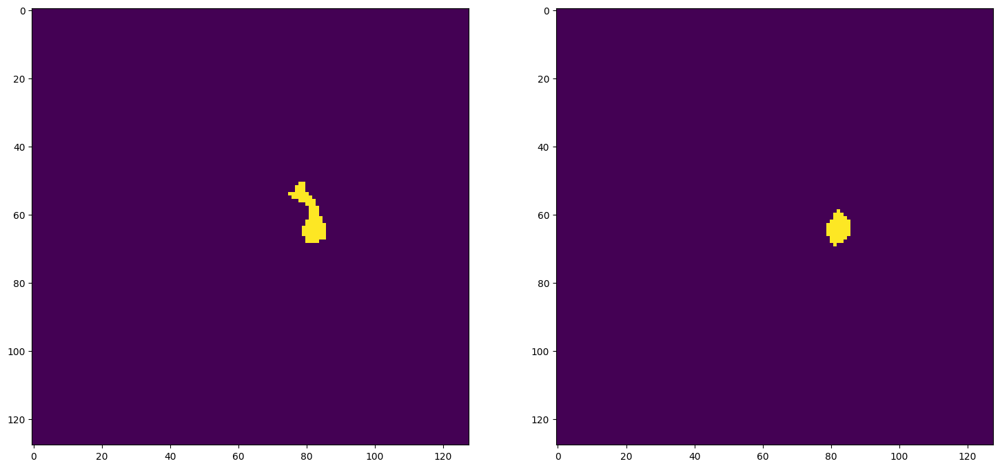

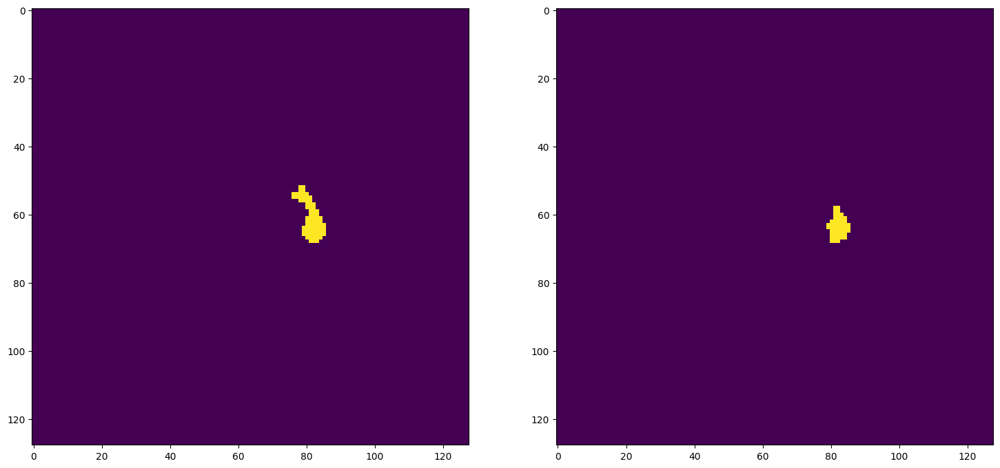

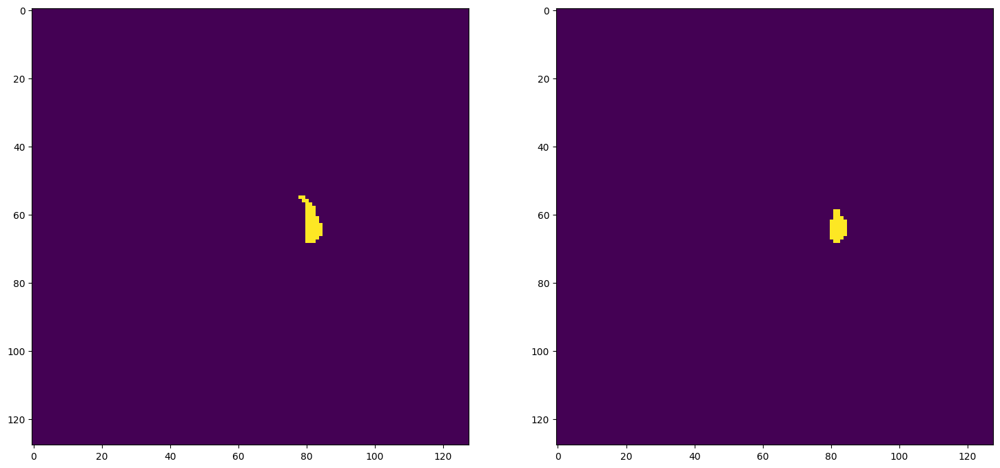

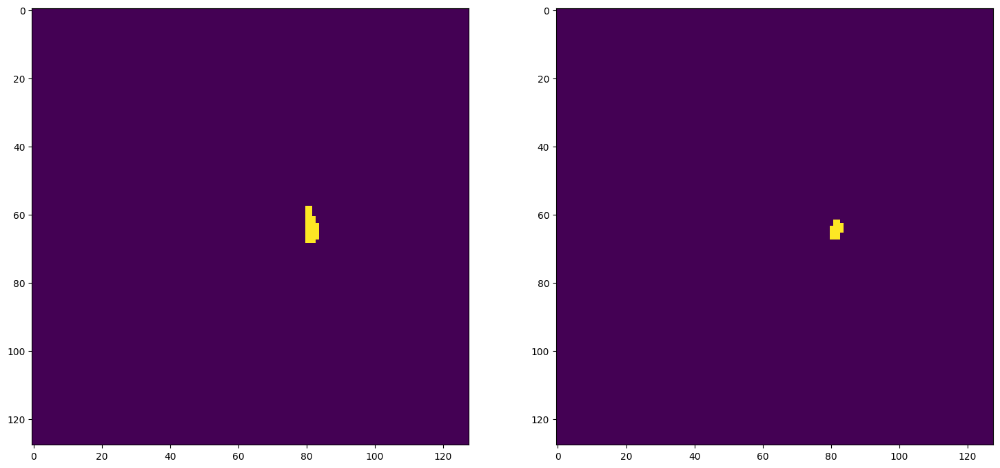

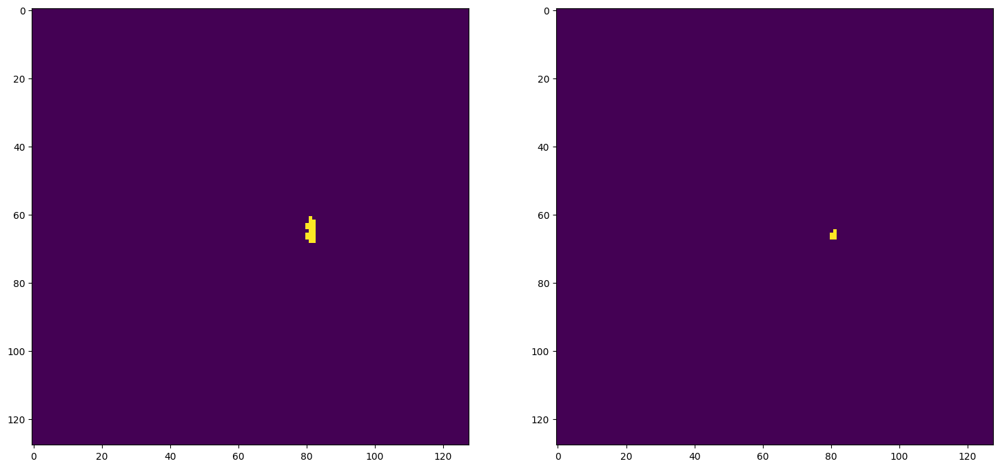

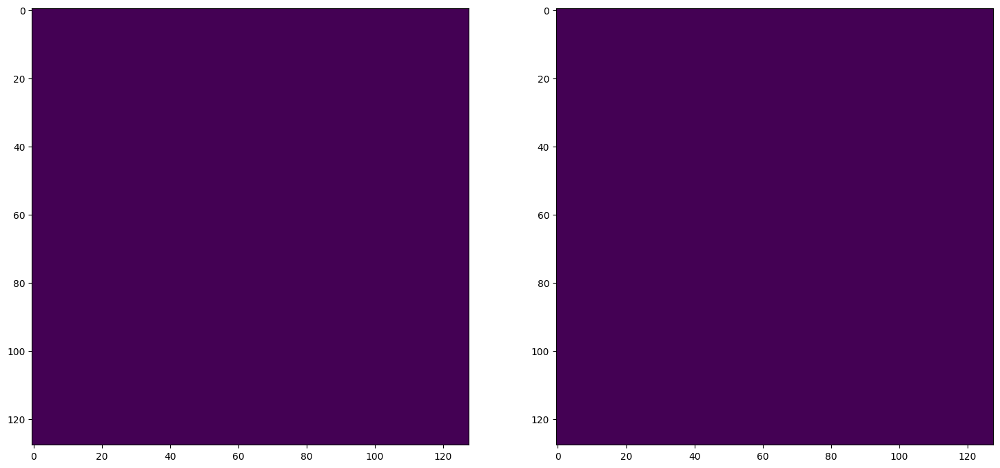


pancreas_178_008
Mean Value: 0.492
0.7303742961245445
0.8441807044410413

pancreas_178_016
Mean Value: 0.492
0.45783684692942256
0.6281043696950644

pancreas_178_024
Mean Value: 0.492
0.6134889753566797
0.7604501607717041

pancreas_178_032
Mean Value: 0.492
0.5781448538754765
0.7326892109500805

pancreas_178_040
Mean Value: 0.492
0.5529290853031861
0.7121111846459298

pancreas_179_000
Mean Value: 0.492
0.6317579054743284
0.7743279849968744

pancreas_179_008
Mean Value: 0.492
0.3481418197351559
0.5164765525982256

pancreas_179_016
Mean Value: 0.492
0.6591439688715953
0.7945590994371482

pancreas_179_024
Mean Value: 0.492
0.6772122879413113
0.8075451066156369

pancreas_194_016
Mean Value: 0.492
0.522823779193206
0.6866504008365284

pancreas_194_024
Mean Value: 0.492
0.7180821917808219
0.8359113379046405

pancreas_199_000
Mean Value: 0.492
0.6334221545489152
0.7755767886273596

pancreas_199_008
Mean Value: 0.492
0.6282909415439536
0.7717182789805426

pancreas_199_016
Mean Value: 0.492
0.

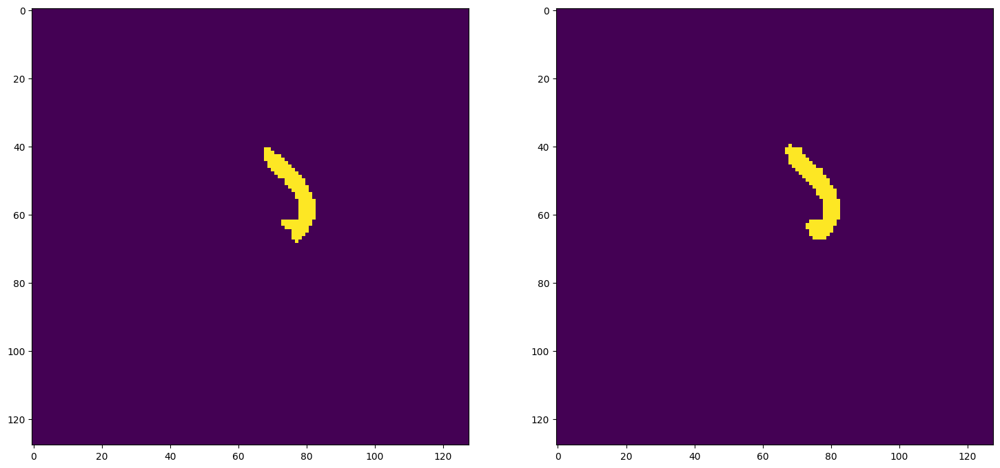

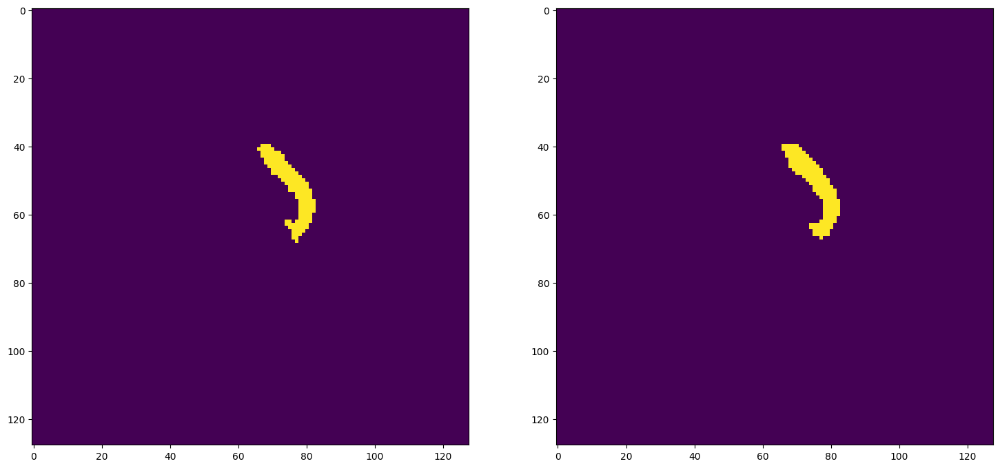

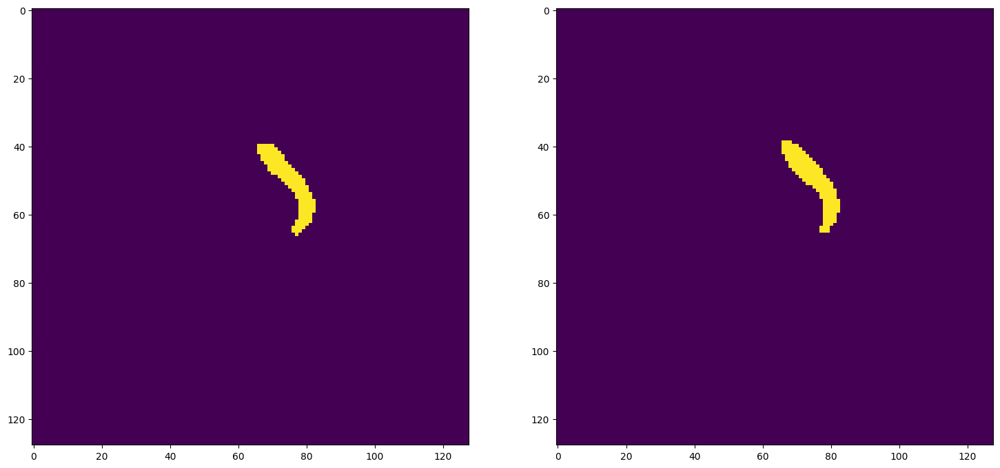

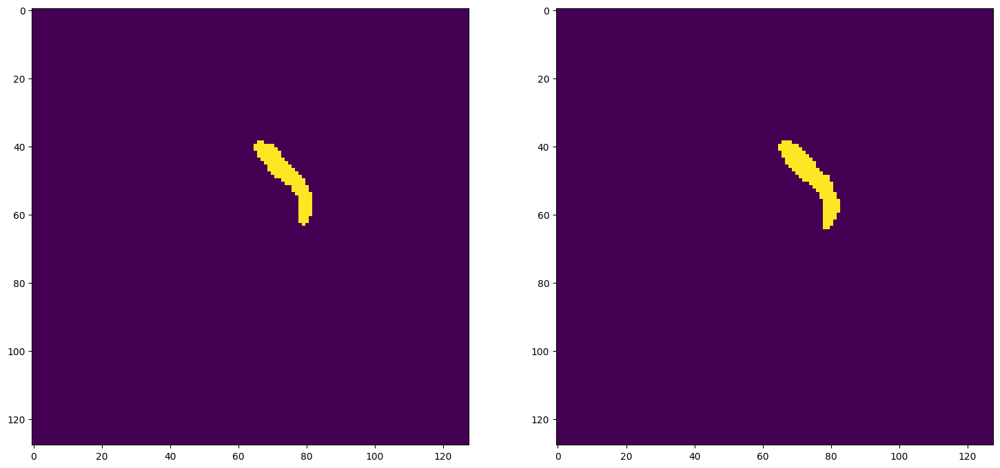

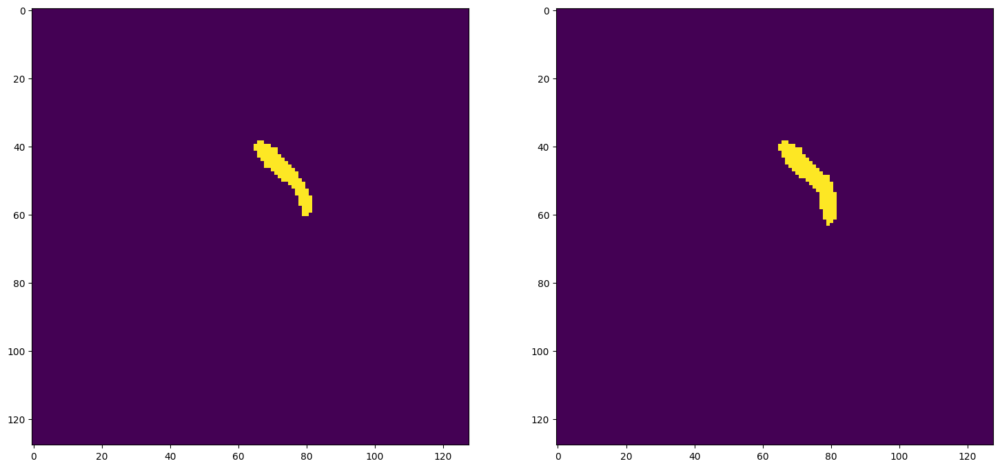

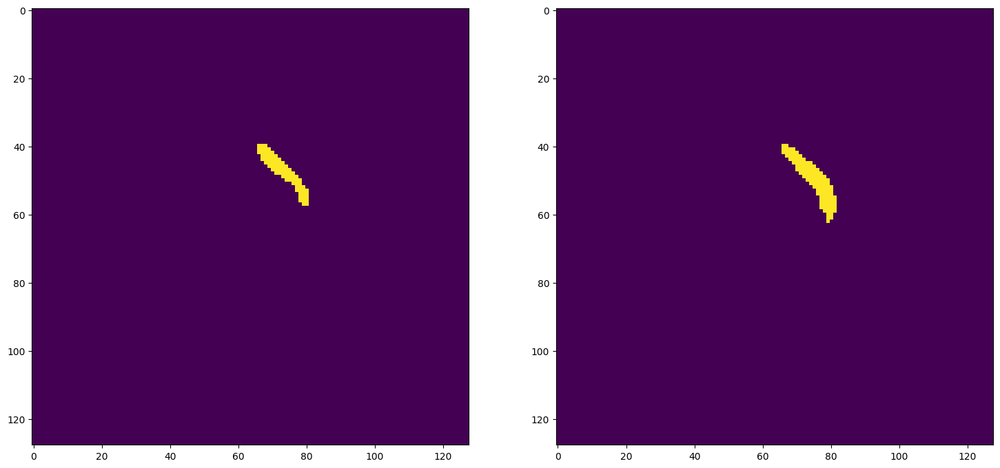


pancreas_212_016
Mean Value: 0.492
0.30176371104131433
0.46362286562731997

pancreas_212_024
Mean Value: 0.492
0.5397888753552578
0.7011206328279499

pancreas_212_032
Mean Value: 0.492
0.6203208556149733
0.7656765676567657

pancreas_213_000
Mean Value: 0.492
0.5947853362085865
0.7459127228027044

pancreas_213_008
Mean Value: 0.492
0.6375674350171653
0.7786762503743636

pancreas_213_016
Mean Value: 0.492
0.7013208351086493
0.824442774855998

pancreas_213_024
Mean Value: 0.492
0.5189493433395872
0.683300395256917

pancreas_214_008
Mean Value: 0.492
0.5713827398139236
0.7272356063699469

pancreas_214_016
Mean Value: 0.492
0.5774378585086042
0.7321212121212122

pancreas_214_024
Mean Value: 0.492
0.4616457461645746
0.6316793893129771

pancreas_214_032
Mean Value: 0.492
0.4278835129557441
0.5993255179058937

pancreas_217_000
Mean Value: 0.492
0.5797018348623854
0.7339382940108893

pancreas_217_008
Mean Value: 0.492
0.5741056218057922
0.7294372294372294

pancreas_217_016
Mean Value: 0.492
0.

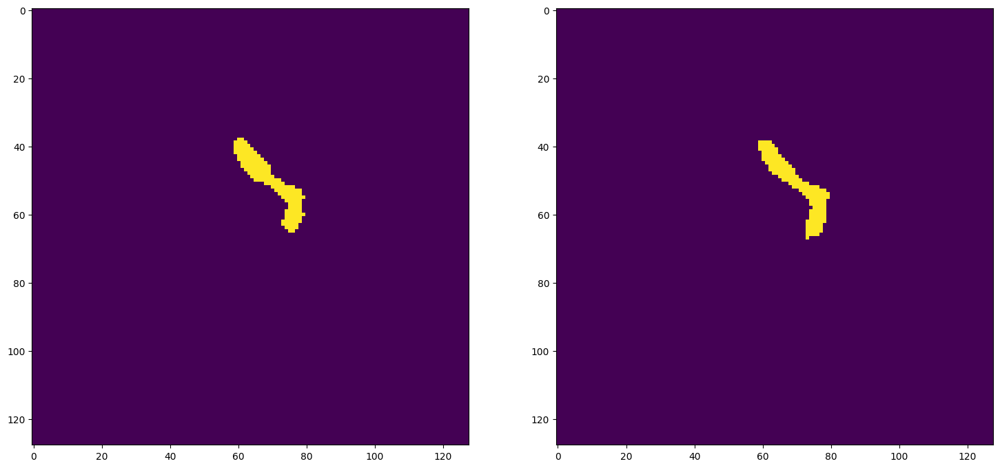

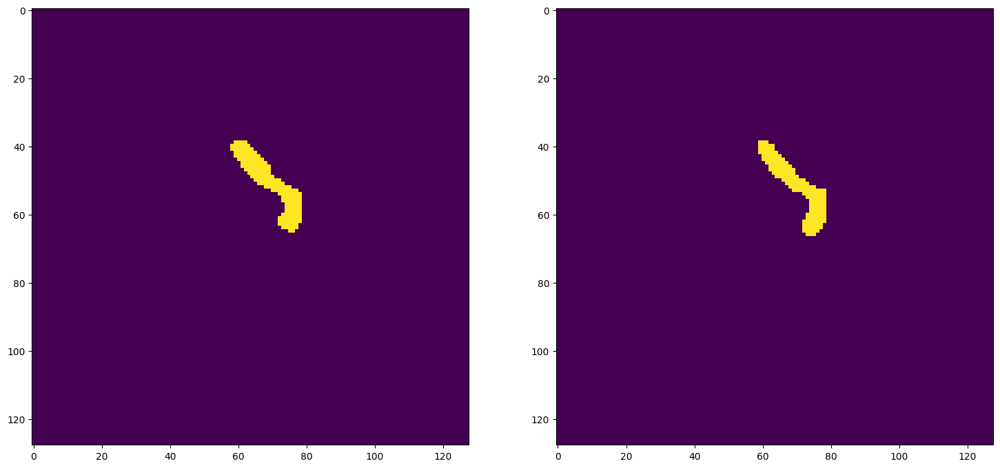

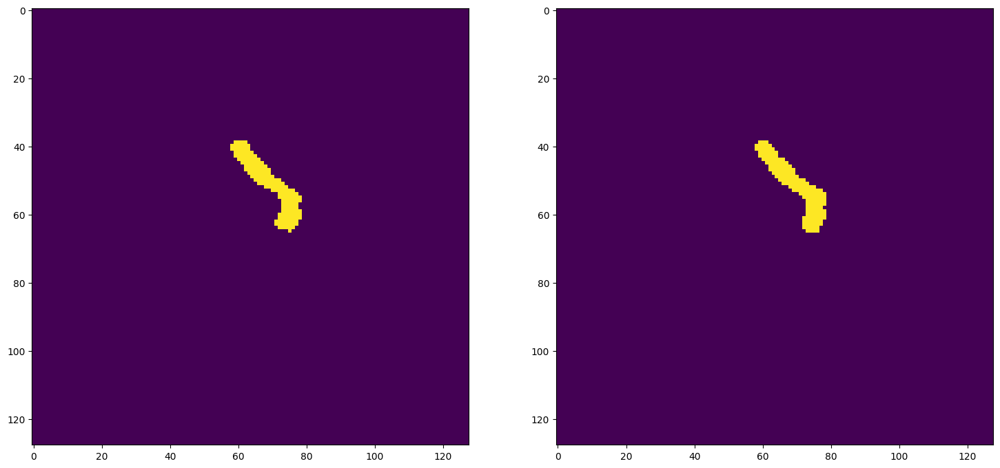

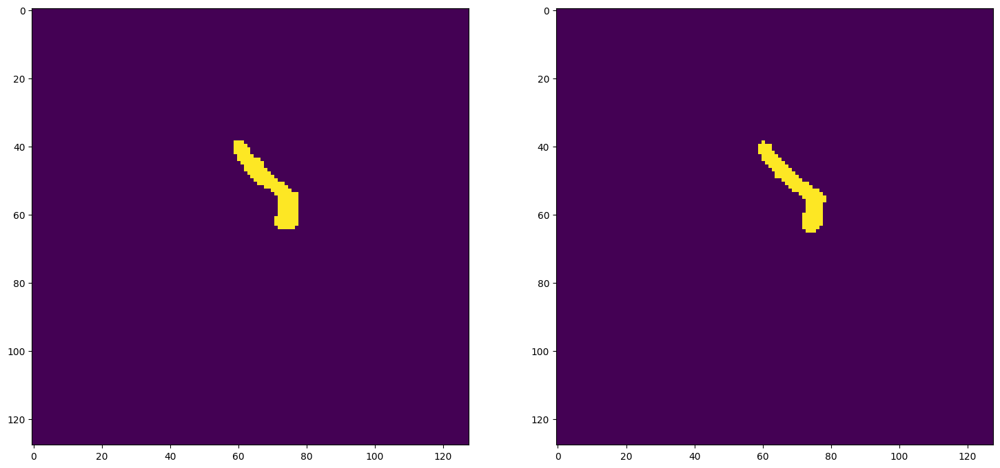

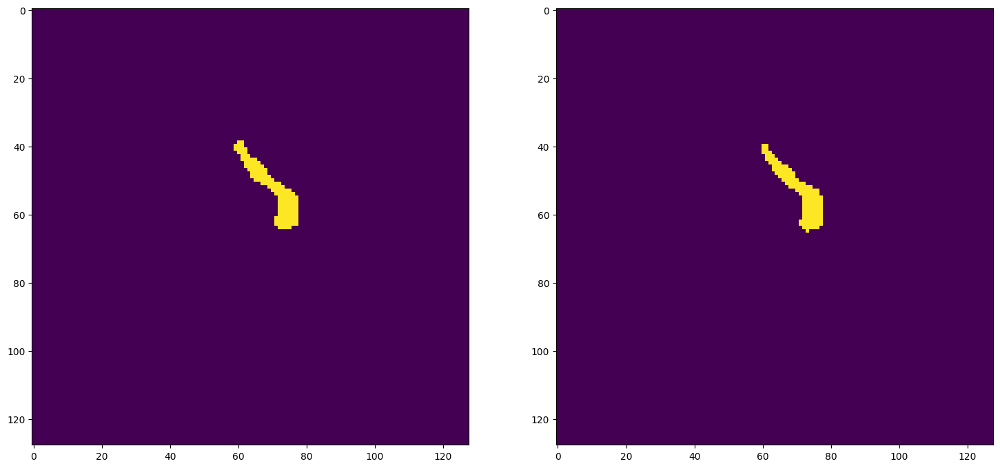

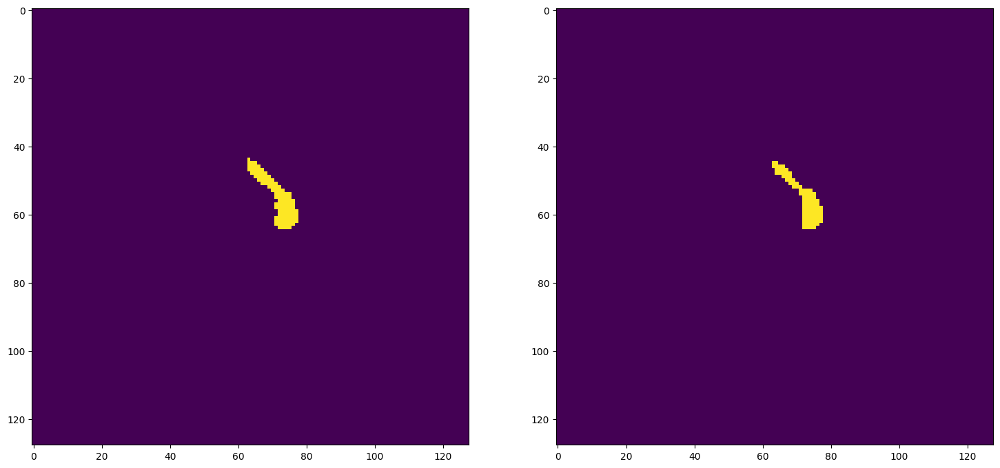


pancreas_217_024
Mean Value: 0.492
0.7155313351498638
0.8341804320203303

pancreas_217_032
Mean Value: 0.492
0.2996031746031746
0.46106870229007635

pancreas_218_000
Mean Value: 0.492
0.4887687188019967
0.6566079910589551

pancreas_218_008
Mean Value: 0.492
0.5314465408805031
0.6940451745379876

pancreas_218_016
Mean Value: 0.492
0.8139237811368959
0.8974178403755868


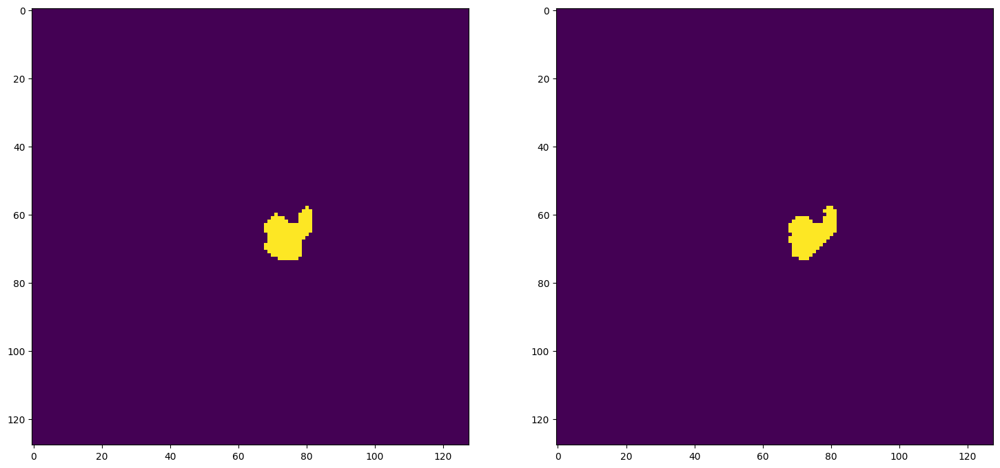

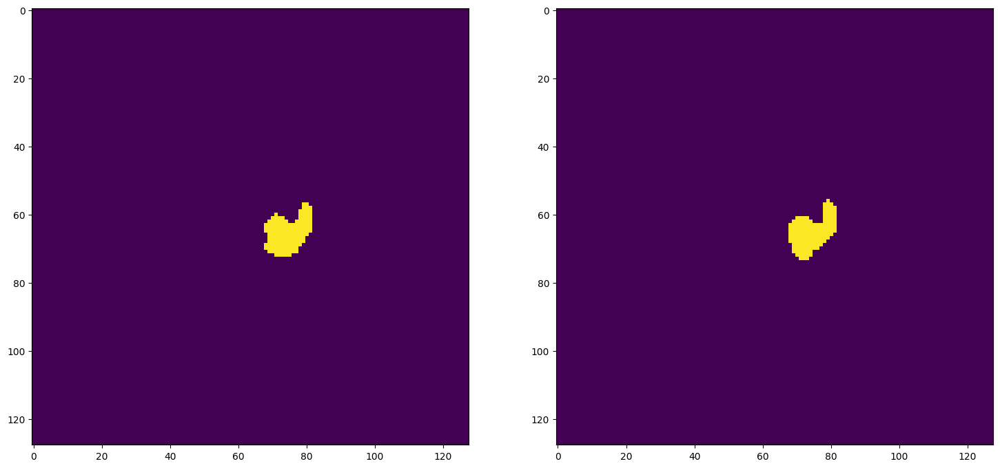

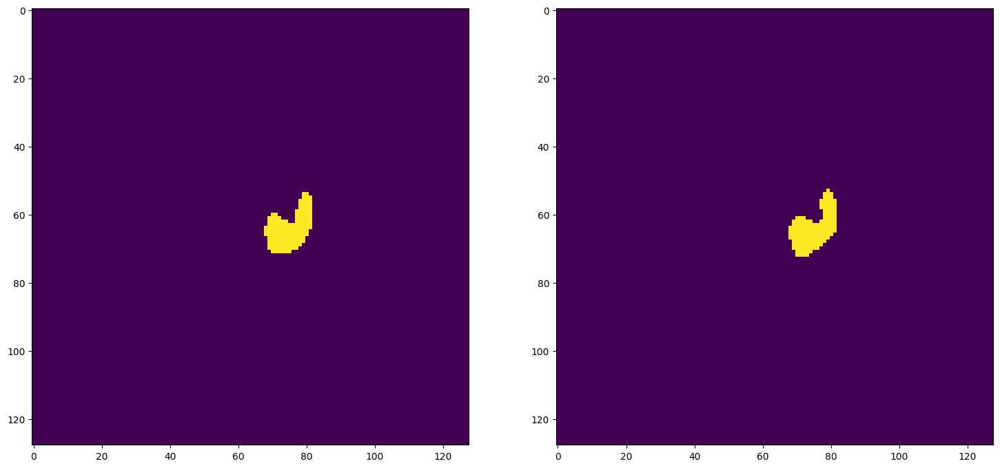

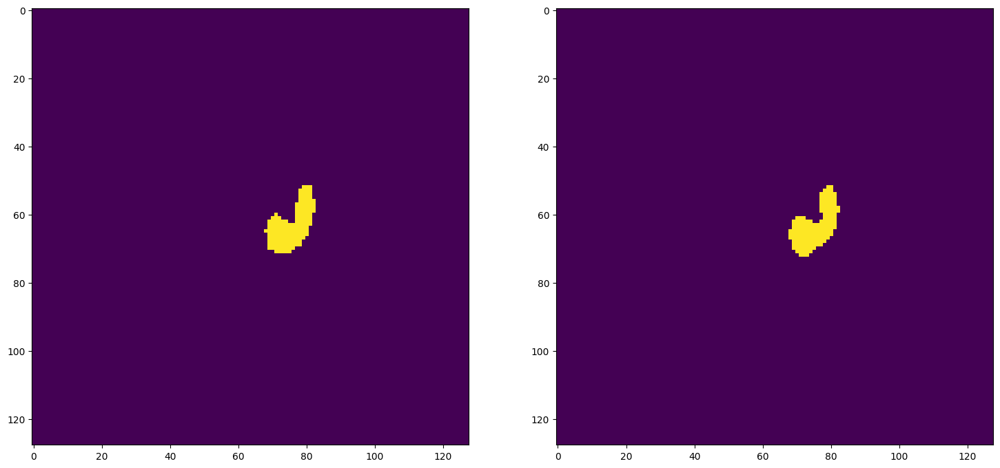

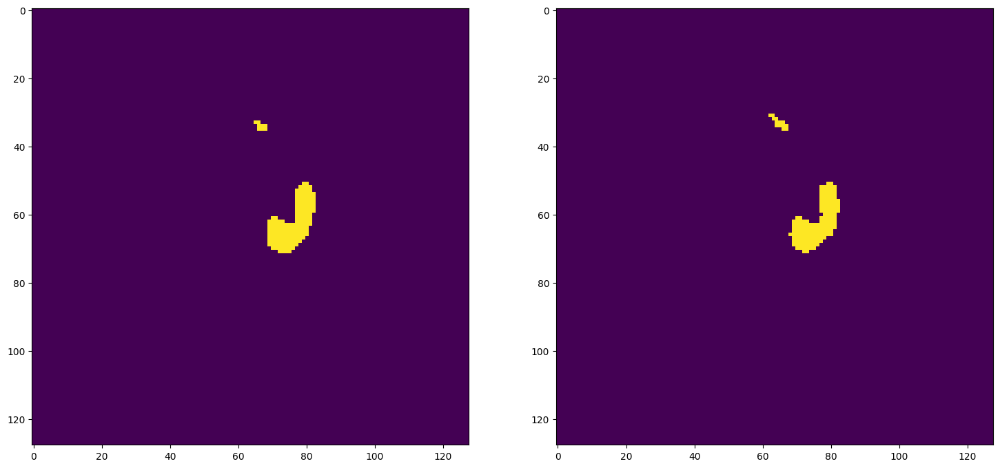

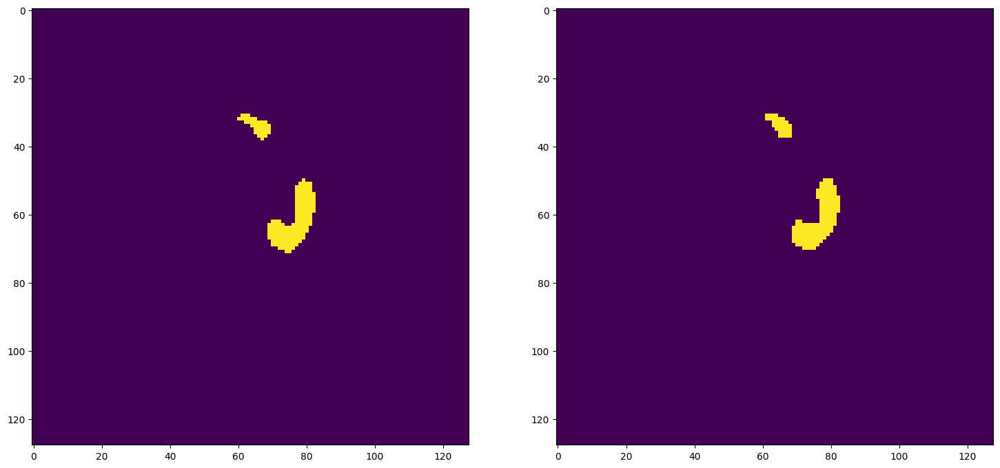


pancreas_218_024
Mean Value: 0.492
0.37773549000951473
0.5483425414364641

pancreas_222_000
Mean Value: 0.492
0.6600402617010569
0.7952099439139002

pancreas_222_008
Mean Value: 0.492
0.7120805369127516
0.8318306546452372

pancreas_224_008
Mean Value: 0.492
0.5226722049151956
0.6865196635599

pancreas_224_016
Mean Value: 0.492
0.5108456460232631
0.6762380357885975

pancreas_224_024
Mean Value: 0.492
0.4577299412915851
0.6280037588938112

pancreas_228_016
Mean Value: 0.492
0.635685210312076
0.7772708419742845

pancreas_228_024
Mean Value: 0.492
0.7607655502392344
0.8641304347826086


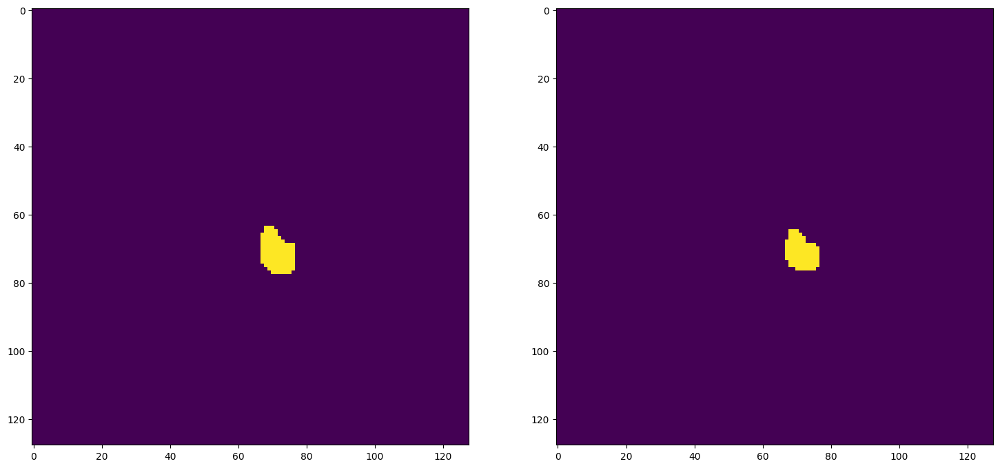

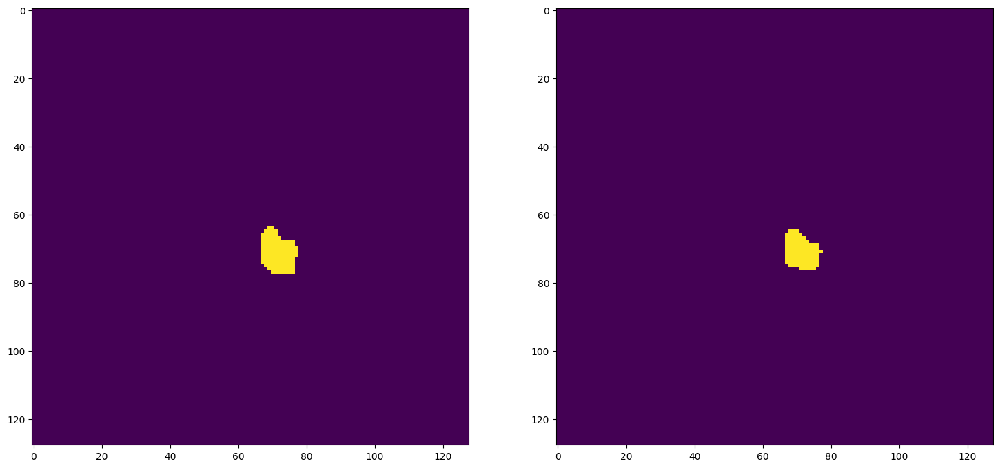

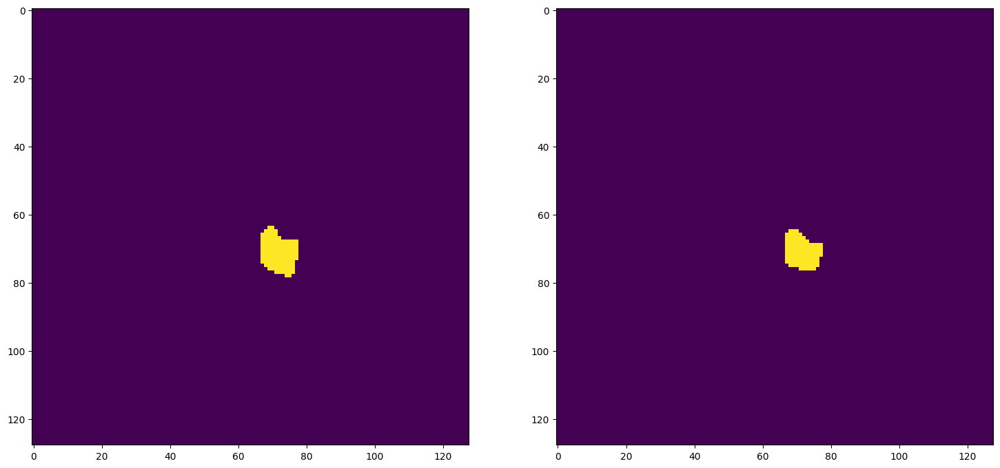

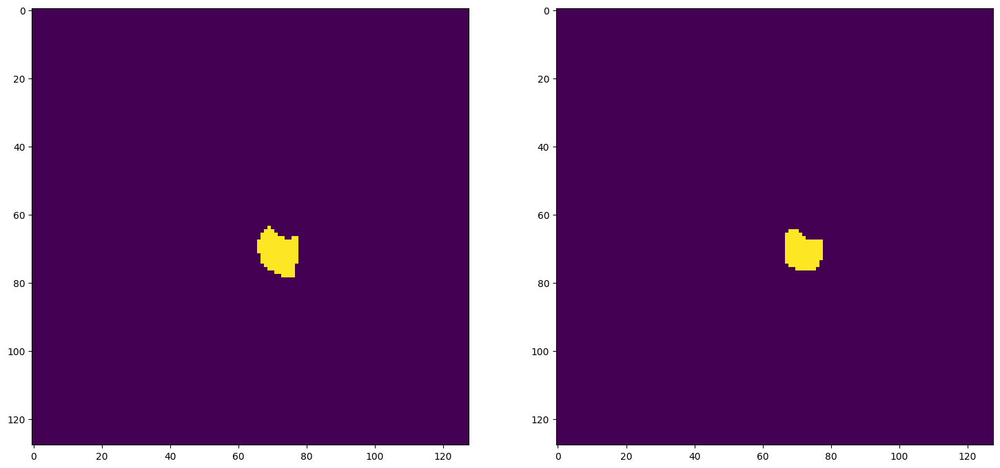

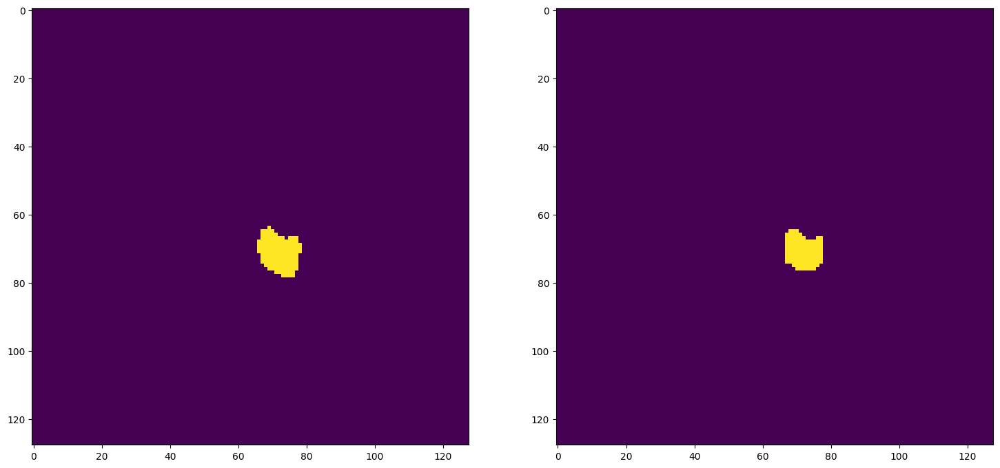

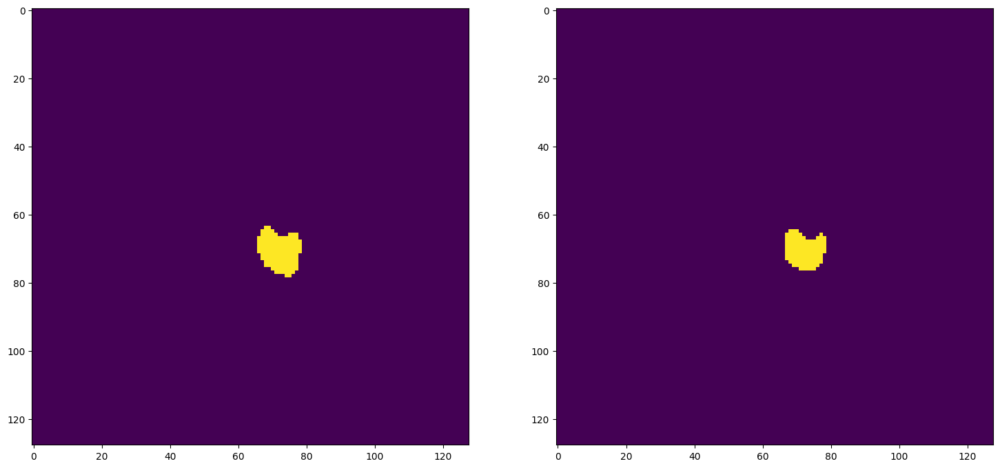


pancreas_228_032
Mean Value: 0.492
0.2868574199806014
0.4458262671942717

pancreas_230_000
Mean Value: 0.492
0.5085672621217645
0.6742387626872886

pancreas_230_008
Mean Value: 0.492
0.706275884039503
0.8278566094100075

pancreas_230_016
Mean Value: 0.492
0.21197718631178708
0.34980392156862744

pancreas_230_024
Mean Value: 0.492
0.6182212581344902
0.7640750670241286

pancreas_231_000
Mean Value: 0.492
0.6718352821555669
0.8037098981298464

pancreas_231_008
Mean Value: 0.492
0.5795180722891566
0.7337909992372235

pancreas_231_016
Mean Value: 0.492
0.5464414957780458
0.7067082683307332

pancreas_231_024
Mean Value: 0.492
0.6437650291995878
0.7832810867293626

pancreas_249_008
Mean Value: 0.492
0.08117510630073445
0.15016088666428315

pancreas_249_016
Mean Value: 0.492
0.5494989000244439
0.7092601356680864

pancreas_249_024
Mean Value: 0.492
0.6519092418372994
0.7892797319932998

pancreas_249_032
Mean Value: 0.492
0.6280747786159396
0.7715551974214343

pancreas_255_000
Mean Value: 0.492

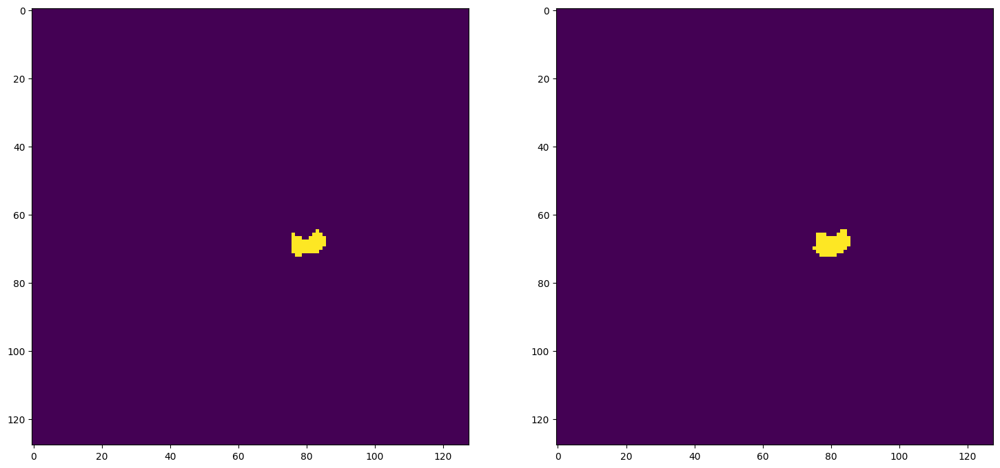

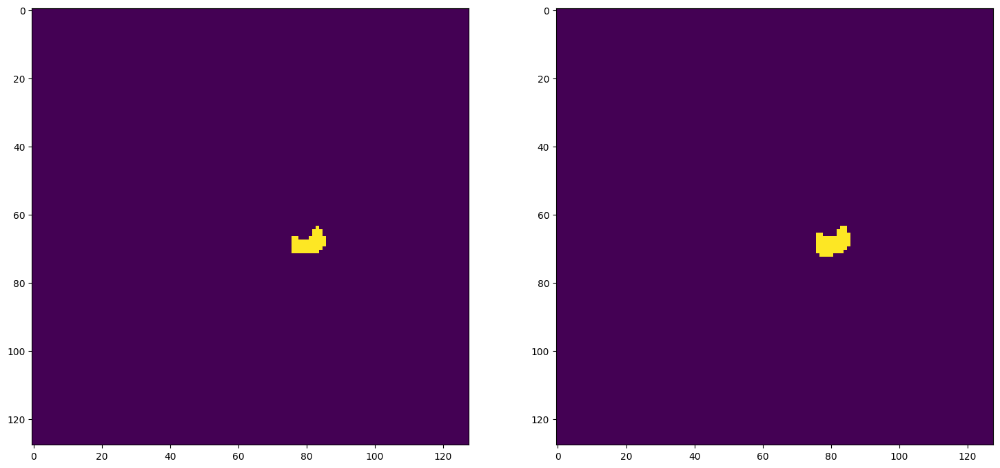

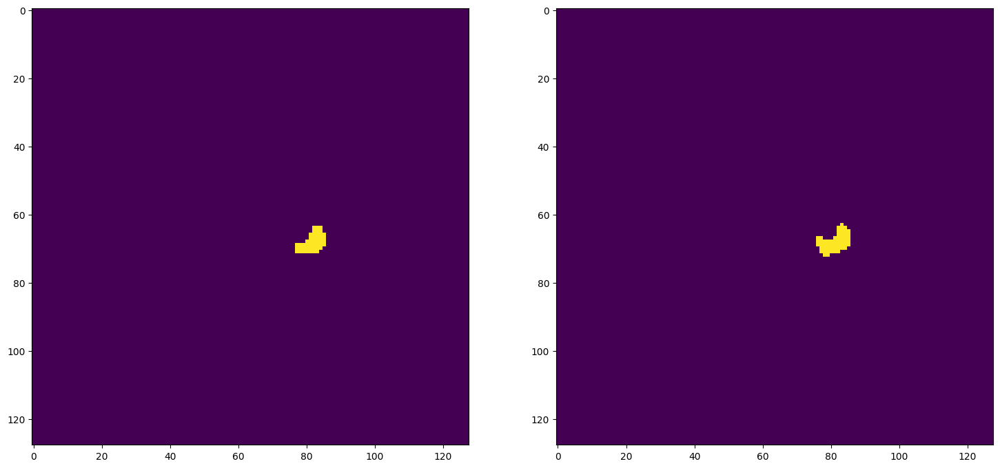

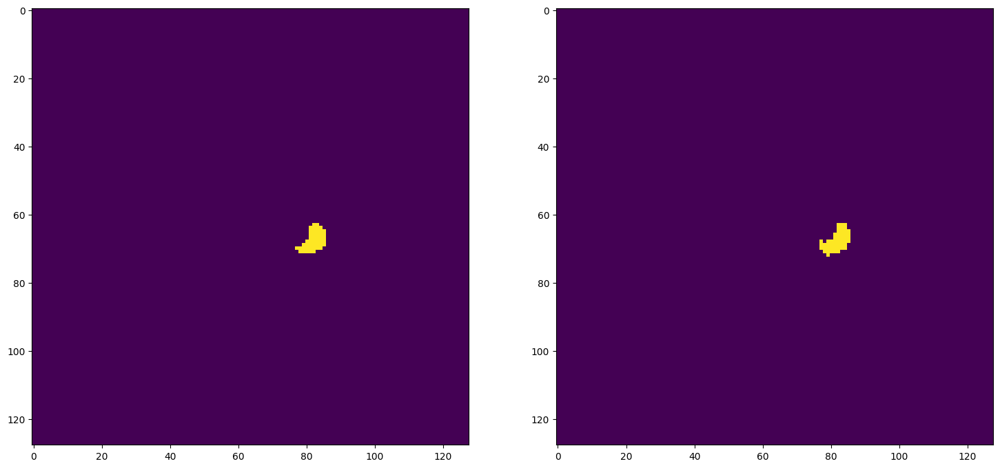

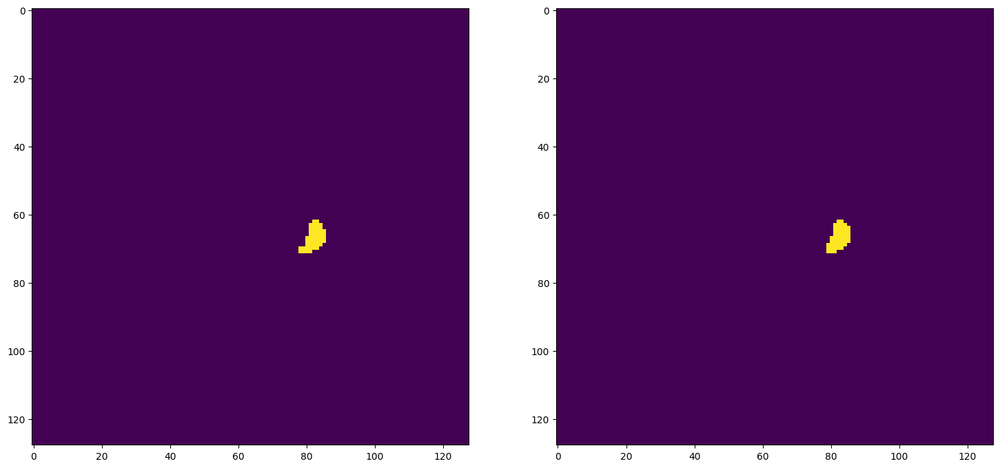

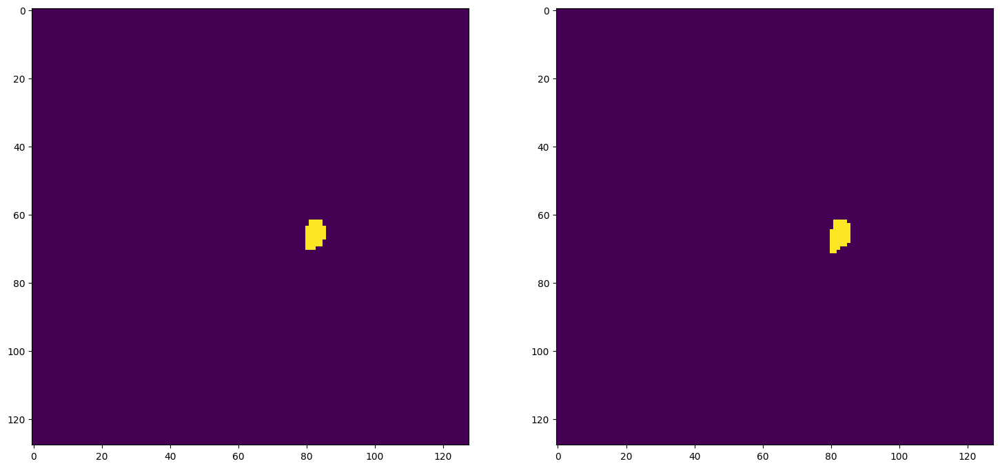


pancreas_266_000
Mean Value: 0.492
0.6257054432914618
0.7697648376259798

pancreas_266_008
Mean Value: 0.492
0.5512579797221179
0.710723795691116

pancreas_266_016
Mean Value: 0.492
0.699046637464571
0.8228692750985744

pancreas_266_024
Mean Value: 0.492
0.7147713751487337
0.8336637589214909

pancreas_266_032
Mean Value: 0.492
0.7000285959393766
0.8235492010092514

pancreas_284_000
Mean Value: 0.492
0.5409756097560976
0.7021209243431465

pancreas_284_008
Mean Value: 0.492
0.7564534231200898
0.8613418530351438


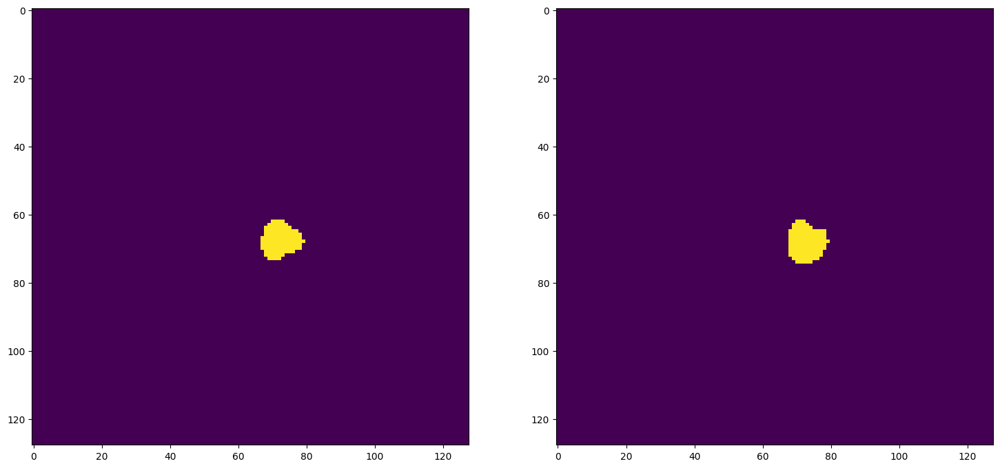

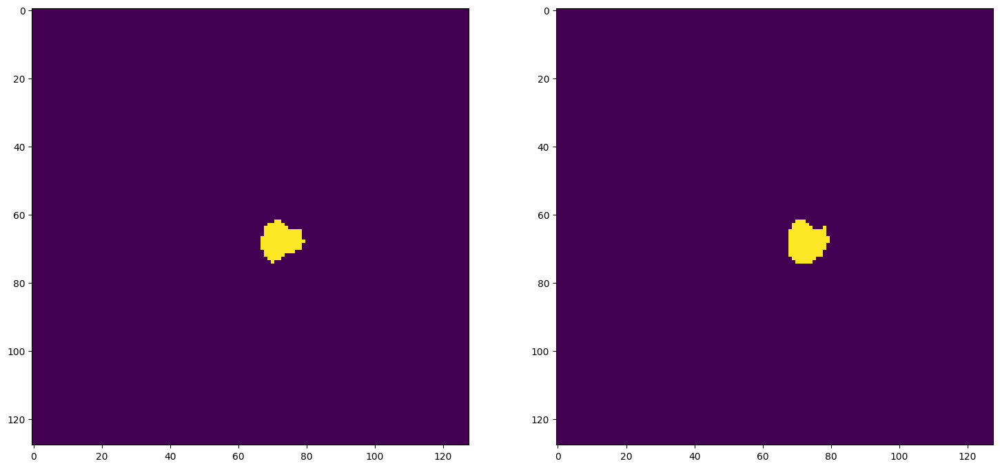

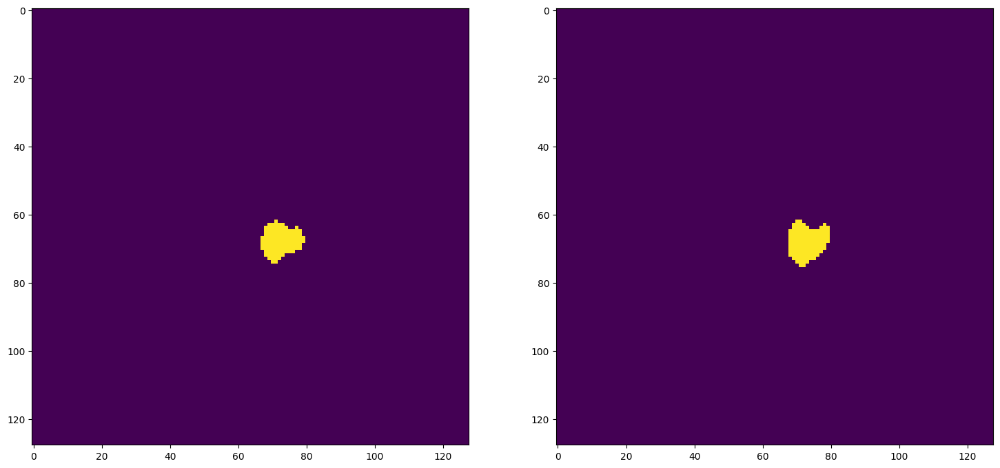

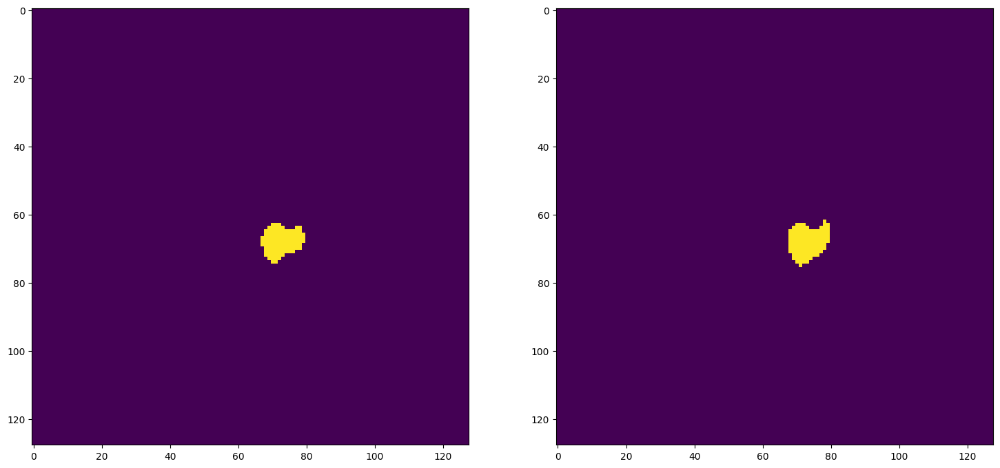

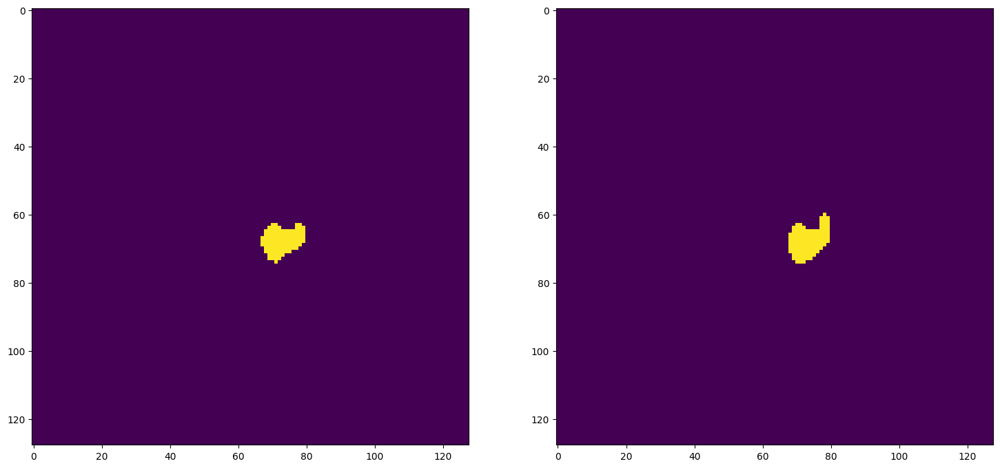

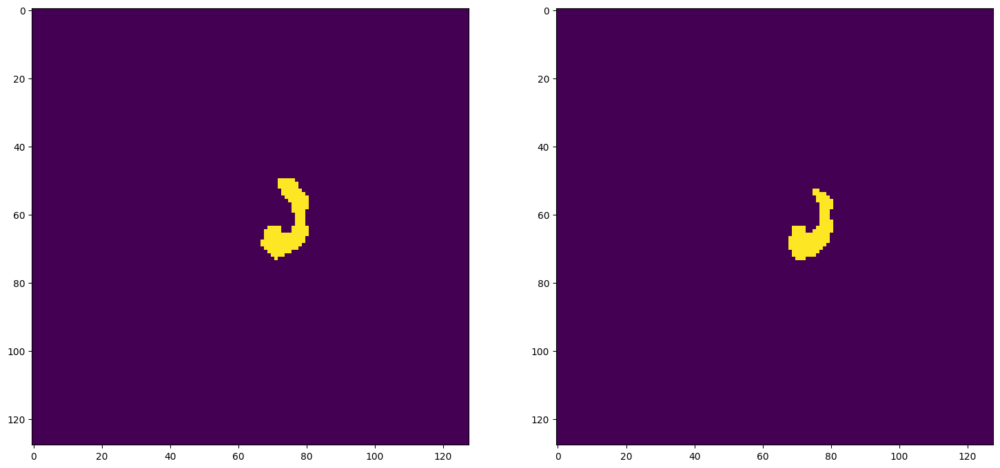


pancreas_284_016
Mean Value: 0.492
0.74975969240628
0.8569859000183117


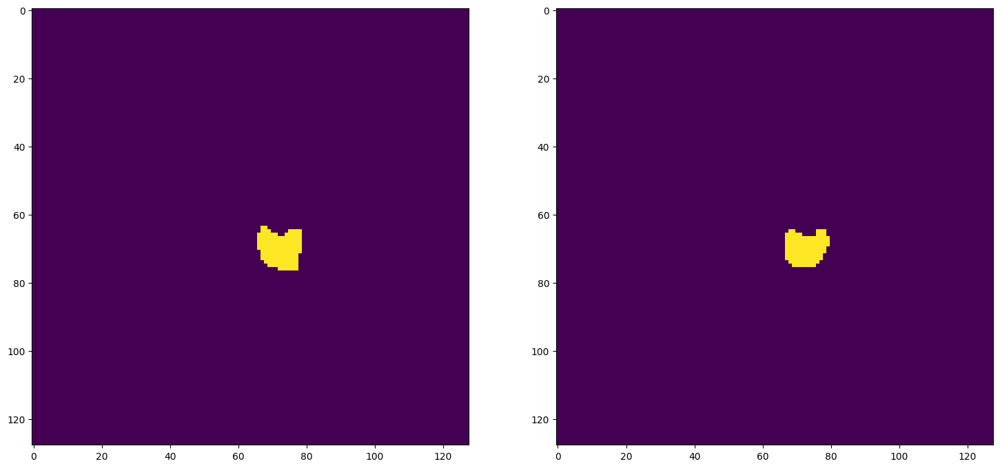

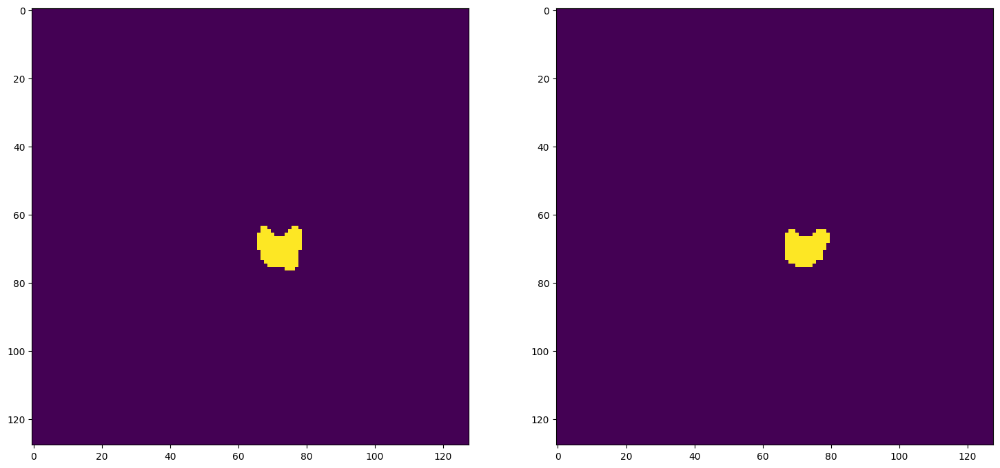

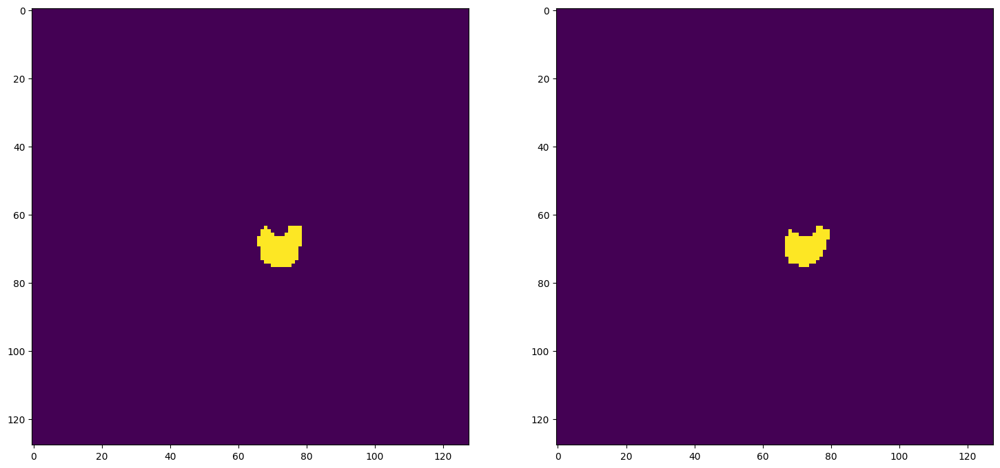

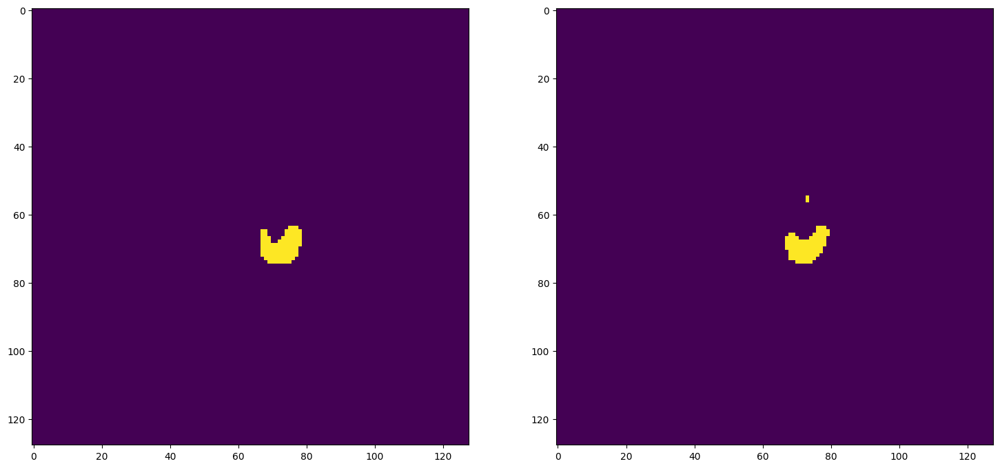

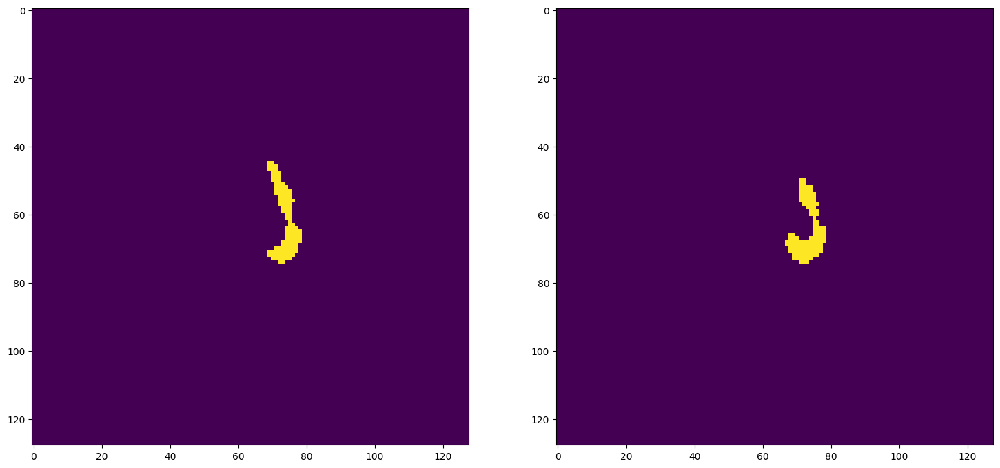

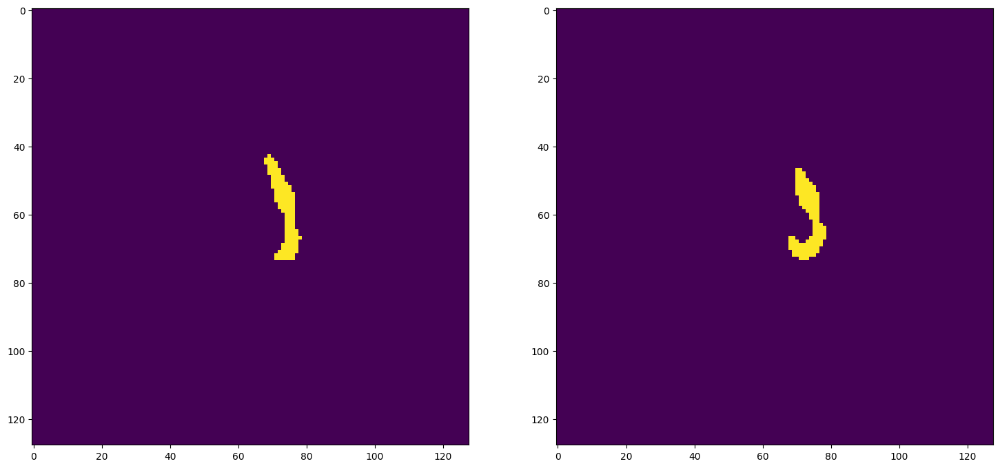


pancreas_285_008
Mean Value: 0.492
0.6767013610888711
0.8071817400439308

pancreas_285_016
Mean Value: 0.492
0.5434827092285656
0.7042290865703301

pancreas_285_024
Mean Value: 0.492
0.6537694455524531
0.7906415822479498

pancreas_285_032
Mean Value: 0.492
0.450198273851178
0.620878237091845

pancreas_285_040
Mean Value: 0.492
0.64
0.7804878048780488

pancreas_290_000
Mean Value: 0.492
0.8121254846669017
0.896323672437269


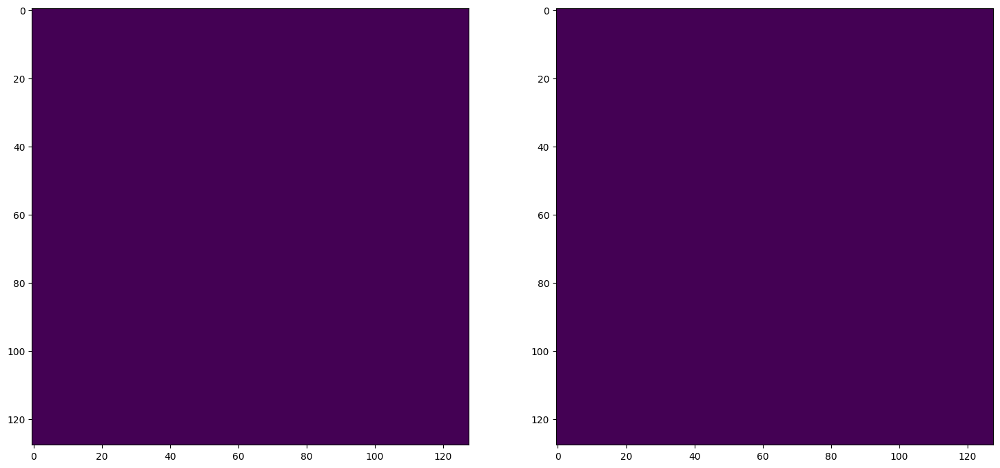

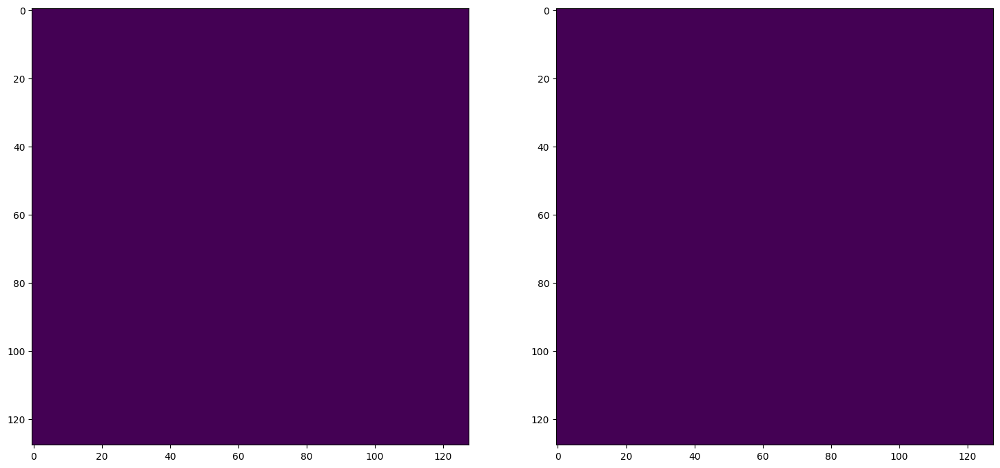

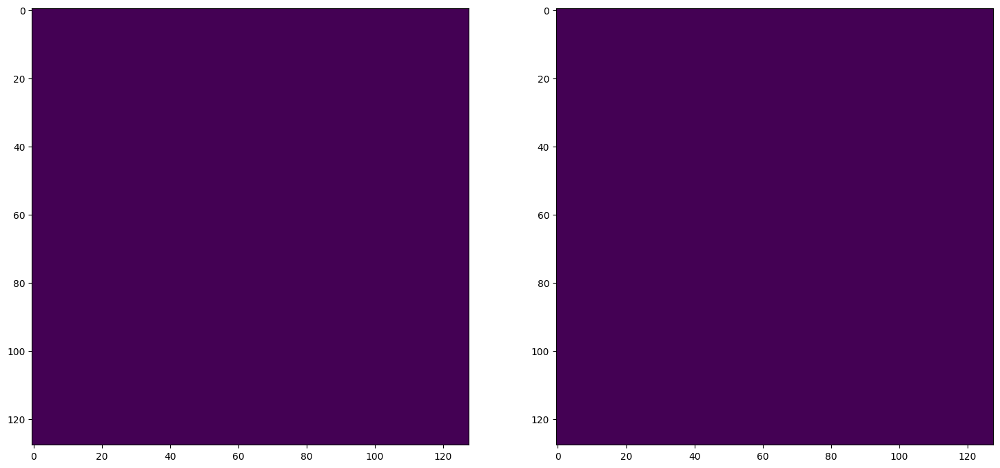

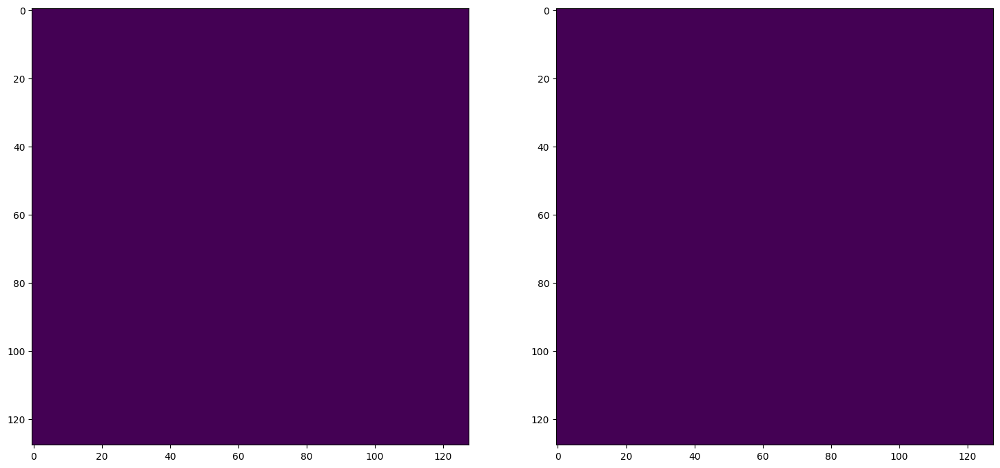

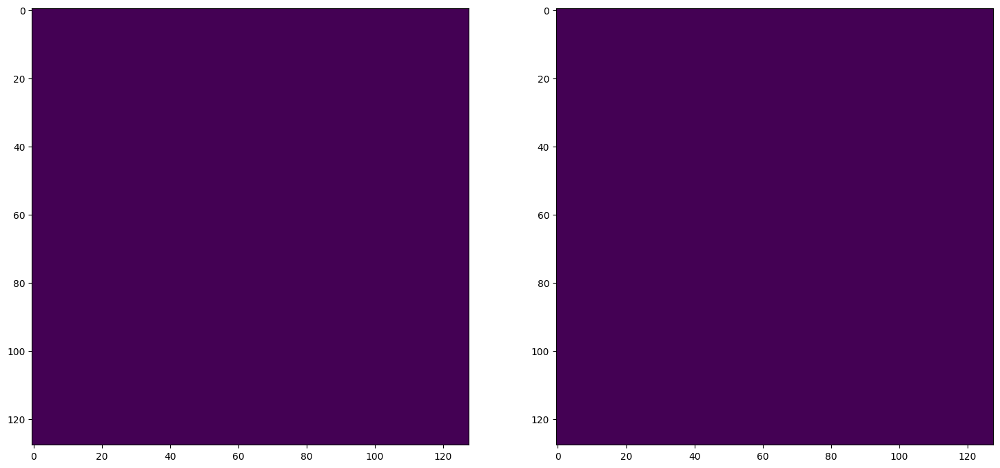

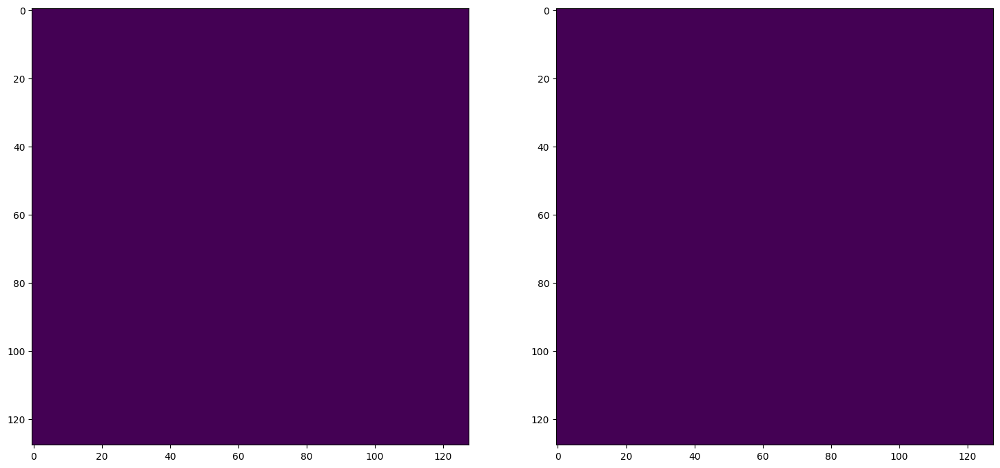


pancreas_290_008
Mean Value: 0.492
0.4278575890068707
0.5993000874890638

pancreas_290_016
Mean Value: 0.492
0.49984152139461174
0.6665257819103972

pancreas_290_024
Mean Value: 0.492
0.26485461441213654
0.41879060469765117

pancreas_291_000
Mean Value: 0.492
0.6188373804267844
0.7645454545454545

pancreas_291_008
Mean Value: 0.492
0.6866985164697008
0.8142516398330352

pancreas_291_016
Mean Value: 0.492
0.7870967741935484
0.8808664259927798


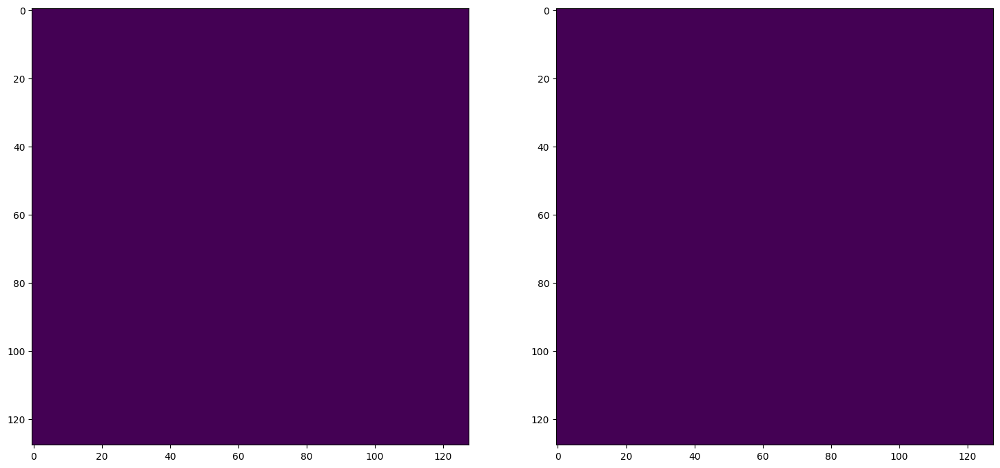

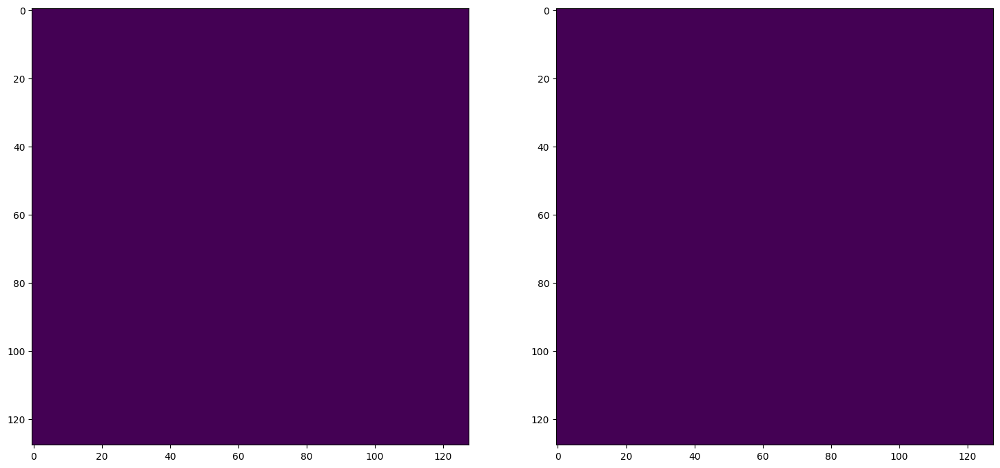

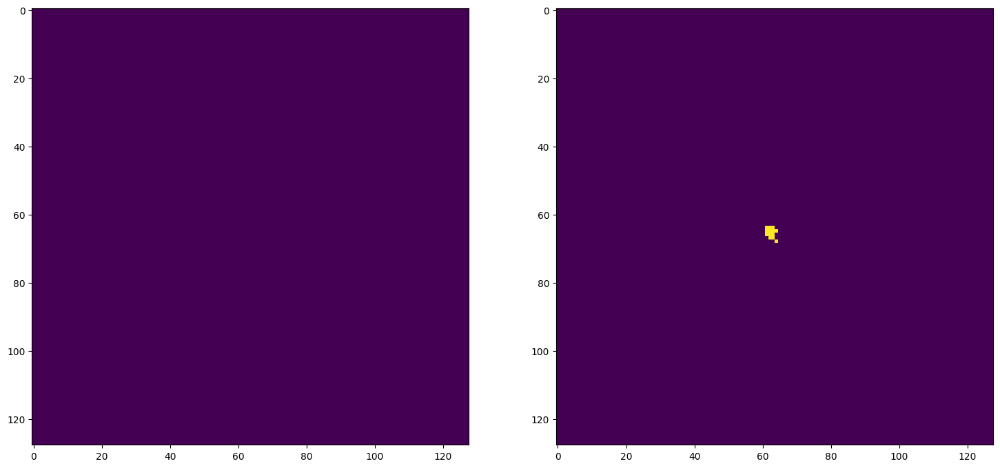

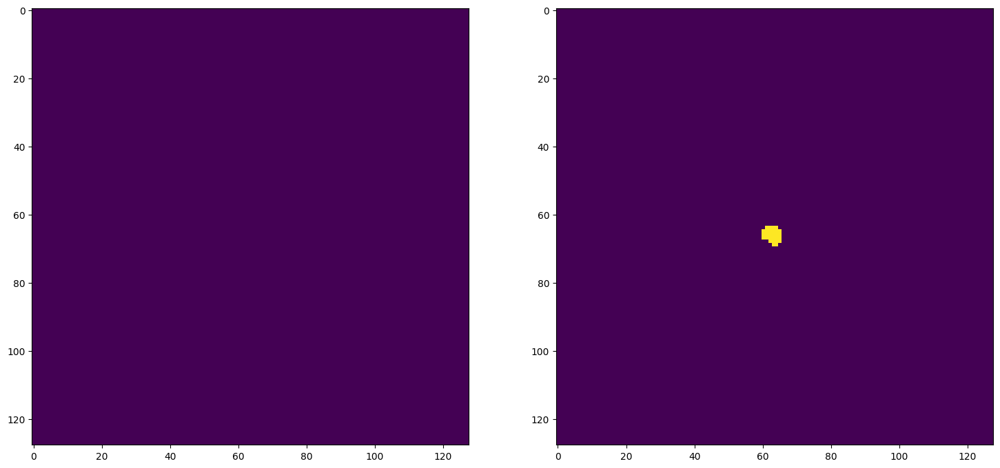

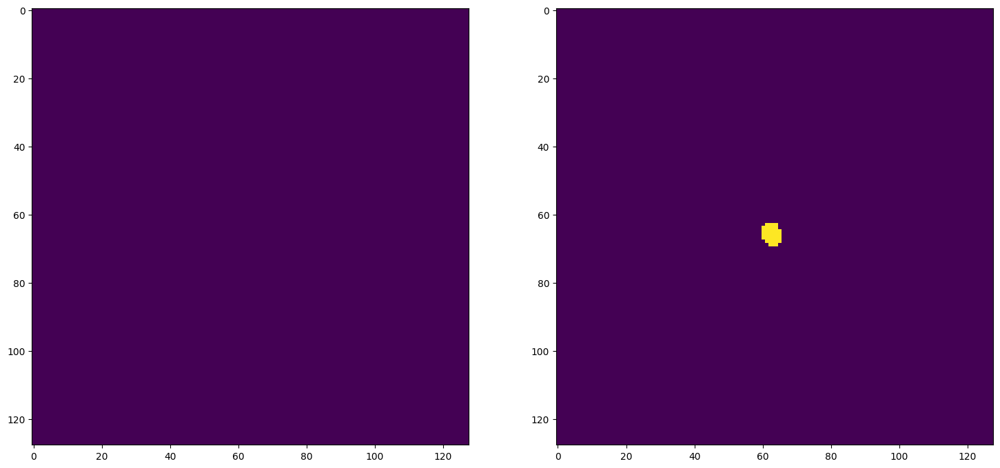

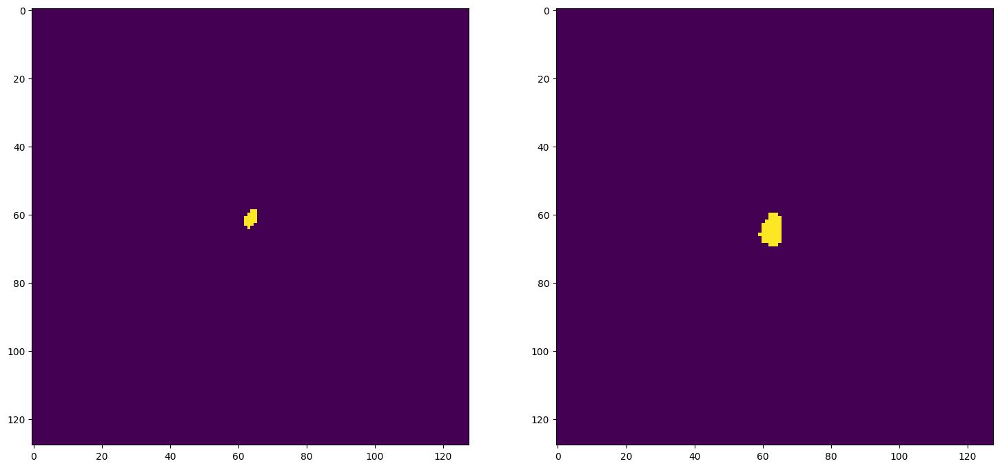


pancreas_291_024
Mean Value: 0.492
0.4997949979499795
0.6664844177145981

pancreas_298_000
Mean Value: 0.492
0.07962891379976807
0.14751163623344074

pancreas_298_008
Mean Value: 0.492
0.7594853183767734
0.8633039564972811


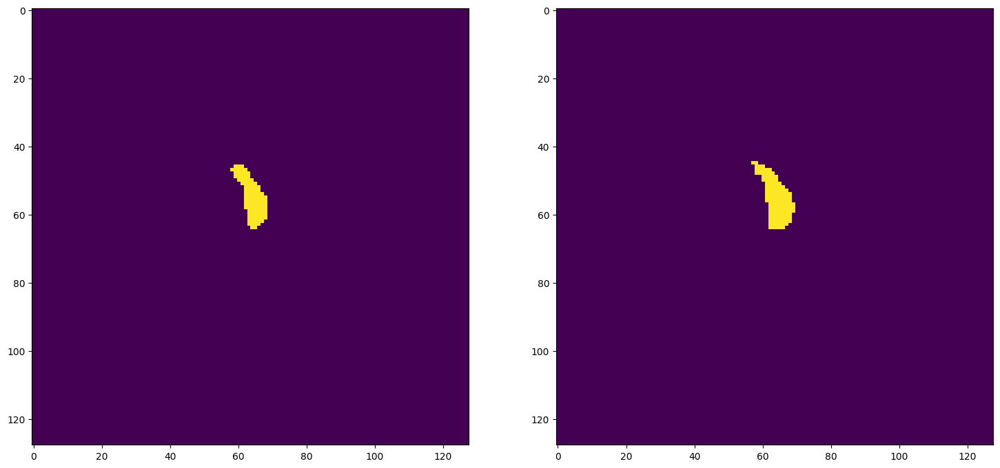

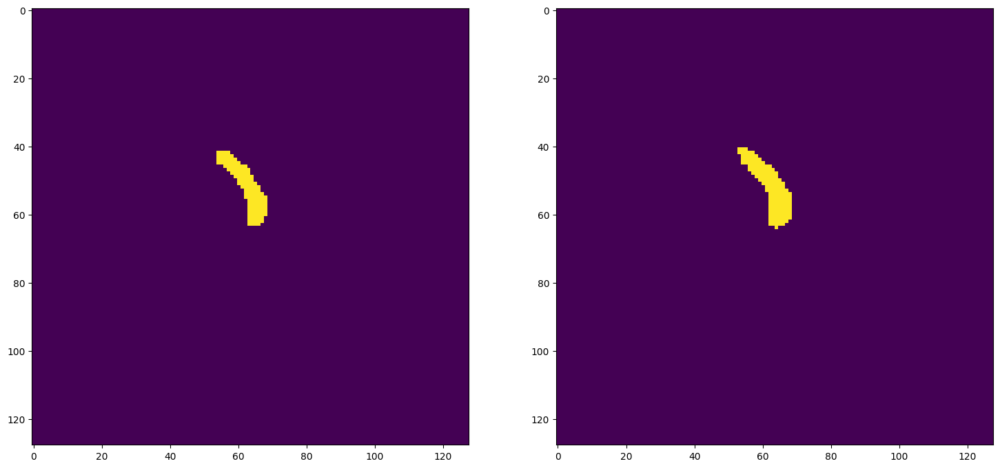

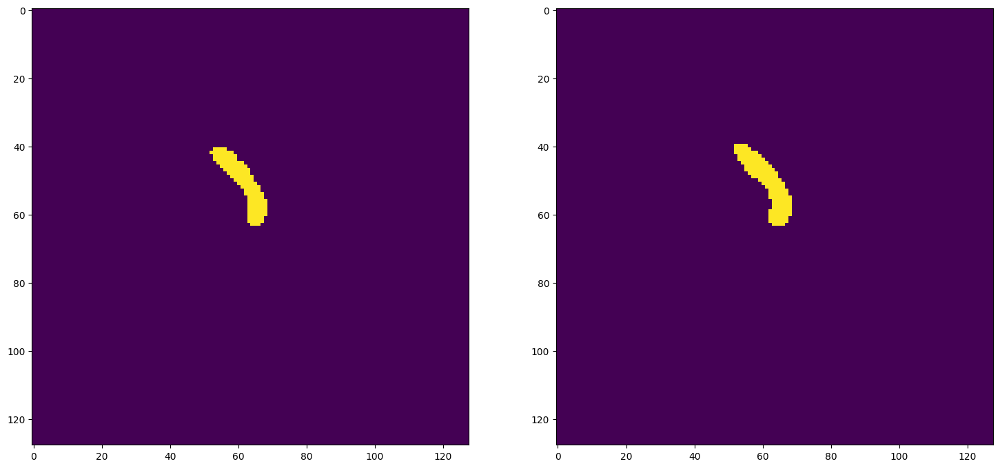

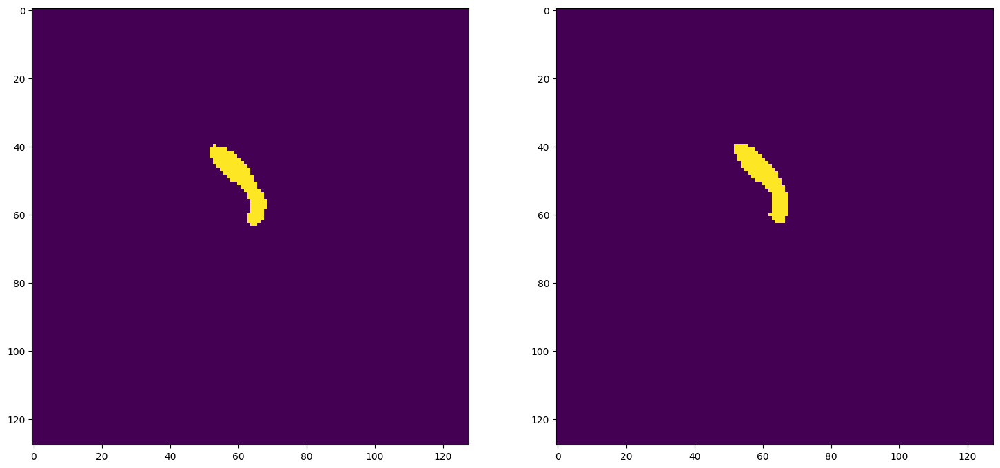

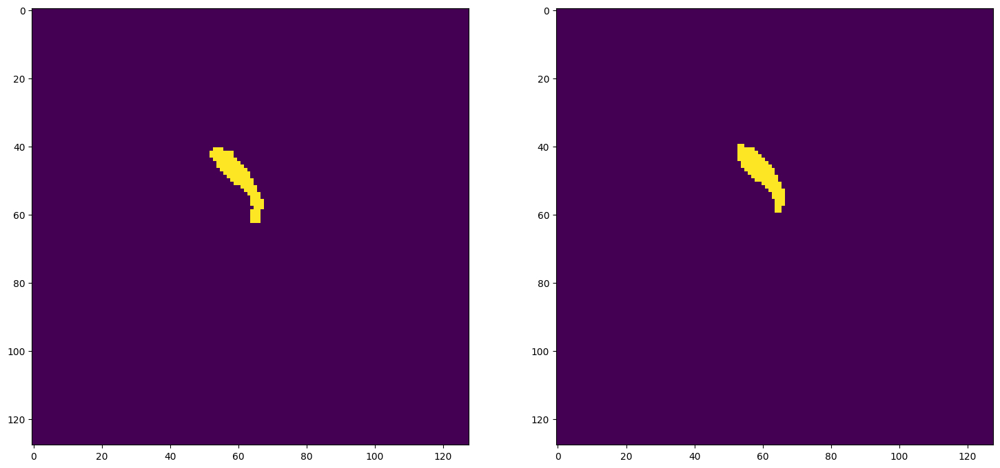

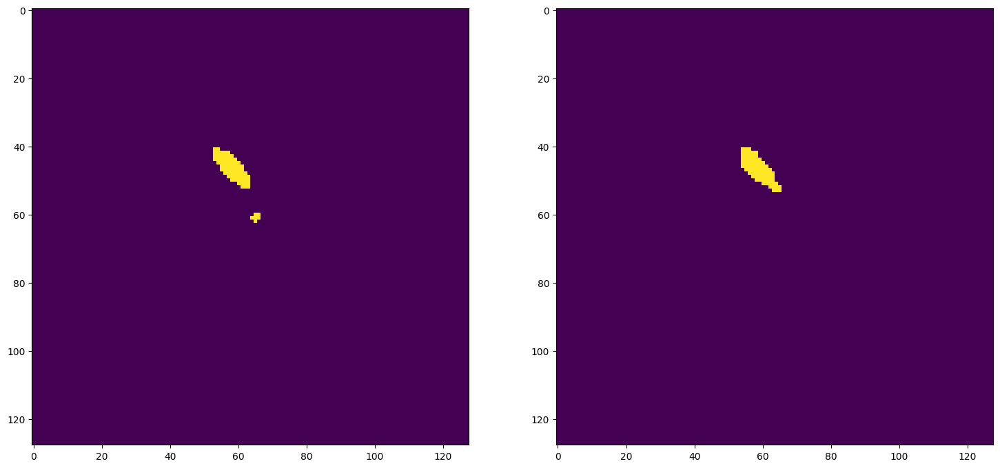


pancreas_298_016
Mean Value: 0.492
0.18587848932676518
0.3134865688175021

pancreas_298_024
Mean Value: 0.492
0.6240153289333618
0.7684845306764552

pancreas_305_000
Mean Value: 0.492
0.23103057757644394
0.37534498620055196

pancreas_305_008
Mean Value: 0.492
0.19148936170212766
0.32142857142857145

pancreas_310_000
Mean Value: 0.492
0.6345335515548282
0.7764093321317713

pancreas_310_008
Mean Value: 0.492
0.6158396319421623
0.7622534065487085

pancreas_316_000
Mean Value: 0.492
0.5463354037267081
0.7066195372750642

pancreas_316_008
Mean Value: 0.492
0.2976949485041687
0.45880574452003026

pancreas_316_016
Mean Value: 0.492
0.6936259143155695
0.819101678183613

pancreas_316_024
Mean Value: 0.492
0.7701446280991735
0.8701488182083454


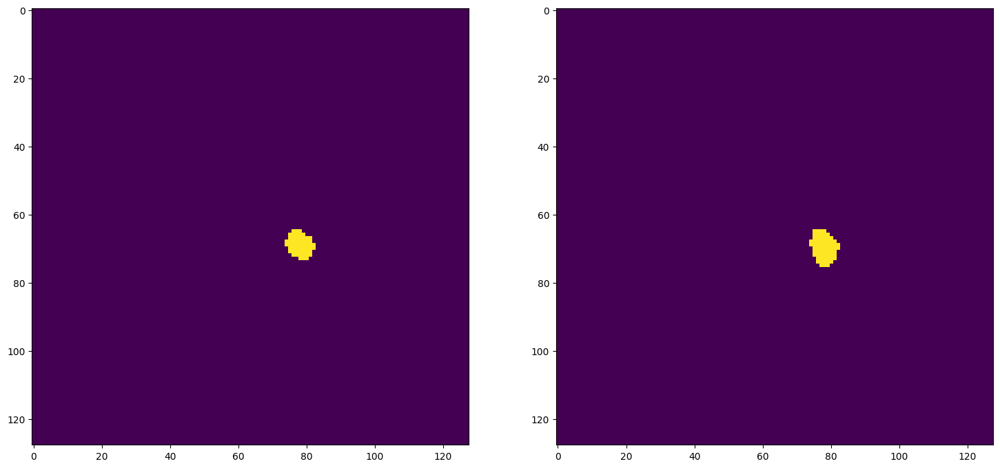

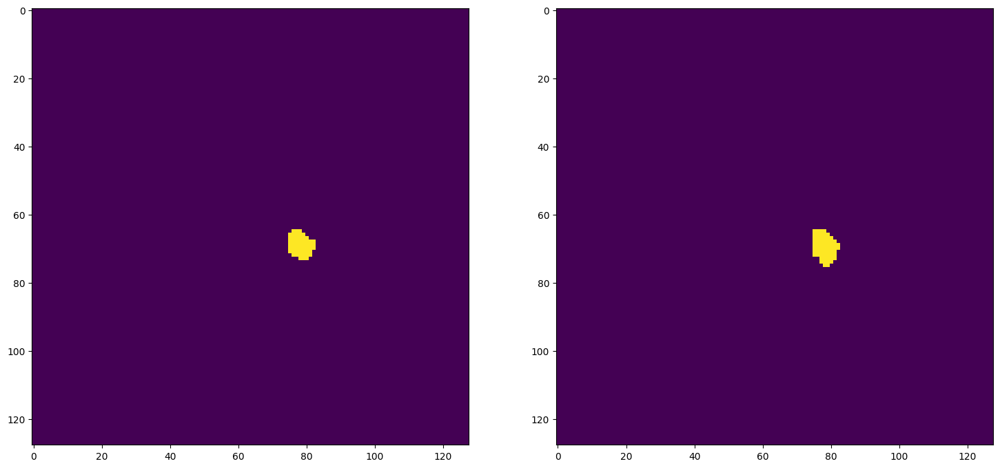

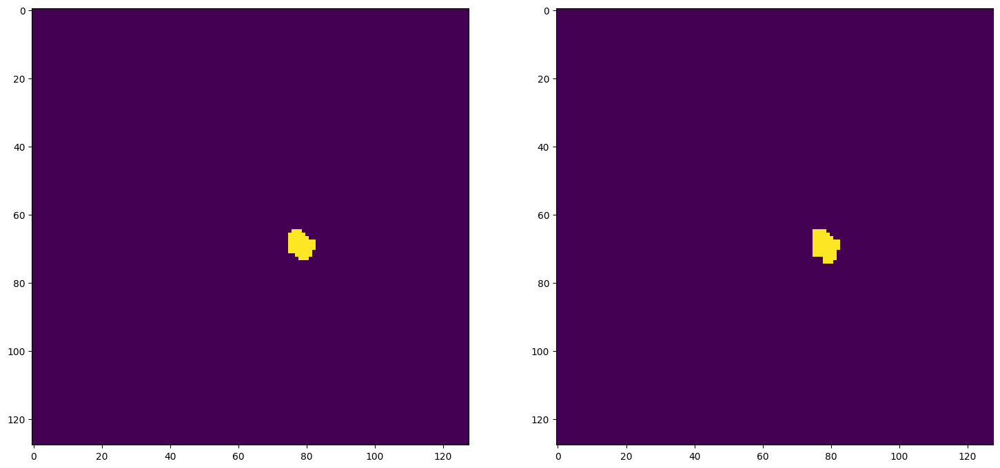

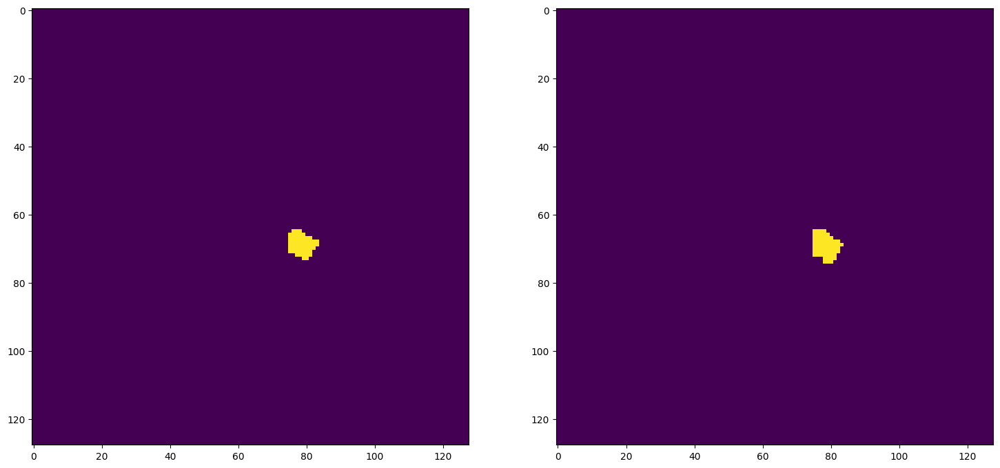

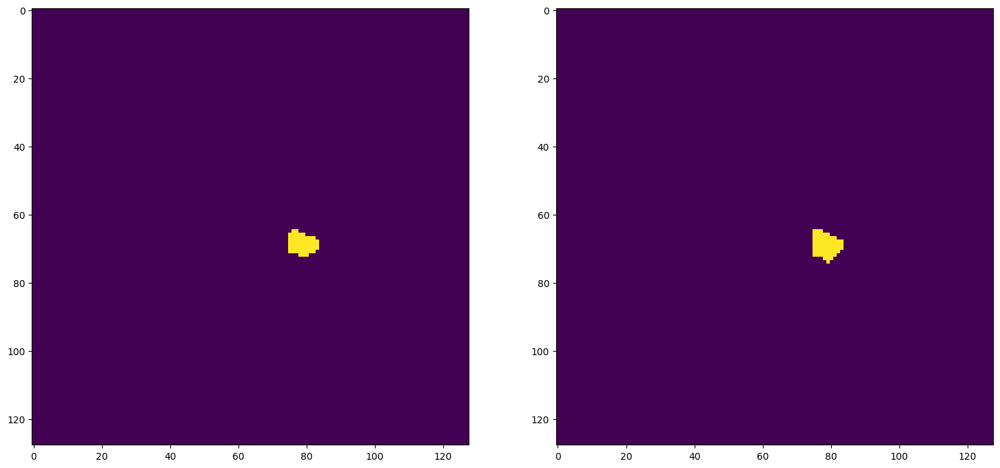

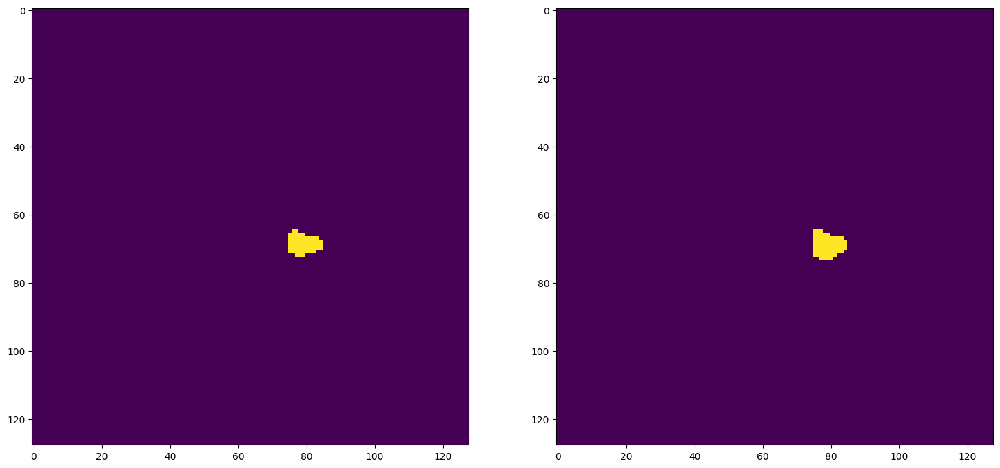


pancreas_321_016
Mean Value: 0.492
0.40384615384615385
0.5753424657534246

pancreas_321_024
Mean Value: 0.492
0.6606751424813678
0.7956705385427666

pancreas_321_032
Mean Value: 0.492
0.6633439057544177
0.7976028330155271

pancreas_321_040
Mean Value: 0.492
0.7196691176470589
0.8369855692143239

pancreas_323_000
Mean Value: 0.492
0.5067637877211238
0.6726519337016574

pancreas_323_008
Mean Value: 0.492
0.6750495049504951
0.8060054379950349

pancreas_323_016
Mean Value: 0.492
0.8037198258804907
0.8911803422553751


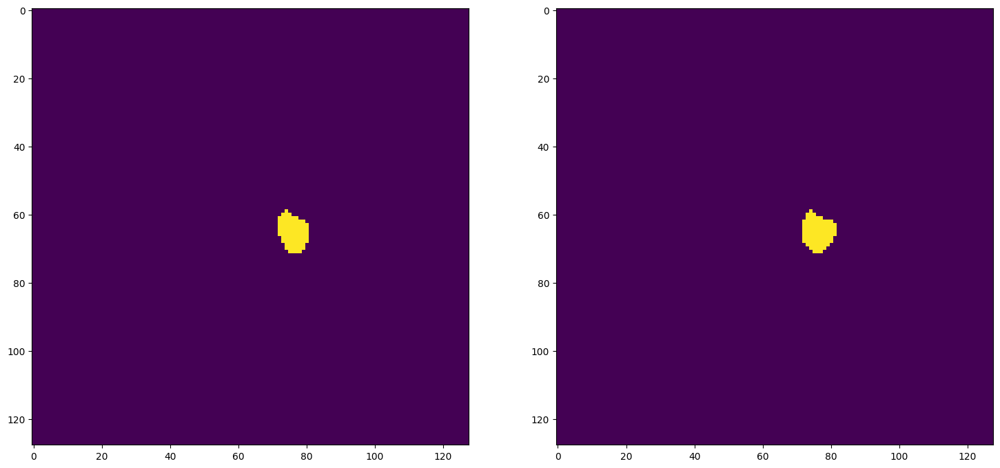

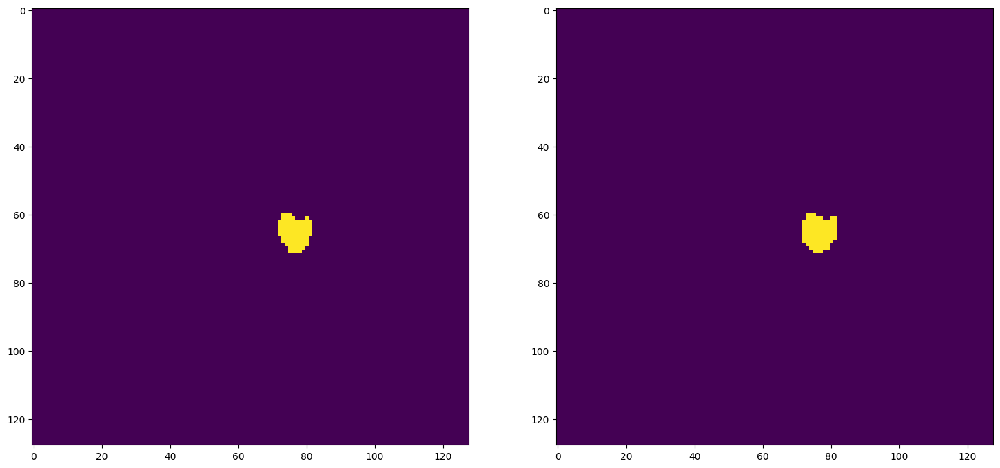

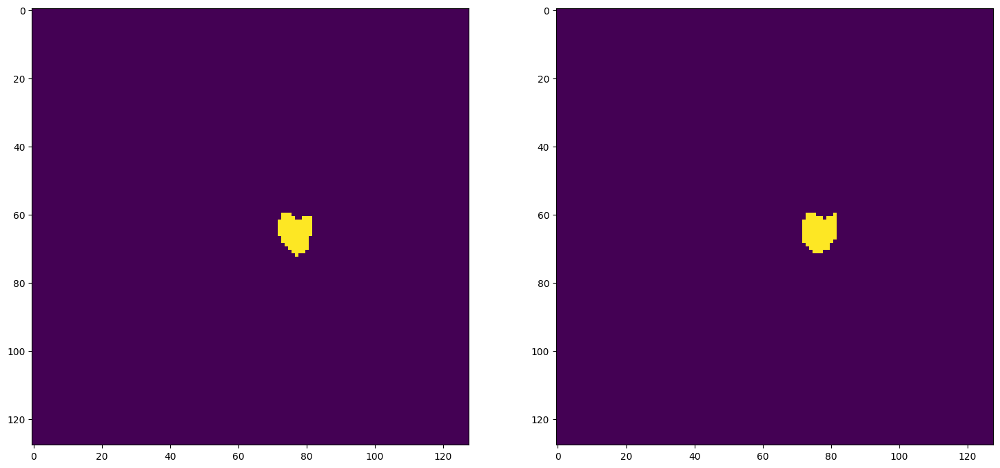

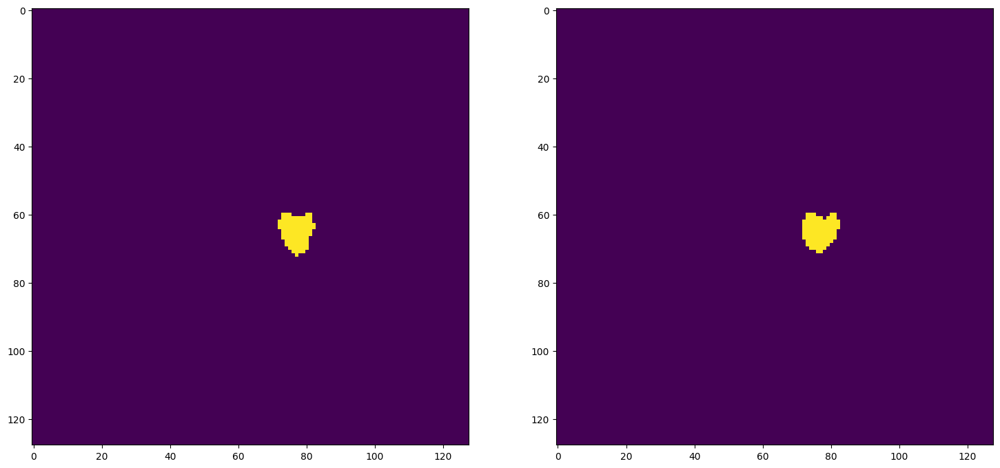

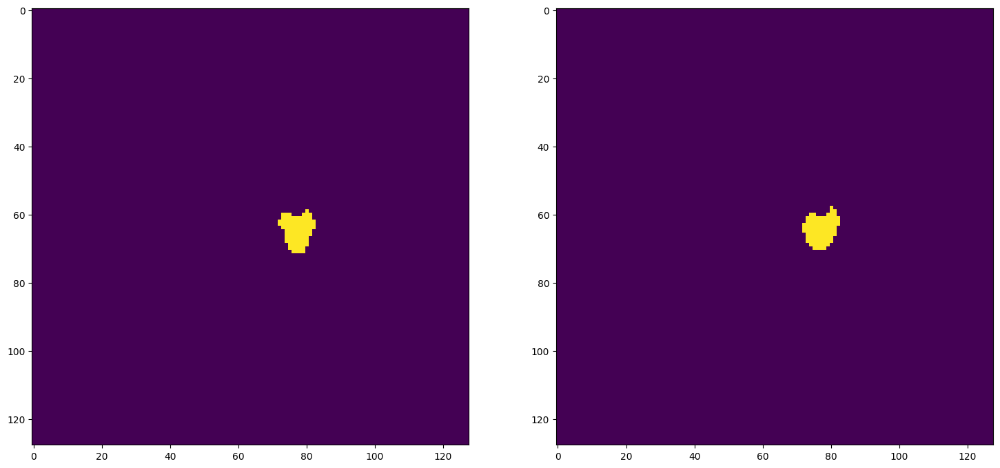

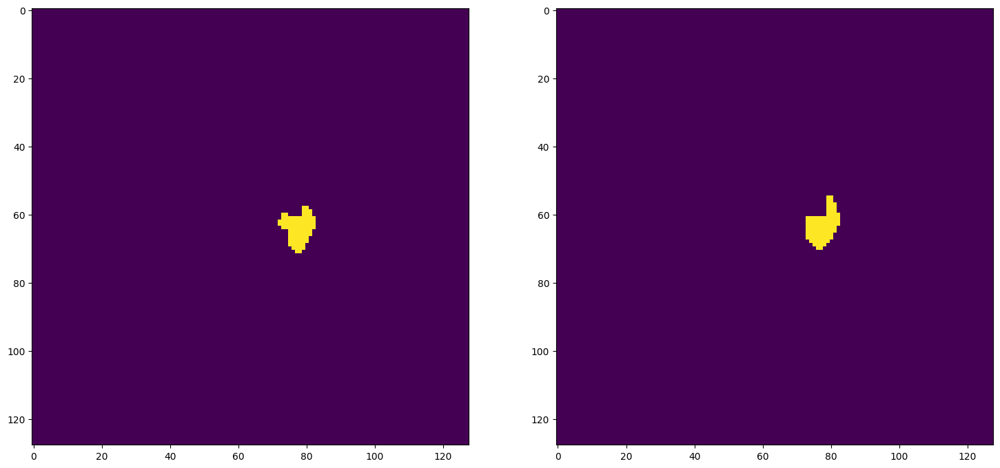


pancreas_323_024
Mean Value: 0.492
0.8050413548641198
0.8919921448832643


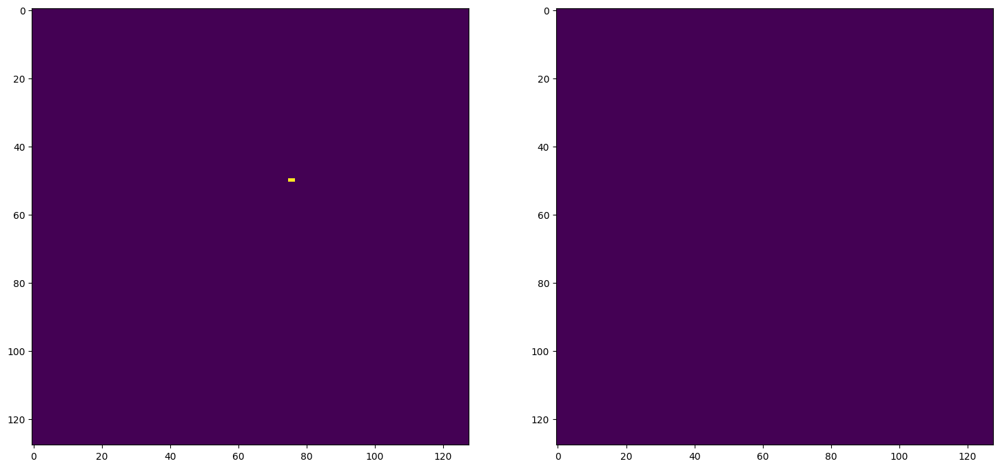

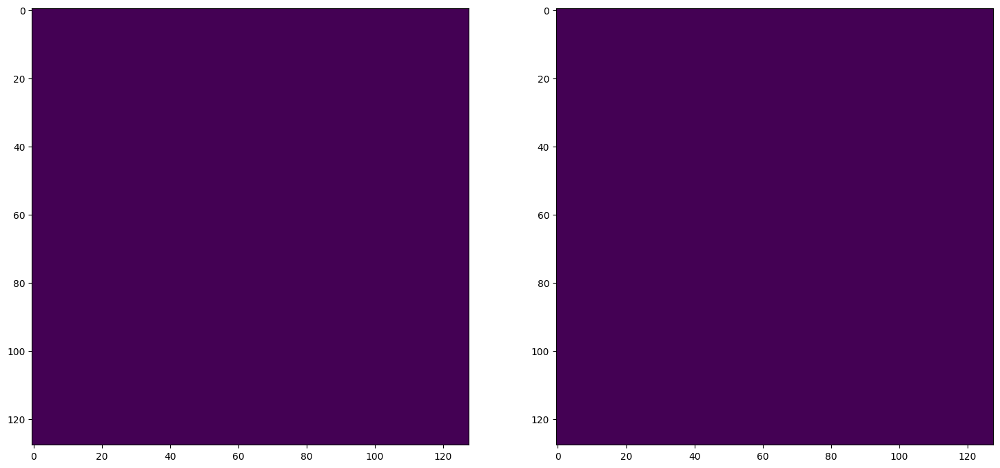

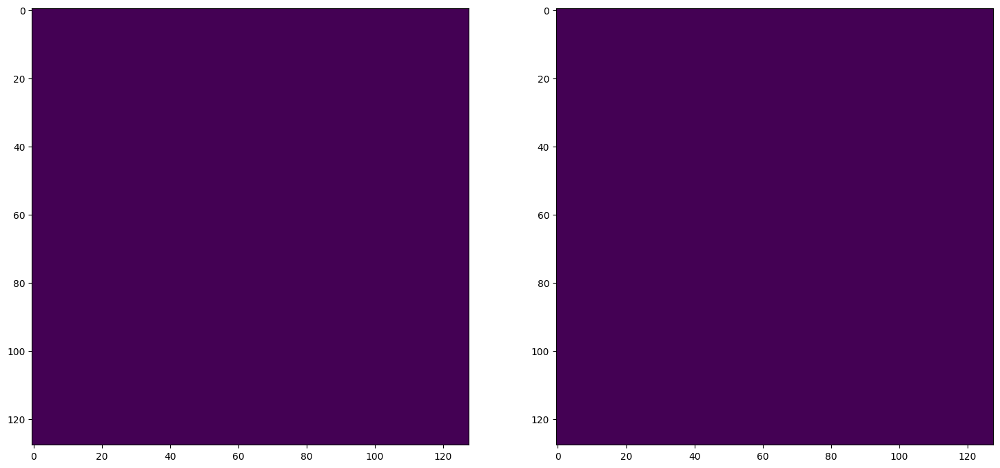

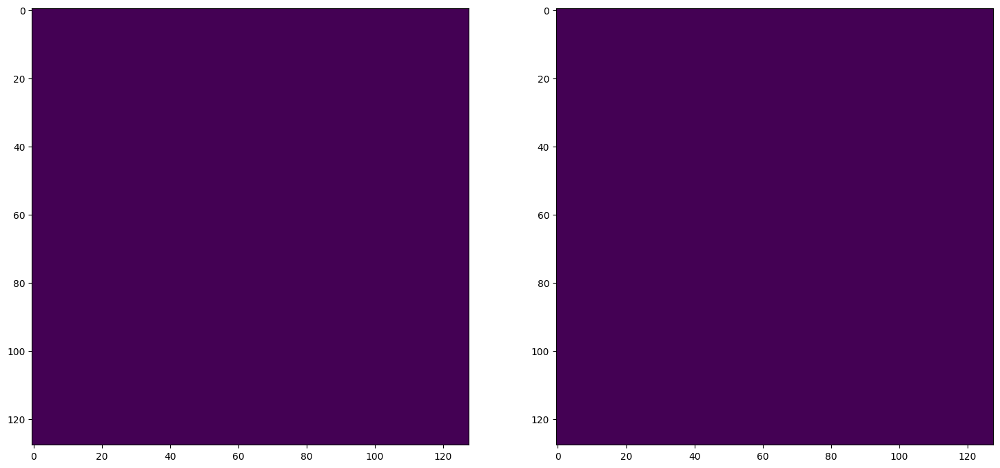

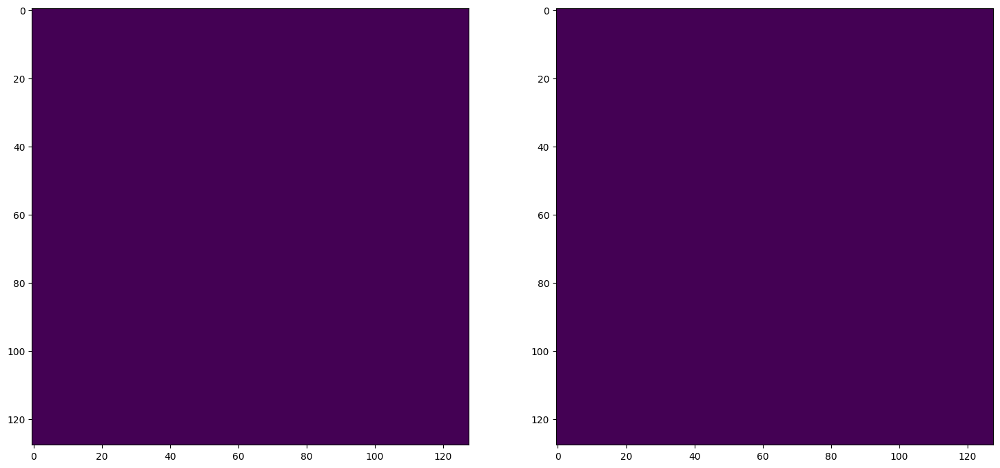

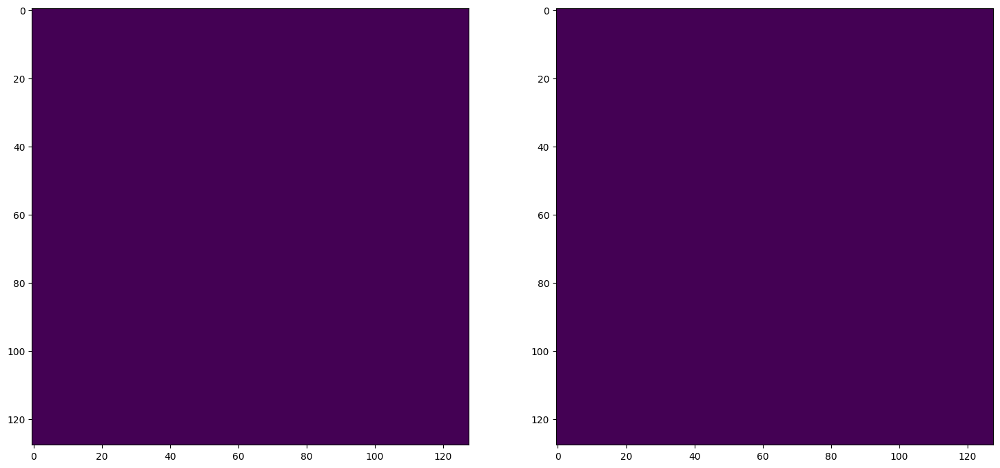


pancreas_325_000
Mean Value: 0.492
0.41024793388429753
0.5818096577590248

pancreas_325_008
Mean Value: 0.492
0.6871371147833855
0.8145598941098611

pancreas_325_016
Mean Value: 0.492
0.651685393258427
0.7891156462585034

pancreas_325_024
Mean Value: 0.492
0.5458891013384322
0.7062461348175634

pancreas_330_008
Mean Value: 0.492
0.09720394736842106
0.17718482986059061

pancreas_330_016
Mean Value: 0.492
0.7521531100478469
0.8585472419442928


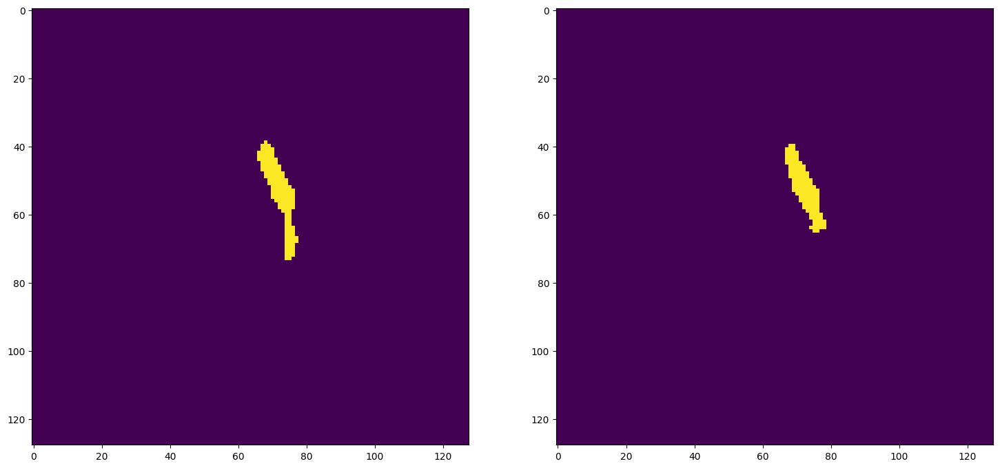

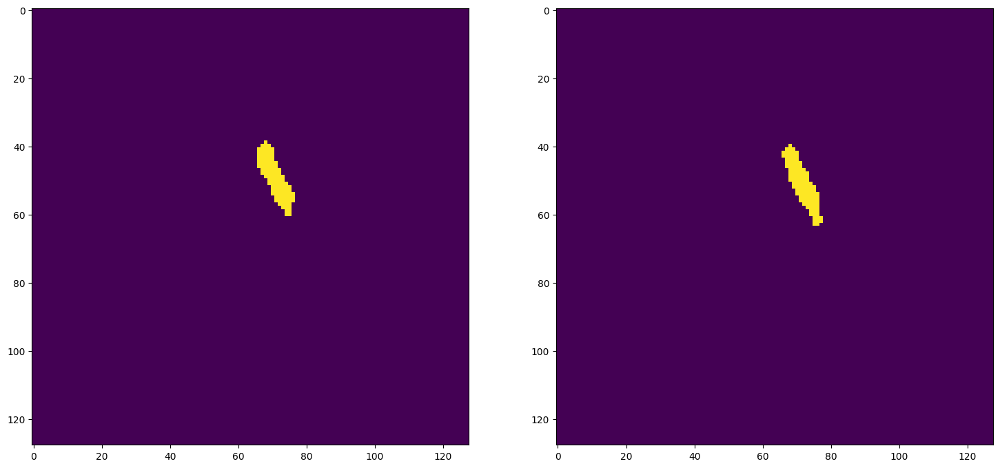

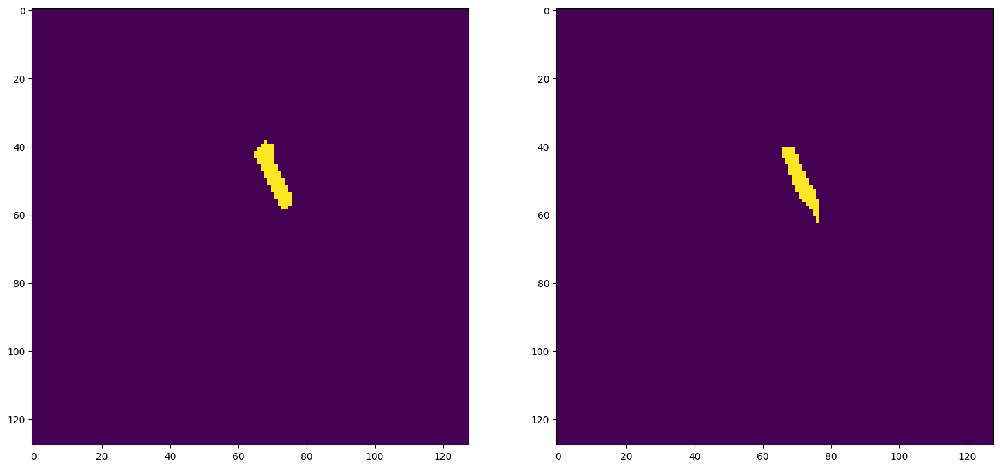

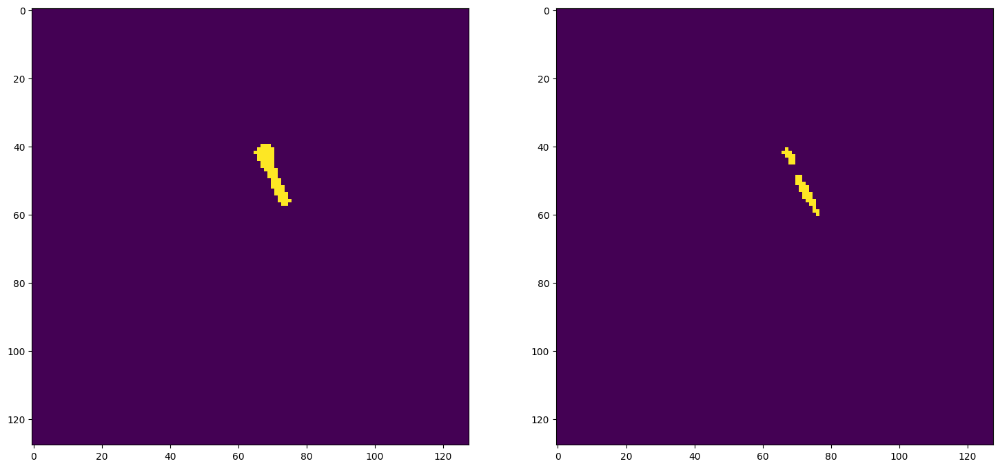

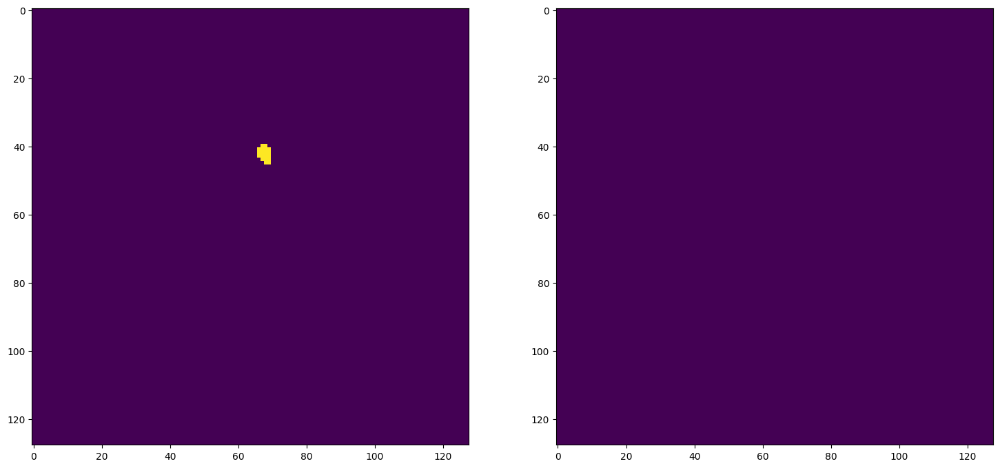

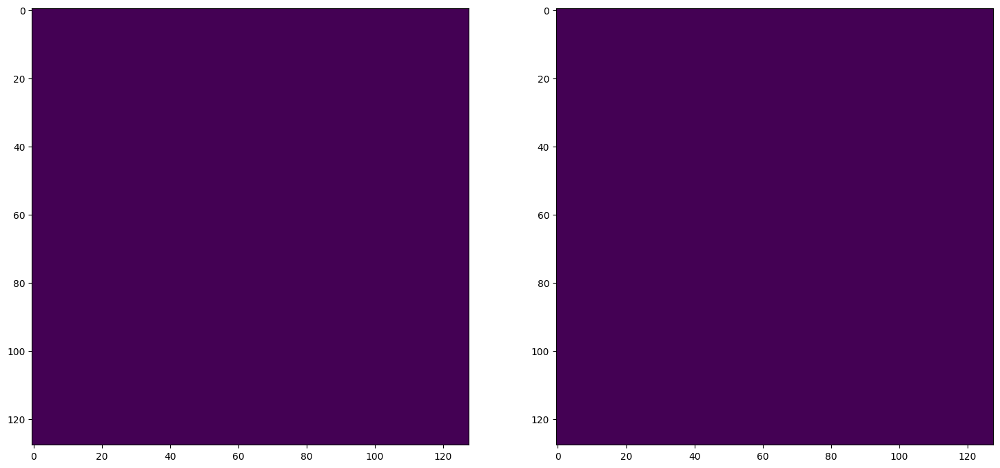


pancreas_330_024
Mean Value: 0.492
0.7317554240631163
0.8451025056947609

pancreas_331_000
Mean Value: 0.492
0.5655526992287918
0.722495894909688

pancreas_331_008
Mean Value: 0.492
0.3240901213171577
0.4895287958115183

pancreas_331_016
Mean Value: 0.492
0.705087798289059
0.8270398732505941

pancreas_333_000
Mean Value: 0.492
0.6465064899199117
0.7853069439785307

pancreas_333_008
Mean Value: 0.492
0.49958088851634536
0.6662940190050307

pancreas_333_016
Mean Value: 0.492
0.5962541031087083
0.7470666505382847

pancreas_346_008
Mean Value: 0.492
0.7159763313609467
0.8344827586206897

pancreas_346_016
Mean Value: 0.492
0.20697765582124658
0.3429684962650211

pancreas_346_024
Mean Value: 0.492
0.7702010248324793
0.8701848140725896


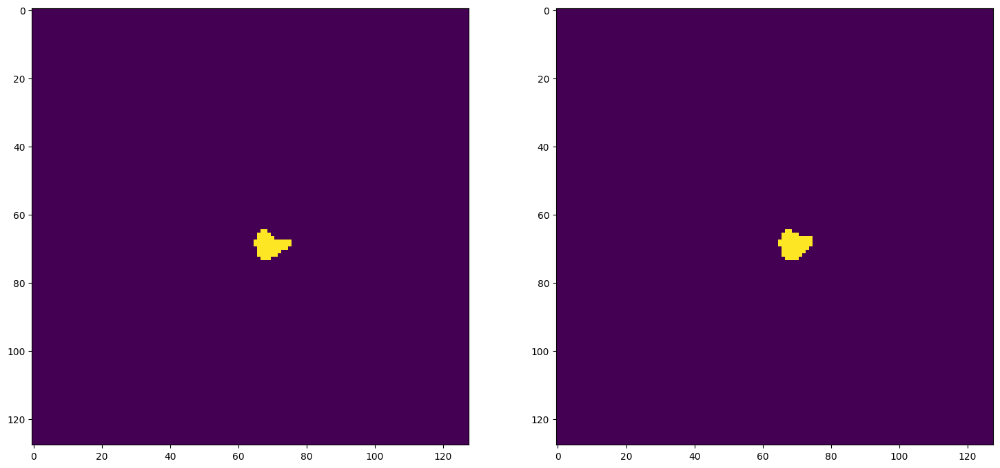

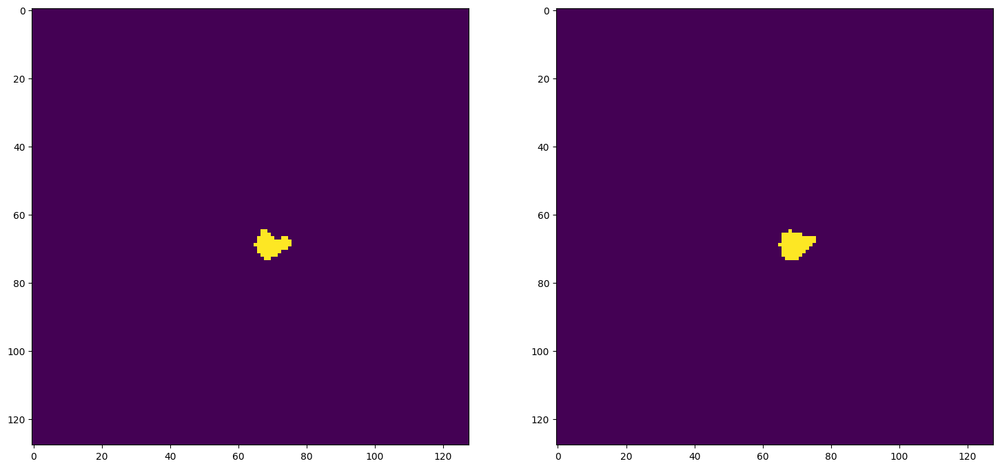

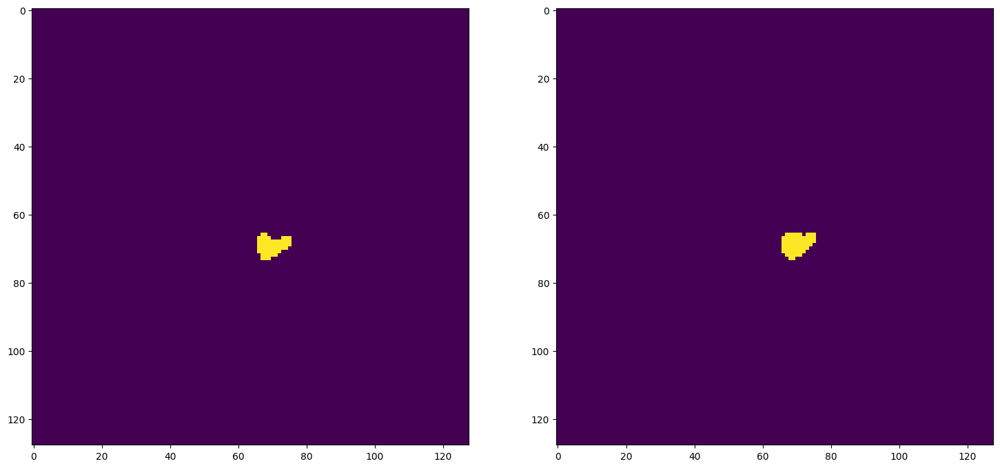

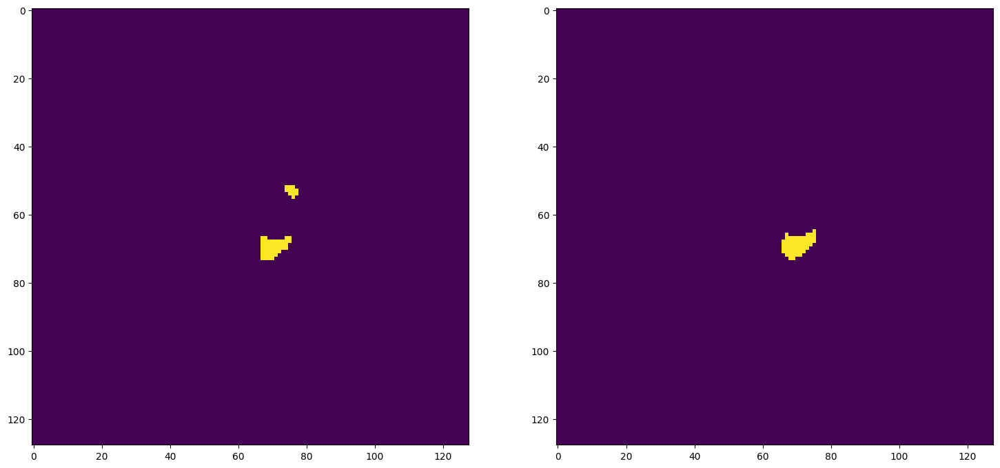

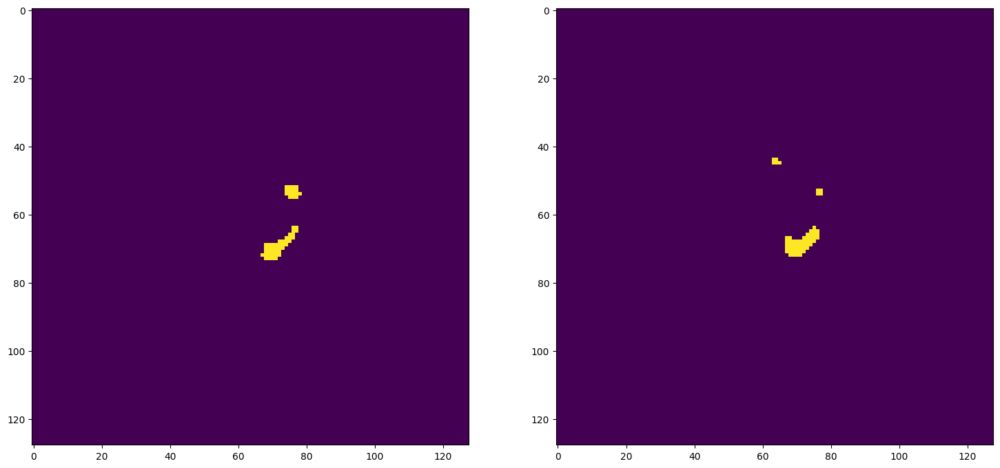

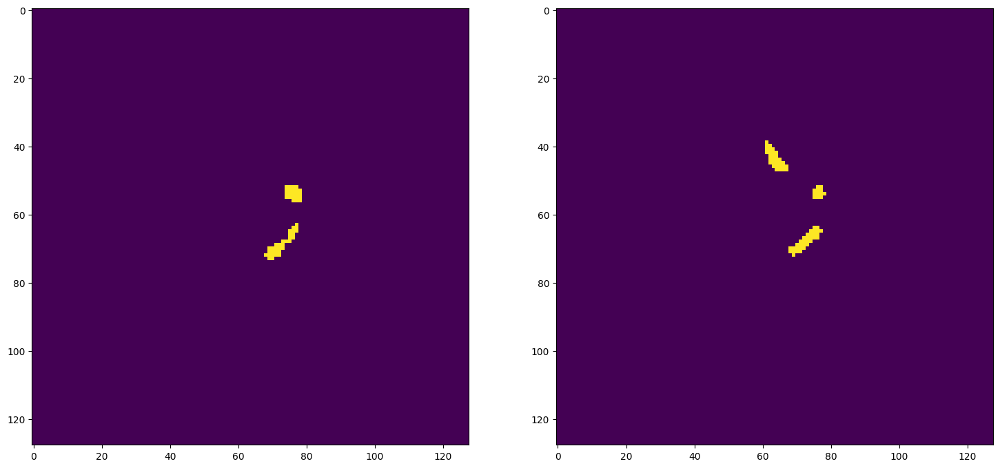


pancreas_346_032
Mean Value: 0.492
0.5811238622872972
0.7350769615817795

pancreas_355_000
Mean Value: 0.492
0.6046931407942239
0.7536557930258717

pancreas_355_008
Mean Value: 0.492
0.41091860084995097
0.582483781278962

pancreas_355_016
Mean Value: 0.492
0.5558462467297243
0.7145259345492174

pancreas_370_008
Mean Value: 0.492
0.33476394849785407
0.5016077170418006

pancreas_370_016
Mean Value: 0.492
0.7035664659564613
0.8259923871669386

pancreas_370_024
Mean Value: 0.492
0.5583774250440917
0.7166138524219103

pancreas_372_000
Mean Value: 0.492
0.7638134482112755
0.8660932356376766


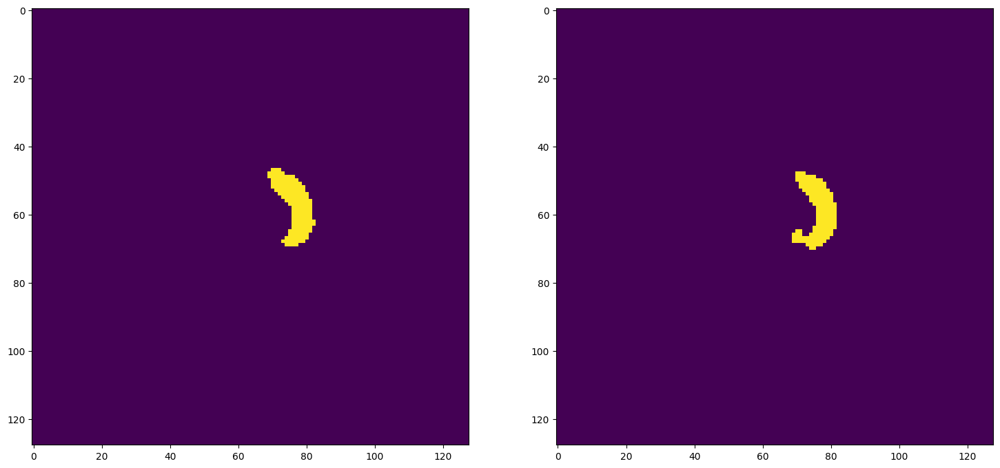

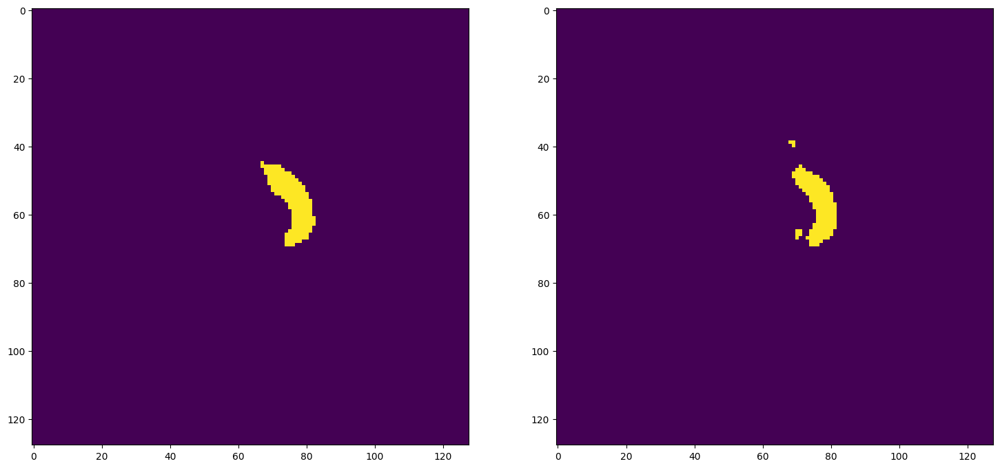

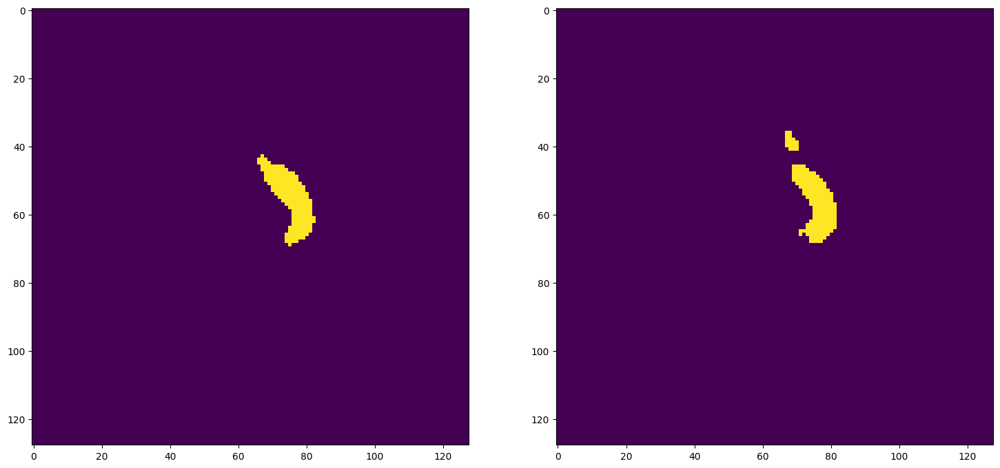

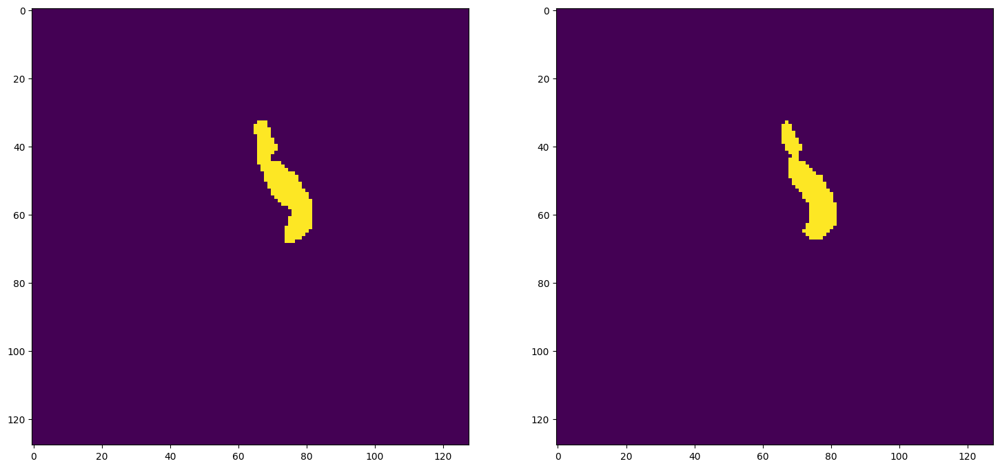

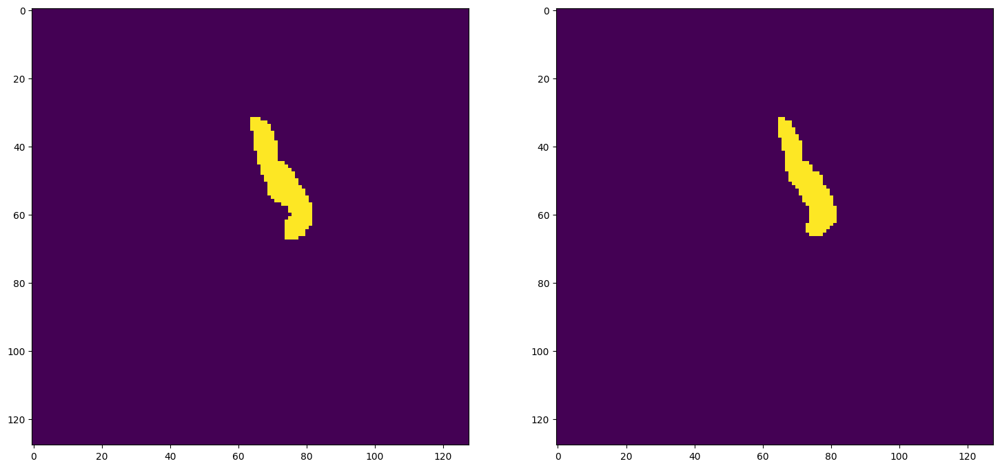

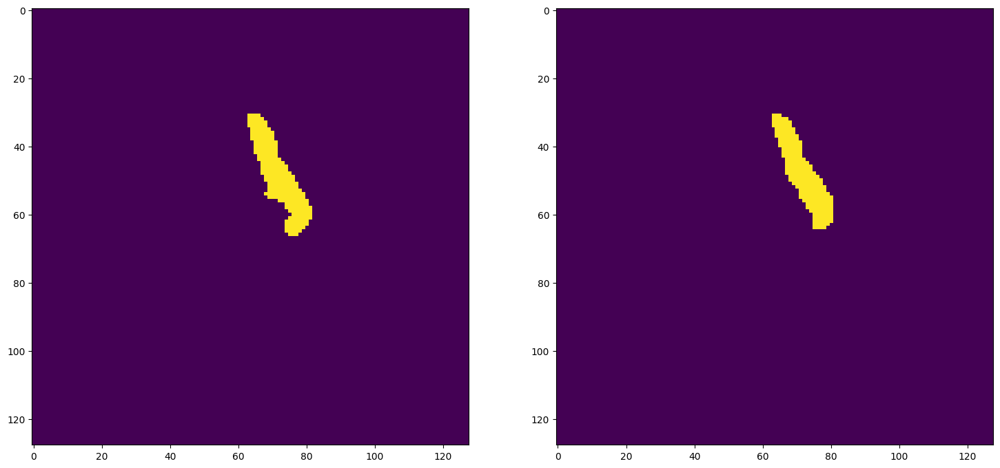


pancreas_372_008
Mean Value: 0.492
0.6855345911949685
0.8134328358208955

pancreas_372_016
Mean Value: 0.492
0.5288994457640538
0.6918694976696013

pancreas_374_024
Mean Value: 0.492
0.2938465084120765
0.4542215888849305

pancreas_374_032
Mean Value: 0.492
0.6661195009848982
0.7996059113300492

pancreas_374_040
Mean Value: 0.492
0.66656
0.7999231950844854

pancreas_374_048
Mean Value: 0.492
0.33076923076923076
0.49710982658959535

pancreas_386_000
Mean Value: 0.492
0.7433409436834094
0.8527774746262141


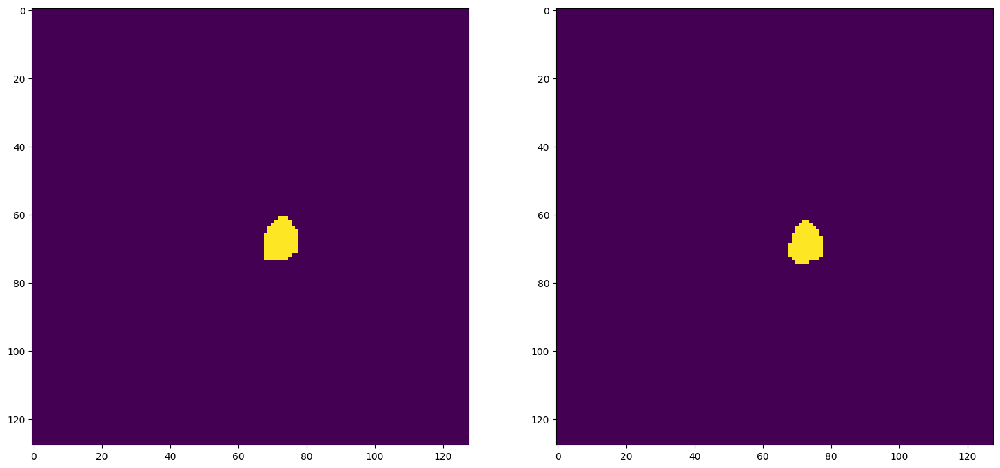

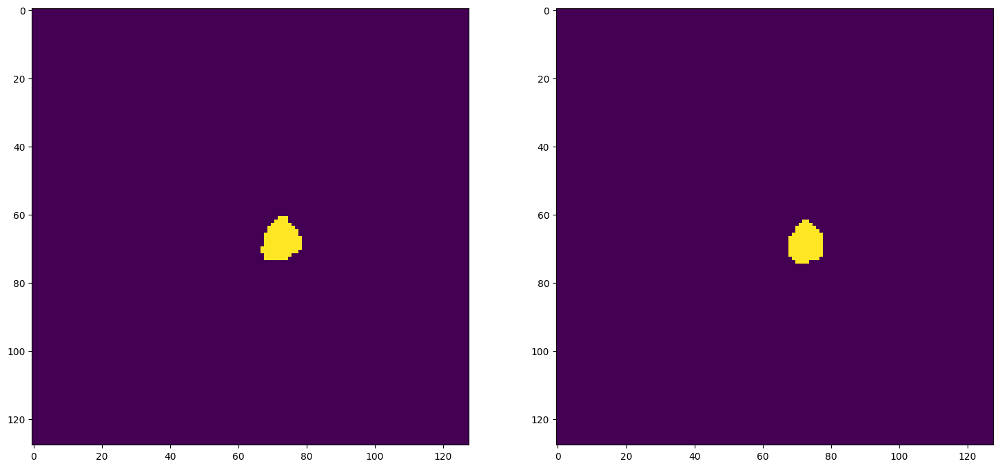

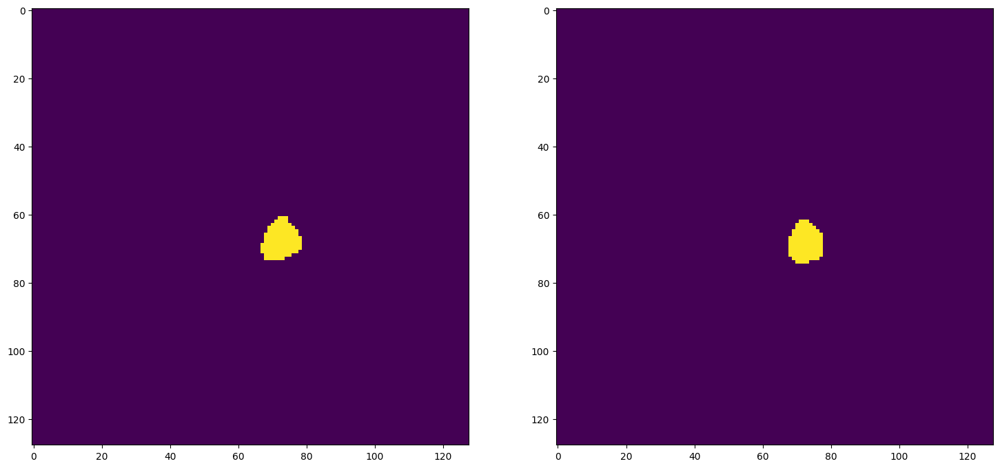

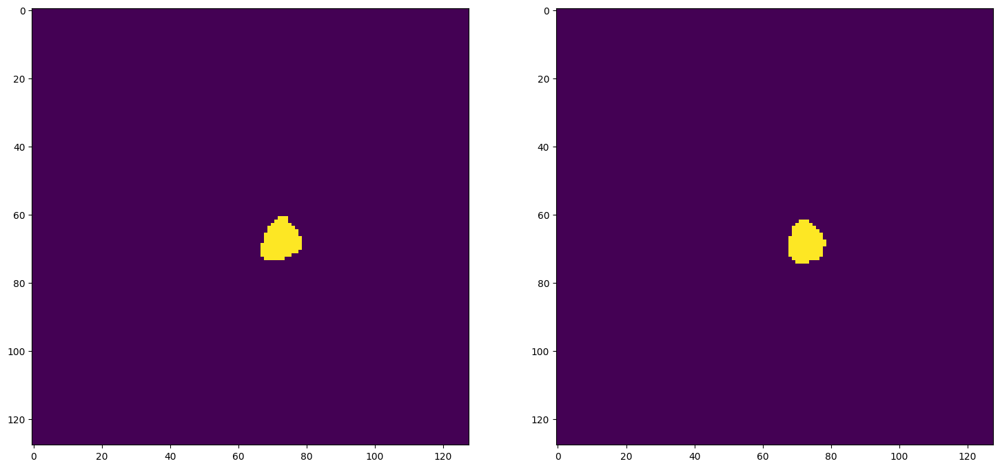

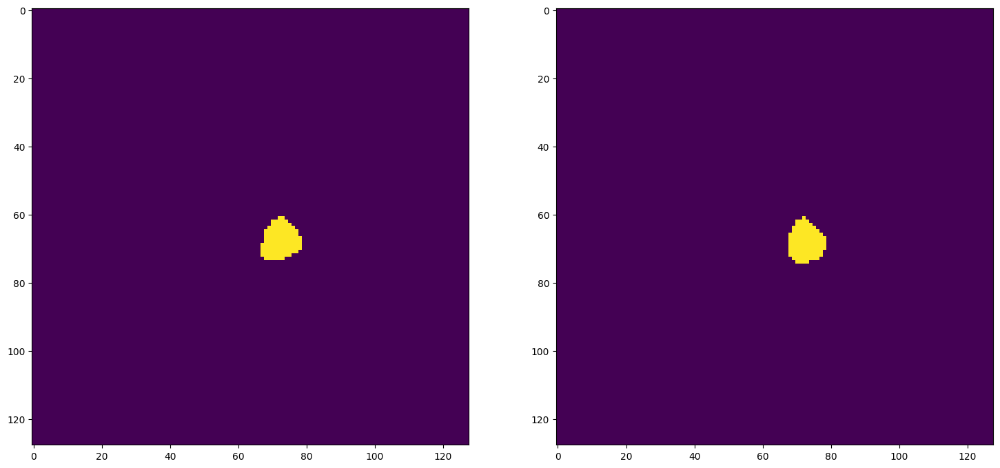

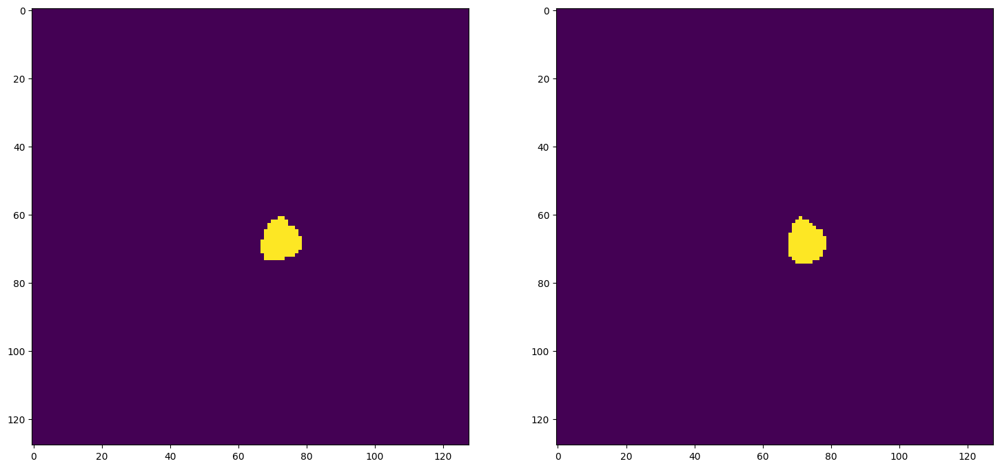


pancreas_386_008
Mean Value: 0.492
0.8058836160618423
0.8925089179548157


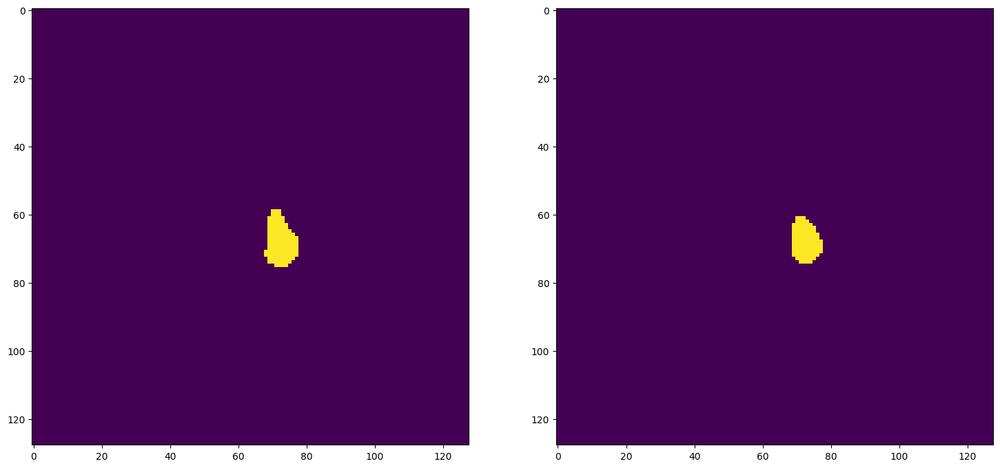

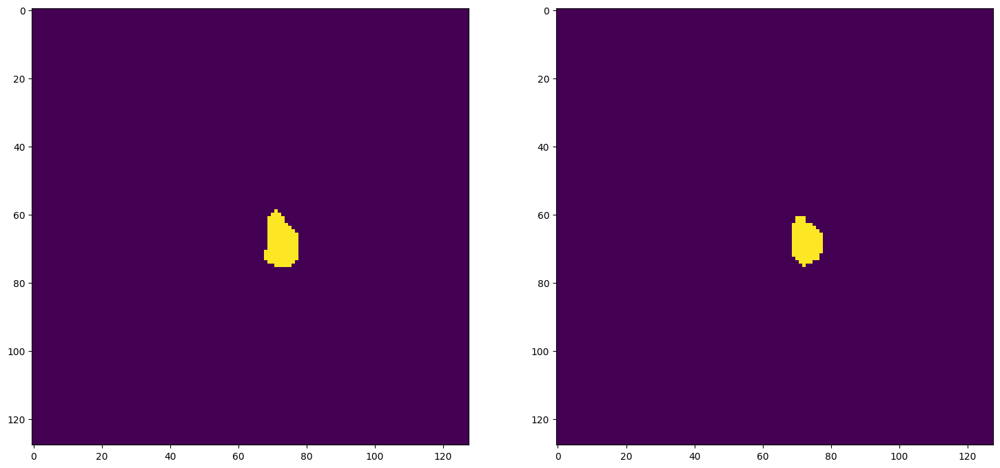

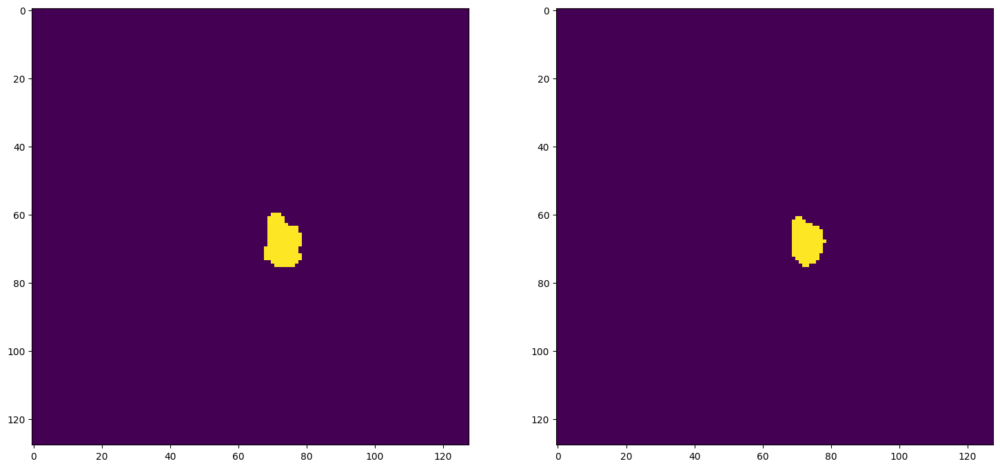

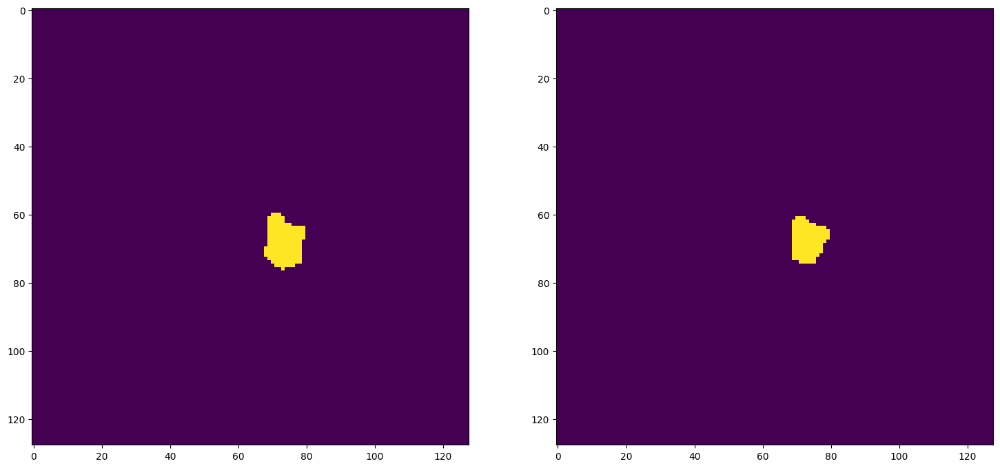

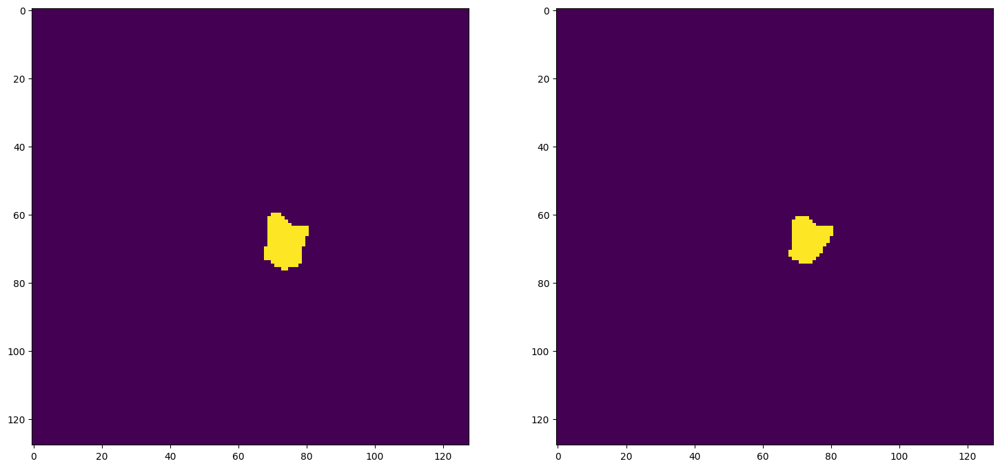

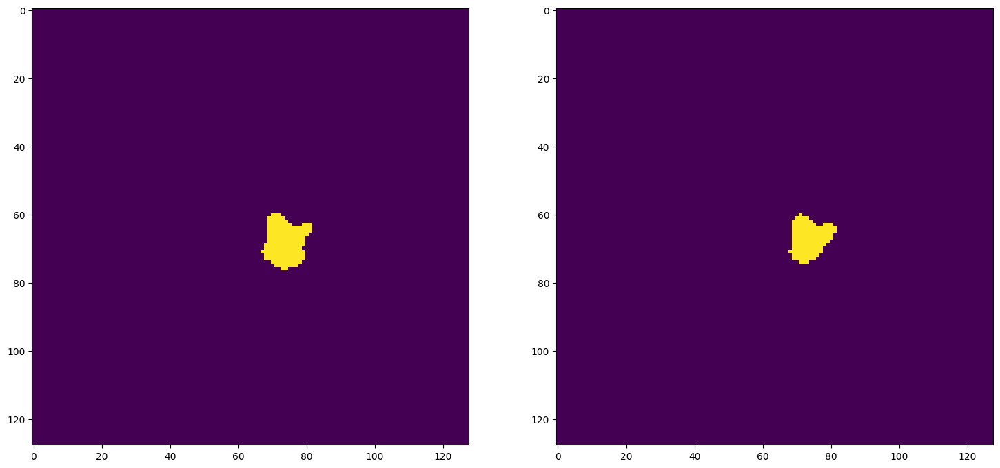


pancreas_386_016
Mean Value: 0.492
0.5753344968004653
0.7304283604135894

pancreas_389_016
Mean Value: 0.492
0.5248177716070809
0.6883678579558389

pancreas_389_024
Mean Value: 0.492
0.6765025343953657
0.8070402764280316

pancreas_389_032
Mean Value: 0.492
0.6340274700930438
0.7760303687635575

pancreas_389_040
Mean Value: 0.492
0.5487758945386064
0.7086575875486382

pancreas_398_000
Mean Value: 0.492
0.7059773828756059
0.8276515151515151

pancreas_398_008
Mean Value: 0.492
0.30136406894363965
0.4631510522466889

pancreas_398_016
Mean Value: 0.492
0.7120736086175943
0.8318259273823568

pancreas_398_024
Mean Value: 0.492
0.45625266752027316
0.6266119577960141

pancreas_401_024
Mean Value: 0.492
0.5216558068225373
0.6856423173803526

pancreas_401_032
Mean Value: 0.492
0.09972208598986432
0.18135870373123233

pancreas_401_040
Mean Value: 0.492
0.6504565303691942
0.7882140709561034

pancreas_401_048
Mean Value: 0.492
0.6272321428571429
0.7709190672153635

pancreas_401_056
Mean Value: 0.49

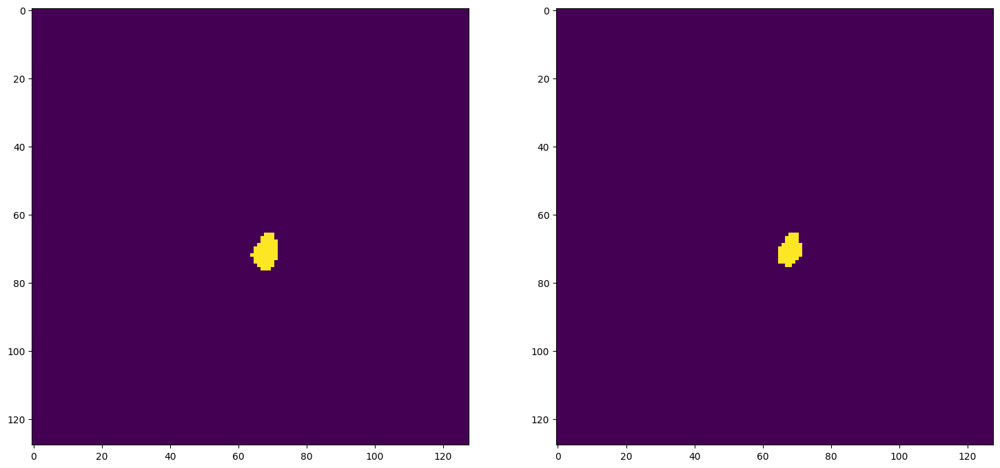

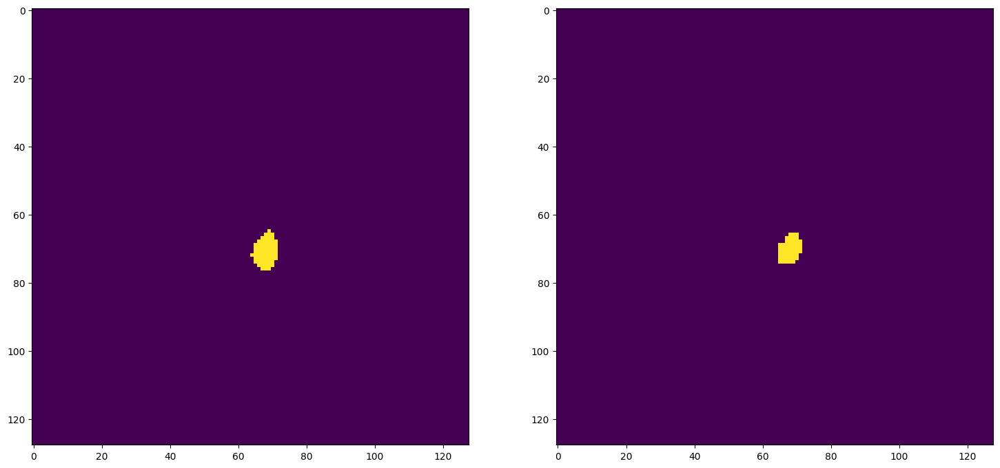

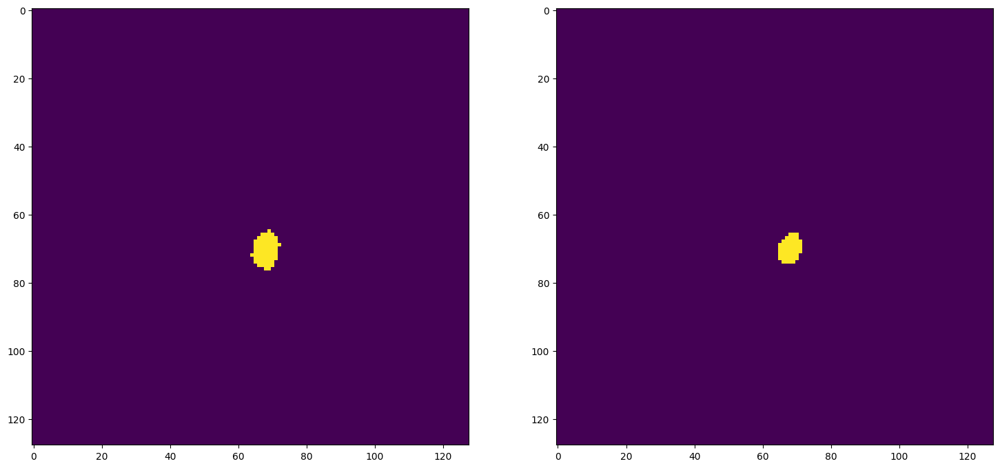

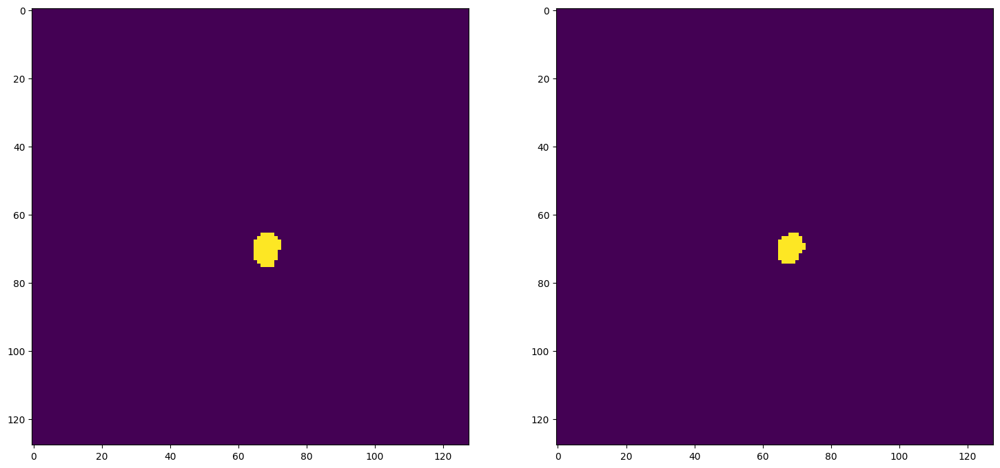

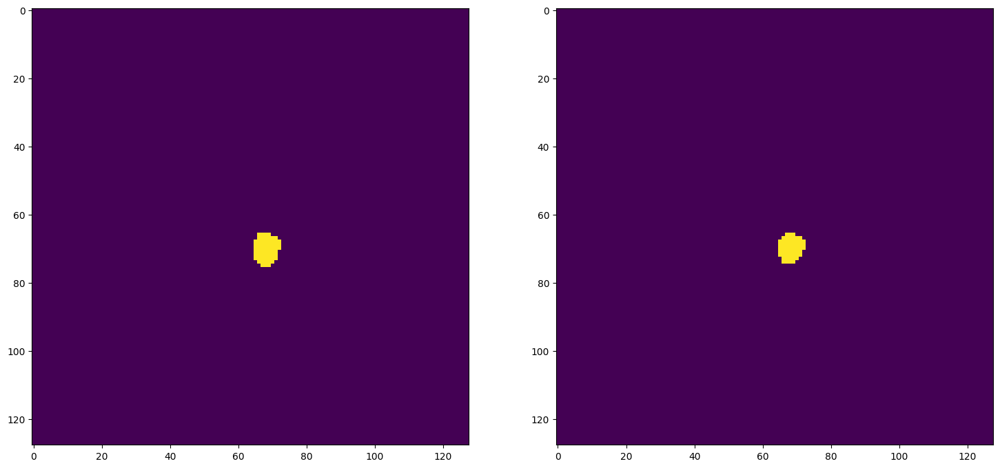

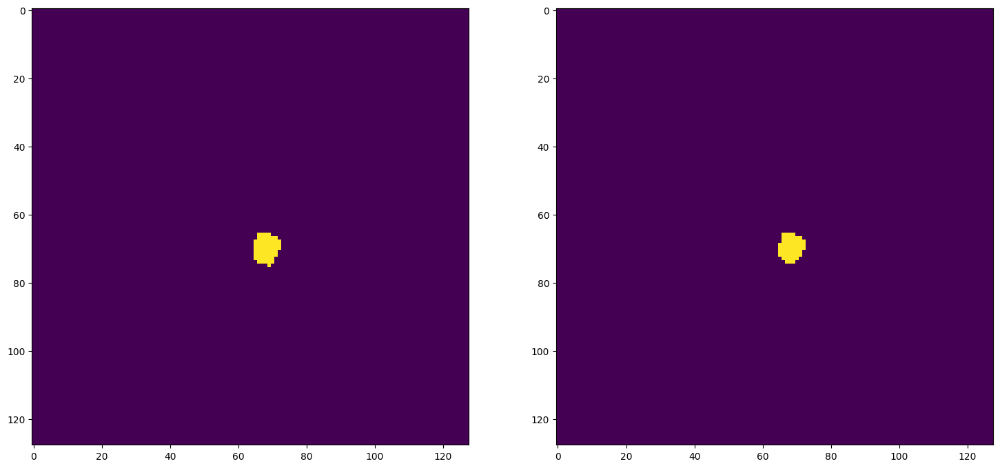


pancreas_402_048
Mean Value: 0.492
0.6437466161342718
0.7832674571805006

pancreas_402_056
Mean Value: 0.492
0.6330297219558965
0.7752825480698664

pancreas_402_064
Mean Value: 0.492
0.5020155038759689
0.6684558216350124

pancreas_404_000
Mean Value: 0.492
0.5704225352112676
0.726457399103139

pancreas_404_008
Mean Value: 0.492
0.3
0.46153846153846156

pancreas_404_016
Mean Value: 0.492
0.6781007402058133
0.8081764389456697

pancreas_404_024
Mean Value: 0.492
0.4180648126867387
0.5896272285251215

pancreas_412_064
Mean Value: 0.492
0.30251298907857066
0.46450667535004886

pancreas_412_072
Mean Value: 0.492
0.6979139840329642
0.8220840285150918

pancreas_412_080
Mean Value: 0.492
0.6417597765363129
0.7817949808592088

pancreas_412_088
Mean Value: 0.492
0.5848271446862996
0.7380327206624925

pancreas_412_096
Mean Value: 0.492
0.563505648750428
0.7208232975695205

pancreas_413_000
Mean Value: 0.492
0.65775950668037
0.7935523868567886

pancreas_413_008
Mean Value: 0.492
0.6949257425742574

In [49]:
data = []
n = 0
for batch in valloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        for i in range(ct_images.shape[0]):
            filename = val_ct_paths[n][-23:-7]
            print(filename)
            n += 1
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            # outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            # outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            # outputs_np_min[labels_np == 0] = 0
            # min_outputs = np.min(outputs_np_min)
            # outputs_np_max[labels_np == 1] = 0
            # max_outputs = np.max(outputs_np_max)
            # mean_value = np.mean([min_outputs, max_outputs])  # Pass values as a list
            mean_value = 0.492
            # mean_np = np.median(outputs_np)
            print(f'Mean Value: {mean_value}')
            # print(f'Mean np: {mean_np}')
            outputs_np = (outputs_np > mean_value)
            outputs_np_float = outputs_np.astype(float)

            structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            labeled_array, num_features = label(outputs_np, structure)
            component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            largest_component_index = np.argmax(component_sizes) + 1
            largest_component = np.zeros_like(outputs_np)
            largest_component[labeled_array == largest_component_index] = 1
            outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            print(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            print(dice)
            if dice >= 0.85:
                for i in range(29,35):
                    ar_lbl = labels_np[i,:,:]
                    ar_out = outputs_np[i,:,:]

                    fig = plt.figure(figsize=(18,15))

                    plt.subplot(1,2,1)
                    plt.imshow(ar_lbl)

                    plt.subplot(1,2,2)
                    plt.imshow(ar_out)

                    plt.show()
            print()

            data.append([filename, iou, dice, mean_value])

df = pd.DataFrame(data, columns=['Filename', 'IoU', 'Dice', 'Mean Value'])

In [50]:
resultdf = df

# Используем метод apply, чтобы применить функцию к столбцу Filename
# для получения обрезанных значений от начала до минус третьего символа
resultdf['Shortened_Filename'] = resultdf['Filename'].apply(lambda x: x[:-4])

# Группируем данные по обрезанным именам файла
grouped = resultdf.groupby('Shortened_Filename')

# Затем находим максимальные значения IoU и Dice в каждой группе
max_values = grouped[['IoU', 'Dice']].max()

# Объединяем полученные максимальные значения с исходными данными и столбцом Shortened_Filename
result = pd.merge(max_values, resultdf, on=['IoU', 'Dice', 'Shortened_Filename'], how='inner')

# В результате получаем строки с самыми высокими показателями для каждой группы
print(result)


         IoU      Dice Shortened_Filename          Filename  Mean Value
0   0.670684  0.802886       pancreas_006  pancreas_006_016       0.492
1   0.717090  0.835239       pancreas_015  pancreas_015_008       0.492
2   0.703934  0.826246       pancreas_021  pancreas_021_024       0.492
3   0.593238  0.744695       pancreas_025  pancreas_025_000       0.492
4   0.711018  0.831105       pancreas_046  pancreas_046_008       0.492
..       ...       ...                ...               ...         ...
65  0.749407  0.856756       pancreas_401  pancreas_401_056       0.492
66  0.643747  0.783267       pancreas_402  pancreas_402_048       0.492
67  0.678101  0.808176       pancreas_404  pancreas_404_016       0.492
68  0.697914  0.822084       pancreas_412  pancreas_412_072       0.492
69  0.694926  0.820007       pancreas_413  pancreas_413_008       0.492

[70 rows x 5 columns]


In [41]:
# Рассчитываем среднее и медиану для столбцов IoU и Dice
iou_mean = result['IoU'].mean()
dice_mean = result['Dice'].mean()
iou_median = result['IoU'].median()
dice_median = result['Dice'].median()
mean_mean = result['Mean Value'].mean()
mean_median = result['Mean Value'].median()
# Рассчитываем количество элементов в DataFrame
n = len(result)

# Задаем уровень доверия
confidence_level = 0.95

# Рассчитываем стандартное отклонение для столбцов IoU и Dice
iou_std = result['IoU'].std()
dice_std = result['Dice'].std()

# Рассчитываем стандартную ошибку для столбцов IoU и Dice
iou_stderr = iou_std / (n**0.5)
dice_stderr = dice_std / (n**0.5)

# Рассчитываем значение t-статистики для заданного уровня доверия
t_value = stats.t.ppf((1 + confidence_level) / 2, n - 1)

# Рассчитываем половину ширины интервала для столбца IoU
iou_half_width = t_value * iou_stderr

# Рассчитываем доверительный интервал для столбца IoU в формате +-
iou_ci_format = (iou_mean - iou_half_width, iou_mean + iou_half_width)

# Рассчитываем половину ширины интервала для столбца Dice
dice_half_width = t_value * dice_stderr

# Рассчитываем доверительный интервал для столбца Dice в формате +-
dice_ci_format = (dice_mean - dice_half_width, dice_mean + dice_half_width)

print(f"Среднее значение для столбца IoU: {iou_mean:.4f}")
print(f"Среднее значение для столбца Dice: {dice_mean:.4f}")
print(f"Среднее значение для столбца Mean: {mean_mean:.4f}")

print(f"Медианное значение для столбца IoU: {iou_median:.4f}")
print(f"Медианное значение для столбца Dice: {dice_median:.4f}")
print(f"Медианное значение для столбца Mean: {mean_median:.4f}")

print(f"Доверительный интервал для столбца IoU: ±{iou_half_width:.4f}")
print(f"Доверительный интервал для столбца Dice: ±{dice_half_width:.4f}")


Среднее значение для столбца IoU: 0.7021
Среднее значение для столбца Dice: 0.8230
Медианное значение для столбца IoU: 0.7050
Медианное значение для столбца Dice: 0.8270
Доверительный интервал для столбца IoU: ±0.0165
Доверительный интервал для столбца Dice: ±0.0116


In [51]:
# Рассчитываем среднее и медиану для столбцов IoU и Dice
iou_mean = result['IoU'].mean()
dice_mean = result['Dice'].mean()
iou_median = result['IoU'].median()
dice_median = result['Dice'].median()
mean_mean = result['Mean Value'].mean()
mean_median = result['Mean Value'].median()
# Рассчитываем количество элементов в DataFrame
n = len(result)

# Задаем уровень доверия
confidence_level = 0.95

# Рассчитываем стандартное отклонение для столбцов IoU и Dice
iou_std = result['IoU'].std()
dice_std = result['Dice'].std()

# Рассчитываем стандартную ошибку для столбцов IoU и Dice
iou_stderr = iou_std / (n**0.5)
dice_stderr = dice_std / (n**0.5)

# Рассчитываем значение t-статистики для заданного уровня доверия
t_value = stats.t.ppf((1 + confidence_level) / 2, n - 1)

# Рассчитываем половину ширины интервала для столбца IoU
iou_half_width = t_value * iou_stderr

# Рассчитываем доверительный интервал для столбца IoU в формате +-
iou_ci_format = (iou_mean - iou_half_width, iou_mean + iou_half_width)

# Рассчитываем половину ширины интервала для столбца Dice
dice_half_width = t_value * dice_stderr

# Рассчитываем доверительный интервал для столбца Dice в формате +-
dice_ci_format = (dice_mean - dice_half_width, dice_mean + dice_half_width)

print(f"Среднее значение для столбца IoU: {iou_mean:.4f}")
print(f"Среднее значение для столбца Dice: {dice_mean:.4f}")
print(f"Среднее значение для столбца Mean: {mean_mean:.4f}")

print(f"Медианное значение для столбца IoU: {iou_median:.4f}")
print(f"Медианное значение для столбца Dice: {dice_median:.4f}")
print(f"Медианное значение для столбца Mean: {mean_median:.4f}")

print(f"Доверительный интервал для столбца IoU: ±{iou_half_width:.4f}")
print(f"Доверительный интервал для столбца Dice: ±{dice_half_width:.4f}")


Среднее значение для столбца IoU: 0.7006
Среднее значение для столбца Dice: 0.8204
Среднее значение для столбца Mean: 0.4920
Медианное значение для столбца IoU: 0.7038
Медианное значение для столбца Dice: 0.8261
Медианное значение для столбца Mean: 0.4920
Доверительный интервал для столбца IoU: ±0.0206
Доверительный интервал для столбца Dice: ±0.0168


In [45]:
data = []
n = 0
for batch in valloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        for i in range(ct_images.shape[0]):
            filename = val_ct_paths[n][-23:-7]
            print(filename)
            n += 1
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_min[labels_np == 0] = 0
            min_outputs = np.min(outputs_np_min)
            outputs_np_max[labels_np == 1] = 0
            max_outputs = np.max(outputs_np_max)
            mean_value = np.mean([min_outputs, max_outputs])  # Pass values as a list
            # mean_np = np.median(outputs_np)
            print(f'Mean Value: {mean_value}')
            # print(f'Mean np: {mean_np}')
            outputs_np = (outputs_np > mean_value)
            outputs_np_float = outputs_np.astype(float)

            structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            labeled_array, num_features = label(outputs_np, structure)
            component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            largest_component_index = np.argmax(component_sizes) + 1
            largest_component = np.zeros_like(outputs_np)
            largest_component[labeled_array == largest_component_index] = 1
            outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            print(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            print(dice)
            if dice >= 0.85:
                for i in range(29,35):
                    ar_lbl = labels_np[i,:,:]
                    ar_out = outputs_np[i,:,:]

                    fig = plt.figure(figsize=(18,15))

                    plt.subplot(1,2,1)
                    plt.imshow(ar_lbl)

                    plt.subplot(1,2,2)
                    plt.imshow(ar_out)

                    plt.show()
            print()

            data.append([filename, iou, dice, mean_value])

df = pd.DataFrame(data, columns=['Filename', 'IoU', 'Dice', 'Mean Value'])

resultdf = df

# Используем метод apply, чтобы применить функцию к столбцу Filename
# для получения обрезанных значений от начала до минус третьего символа
resultdf['Shortened_Filename'] = resultdf['Filename'].apply(lambda x: x[:-4])

# Группируем данные по обрезанным именам файла
grouped = resultdf.groupby('Shortened_Filename')

# Затем находим максимальные значения IoU и Dice в каждой группе
max_values = grouped[['IoU', 'Dice']].max()

# Объединяем полученные максимальные значения с исходными данными и столбцом Shortened_Filename
result = pd.merge(max_values, resultdf, on=['IoU', 'Dice', 'Shortened_Filename'], how='inner')

# В результате получаем строки с самыми высокими показателями для каждой группы
print(result)

# Рассчитываем среднее и медиану для столбцов IoU и Dice
iou_mean = result['IoU'].mean()
dice_mean = result['Dice'].mean()
iou_median = result['IoU'].median()
dice_median = result['Dice'].median()
mean_mean = result['Mean Value'].mean()
mean_median = result['Mean Value'].median()

# Рассчитываем количество элементов в DataFrame
n = len(result)

# Задаем уровень доверия
confidence_level = 0.95

# Рассчитываем стандартное отклонение для столбцов IoU и Dice
iou_std = result['IoU'].std()
dice_std = result['Dice'].std()

# Рассчитываем стандартную ошибку для столбцов IoU и Dice
iou_stderr = iou_std / (n**0.5)
dice_stderr = dice_std / (n**0.5)

# Рассчитываем значение t-статистики для заданного уровня доверия
t_value = stats.t.ppf((1 + confidence_level) / 2, n - 1)

# Рассчитываем половину ширины интервала для столбца IoU
iou_half_width = t_value * iou_stderr

# Рассчитываем доверительный интервал для столбца IoU в формате +-
iou_ci_format = (iou_mean - iou_half_width, iou_mean + iou_half_width)

# Рассчитываем половину ширины интервала для столбца Dice
dice_half_width = t_value * dice_stderr

# Рассчитываем доверительный интервал для столбца Dice в формате +-
dice_ci_format = (dice_mean - dice_half_width, dice_mean + dice_half_width)

print(f"Среднее значение для столбца IoU: {iou_mean:.4f}")
print(f"Среднее значение для столбца Dice: {dice_mean:.4f}")
print(f"Среднее значение для столбца Mean: {mean_mean:.4f}")

print(f"Медианное значение для столбца IoU: {iou_median:.4f}")
print(f"Медианное значение для столбца Dice: {dice_median:.4f}")
print(f"Медианное значение для столбца Mean: {mean_median:.4f}")

print(f"Доверительный интервал для столбца IoU: ±{iou_half_width:.4f}")
print(f"Доверительный интервал для столбца Dice: ±{dice_half_width:.4f}")

pancreas_041_022
Mean Value: 0.4959307312965393
0.35210362916175997
0.5208234362628662

pancreas_041_024
Mean Value: 0.4985649287700653
0.724816369359916
0.8404562737642586

pancreas_041_026
Mean Value: 0.49522972106933594
0.7182528983553519
0.83602698885925

pancreas_041_028
Mean Value: 0.4957217276096344
0.35704293554288175
0.5262072793592895

pancreas_041_030
Mean Value: 0.4949706494808197
0.7192793761763915
0.836721926806381

pancreas_406_008
Mean Value: 0.49560973048210144
0.3674173041698093
0.5373887006540068

pancreas_421_020
Mean Value: 0.4944579601287842
0.71242185376461
0.8320634920634921

pancreas_421_022
Mean Value: 0.49449750781059265
0.35731285157940285
0.5265003586514705

pancreas_421_024
Mean Value: 0.4955770671367645
0.35316346361477
0.5219819676055214

pancreas_421_026
Mean Value: 0.4960116744041443
0.7081081081081081
0.8291139240506329

pancreas_421_028
Mean Value: 0.4936569631099701
0.715064015254699
0.8338627700127065

pancreas_421_030
Mean Value: 0.494233012199401

In [68]:
data = []
n = 0
for batch in valloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        for i in range(ct_images.shape[0]):
            filename = val_ct_paths[n][-23:-7]
            # print(filename)
            n += 1
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            outputs_np_min[labels_np == 0] = 0
            min_outputs = np.min(outputs_np_min)
            outputs_np_max[labels_np == 1] = 0
            max_outputs = np.max(outputs_np_max)
            mean_value = np.mean([min_outputs, max_outputs])  # Pass values as a list
            # mean_np = np.median(outputs_np)
            # print(f'Mean Value: {mean_value}')
            # print(f'Mean np: {mean_np}')
            outputs_np = (outputs_np > mean_value)
            outputs_np_float = outputs_np.astype(float)

            structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            labeled_array, num_features = label(outputs_np, structure)
            component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            largest_component_index = np.argmax(component_sizes) + 1
            largest_component = np.zeros_like(outputs_np)
            largest_component[labeled_array == largest_component_index] = 1
            outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            # print(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            # print(dice)
            # if dice >= 0.85:
            #     for i in range(29,35):
            #         ar_lbl = labels_np[i,:,:]
            #         ar_out = outputs_np[i,:,:]

            #         fig = plt.figure(figsize=(18,15))

            #         plt.subplot(1,2,1)
            #         plt.imshow(ar_lbl)

            #         plt.subplot(1,2,2)
            #         plt.imshow(ar_out)

            #         plt.show()
            # print()

            data.append([filename, iou, dice, mean_value])

df = pd.DataFrame(data, columns=['Filename', 'IoU', 'Dice', 'Mean Value'])

resultdf = df

# Используем метод apply, чтобы применить функцию к столбцу Filename
# для получения обрезанных значений от начала до минус третьего символа
resultdf['Shortened_Filename'] = resultdf['Filename'].apply(lambda x: x[:-4])

# Группируем данные по обрезанным именам файла
grouped = resultdf.groupby('Shortened_Filename')

# Затем находим максимальные значения IoU и Dice в каждой группе
max_values = grouped[['IoU', 'Dice']].max()

# Объединяем полученные максимальные значения с исходными данными и столбцом Shortened_Filename
result = pd.merge(max_values, resultdf, on=['IoU', 'Dice', 'Shortened_Filename'], how='inner')

# В результате получаем строки с самыми высокими показателями для каждой группы
# print(result)

# Рассчитываем среднее и медиану для столбцов IoU и Dice
iou_mean = result['IoU'].mean()
dice_mean = result['Dice'].mean()
iou_median = result['IoU'].median()
dice_median = result['Dice'].median()
mean_mean = result['Mean Value'].mean()
mean_median = result['Mean Value'].median()

# Рассчитываем количество элементов в DataFrame
n = len(result)

# Задаем уровень доверия
confidence_level = 0.95

# Рассчитываем стандартное отклонение для столбцов IoU и Dice
iou_std = result['IoU'].std()
dice_std = result['Dice'].std()

# Рассчитываем стандартную ошибку для столбцов IoU и Dice
iou_stderr = iou_std / (n**0.5)
dice_stderr = dice_std / (n**0.5)

# Рассчитываем значение t-статистики для заданного уровня доверия
t_value = stats.t.ppf((1 + confidence_level) / 2, n - 1)

# Рассчитываем половину ширины интервала для столбца IoU
iou_half_width = t_value * iou_stderr

# Рассчитываем доверительный интервал для столбца IoU в формате +-
iou_ci_format = (iou_mean - iou_half_width, iou_mean + iou_half_width)

# Рассчитываем половину ширины интервала для столбца Dice
dice_half_width = t_value * dice_stderr

# Рассчитываем доверительный интервал для столбца Dice в формате +-
dice_ci_format = (dice_mean - dice_half_width, dice_mean + dice_half_width)

print(f"Среднее значение для столбца IoU: {iou_mean:.4f}")
print(f"Среднее значение для столбца Dice: {dice_mean:.4f}")
print(f"Среднее значение для столбца Mean: {mean_mean:.4f}")

print(f"Медианное значение для столбца IoU: {iou_median:.4f}")
print(f"Медианное значение для столбца Dice: {dice_median:.4f}")
print(f"Медианное значение для столбца Mean: {mean_median:.4f}")

print(f"Доверительный интервал для столбца IoU: ±{iou_half_width:.4f}")
print(f"Доверительный интервал для столбца Dice: ±{dice_half_width:.4f}")

Среднее значение для столбца IoU: 0.8123
Среднее значение для столбца Dice: 0.8960
Среднее значение для столбца Mean: 0.4849
Медианное значение для столбца IoU: 0.8188
Медианное значение для столбца Dice: 0.9004
Медианное значение для столбца Mean: 0.4880
Доверительный интервал для столбца IoU: ±0.0055
Доверительный интервал для столбца Dice: ±0.0034


In [12]:
data = []
n = 0
for batch in testloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        outputs = torch.sigmoid(outputs)  # Применение сигмоиды
        for i in range(ct_images.shape[0]):
            filename = ct_paths_test[n][-23:-7]
            # print(filename)
            n += 1
            outputs_np = outputs[i].squeeze().cpu().numpy().squeeze()
            labels_np = labels[i].squeeze().cpu().numpy().squeeze()

            # outputs_np_min = outputs_np.copy()  # Make a copy to avoid modifying original array
            # outputs_np_max = outputs_np.copy()  # Make a copy to avoid modifying original array
            # outputs_np_min[labels_np == 0] = 0
            # min_outputs = np.min(outputs_np_min)
            # outputs_np_max[labels_np == 1] = 0
            # max_outputs = np.max(outputs_np_max)
            # mean_value = np.mean([min_outputs, max_outputs])  # Pass values as a list
            mean_value = 0.492
            # mean_np = np.median(outputs_np)
            # print(f'Mean Value: {mean_value}')
            # print(f'Mean np: {mean_np}')
            outputs_np = (outputs_np > mean_value)
            outputs_np_float = outputs_np.astype(float)

            structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
            labeled_array, num_features = label(outputs_np, structure)
            component_sizes = nd_sum(outputs_np, labeled_array, range(1, num_features + 1))
            largest_component_index = np.argmax(component_sizes) + 1
            largest_component = np.zeros_like(outputs_np)
            largest_component[labeled_array == largest_component_index] = 1
            outputs_np = largest_component

            # IoU (Jaccard Index)
            intersection = np.sum((labels_np == 1) & (outputs_np == 1))
            union = np.sum((labels_np == 1) | (outputs_np == 1))
            iou = intersection / union
            # print(iou)
            # Dice Coefficient (F1 Score)
            dice = 2 * np.sum((labels_np == 1) & (outputs_np == 1)) / (np.sum(labels_np == 1) + np.sum(outputs_np == 1))
            # print(dice)
            # if dice >= 0.85:
            #     for i in range(29,35):
            #         ar_lbl = labels_np[i,:,:]
            #         ar_out = outputs_np[i,:,:]

            #         fig = plt.figure(figsize=(18,15))

            #         plt.subplot(1,2,1)
            #         plt.imshow(ar_lbl)

            #         plt.subplot(1,2,2)
            #         plt.imshow(ar_out)

            #         plt.show()
            # print()

            data.append([filename, iou, dice, mean_value])

df = pd.DataFrame(data, columns=['Filename', 'IoU', 'Dice', 'Mean Value'])

resultdf = df

# Используем метод apply, чтобы применить функцию к столбцу Filename
# для получения обрезанных значений от начала до минус третьего символа
resultdf['Shortened_Filename'] = resultdf['Filename'].apply(lambda x: x[:-4])

# Группируем данные по обрезанным именам файла
grouped = resultdf.groupby('Shortened_Filename')

# Затем находим максимальные значения IoU и Dice в каждой группе
max_values = grouped[['IoU', 'Dice']].max()

# Объединяем полученные максимальные значения с исходными данными и столбцом Shortened_Filename
result = pd.merge(max_values, resultdf, on=['IoU', 'Dice', 'Shortened_Filename'], how='inner')

# В результате получаем строки с самыми высокими показателями для каждой группы
# print(result)

# Рассчитываем среднее и медиану для столбцов IoU и Dice
iou_mean = result['IoU'].mean()
dice_mean = result['Dice'].mean()
iou_median = result['IoU'].median()
dice_median = result['Dice'].median()
mean_mean = result['Mean Value'].mean()
mean_median = result['Mean Value'].median()

# Рассчитываем количество элементов в DataFrame
n = len(result)

# Задаем уровень доверия
confidence_level = 0.95

# Рассчитываем стандартное отклонение для столбцов IoU и Dice
iou_std = result['IoU'].std()
dice_std = result['Dice'].std()

# Рассчитываем стандартную ошибку для столбцов IoU и Dice
iou_stderr = iou_std / (n**0.5)
dice_stderr = dice_std / (n**0.5)

# Рассчитываем значение t-статистики для заданного уровня доверия
t_value = stats.t.ppf((1 + confidence_level) / 2, n - 1)

# Рассчитываем половину ширины интервала для столбца IoU
iou_half_width = t_value * iou_stderr

# Рассчитываем доверительный интервал для столбца IoU в формате +-
iou_ci_format = (iou_mean - iou_half_width, iou_mean + iou_half_width)

# Рассчитываем половину ширины интервала для столбца Dice
dice_half_width = t_value * dice_stderr

# Рассчитываем доверительный интервал для столбца Dice в формате +-
dice_ci_format = (dice_mean - dice_half_width, dice_mean + dice_half_width)

print(f"Среднее значение для столбца IoU: {iou_mean:.4f}")
print(f"Среднее значение для столбца Dice: {dice_mean:.4f}")
print(f"Среднее значение для столбца Mean: {mean_mean:.4f}")

print(f"Медианное значение для столбца IoU: {iou_median:.4f}")
print(f"Медианное значение для столбца Dice: {dice_median:.4f}")
print(f"Медианное значение для столбца Mean: {mean_median:.4f}")

print(f"Доверительный интервал для столбца IoU: ±{iou_half_width:.4f}")
print(f"Доверительный интервал для столбца Dice: ±{dice_half_width:.4f}")

Среднее значение для столбца IoU: 0.1503
Среднее значение для столбца Dice: 0.2289
Среднее значение для столбца Mean: 0.4920
Медианное значение для столбца IoU: 0.1039
Медианное значение для столбца Dice: 0.1883
Медианное значение для столбца Mean: 0.4920
Доверительный интервал для столбца IoU: ±0.0393
Доверительный интервал для столбца Dice: ±0.0537


[0.9998, 0.9375, 0.0213]

[0.9988, 0.9311, 0.0]

[0.9996, 0.934, 0.0]

[0.9999, 0.9635, 0.0]

[1.0, 0.9388, 0.0]

[0.9995, 0.9254, 0.0]

[0.9995, 0.9642, 0.0]

[0.9996, 0.9712, 0.0]

[0.9992, 0.9848, 0.0]

[0.9998, 0.9422, 0.8448]


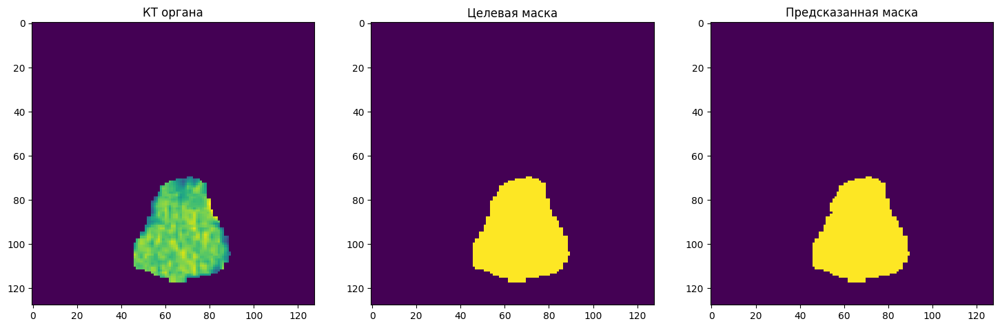

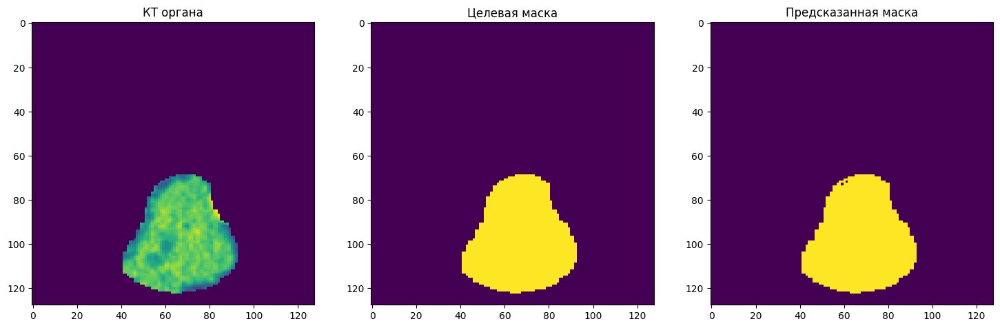

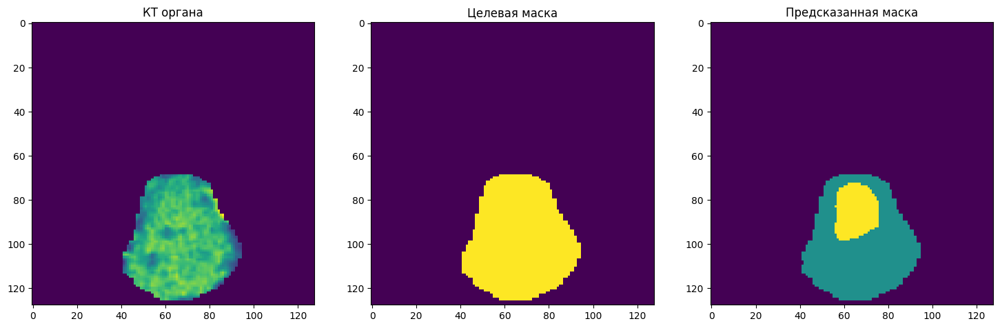

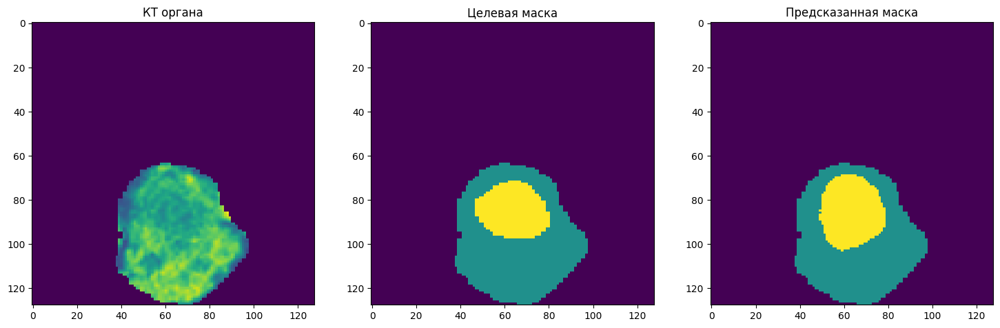

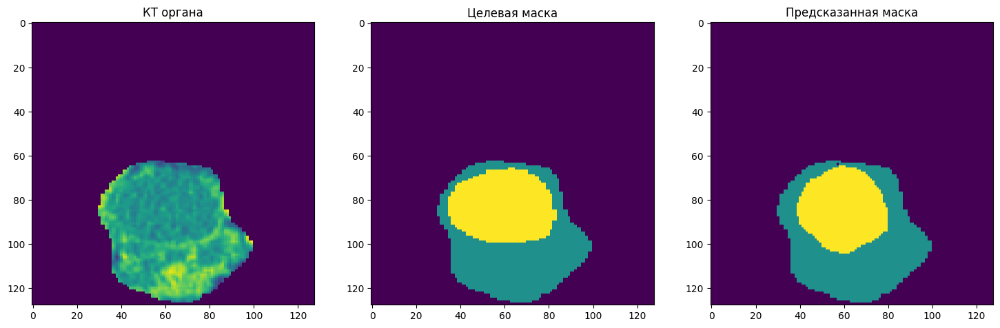

...

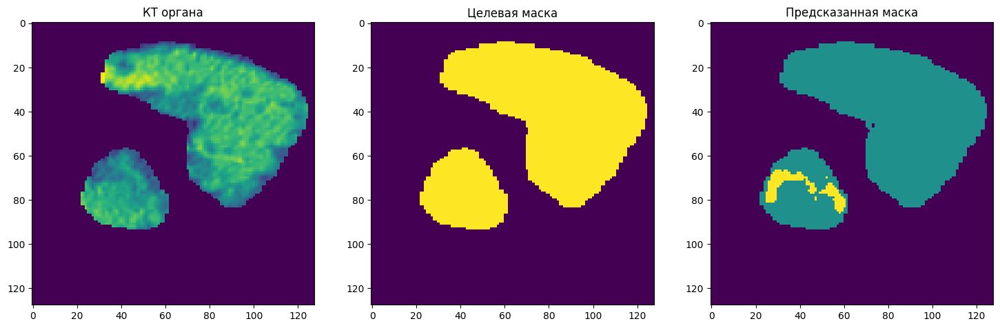

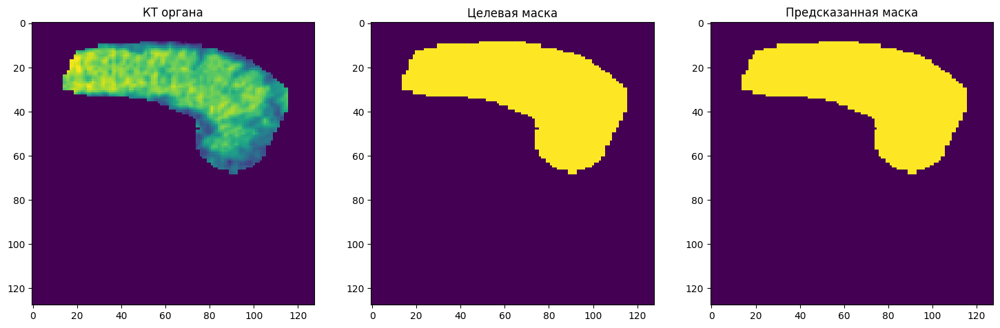

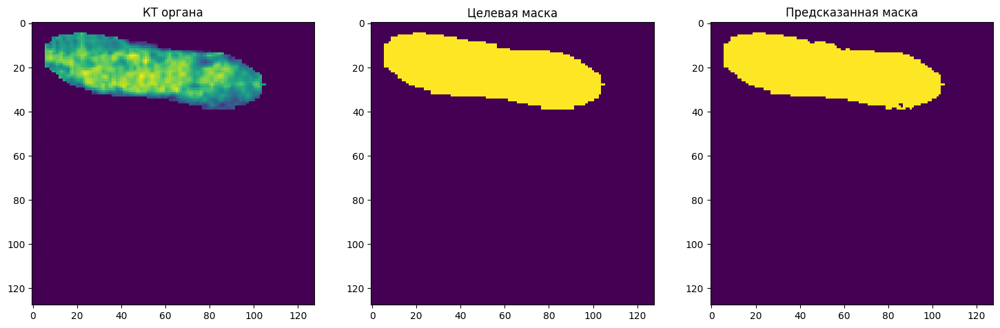

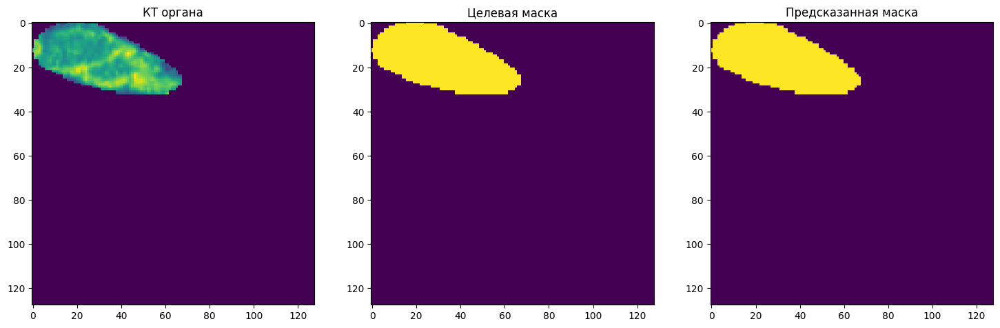

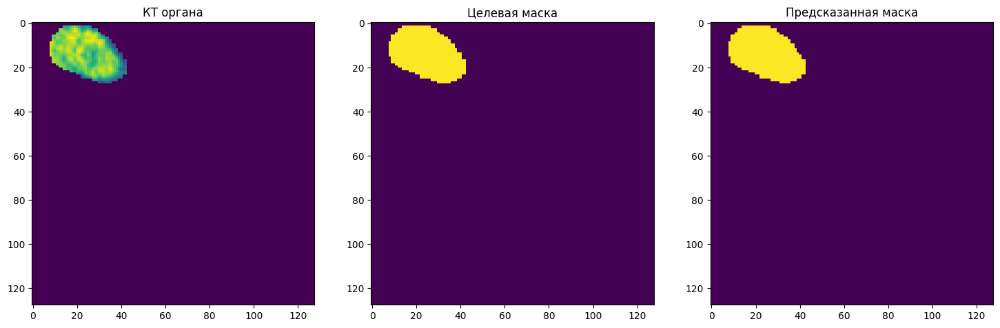


[0.9998, 0.9422, 0.8448]


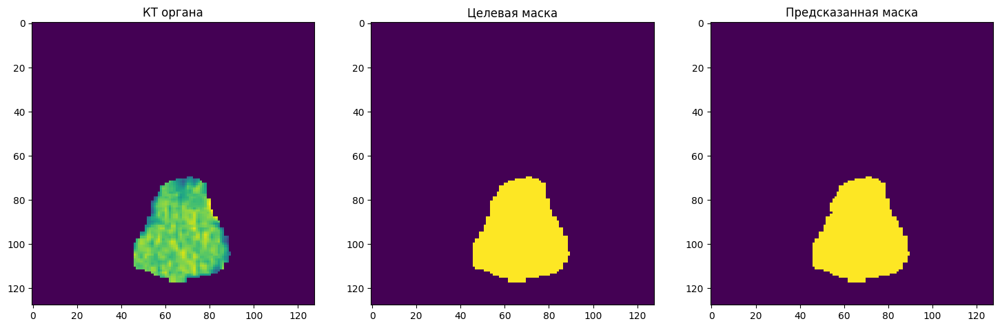

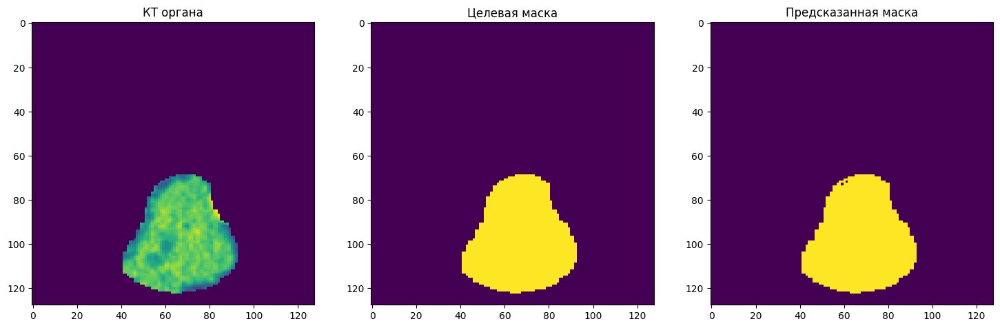

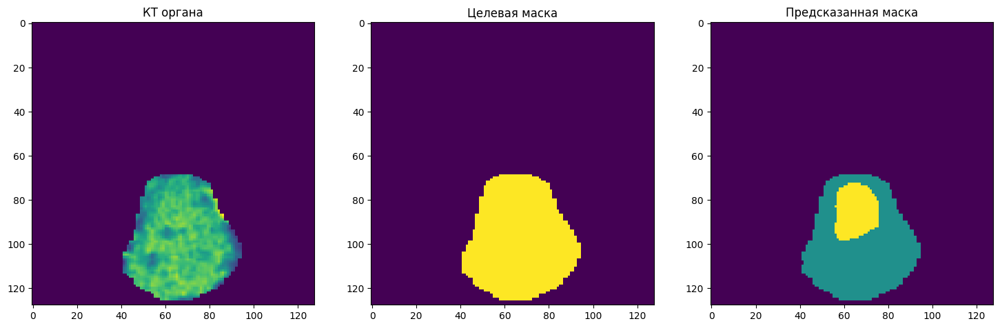

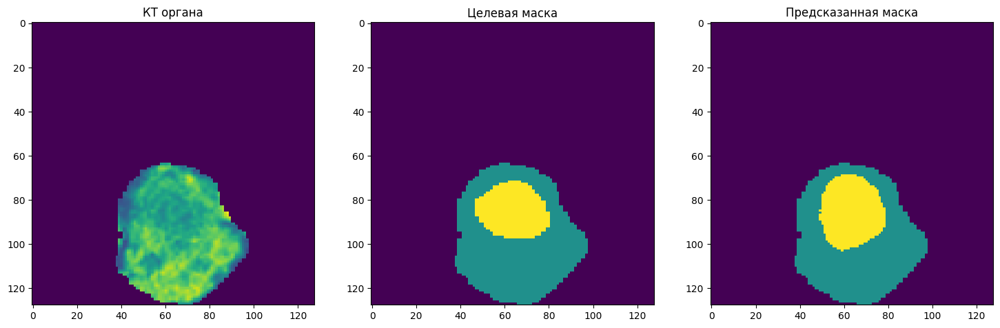

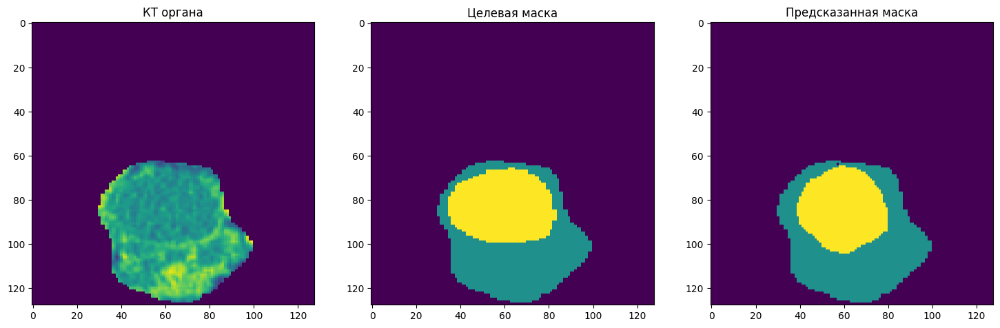

...

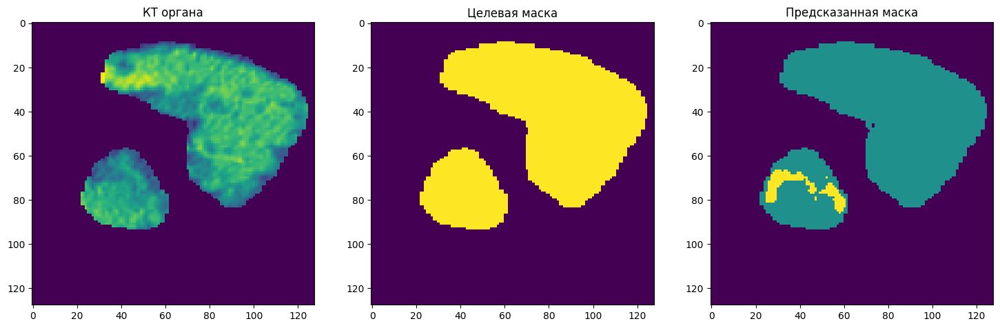

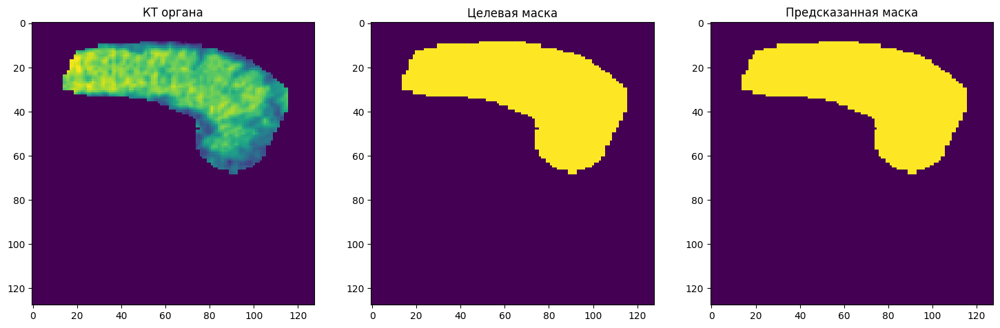

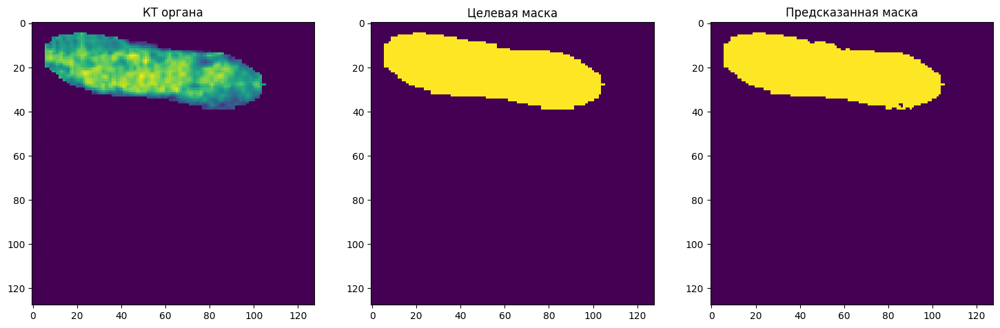

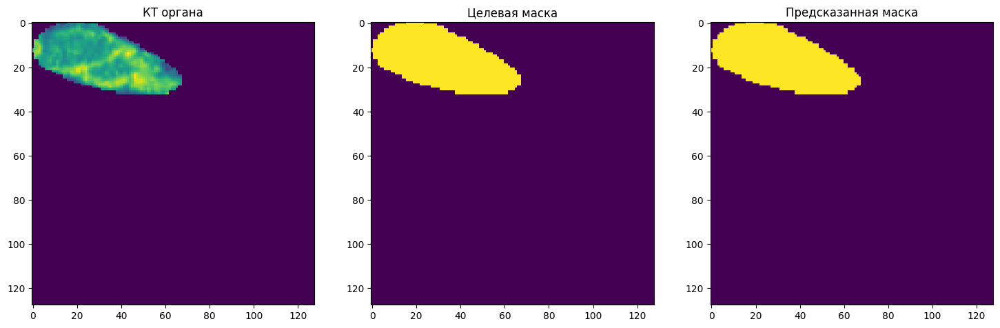

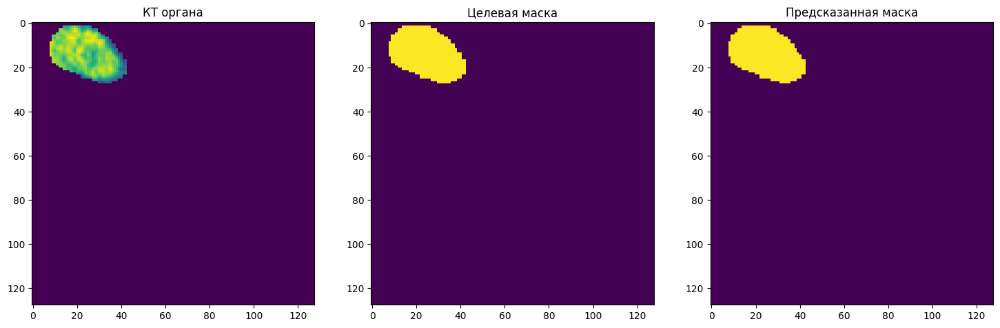


[0.9998, 0.9885, 0.0]

[0.9997, 0.9912, 0.0]

[1.0, 0.8985, 0.0]

[1.0, 0.8985, 0.0]

[0.9996, 0.9738, 0.0]

[0.9995, 0.9183, 0.0008]

[0.9989, 0.9217, 0.0]

[0.9995, 0.9856, 0.0]

[0.9997, 0.9343, 0.7415]


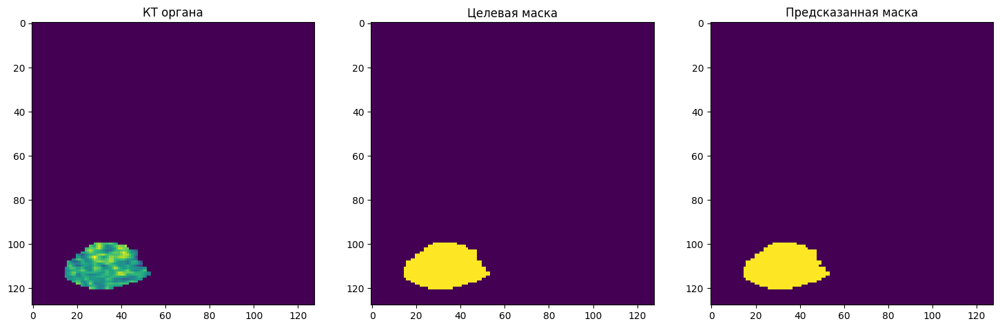

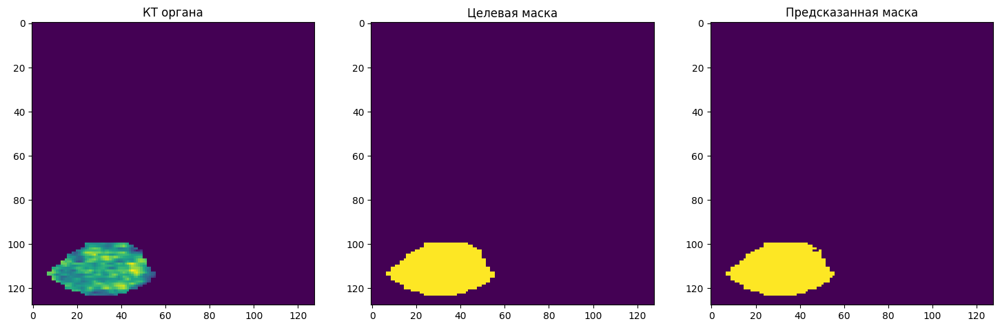

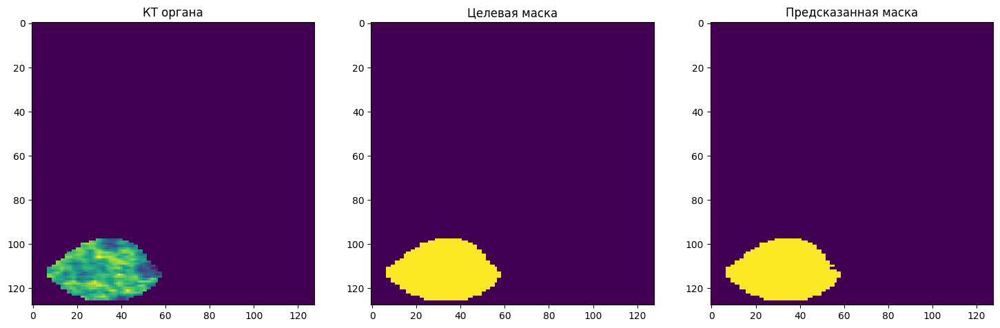

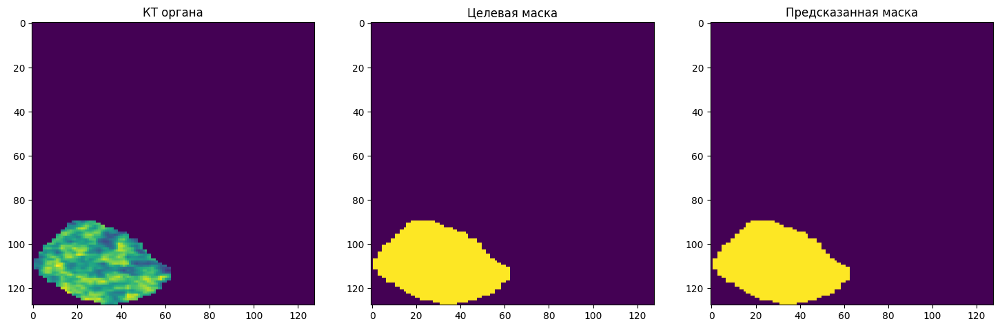

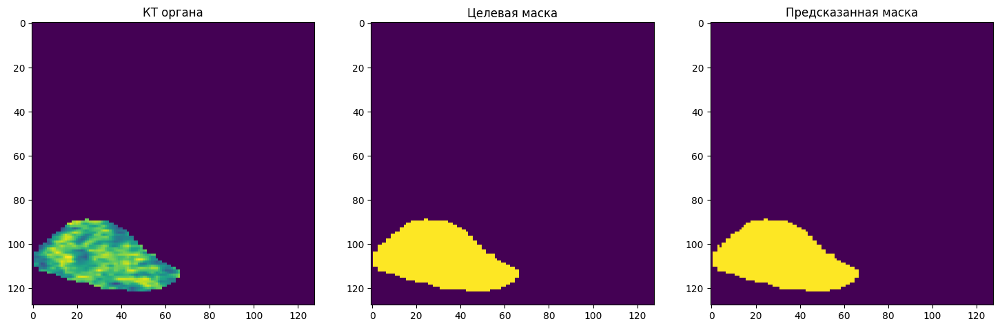

...

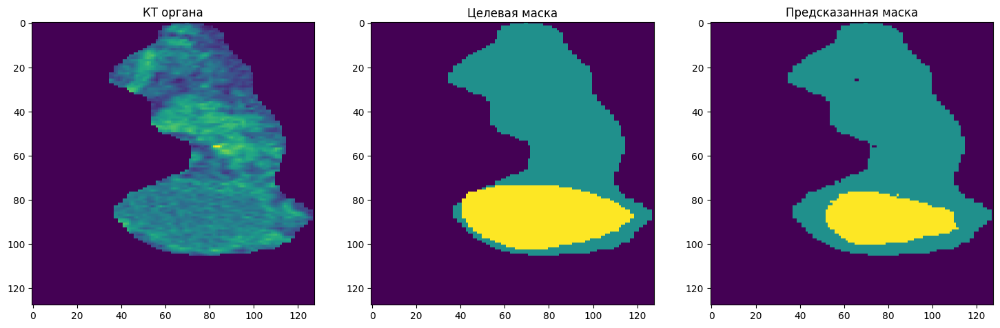

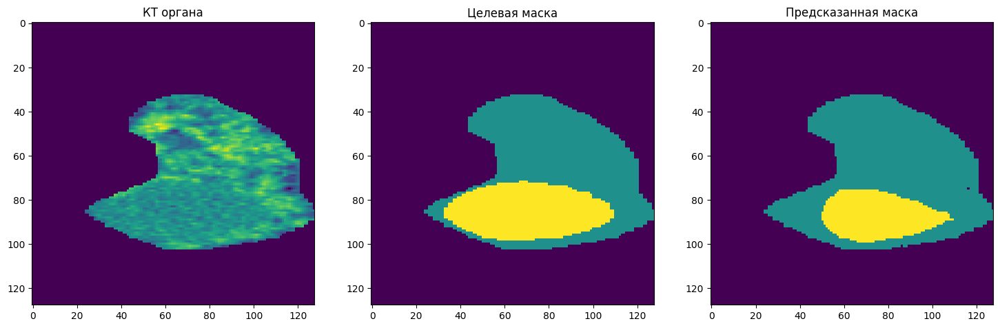

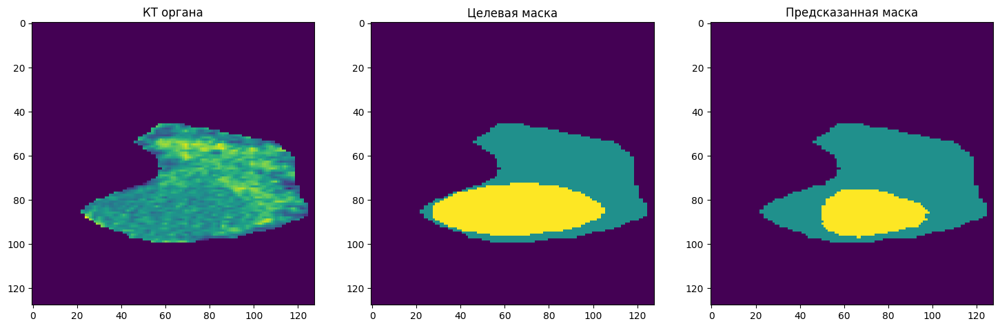

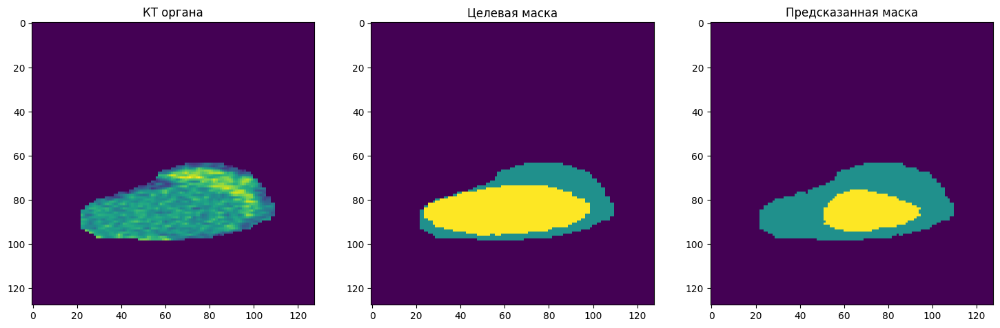

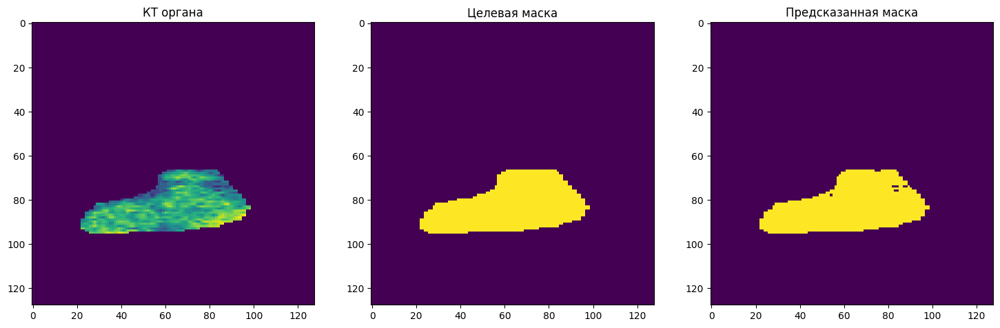


[0.9987, 0.9664, 0.0]

[0.9997, 0.9785, 0.0]

[0.9986, 0.9451, 0.0]

[1.0, 0.9555, 0.0]

[0.9997, 0.9757, 0.0]

[0.9997, 0.9516, 0.0]

[0.9994, 0.9798, 0.0]

[1.0, 0.973, 0.0]

[0.9998, 0.927, 0.0273]

[0.9995, 0.9887, 0.0]

[0.9995, 0.8165, 0.0]

[0.9995, 0.8165, 0.0]

[1.0, 0.9807, 0.0]

[0.9999, 0.9928, 0.0]

[0.999, 0.9707, 0.0]

[0.9997, 0.9607, 0.0]

[0.9998, 0.9739, 0.0]

[1.0, 0.9763, 0.0]

[0.9999, 0.9286, 0.0021]

[0.9998, 0.9557, 0.0]

[0.9997, 0.9553, 0.0]

[0.9993, 0.9668, 0.0]

[1.0, 0.9554, 0.0]

[0.9997, 0.9303, 0.0]

[0.9996, 0.9096, 0.0]

[0.9996, 0.9368, 0.5674]

[0.9998, 0.9782, 0.0]

[0.9998, 0.9782, 0.0]

[0.9998, 0.9764, 0.0]

[0.9997, 0.9456, 0.0]

[0.9998, 0.9253, 0.0]

[0.9999, 0.917, 0.0]

[0.9999, 0.917, 0.0]

[0.9997, 0.9678, 0.0]

[1.0, 0.9437, 0.0]

[0.9999, 0.9776, 0.0]

[0.9999, 0.9776, 0.0]

[0.9995, 0.9888, 0.0]

[0.9997, 0.9759, 0.0]

[0.9999, 0.9819, 0.0]

[0.9998, 0.8956, 0.0]

[1.0, 0.9705, 0.0]

[1.0, 0.9705, 0.0]

[0.9999, 0.909, 0.1308]

[0.99

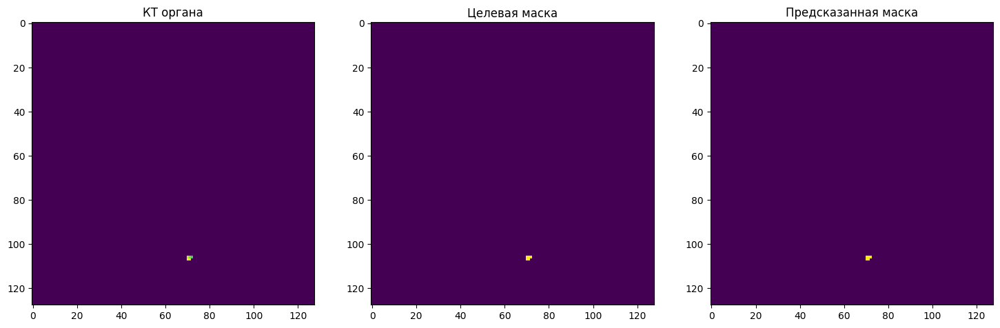

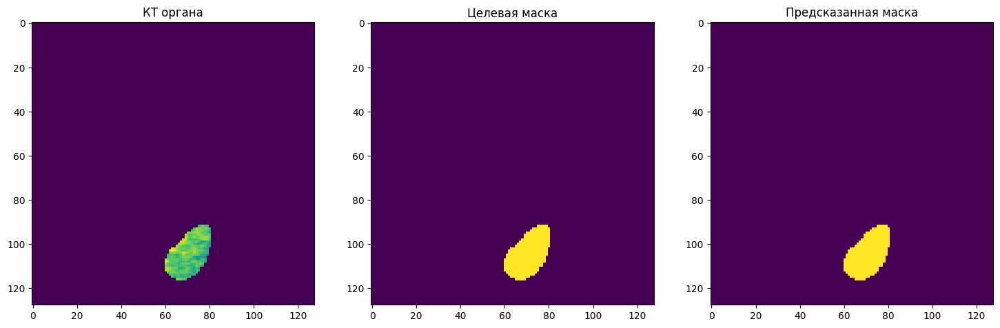

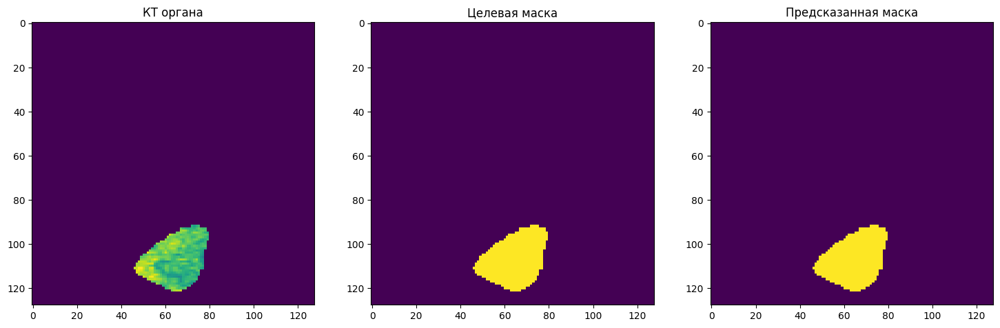

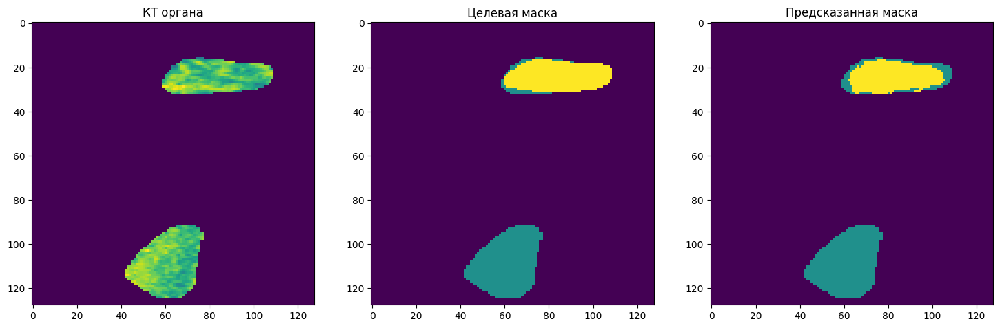

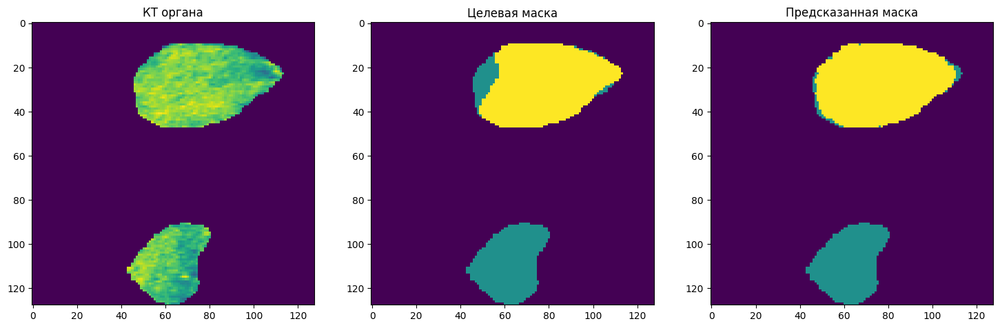

...

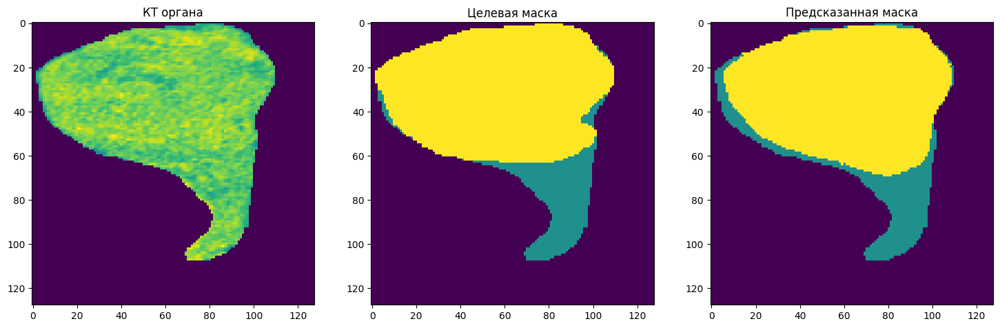

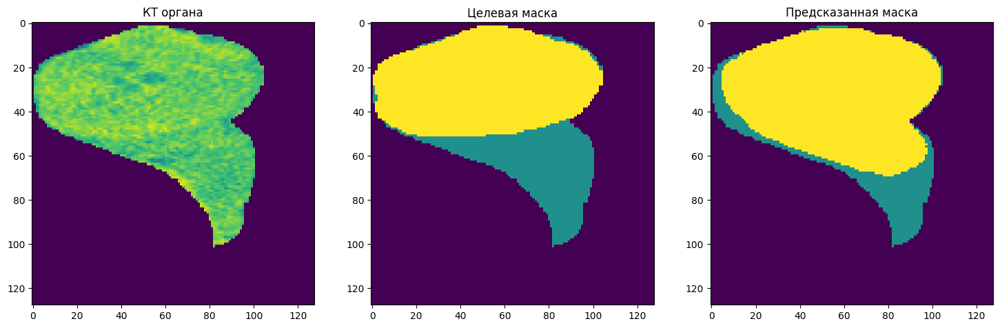

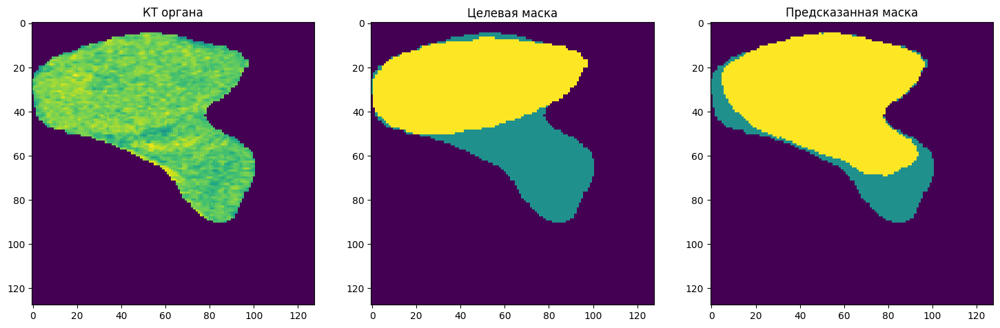

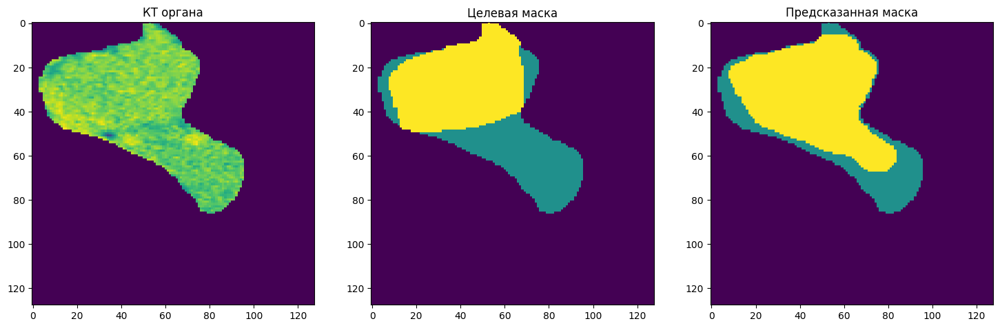

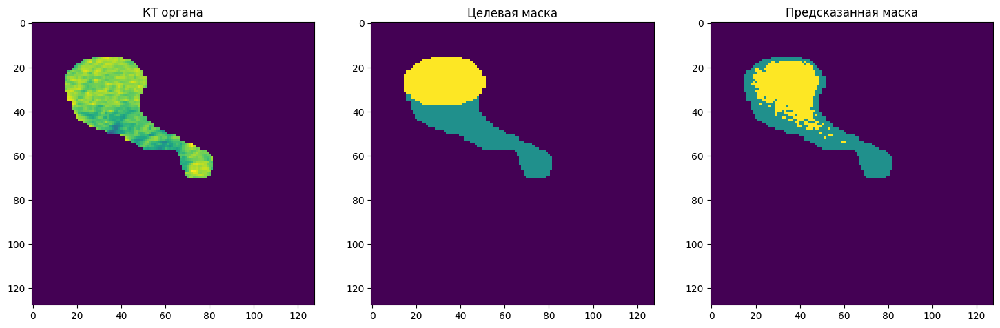


[0.9995, 0.8924, 0.0]

[0.9998, 0.9159, 0.0]

[0.9999, 0.9894, 0.0]

[1.0, 0.9811, 0.0]

[0.9992, 0.9871, 0.0]

[0.9999, 0.9213, 0.02]

[0.9999, 0.9847, 0.0]

[0.9999, 0.9847, 0.0]

[0.9996, 0.9761, 0.0]

[0.9999, 0.9319, 0.0]

[0.9998, 0.9623, 0.0]

0.9064
0.0438
0.9496
0.0529


In [69]:
def calculate_metrics(labels, predictions):
    # Flatten the arrays to compute the metrics
    labels_flat = labels.ravel()
    predictions_flat = predictions.ravel()
    
    iou_scores = []
    f1_scores = []

    # Calculate IoU and F1 for each class (0, 1, 2)
    for cls in [0, 1, 2]:
        true_mask = (labels_flat == cls)
        pred_mask = (predictions_flat == cls)
        
        # IoU score
        iou = np.round(jaccard_score(true_mask, pred_mask), 4)
        iou_scores.append(iou)
        # print(f'IoU for {cls}: {iou:.4f}')
        
        # F1 score
        f1 = np.round(f1_score(true_mask, pred_mask), 4)
        f1_scores.append(f1)
        # print(f'F1 for {cls}: {f1:.4f}')
    
    # Average the metrics over the classes
    mean_iou = np.round(np.mean(iou_scores), 4)
    mean_f1 = np.round(np.mean(f1_scores), 4)
    
    return mean_iou, mean_f1, iou_scores, f1_scores

# Пример использования:
all_IoU1 = []
all_IoU2 = []
all_F11 = []
all_F12 = []
for batch in testloader:
    ct_images = batch['ct'].to(device)
    labels = batch['label'].to(device)
    with torch.no_grad():
        outputs = model(ct_images)
        
        # Выделение четырех отдельных массивов
        output_1 = outputs[0].squeeze().cpu().numpy()
        output_1 = np.argmax(output_1, axis=0)
        ct_images_1 = ct_images[0].squeeze().cpu().numpy().squeeze()
        labels_1 = labels[0].squeeze().cpu().numpy()

        mean_iou, mean_f1, iou_scores, f1_scores = calculate_metrics(labels_1, output_1)
        all_IoU1.append(iou_scores[1])
        all_IoU2.append(iou_scores[2])
        all_F11.append(f1_scores[1])
        all_F12.append(f1_scores[2])
        # print(iou_scores)
        print(f1_scores)
        # print(mean_iou)
        # print(mean_f1)

        # structure = generate_binary_structure(3, 1)  # Определяем структуру для определения связных компонент
        # labeled_array, num_features = label(output_1, structure)
        # component_sizes = nd_sum(output_1, labeled_array, range(1, num_features + 1))
        # largest_component_index = np.argmax(component_sizes) + 1
        # largest_component = np.zeros_like(output_1)
        # largest_component[labeled_array == largest_component_index] = 1


        # print(output_1.shape)
        # print(ct_images_1.shape)
        # print(labels_1.shape)
        # print(largest_component.shape)
        # test = output_1
        # unique_values = np.unique(test)
        # print(unique_values)
        if f1_scores[2] >= 0.6:
            for i in range(output_1.shape[0]):
                ar = ct_images_1[i,:,:]
                ar_lbl = labels_1[i,:,:]
                # ar_pro = largest_component[i,:,:]
                ar_out = output_1[i,:,:]

                fig = plt.figure(figsize=(18,15))


                plt.subplot(1,3,1)
                plt.imshow(ar)
                plt.title('КТ органа')

                plt.subplot(1,3,2)
                plt.imshow(ar_lbl)
                plt.title('Целевая маска')

                # plt.subplot(1,4,3)
                # plt.imshow(ar_pro)

                plt.subplot(1,3,3)
                plt.imshow(ar_out)
                plt.title('Предсказанная маска')

                plt.show()
        print()

print(np.round(np.mean(all_IoU1), 4))
print(np.round(np.mean(all_IoU2), 4))
print(np.round(np.mean(all_F11), 4))
print(np.round(np.mean(all_F12), 4))
# print(f'Minimum value in test slices: {np.min(test)}')
# print(f'Maximum value in test slices: {np.max(test)}')

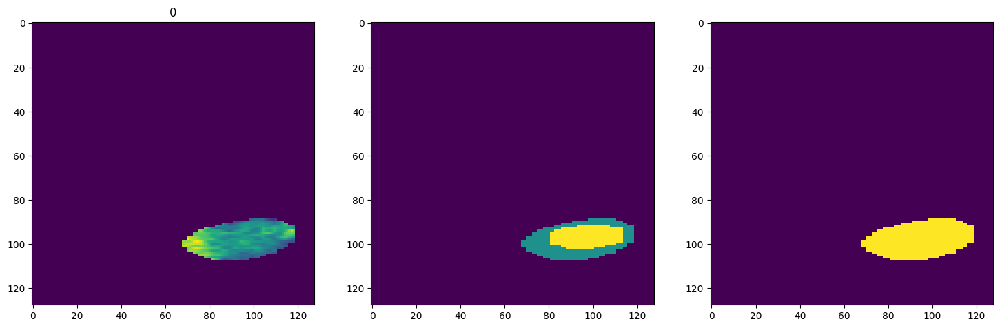

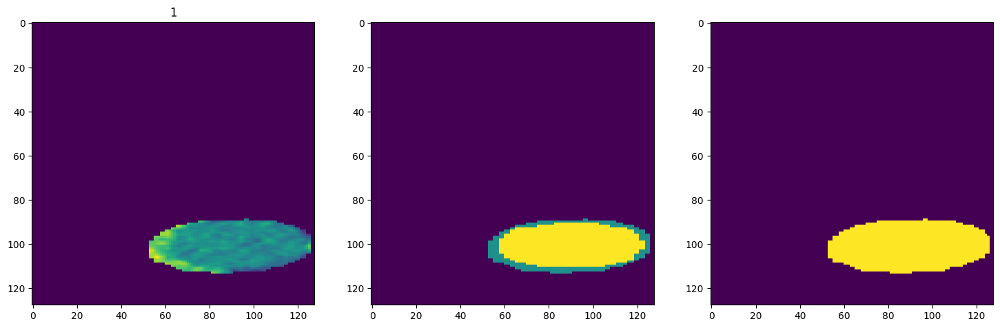

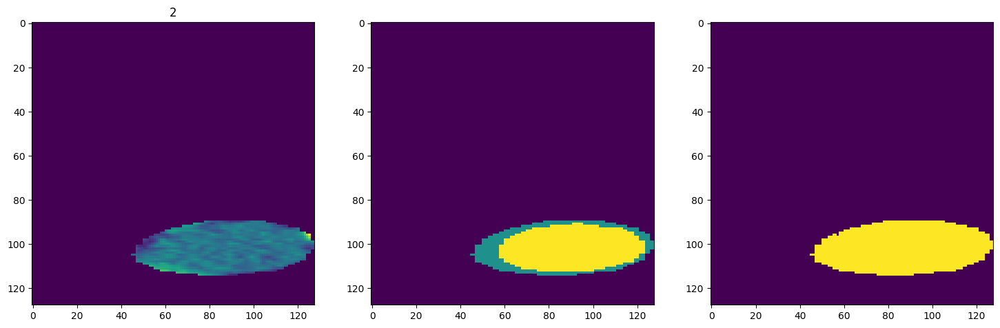

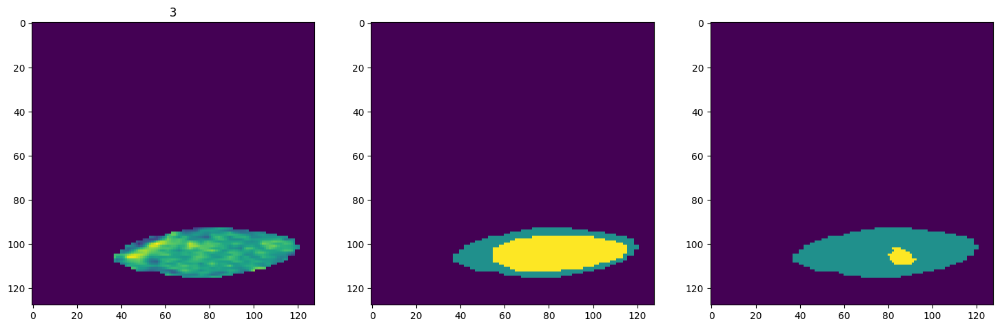

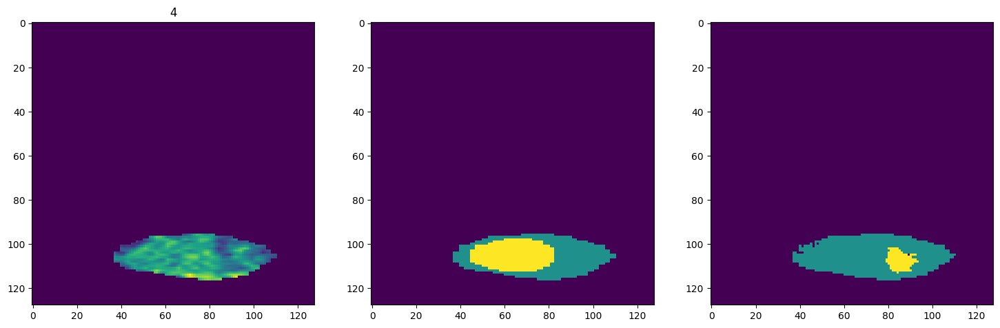

...

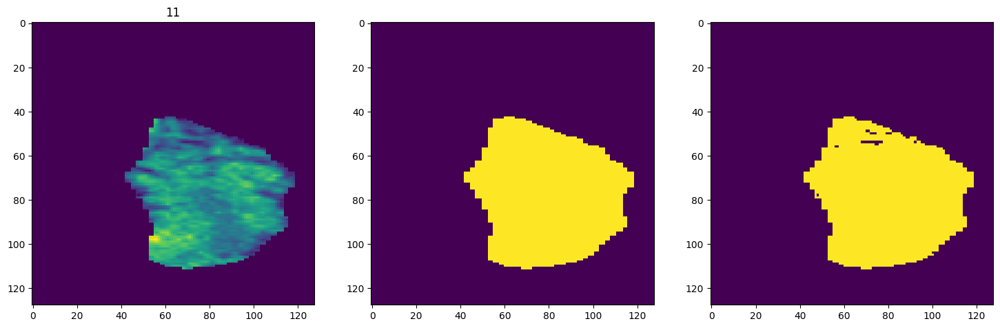

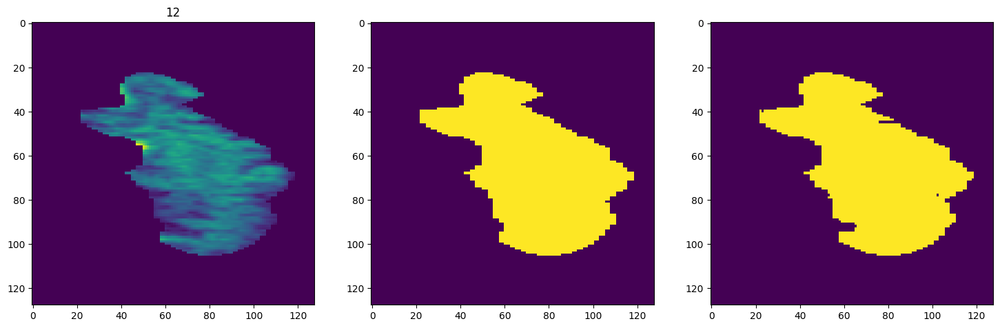

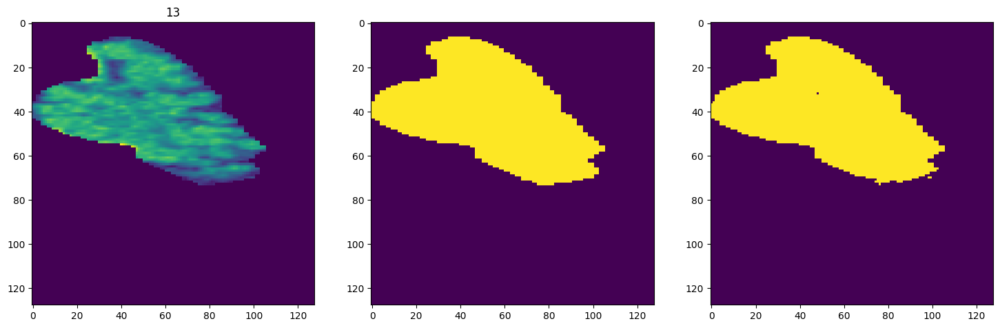

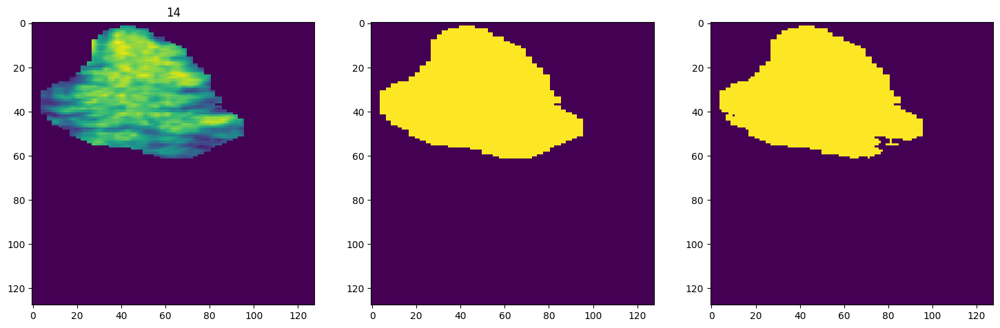

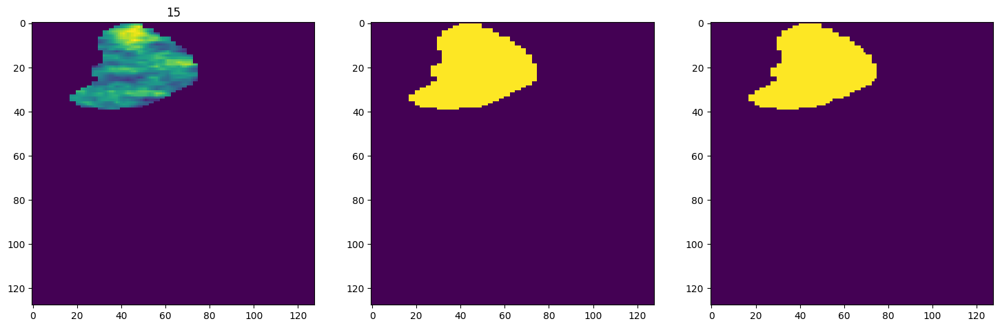

In [24]:
for i in range(output_1.shape[0]):
    ar = ct_images_1[i,:,:]
    ar_lbl = labels_1[i,:,:]
    # ar_pro = largest_component[i,:,:]
    ar_out = output_1[i,:,:]

    fig = plt.figure(figsize=(18,15))


    plt.subplot(1,3,1)
    plt.imshow(ar)
    plt.title(i)

    plt.subplot(1,3,2)
    plt.imshow(ar_lbl)

    # plt.subplot(1,4,3)
    # plt.imshow(ar_pro)

    plt.subplot(1,3,3)
    plt.imshow(ar_out)

    plt.show()

In [ ]:
for i in range(ct_images_1.shape[0]):
    ar = ct_images_1[i,:,:]
    ar_lbl = labels_1[i,:,:]
    ar_pro = largest_component[i,:,:]
    ar_out = output_1[i,:,:]

    fig = plt.figure(figsize=(18,15))


    plt.subplot(1,4,1)
    plt.imshow(ar)
    plt.title(i)

    plt.subplot(1,4,2)
    plt.imshow(ar_lbl)

    plt.subplot(1,4,3)
    plt.imshow(ar_pro)

    plt.subplot(1,4,4)
    plt.imshow(ar_out)

    plt.show()